In [1]:
import pandas as pd
import numpy as np
import models_and_functions as MyModels
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from torchdiffeq import odeint
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
    
df_antibiotics, antibiotic_types, df_relative_abundances= MyModels.wrangle_data()
df_relative_abundances = df_relative_abundances.drop_duplicates(subset = ['PatientID', 'DayRelativeToNearestHCT'])
node_model = torch.load('node_model.pth', weights_only=False)
test_df = pd.read_csv('node_model_test_df.csv', index_col = 0)


enterococcus_infections = ['Enterococcus_Faecium',
                           'Enterococcus_Faecium_Vancomycin_Resistant',
                           'Enterococcus_Vancomycin_Resistant',
                           'Enterococcus_Faecalis']

gammmaproteobacteria_infections = ['Escherichia',
                                  'Pseudomonas',
                                  'Klebsiella',
                                  'Klebsiella_Pneumoniae',
                                  'Enterobacter',
                                  'Stenotrophomonas_Maltophilia',
                                  'Citrobacter']

CUDA is available. Using GPU.
GPU Device name: NVIDIA A100 80GB PCIe
GPU Memory Allocated: 0.0 GB
GPU Memory Cached: 0.0 GB


/data1/xavierj/isaac/Neural_ODEs_Paper_Code/Clinical_Data_Experiments/models_and_functions.py:31: FutureWarning: `torch.cuda.memory_cached` has been renamed to `torch.cuda.memory_reserved`
  print(f"GPU Memory Cached: {round(torch.cuda.memory_cached(0)/1024**3,1)} GB")


In [2]:
df_infections = pd.read_csv('tblInfectionsCidPapers.csv')
df_bacilli_infections = df_infections[df_infections['InfectiousAgent'].isin(enterococcus_infections)]
df_gammaproteobacteria_infections = df_infections[df_infections['InfectiousAgent'].isin(gammmaproteobacteria_infections)]


In [3]:
def make_infection_predictions(model, test_df, index_of_taxa = 2, range_of_node_prediction = 7, 
                               range_of_infection_prediction = 7, number_of_taxa = 'reduced', method = 'euler', 
                               aggregate_statistic = 'mean', convert_to_relative_abundances = False, name = 'NODE'):
    abundance_predictions = []
    print('computing infection predictions...')
    if index_of_taxa == 2:
        infections_df = df_bacilli_infections
        name_of_class = 'Bacilli'
    if index_of_taxa == 9:
        infections_df = df_gammaproteobacteria_infections
        name_of_class = 'Gammaproteobacteria'
    for patient_id in test_df['PatientID'].unique():
        model.patient_id = patient_id
        # get the trajectory data for patient_id's timeline
        t_preds, t_true, y_trues, true_indices = MyModels.get_data(test_df, patient_id, number_of_taxa = number_of_taxa)
        for i in range(len(t_true)-1):
            # start of predicted trajectory
            t_start = t_true[i]
            y0 = y_trues[i]
            t_end = t_start + range_of_node_prediction
            t_preds = torch.linspace(t_start, t_end, int((t_end-t_start)*3)).to(device)
            y_pred_trajectory = odeint(model, y0, t_preds, method=method)
            
            # if the model is glv
            if convert_to_relative_abundances:
                y0 = torch.nn.functional.normalize(torch.clamp(y0, min=0), p=1, dim=0)
                y_pred_trajectory = torch.nn.functional.normalize(torch.clamp(y_pred_trajectory, min=0), p=1, dim=1)

            taxa_pred_trajectory = y_pred_trajectory[:, index_of_taxa]
            actual_infection_times = list(infections_df[infections_df['PatientID']==patient_id]['DayRelativeToNearestHCT'])
            t_start = t_start.cpu().numpy()
            actual_infection = int(any((t_start <= t < t_start + range_of_infection_prediction) for t in actual_infection_times))
            initial_bacilli_abundance_level = np.float64(y0[index_of_taxa].cpu().detach().item())
            if aggregate_statistic == 'max':
                taxa_pred_summary_abundance_level = np.float64(torch.max(taxa_pred_trajectory).item())
            if aggregate_statistic == 'mean':
                taxa_pred_summary_abundance_level = np.float64(torch.mean(taxa_pred_trajectory).item())
            abundance_predictions.append([taxa_pred_summary_abundance_level, actual_infection, initial_bacilli_abundance_level])
#             print(patient_id, taxa_pred_summary_abundance_level, actual_infection, initial_bacilli_abundance_level)
            
            
    abundance_predictions = np.array(abundance_predictions)
    # remove rows with NAN
    abundance_predictions = abundance_predictions[~np.isnan(abundance_predictions).any(axis=1)]

    # Plot ROC curve
    print('plotting ROC curve...')
    y_scores = abundance_predictions[:, 0]  # Predicted probabilities
    y_true = abundance_predictions[:, 1]    # Actual binary labels
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)  # Compute the area under the curve (AUC)
    plt.figure(figsize=(8, 6), num=None)
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guess line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    taxa_name = test_df.columns[index_of_taxa]
    plt.title(f'ROC Curve for prediction of {name_of_class} infections {range_of_infection_prediction} days in advance based on {name} predictions ')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()
    model_auc = roc_auc

    
    # lets make an ROC curve for just using inital abundances, not the NODE predictions:
    y_scores = abundance_predictions[:, 2]  # Predicted probabilities
    y_true = abundance_predictions[:, 1]    # Actual binary labels
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)  # Compute the area under the curve (AUC)
    plt.figure(figsize=(8, 6), num=None)
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guess line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    taxa_name = test_df.columns[index_of_taxa]
    plt.title(f'ROC Curve for prediction of {name_of_class} infections {range_of_infection_prediction} days in advance based on initial abundance measurement')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()
    initial_abundance_auc = roc_auc
    
    return model_auc, initial_abundance_auc



# make_infection_predictions(node_model, test_df, index_of_taxa=2, range_of_node_prediction = 14, range_of_infection_prediction = 14)



In [4]:
glv_model = torch.load('glv_model.pth', weights_only = False)
glv_test_df = pd.read_csv('glv_model_test_df.csv', index_col = False)
glv_test_df_relative_abundances = test_df[test_df['SampleID'].isin(glv_test_df['SampleID'].unique())]
# make_infection_predictions(glv_model, glv_test_df, index_of_taxa=2, range_of_node_prediction = 14, range_of_infection_prediction = 14,convert_to_relative_abundances=True, name="GLV")



computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


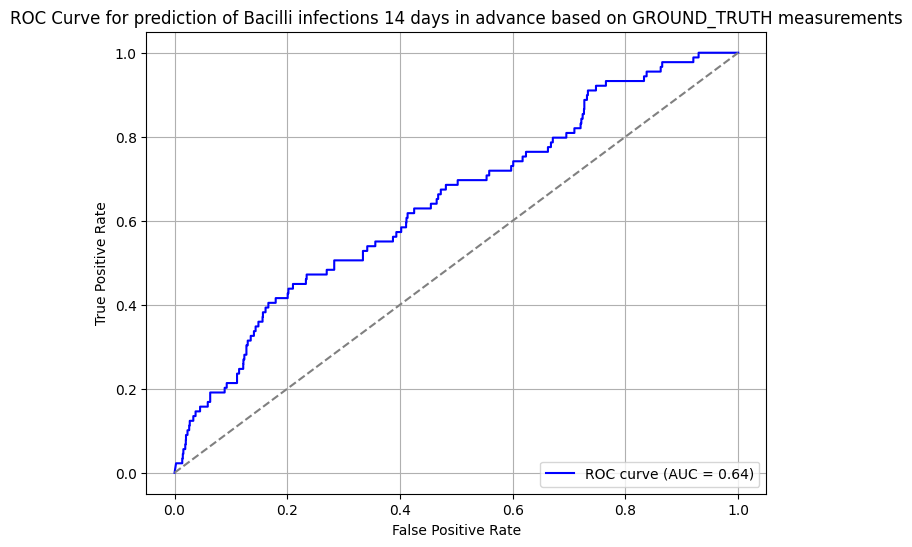

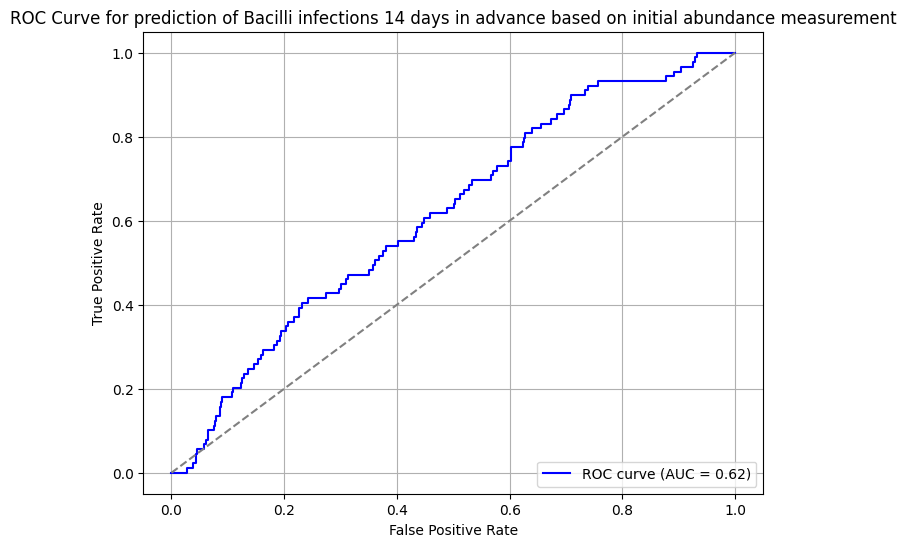

(0.6444665539580186, 0.6161821690928948)

In [20]:
def make_infection_predictions_ground_truth(model, test_df, index_of_taxa = 2, range_of_node_prediction = 7, 
                               range_of_infection_prediction = 7, number_of_taxa = 'reduced', method = 'euler', 
                               aggregate_statistic = 'mean', convert_to_relative_abundances = False, name = 'GROUND_TRUTH'):
    abundance_predictions = []
    print('computing infection predictions using ground truth measurements...')
    if index_of_taxa == 2:
        infections_df = df_bacilli_infections
        name_of_class = 'Bacilli'
    if index_of_taxa == 9:
        infections_df = df_gammaproteobacteria_infections
        name_of_class = 'Gammaproteobacteria'
    
    for patient_id in test_df['PatientID'].unique():
        # get the trajectory data for patient_id's timeline
        t_preds, t_true, y_trues, true_indices = MyModels.get_data(test_df, patient_id, number_of_taxa = number_of_taxa)
        
        # Get patient's data from test_df
        patient_data = test_df[test_df['PatientID'] == patient_id].copy()
        
        for i in range(len(t_true)-1):
            # start of prediction window
            t_start = t_true[i]
            y0 = y_trues[i]
            t_end = t_start + range_of_node_prediction
            
            # Instead of using NODE predictions, get actual measurements from test_df
            # Find measurements within the prediction window
            t_start_np = t_start.cpu().numpy()
            t_end_np = t_end.cpu().numpy() if hasattr(t_end, 'cpu') else t_end
            
            # Get measurements in the prediction window
            window_mask = (patient_data['DayRelativeToNearestHCT'] > t_start_np) & \
                         (patient_data['DayRelativeToNearestHCT'] <= t_end_np)
            window_data = patient_data[window_mask]
            
            if len(window_data) == 0:
                # Skip this prediction if no ground truth data available in window
                continue
                
            # Get the taxa values from the ground truth data
            taxa_column = test_df.columns[index_of_taxa]
            taxa_measurements = window_data[taxa_column].values
            
            # Convert to relative abundances if requested
            if convert_to_relative_abundances:
                # Assuming test_df contains absolute abundances that need normalization
                # Get all taxa columns for normalization (you may need to adjust this)
                taxa_cols = [col for col in test_df.columns if col not in ['PatientID', 'DayRelativeToNearestHCT']]
                window_taxa_data = window_data[taxa_cols].values
                # Normalize each row to relative abundances
                row_sums = np.sum(window_taxa_data, axis=1)
                normalized_data = window_taxa_data / row_sums[:, np.newaxis]
                taxa_measurements = normalized_data[:, index_of_taxa]
            
            # Remove any NaN values
            taxa_measurements = taxa_measurements[~np.isnan(taxa_measurements)]
            
            if len(taxa_measurements) == 0:
                continue
                
            # Calculate aggregate statistic
            if aggregate_statistic == 'max':
                taxa_pred_summary_abundance_level = np.max(taxa_measurements)
            elif aggregate_statistic == 'mean':
                taxa_pred_summary_abundance_level = np.mean(taxa_measurements)
            
            # Check for actual infections
            actual_infection_times = list(infections_df[infections_df['PatientID']==patient_id]['DayRelativeToNearestHCT'])
            actual_infection = int(any((t_start_np <= t < t_start_np + range_of_infection_prediction) for t in actual_infection_times))
            
            # Initial abundance level
            initial_bacilli_abundance_level = np.float64(y0[index_of_taxa].cpu().detach().item())
            
            abundance_predictions.append([taxa_pred_summary_abundance_level, actual_infection, initial_bacilli_abundance_level])
            
    abundance_predictions = np.array(abundance_predictions)
    # remove rows with NAN
    abundance_predictions = abundance_predictions[~np.isnan(abundance_predictions).any(axis=1)]

    # Plot ROC curve for ground truth measurements
    print('plotting ROC curve for ground truth measurements...')
    y_scores = abundance_predictions[:, 0]  # Ground truth measurements
    y_true = abundance_predictions[:, 1]    # Actual binary labels
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)  # Compute the area under the curve (AUC)
    plt.figure(figsize=(8, 6), num=None)
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guess line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    taxa_name = test_df.columns[index_of_taxa]
    plt.title(f'ROC Curve for prediction of {name_of_class} infections {range_of_infection_prediction} days in advance based on {name} measurements')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()
    ground_truth_auc = roc_auc

    # ROC curve for initial abundances (unchanged)
    y_scores = abundance_predictions[:, 2]  # Initial abundances
    y_true = abundance_predictions[:, 1]    # Actual binary labels
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)  # Compute the area under the curve (AUC)
    plt.figure(figsize=(8, 6), num=None)
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guess line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    taxa_name = test_df.columns[index_of_taxa]
    plt.title(f'ROC Curve for prediction of {name_of_class} infections {range_of_infection_prediction} days in advance based on initial abundance measurement')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()
    initial_abundance_auc = roc_auc
    
    return ground_truth_auc, initial_abundance_auc

make_infection_predictions_ground_truth(node_model, test_df, index_of_taxa=2, range_of_node_prediction = 14, range_of_infection_prediction = 14)


computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


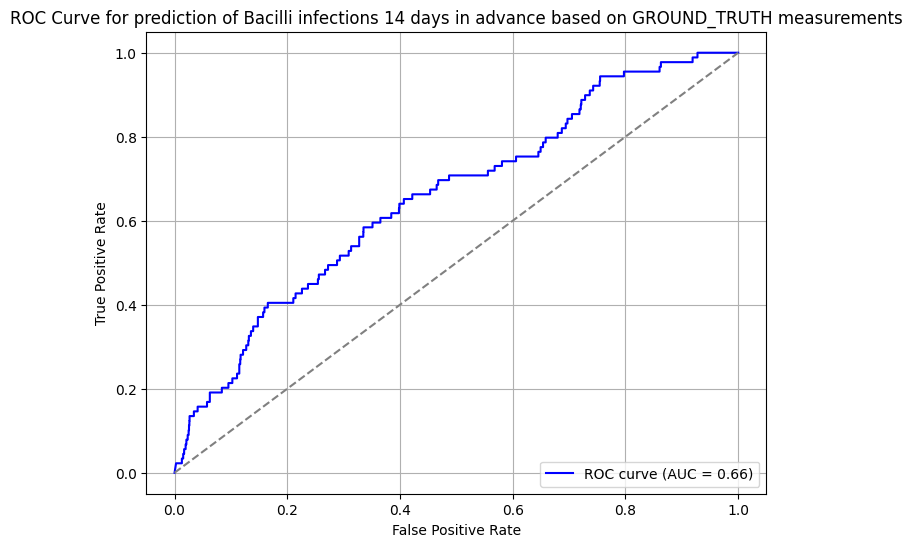

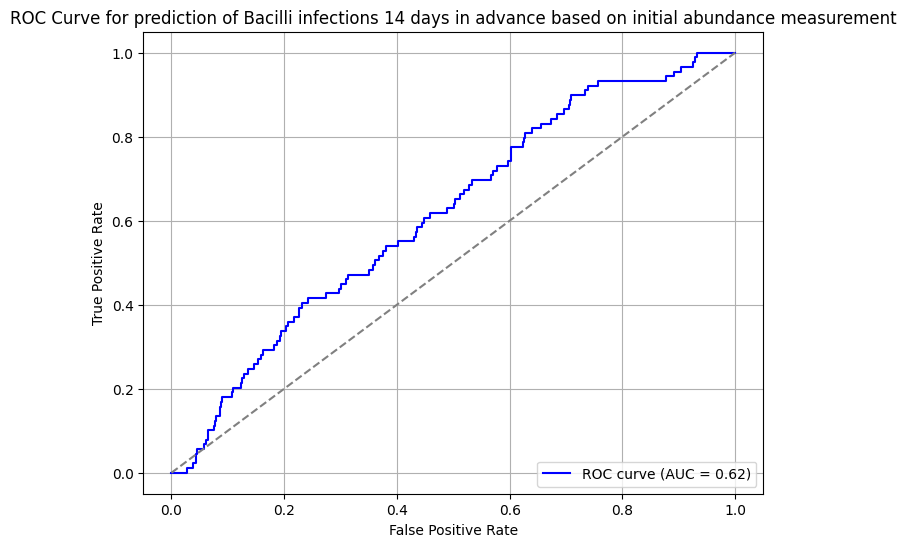

(0.6563383653256332, 0.6161821690928948)

In [22]:
def make_infection_predictions_ground_truth_weighted_average(model, test_df, index_of_taxa = 2, range_of_node_prediction = 7, 
                               range_of_infection_prediction = 7, number_of_taxa = 'reduced', method = 'euler', 
                               aggregate_statistic = 'mean', convert_to_relative_abundances = False, name = 'GROUND_TRUTH'):
    abundance_predictions = []
    print('computing infection predictions using ground truth measurements...')
    if index_of_taxa == 2:
        infections_df = df_bacilli_infections
        name_of_class = 'Bacilli'
    if index_of_taxa == 9:
        infections_df = df_gammaproteobacteria_infections
        name_of_class = 'Gammaproteobacteria'
    
    for patient_id in test_df['PatientID'].unique():
        # get the trajectory data for patient_id's timeline
        t_preds, t_true, y_trues, true_indices = MyModels.get_data(test_df, patient_id, number_of_taxa = number_of_taxa)
        
        # Get patient's data from test_df
        patient_data = test_df[test_df['PatientID'] == patient_id].copy()
        
        for i in range(len(t_true)-1):
            # start of prediction window
            t_start = t_true[i]
            y0 = y_trues[i]
            t_end = t_start + range_of_node_prediction
            
            # Instead of using NODE predictions, get actual measurements from test_df
            # Find measurements within the prediction window
            t_start_np = t_start.cpu().numpy()
            t_end_np = t_end.cpu().numpy() if hasattr(t_end, 'cpu') else t_end
            
            # Get measurements in the prediction window
            window_mask = (patient_data['DayRelativeToNearestHCT'] > t_start_np) & \
                         (patient_data['DayRelativeToNearestHCT'] <= t_end_np)
            window_data = patient_data[window_mask].sort_values('DayRelativeToNearestHCT')
            
            if len(window_data) == 0:
                # Skip this prediction if no ground truth data available in window
                continue
                
            # Get the taxa values from the ground truth data
            taxa_column = test_df.columns[index_of_taxa]
            taxa_measurements = window_data[taxa_column].values
            measurement_times = window_data['DayRelativeToNearestHCT'].values
            
            # Convert to relative abundances if requested
            if convert_to_relative_abundances:
                # Assuming test_df contains absolute abundances that need normalization
                # Get all taxa columns for normalization (you may need to adjust this)
                taxa_cols = [col for col in test_df.columns if col not in ['PatientID', 'DayRelativeToNearestHCT']]
                window_taxa_data = window_data[taxa_cols].values
                # Normalize each row to relative abundances
                row_sums = np.sum(window_taxa_data, axis=1)
                normalized_data = window_taxa_data / row_sums[:, np.newaxis]
                taxa_measurements = normalized_data[:, index_of_taxa]
            
            # Remove any NaN values (and corresponding times)
            valid_mask = ~np.isnan(taxa_measurements)
            taxa_measurements = taxa_measurements[valid_mask]
            measurement_times = measurement_times[valid_mask]
            
            if len(taxa_measurements) == 0:
                continue
            
            # Calculate aggregate statistic
            if aggregate_statistic == 'max':
                taxa_pred_summary_abundance_level = np.max(taxa_measurements)
            elif aggregate_statistic == 'mean':
                # Calculate time-weighted mean
                if len(taxa_measurements) == 1:
                    taxa_pred_summary_abundance_level = taxa_measurements[0]
                else:
                    # Calculate weights based on time intervals
                    # Each measurement represents the time interval around it
                    weights = np.zeros(len(taxa_measurements))
                    
                    # For the first measurement: weight is half the gap to next measurement
                    # plus the gap from window start to first measurement
                    weights[0] = (measurement_times[0] - t_start_np) + \
                                 (measurement_times[1] - measurement_times[0]) / 2
                    
                    # For middle measurements: weight is half the gap to previous 
                    # plus half the gap to next
                    for j in range(1, len(taxa_measurements) - 1):
                        weights[j] = (measurement_times[j] - measurement_times[j-1]) / 2 + \
                                    (measurement_times[j+1] - measurement_times[j]) / 2
                    
                    # For the last measurement: weight is half the gap from previous
                    # plus the gap to window end
                    weights[-1] = (measurement_times[-1] - measurement_times[-2]) / 2 + \
                                  (t_end_np - measurement_times[-1])
                    
                    # Calculate weighted mean
                    taxa_pred_summary_abundance_level = np.average(taxa_measurements, weights=weights)
            
            # Check for actual infections
            actual_infection_times = list(infections_df[infections_df['PatientID']==patient_id]['DayRelativeToNearestHCT'])
            actual_infection = int(any((t_start_np <= t < t_start_np + range_of_infection_prediction) for t in actual_infection_times))
            
            # Initial abundance level
            initial_bacilli_abundance_level = np.float64(y0[index_of_taxa].cpu().detach().item())
            
            abundance_predictions.append([taxa_pred_summary_abundance_level, actual_infection, initial_bacilli_abundance_level])
            
    abundance_predictions = np.array(abundance_predictions)
    # remove rows with NAN
    abundance_predictions = abundance_predictions[~np.isnan(abundance_predictions).any(axis=1)]

    # Plot ROC curve for ground truth measurements
    print('plotting ROC curve for ground truth measurements...')
    y_scores = abundance_predictions[:, 0]  # Ground truth measurements
    y_true = abundance_predictions[:, 1]    # Actual binary labels
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)  # Compute the area under the curve (AUC)
    plt.figure(figsize=(8, 6), num=None)
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guess line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    taxa_name = test_df.columns[index_of_taxa]
    plt.title(f'ROC Curve for prediction of {name_of_class} infections {range_of_infection_prediction} days in advance based on {name} measurements')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()
    ground_truth_auc = roc_auc

    # ROC curve for initial abundances (unchanged)
    y_scores = abundance_predictions[:, 2]  # Initial abundances
    y_true = abundance_predictions[:, 1]    # Actual binary labels
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)  # Compute the area under the curve (AUC)
    plt.figure(figsize=(8, 6), num=None)
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guess line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    taxa_name = test_df.columns[index_of_taxa]
    plt.title(f'ROC Curve for prediction of {name_of_class} infections {range_of_infection_prediction} days in advance based on initial abundance measurement')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()
    initial_abundance_auc = roc_auc
    
    return ground_truth_auc, initial_abundance_auc

make_infection_predictions_ground_truth_weighted_average(node_model, test_df, index_of_taxa=2, range_of_node_prediction = 14, range_of_infection_prediction = 14)

computing infection predictions...
plotting ROC curve...


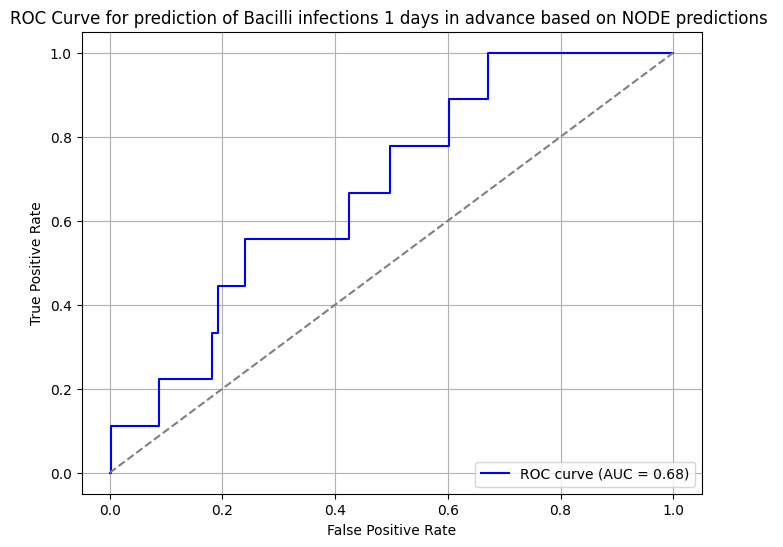

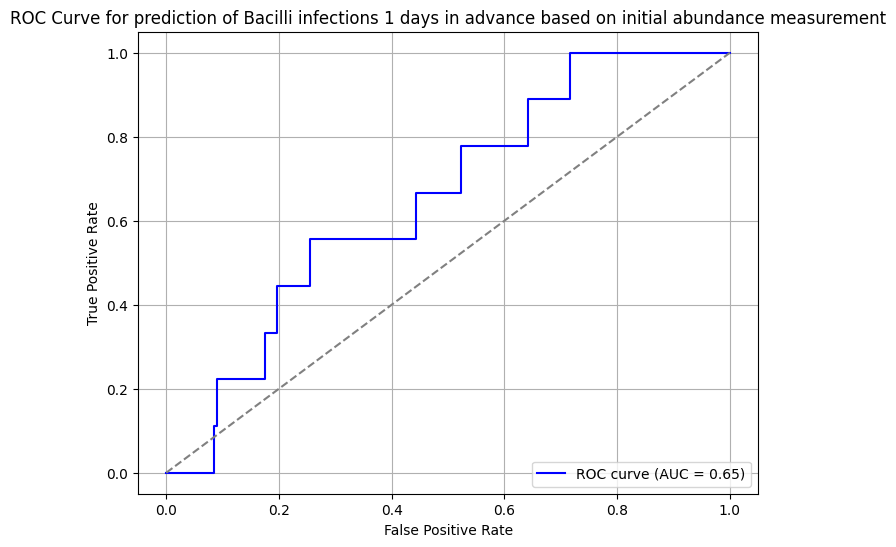

computing infection predictions...
plotting ROC curve...


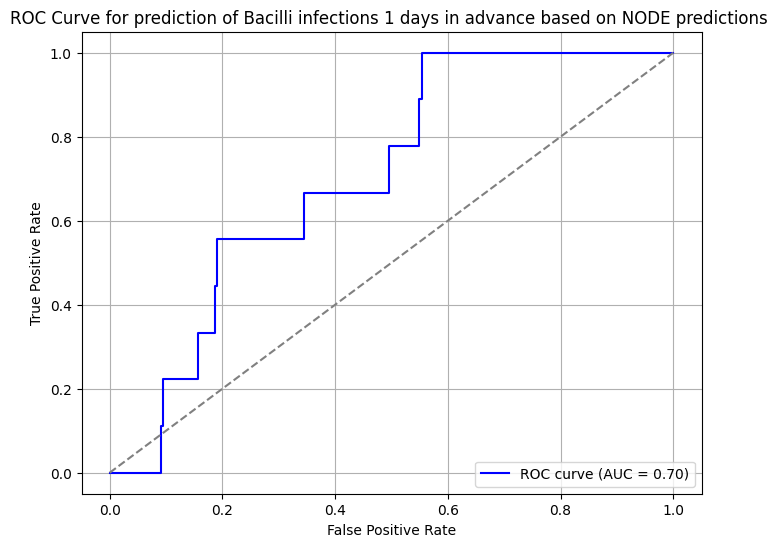

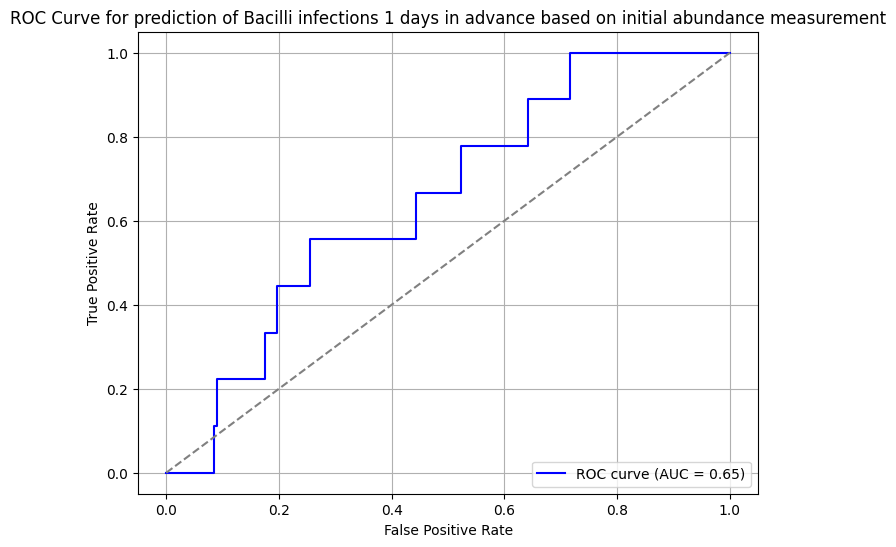

computing infection predictions...
plotting ROC curve...


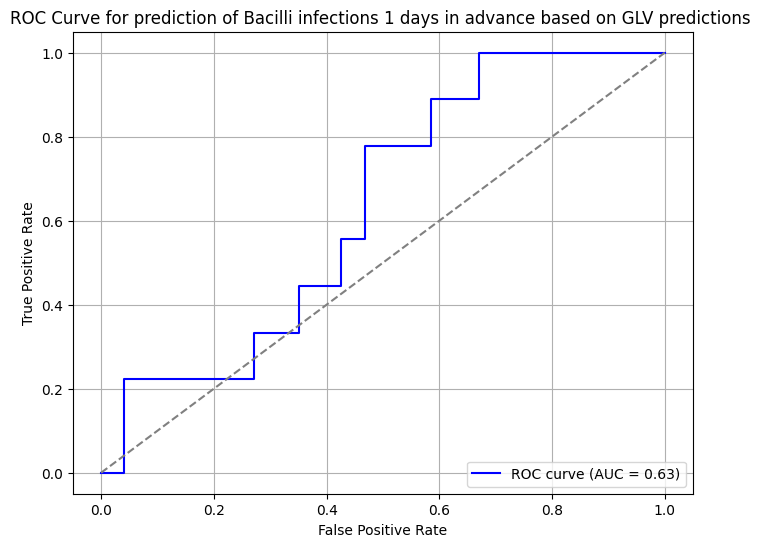

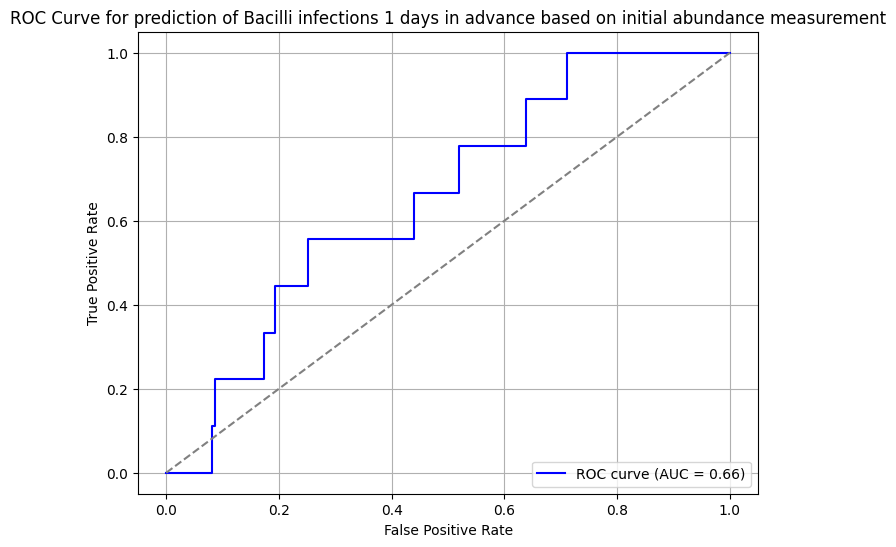

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


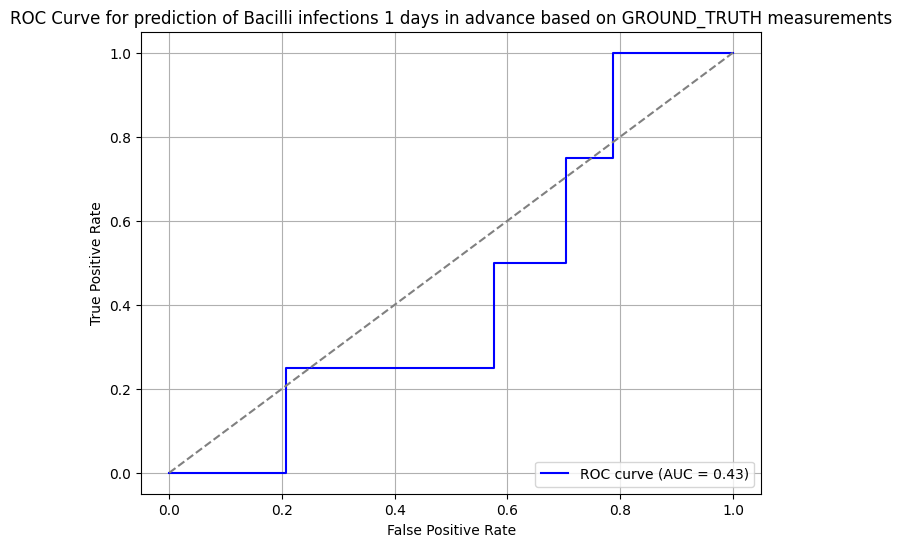

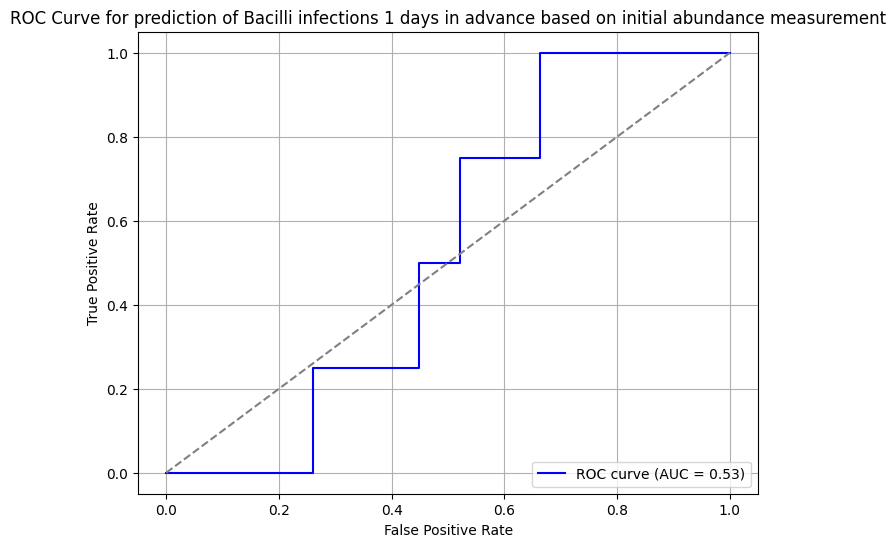

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


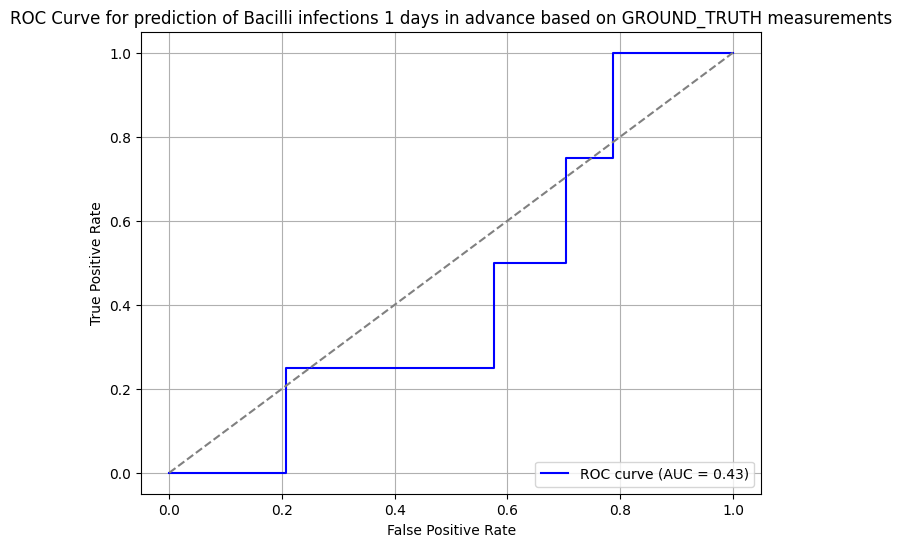

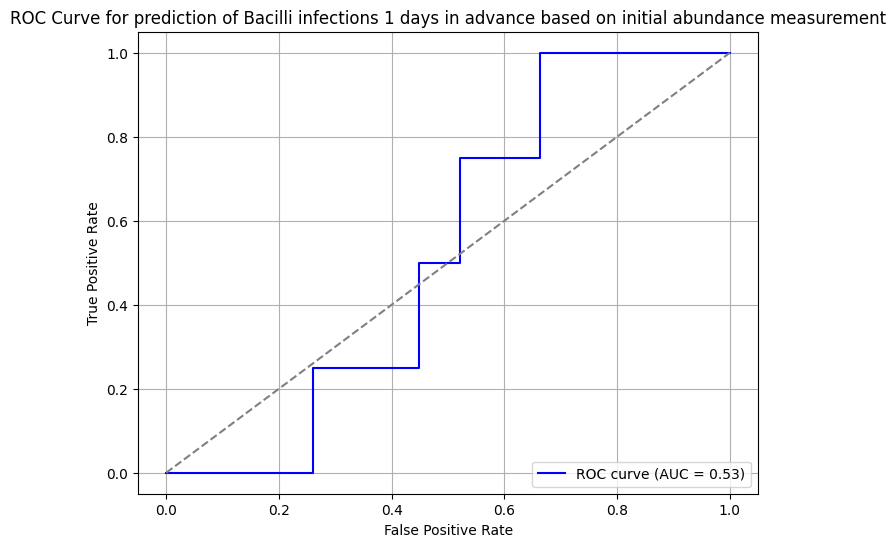

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


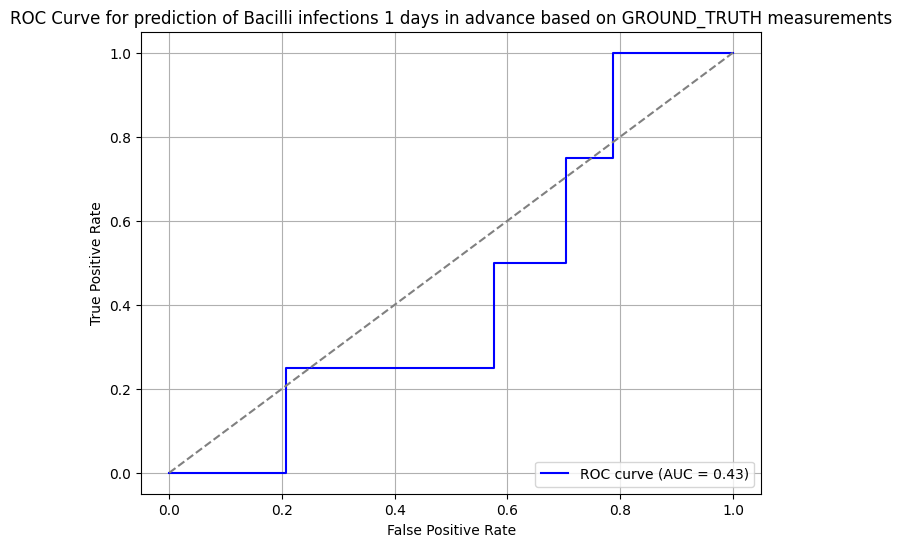

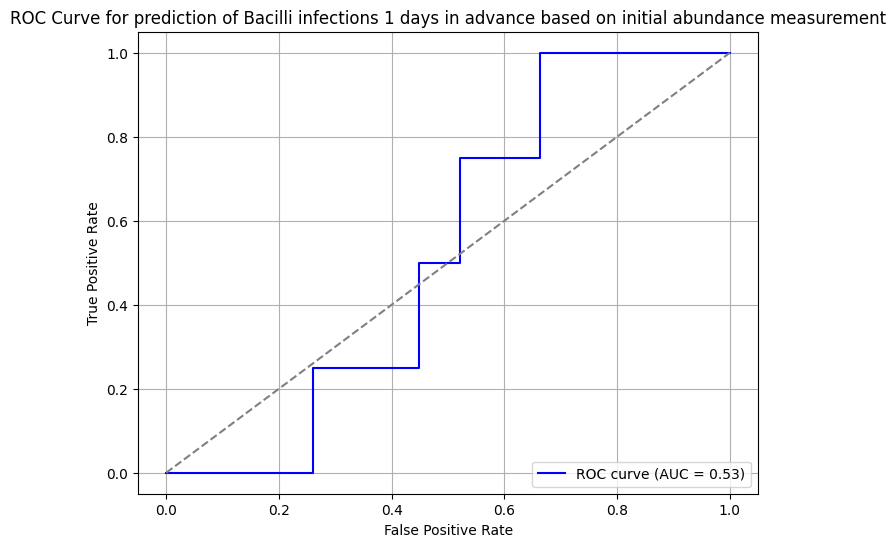

computing infection predictions...
plotting ROC curve...


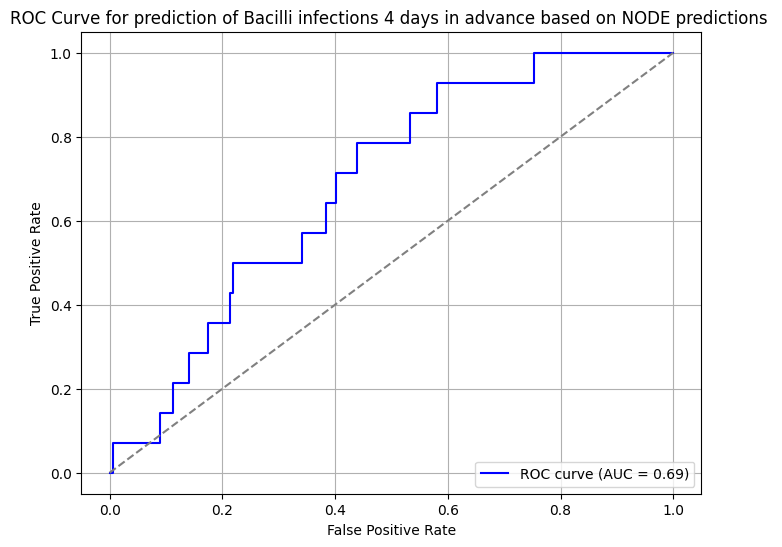

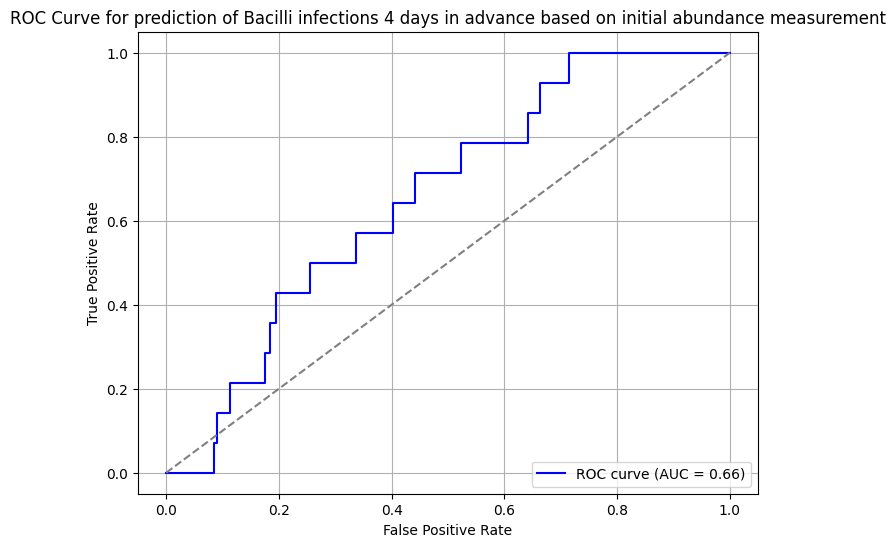

computing infection predictions...
plotting ROC curve...


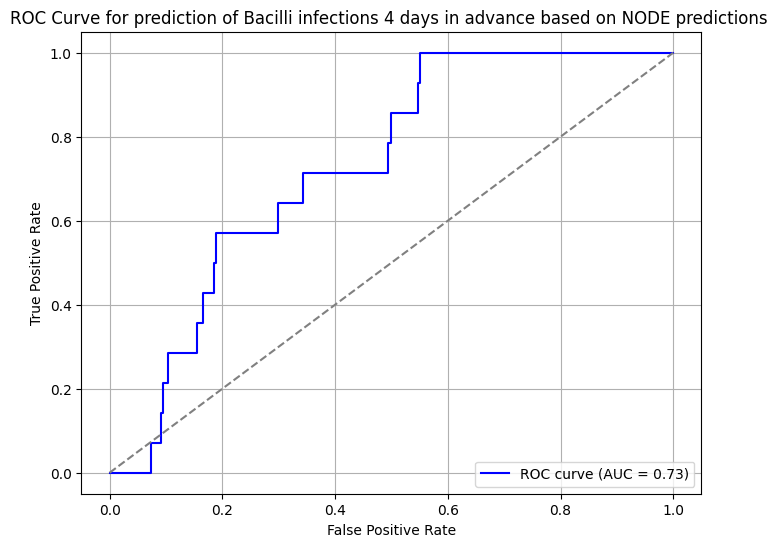

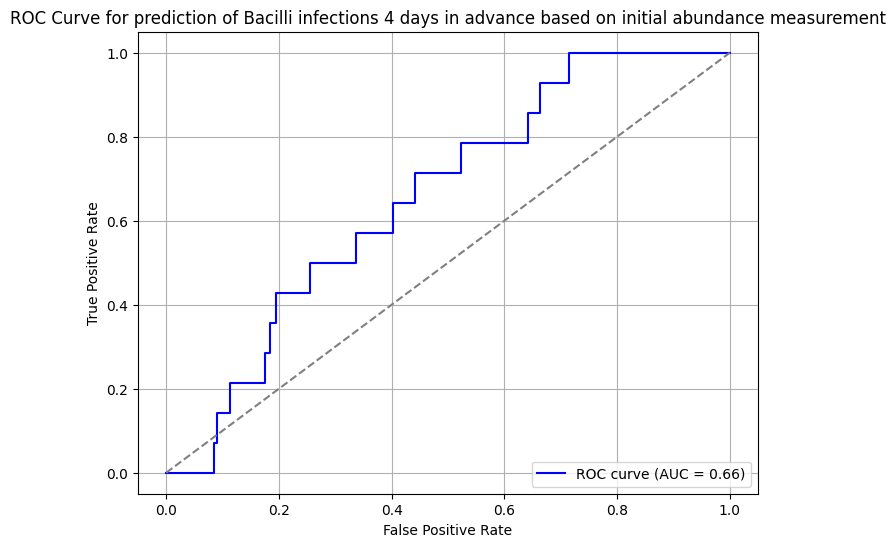

computing infection predictions...
plotting ROC curve...


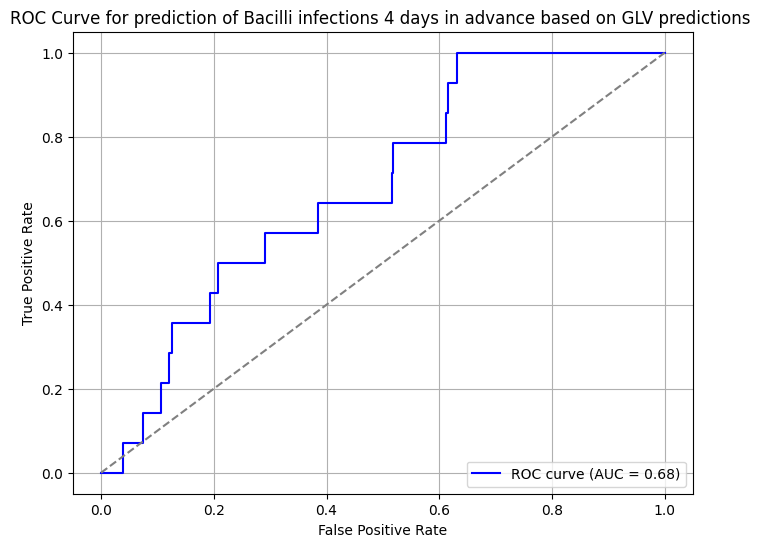

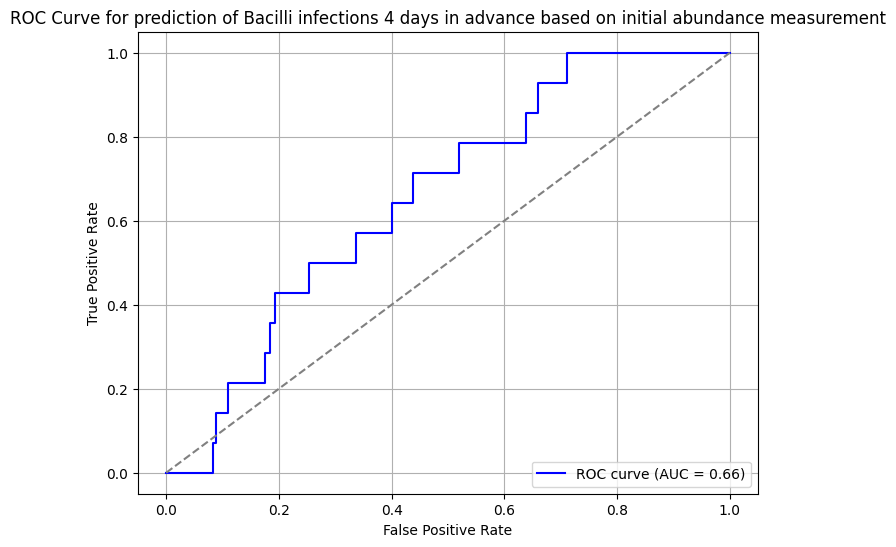

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


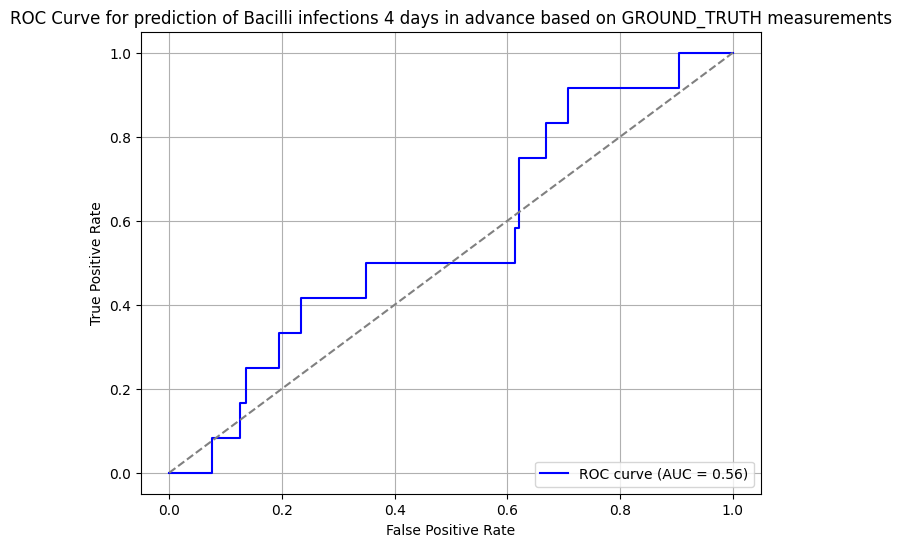

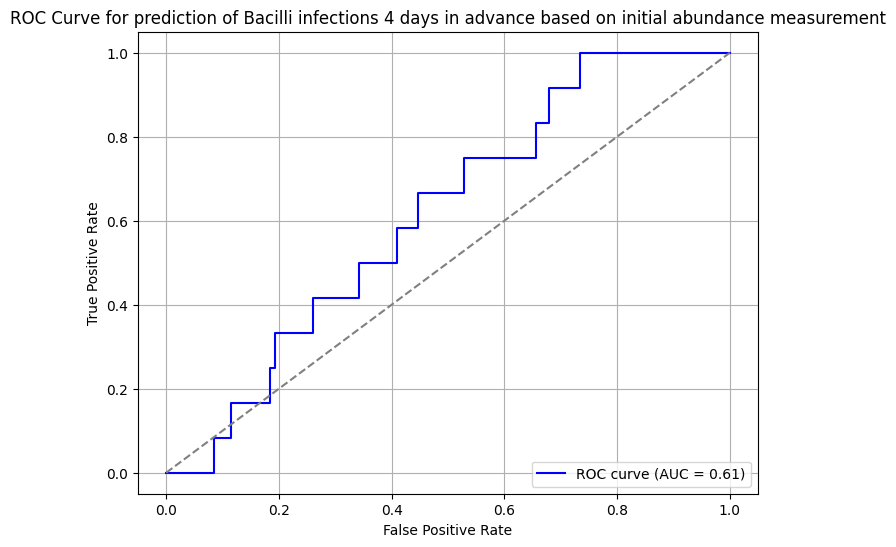

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


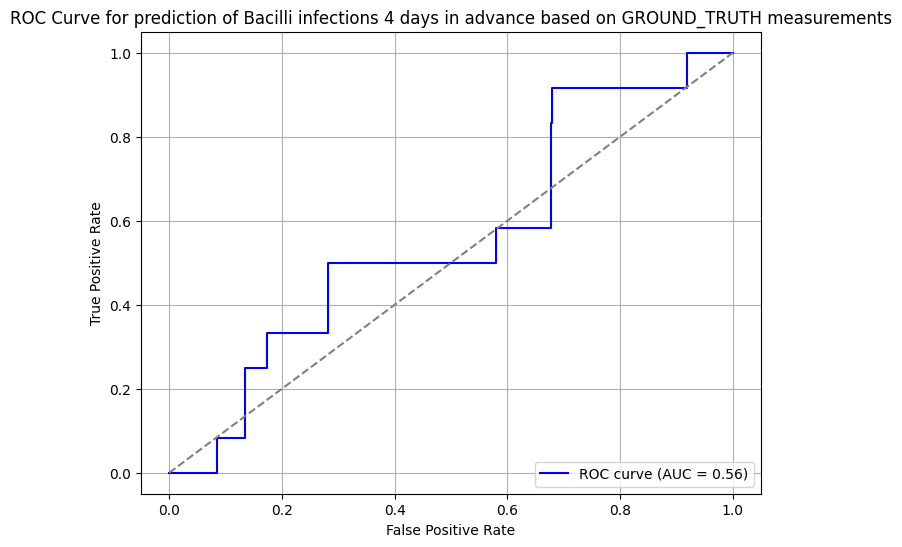

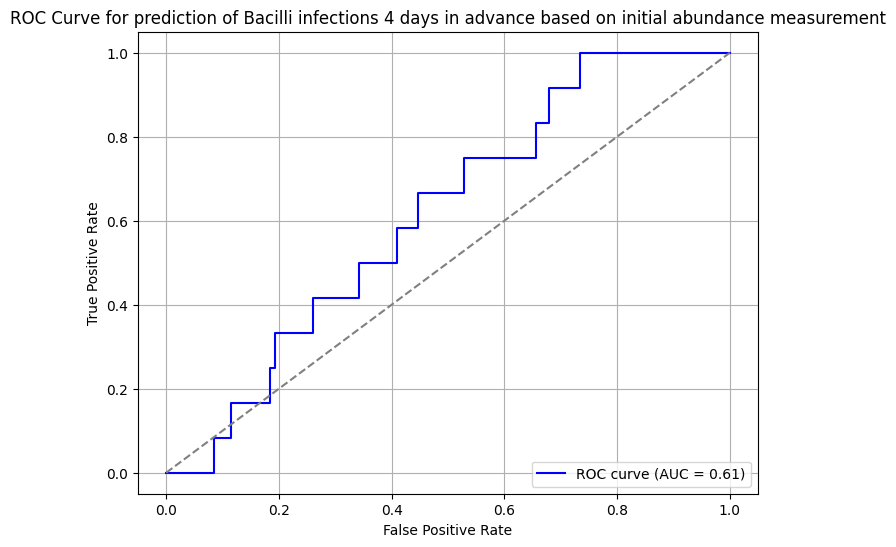

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


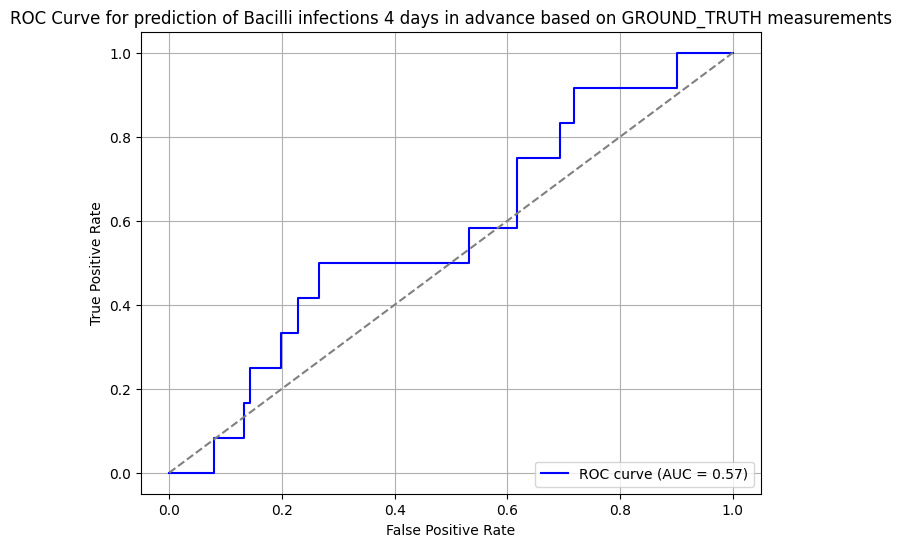

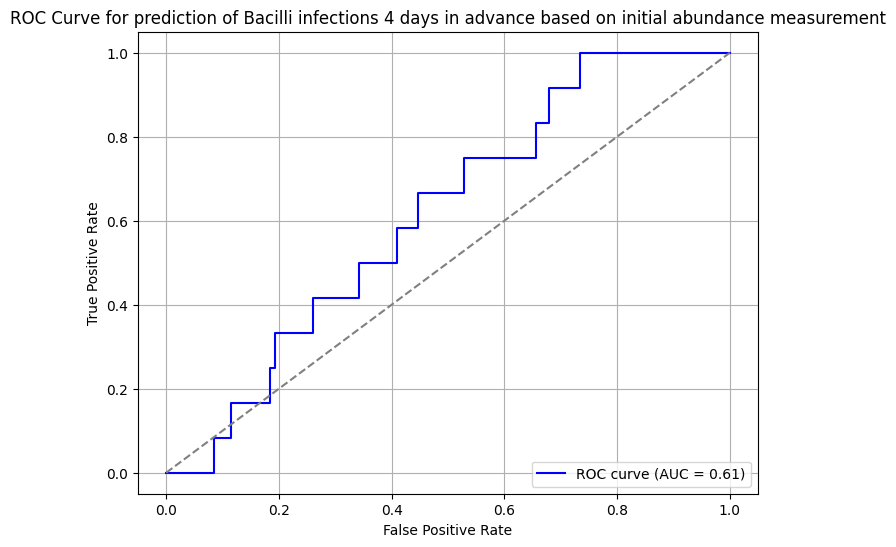

computing infection predictions...
plotting ROC curve...


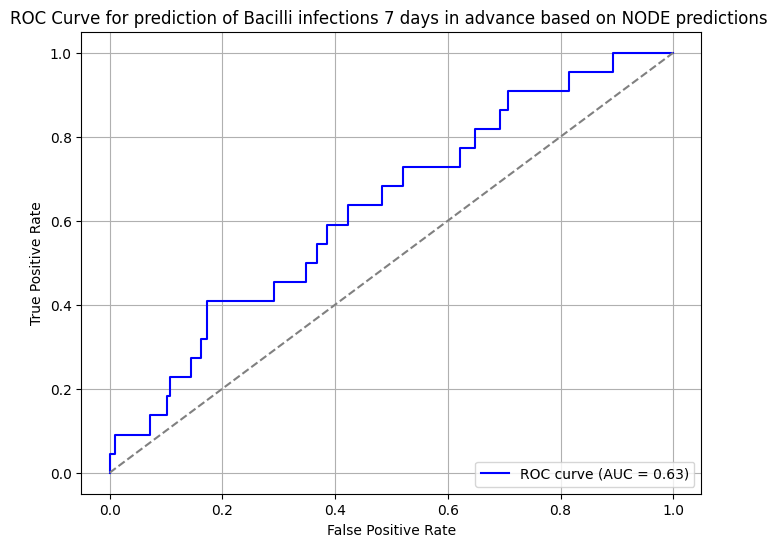

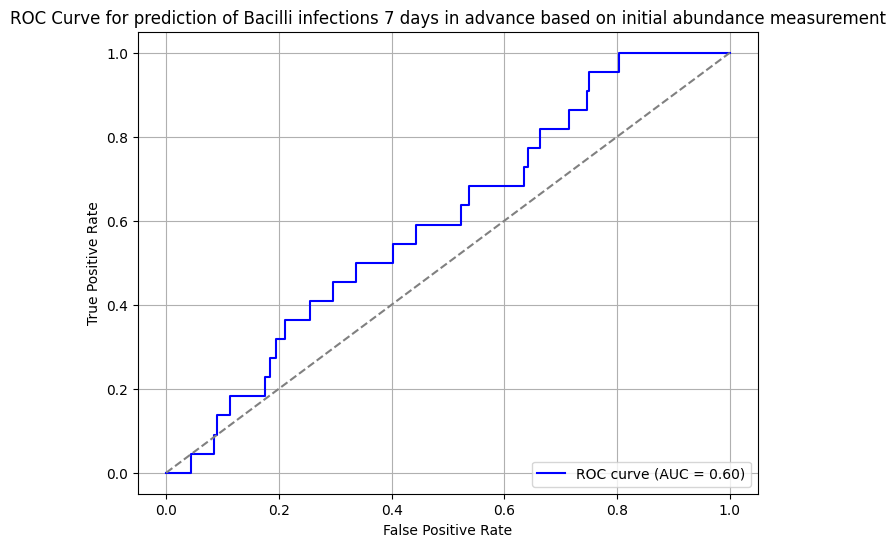

computing infection predictions...
plotting ROC curve...


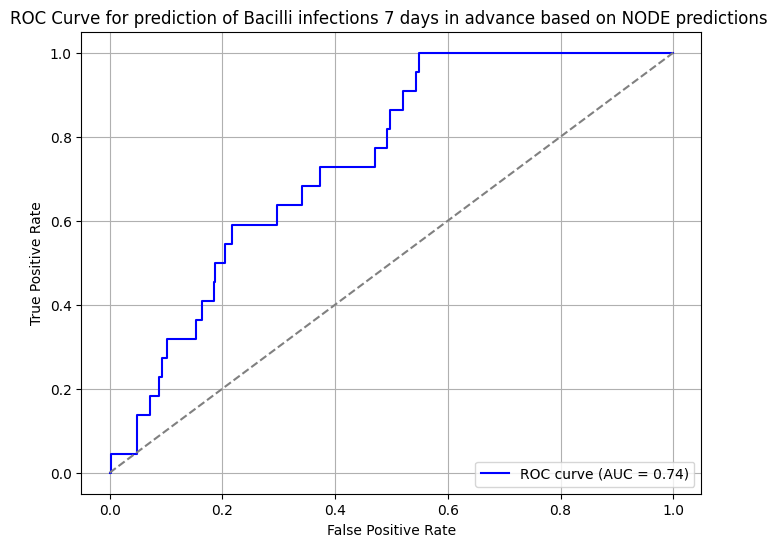

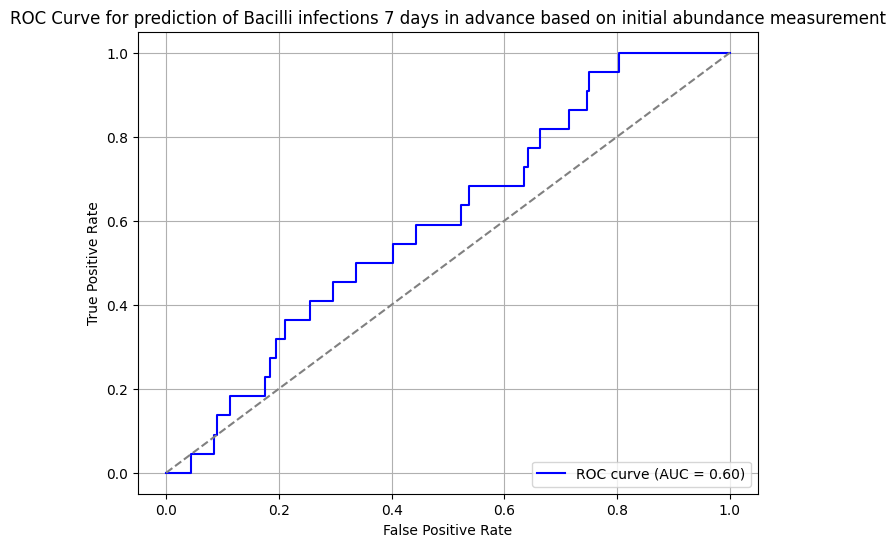

computing infection predictions...
plotting ROC curve...


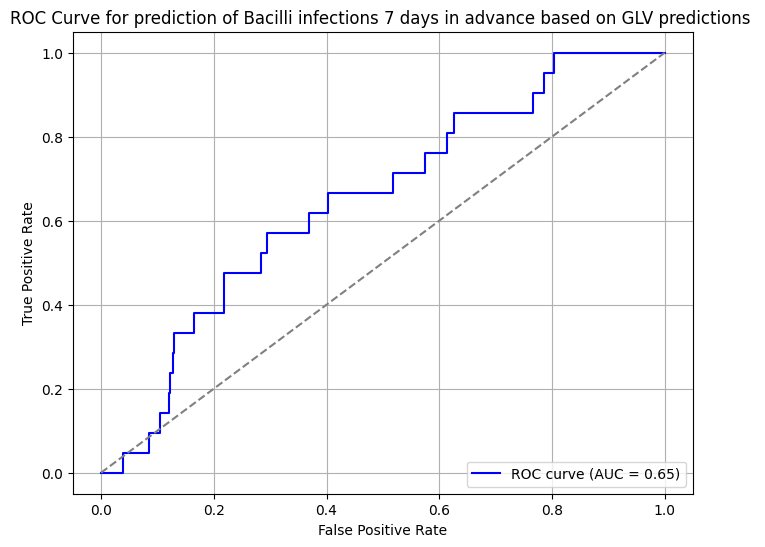

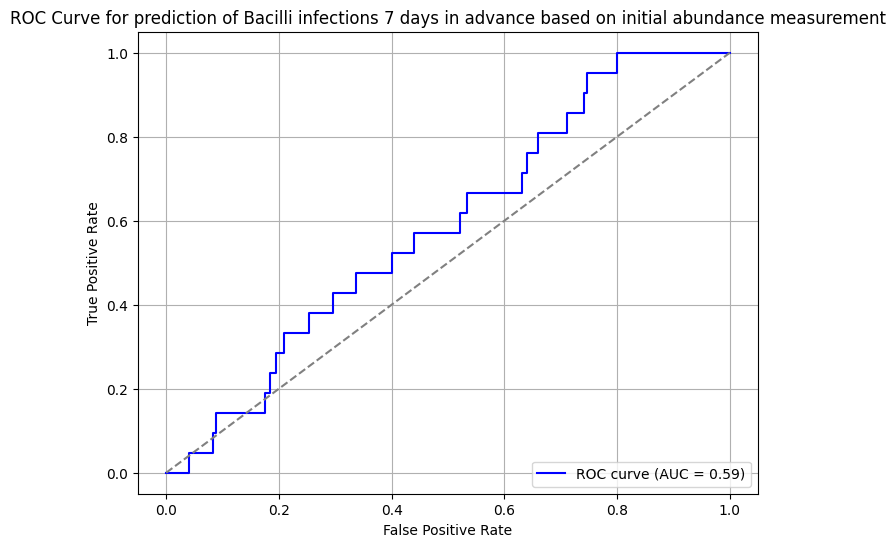

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


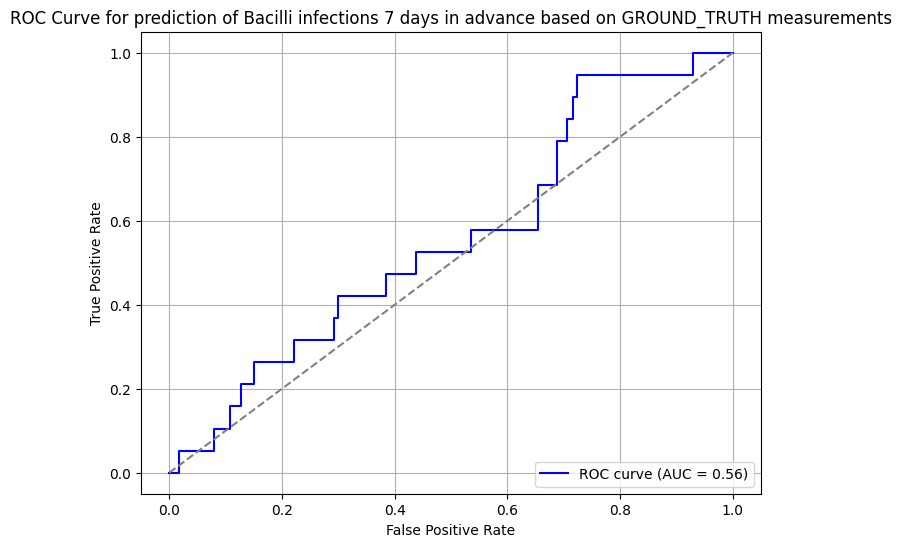

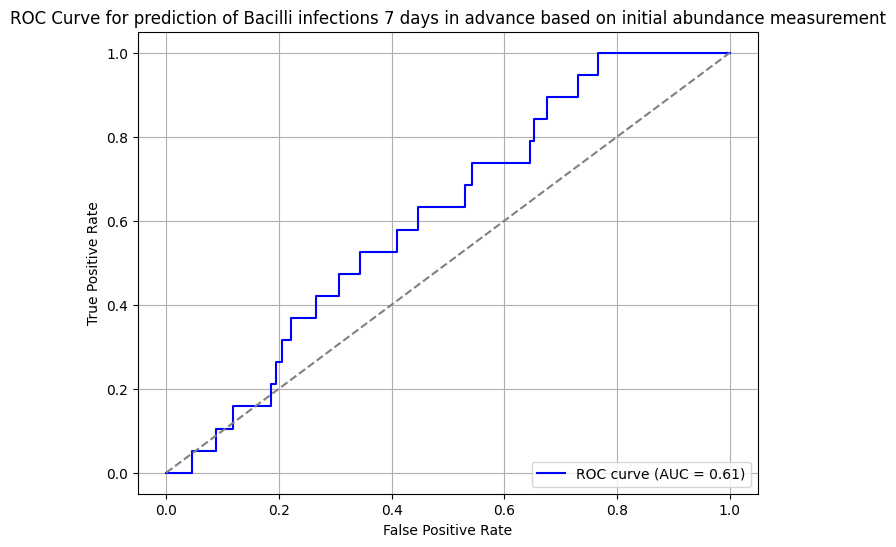

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


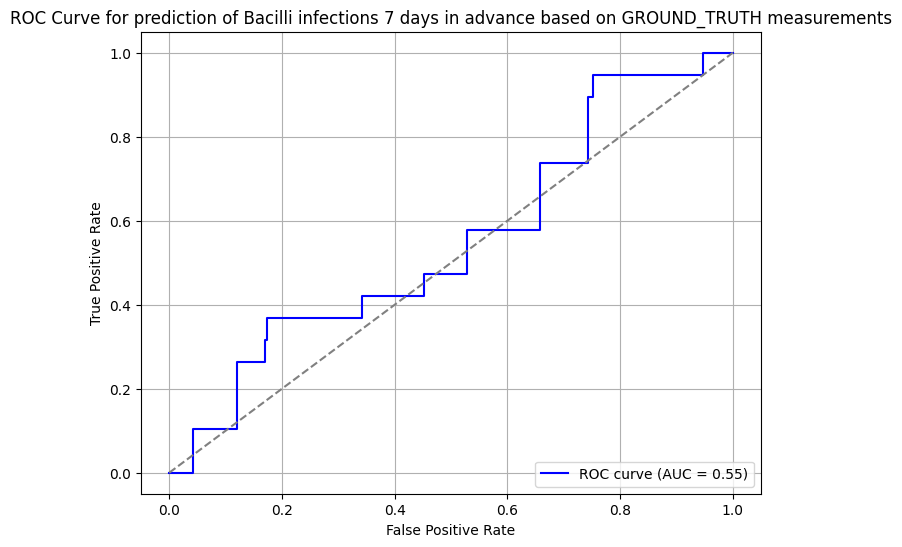

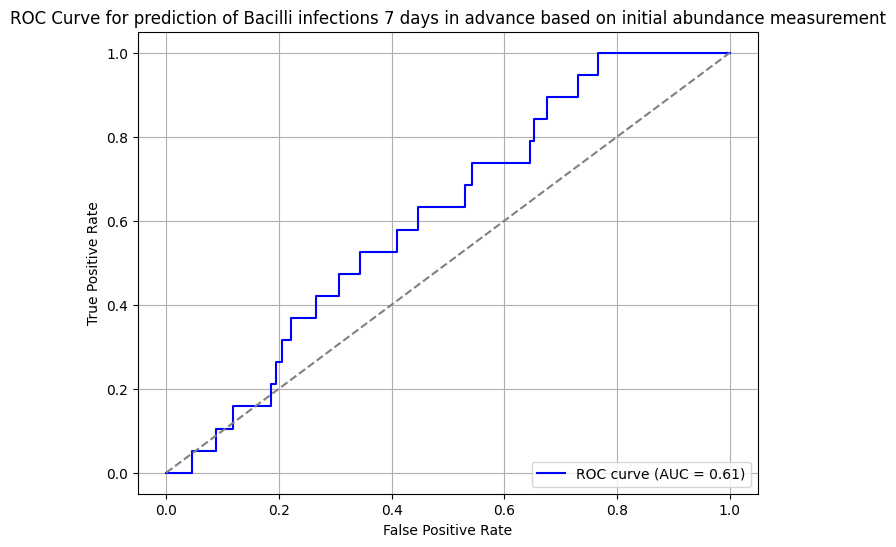

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


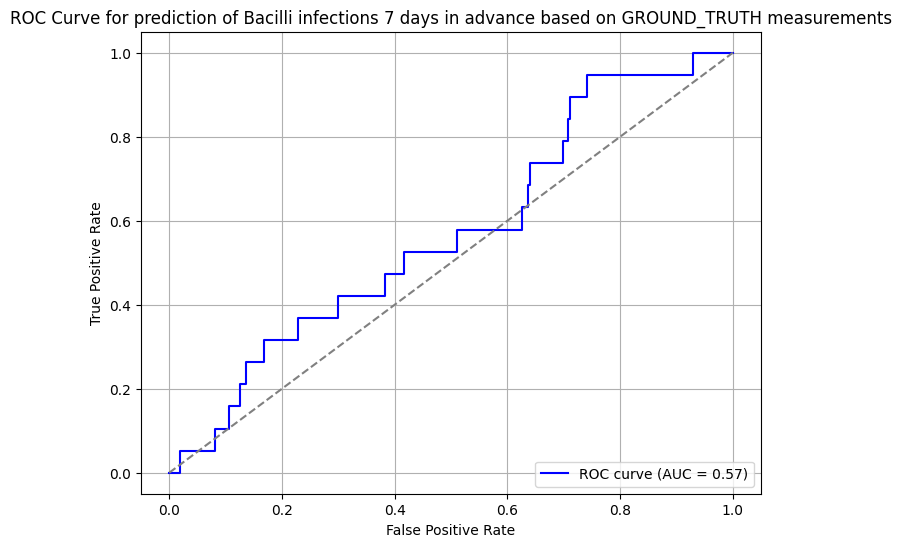

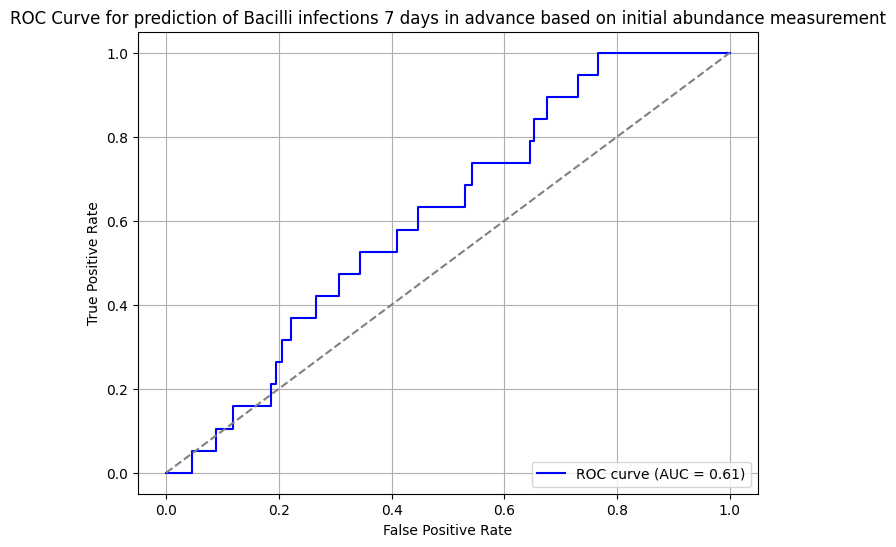

computing infection predictions...
plotting ROC curve...


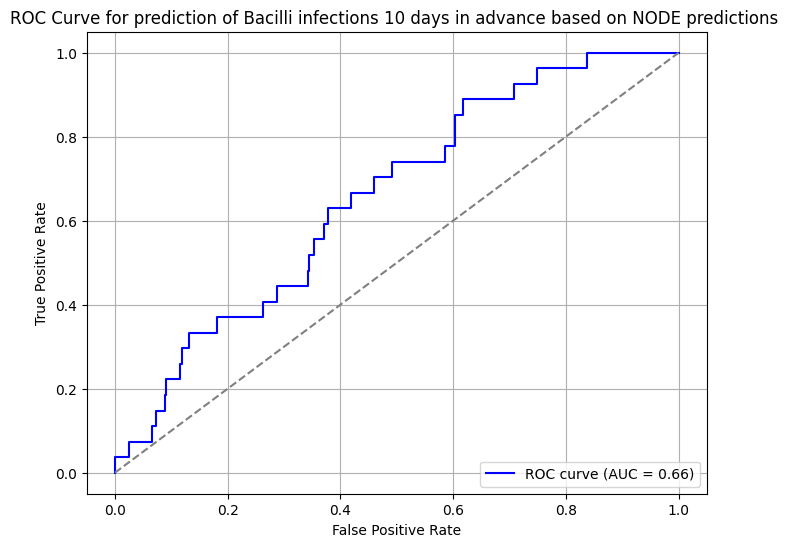

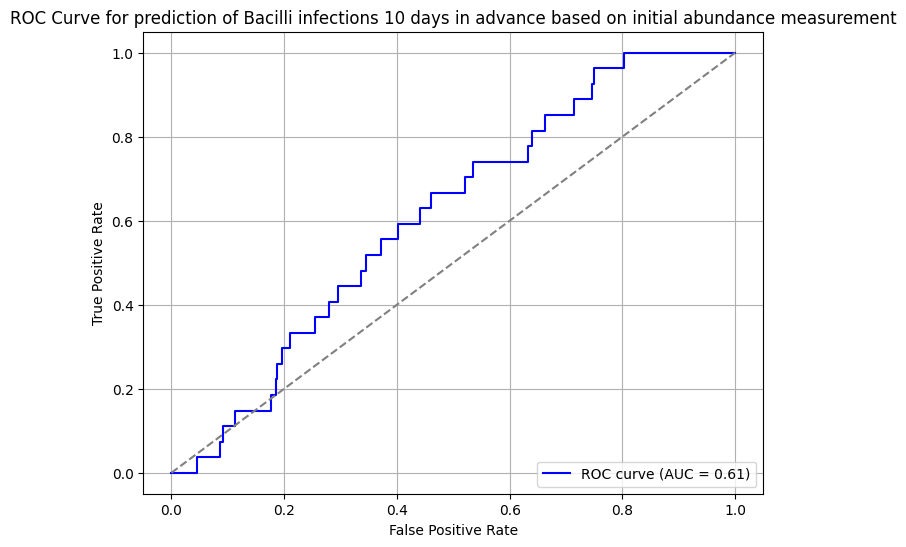

computing infection predictions...
plotting ROC curve...


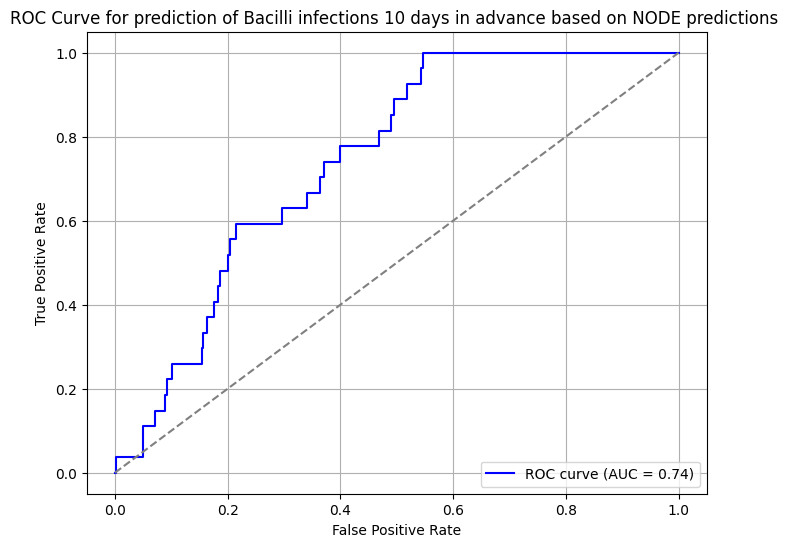

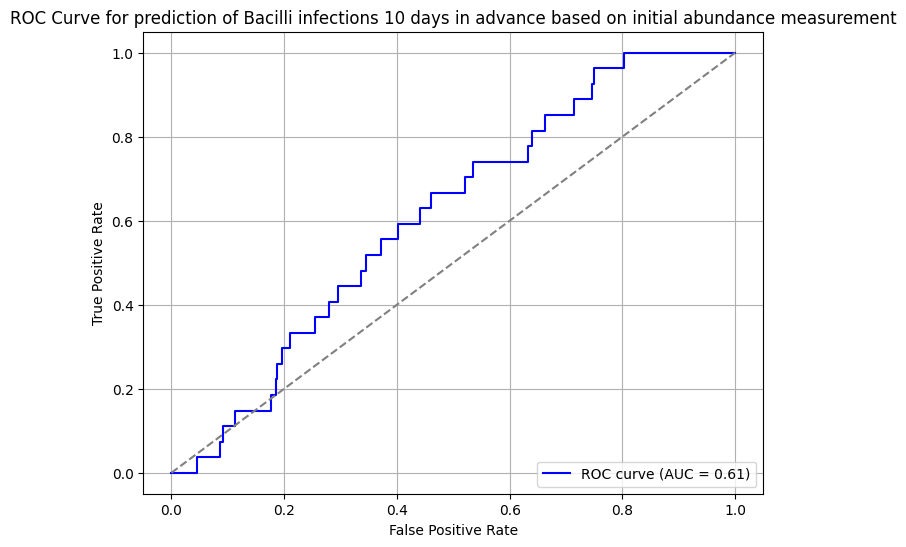

computing infection predictions...
plotting ROC curve...


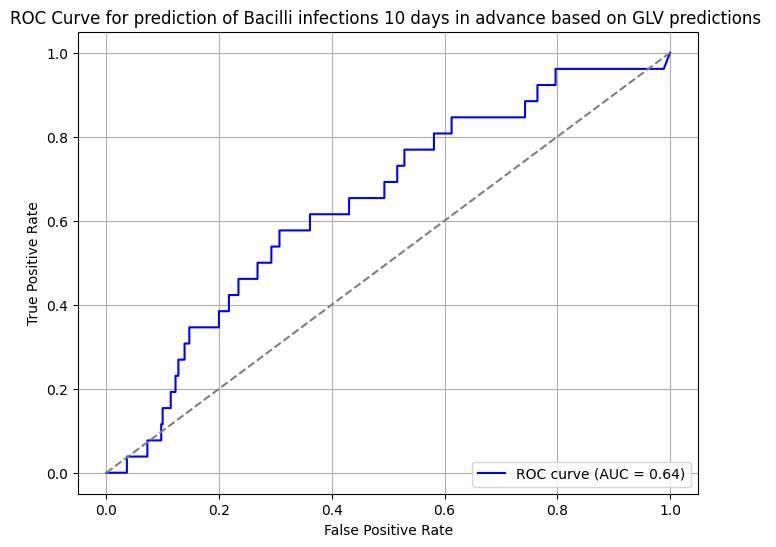

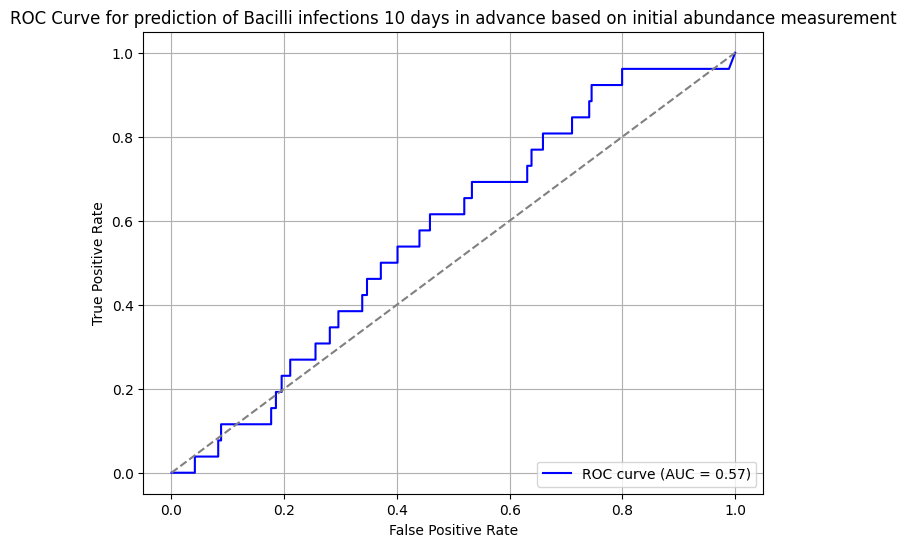

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


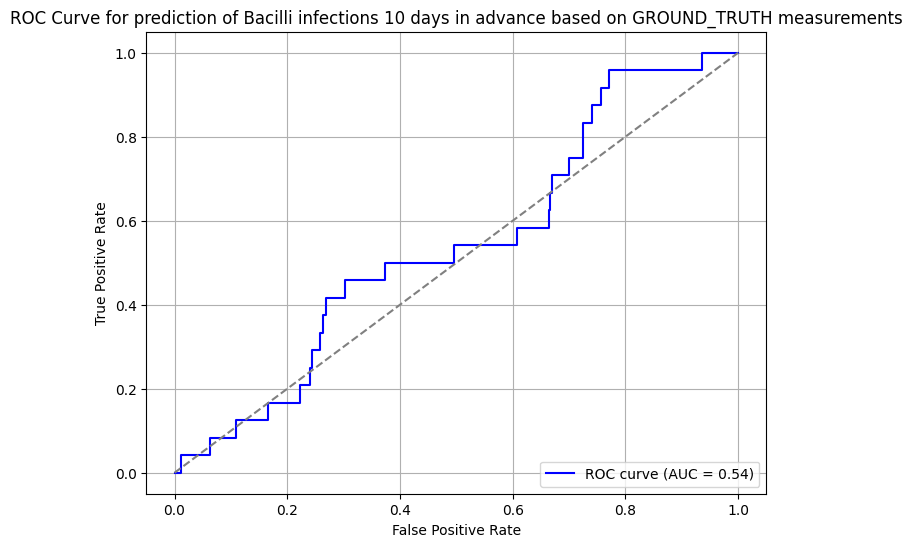

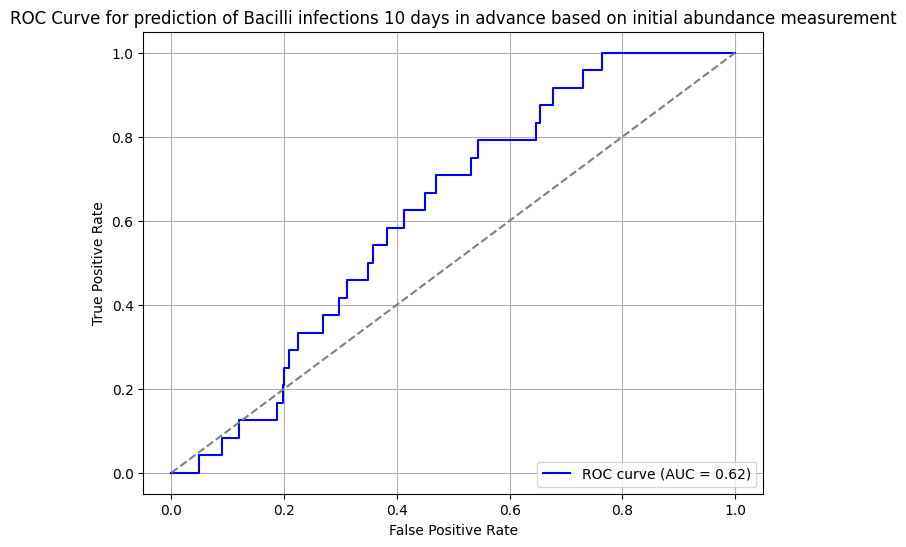

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


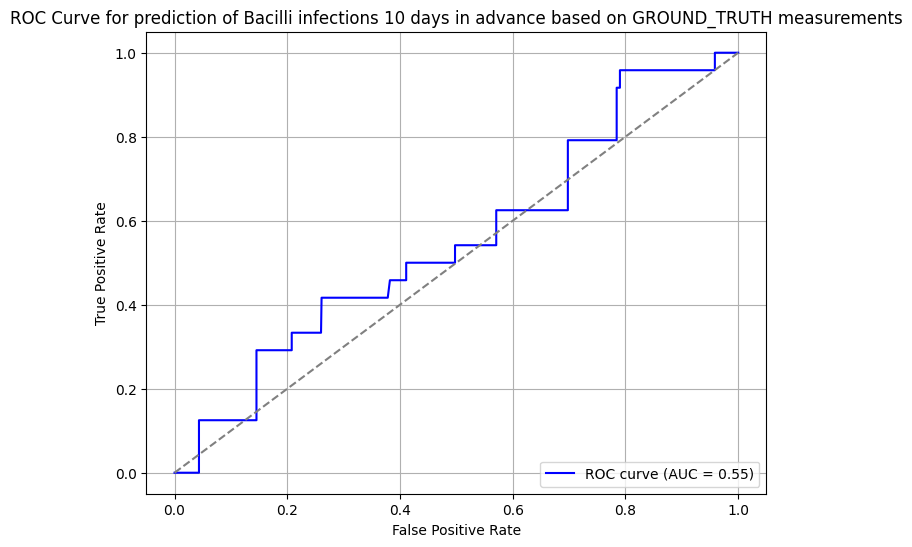

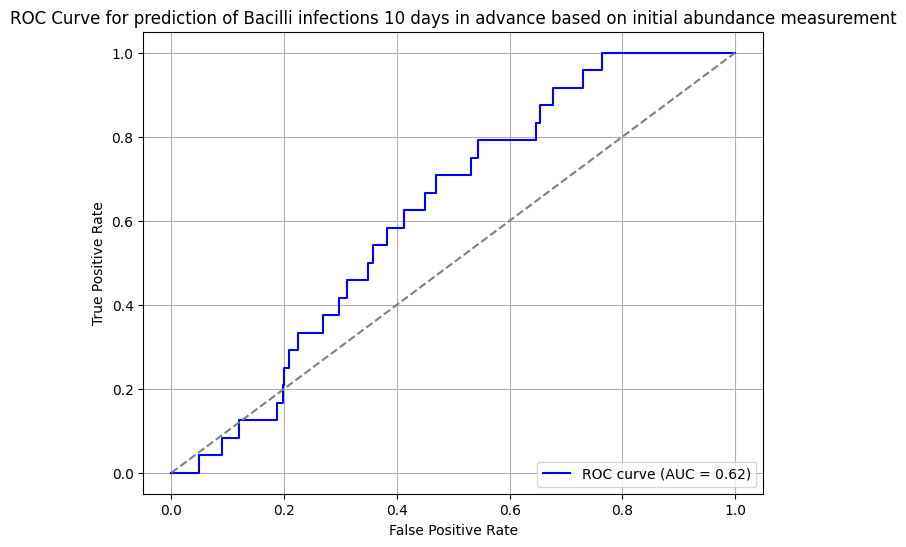

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


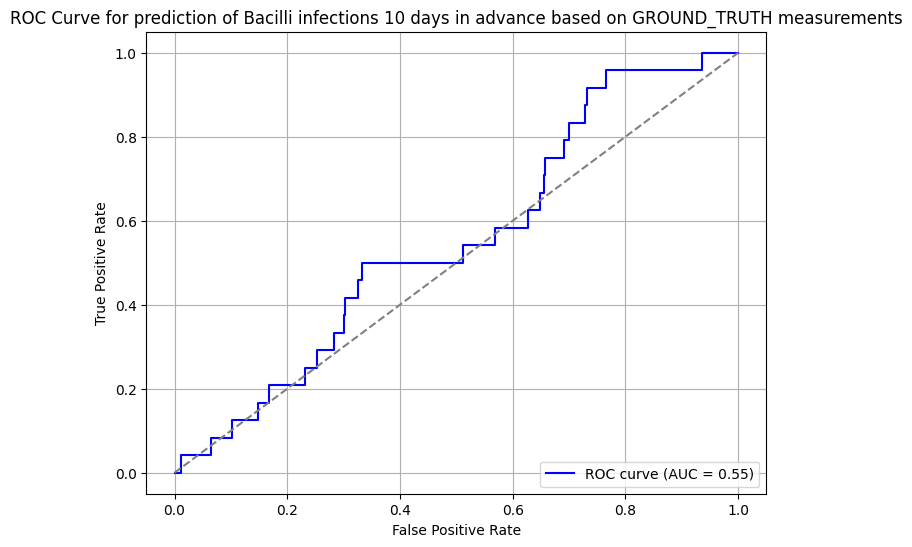

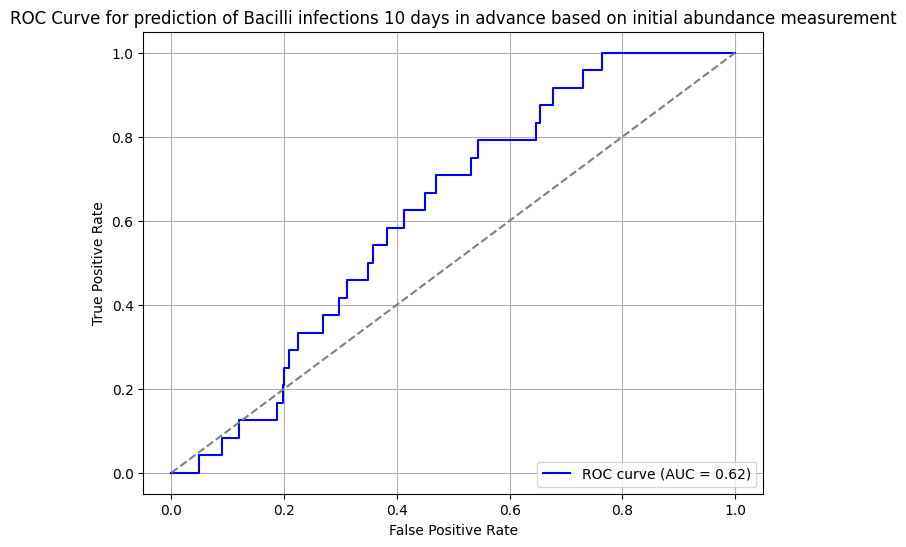

computing infection predictions...
plotting ROC curve...


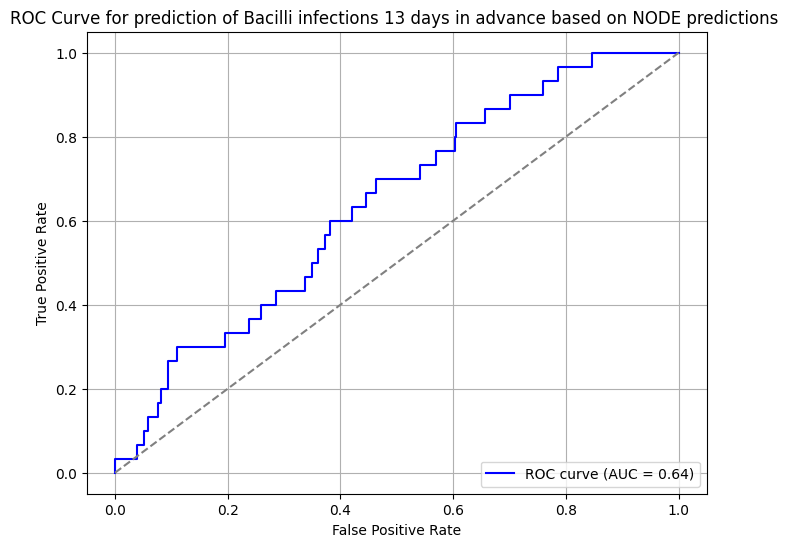

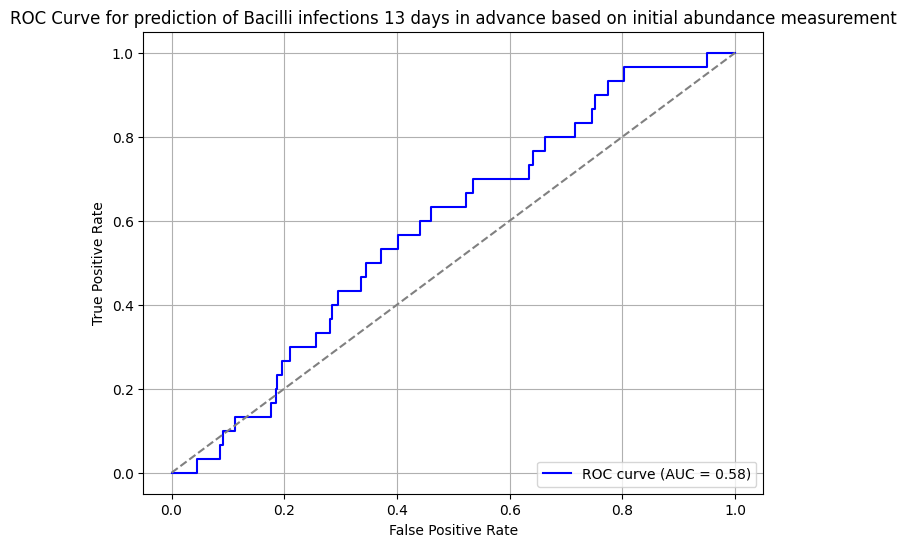

computing infection predictions...
plotting ROC curve...


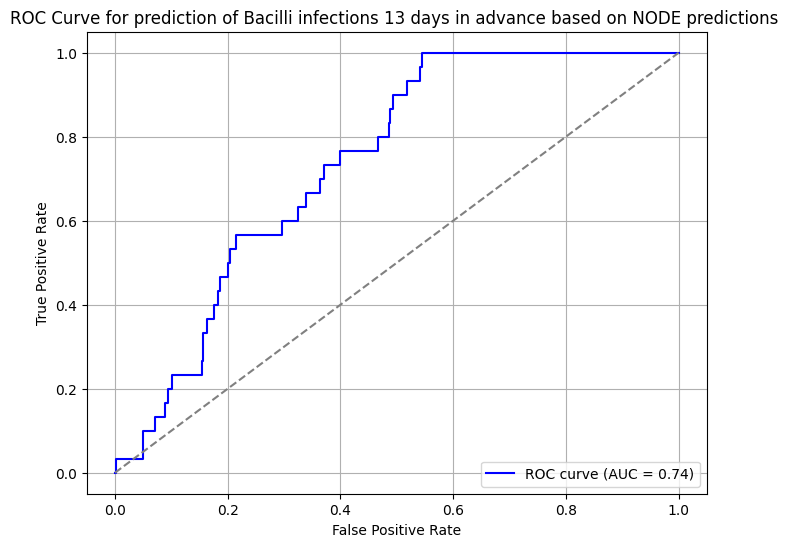

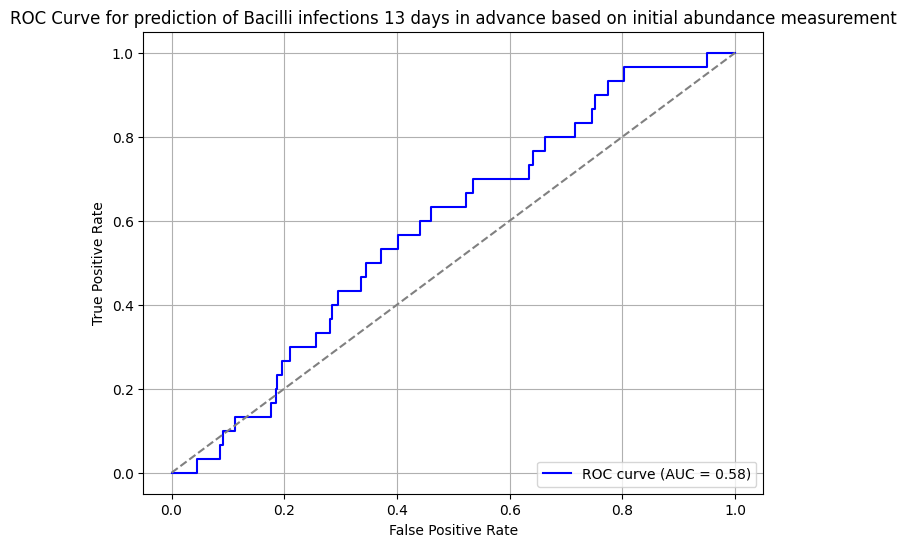

computing infection predictions...
plotting ROC curve...


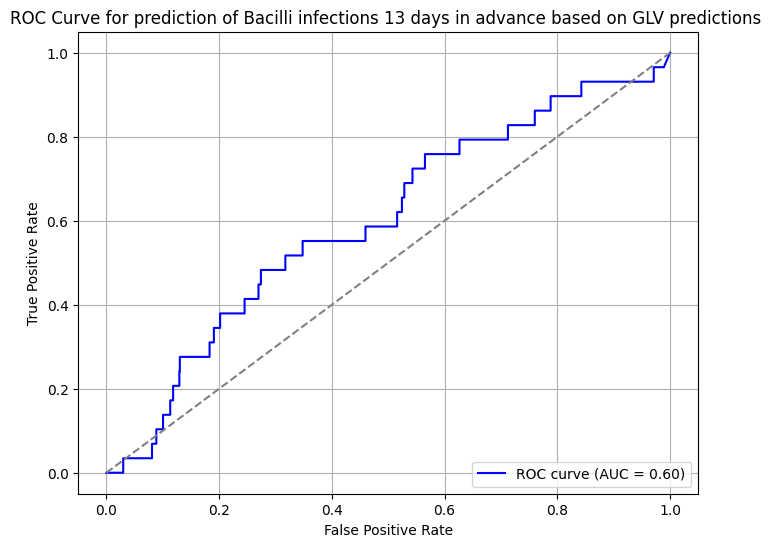

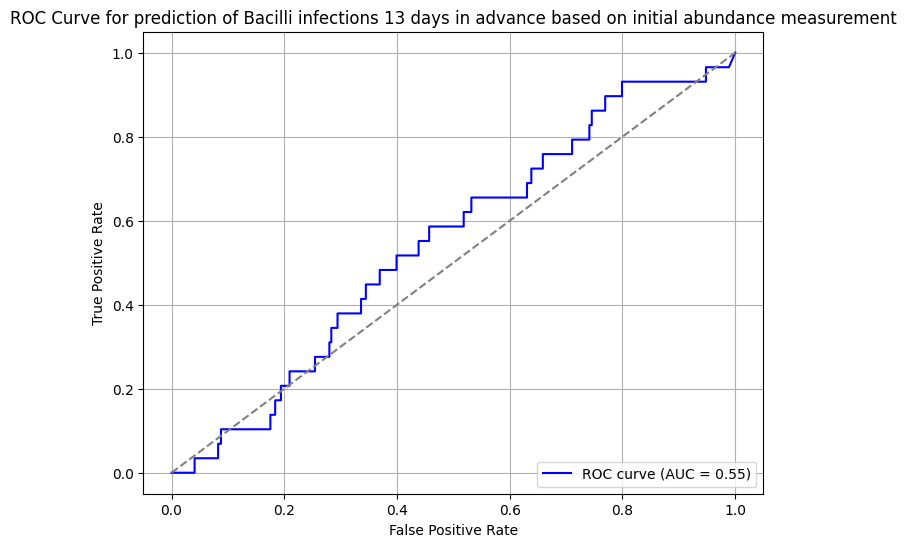

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


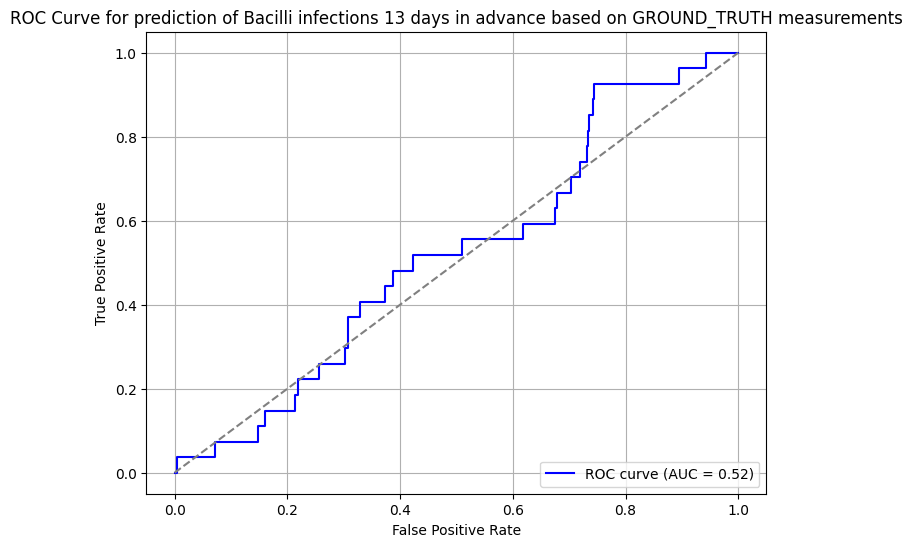

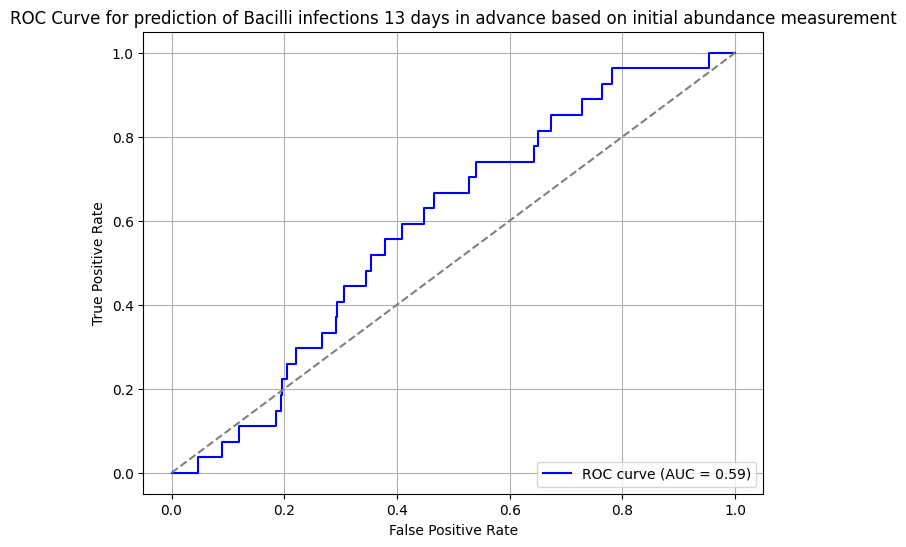

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


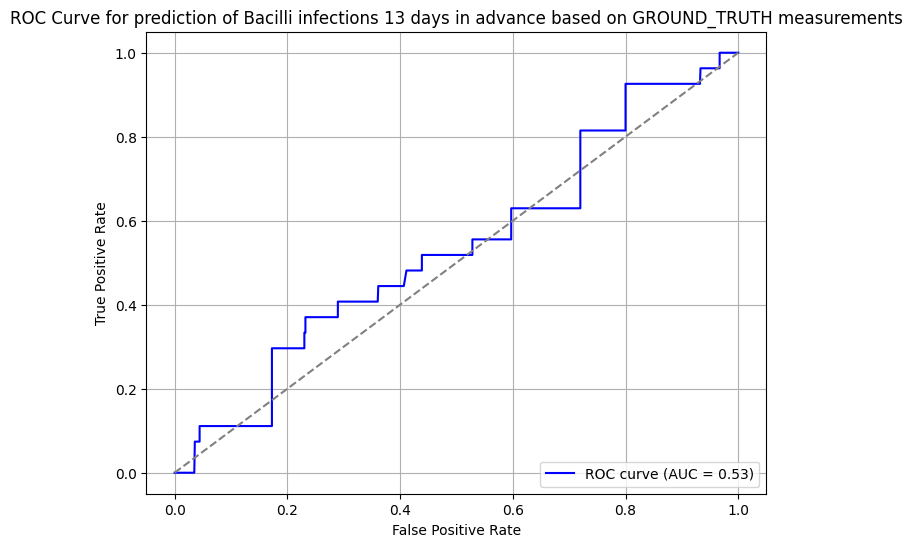

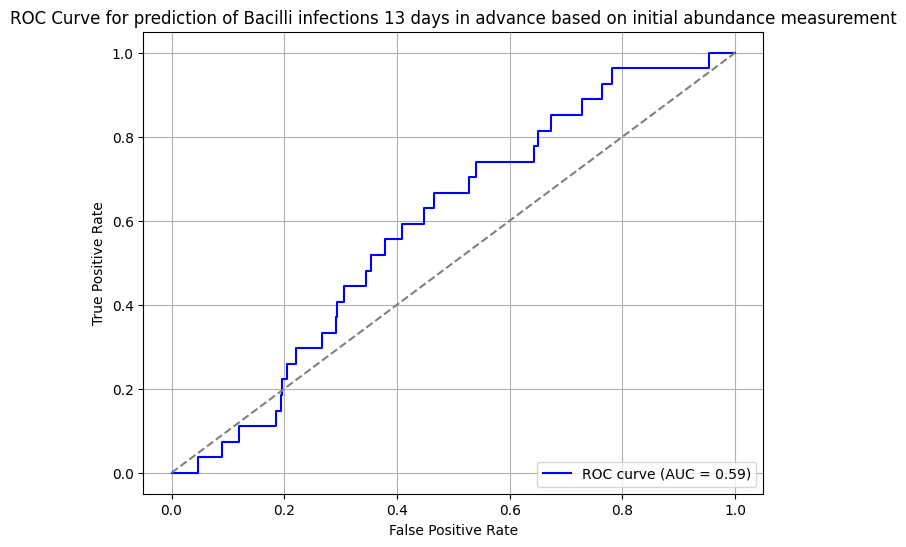

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


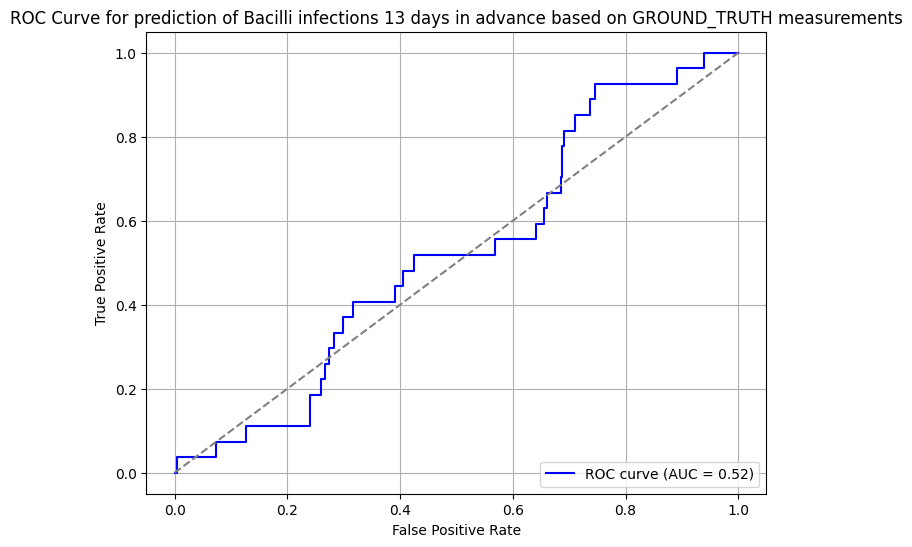

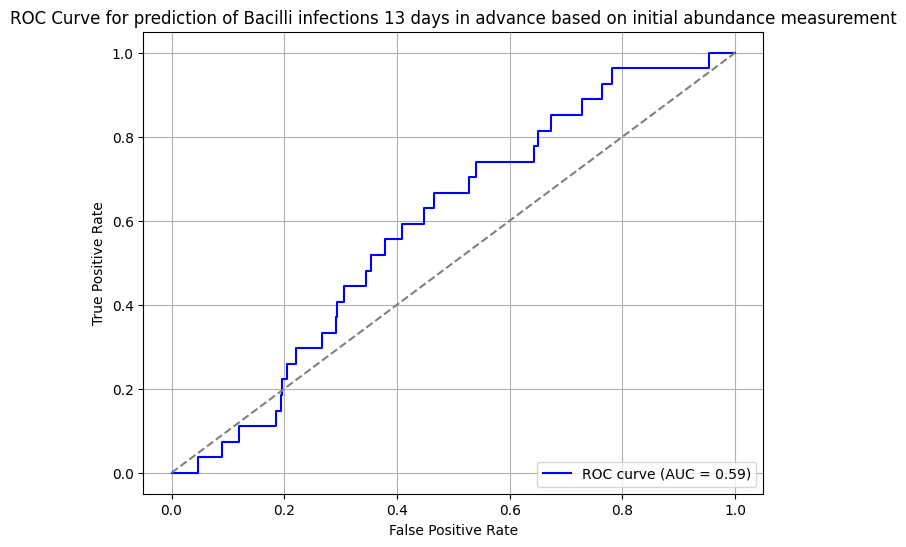

computing infection predictions...
plotting ROC curve...


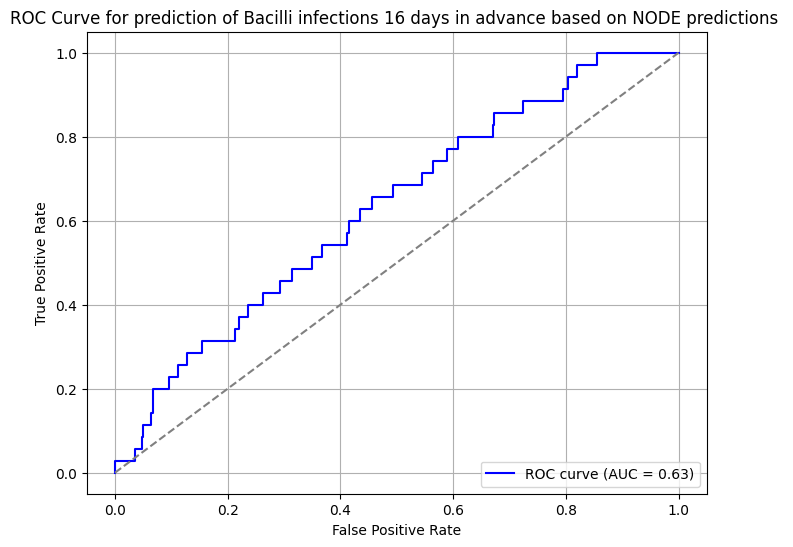

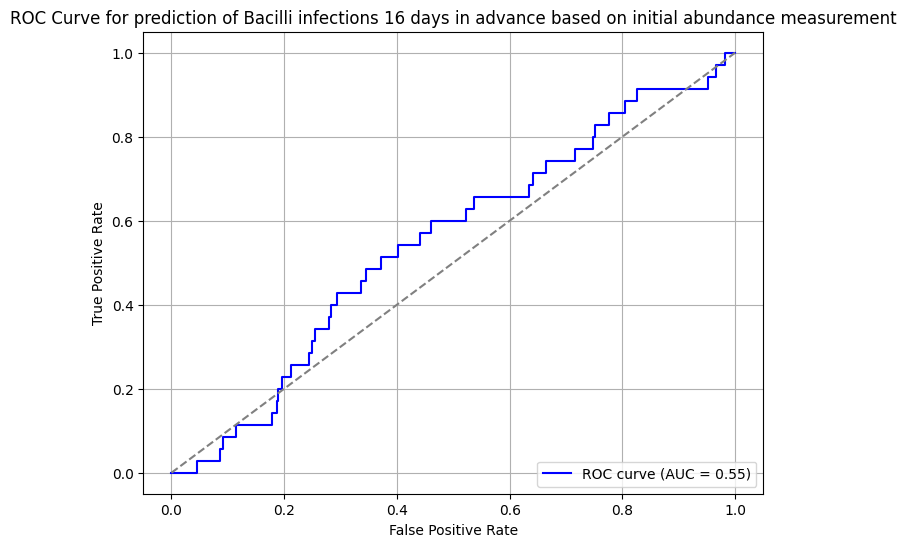

computing infection predictions...
plotting ROC curve...


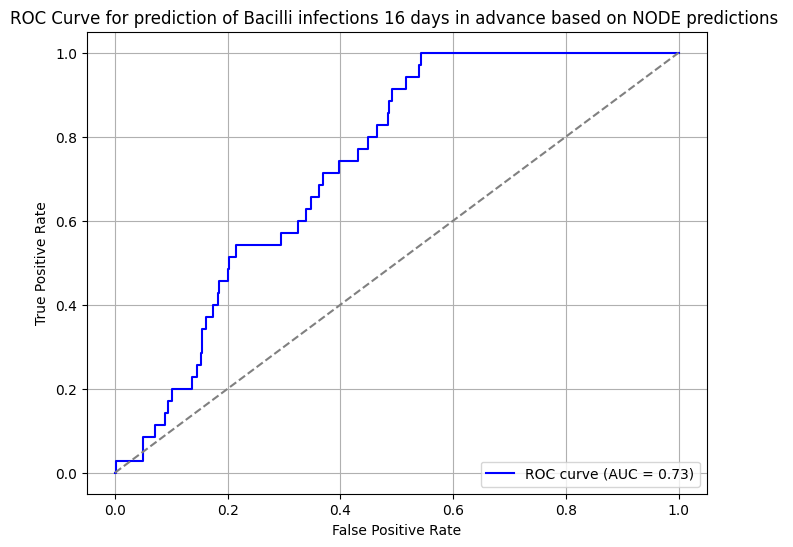

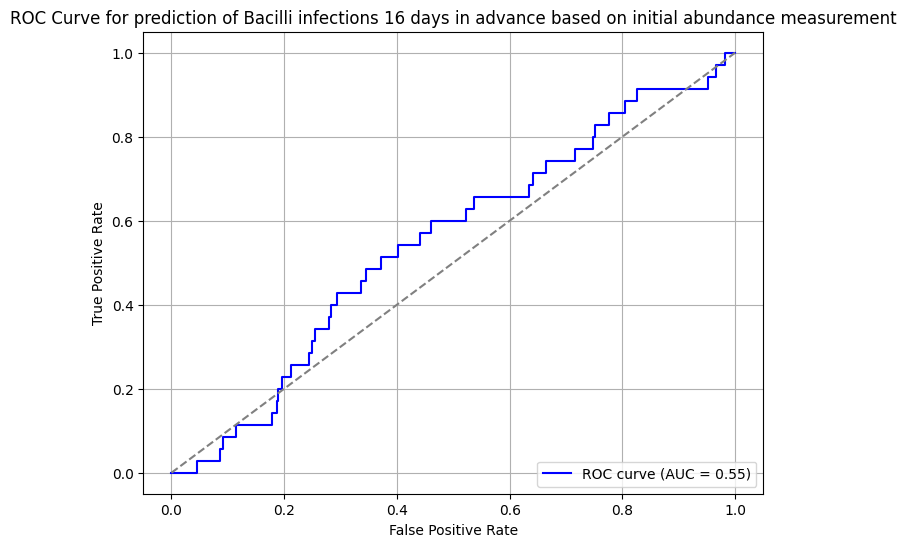

computing infection predictions...
plotting ROC curve...


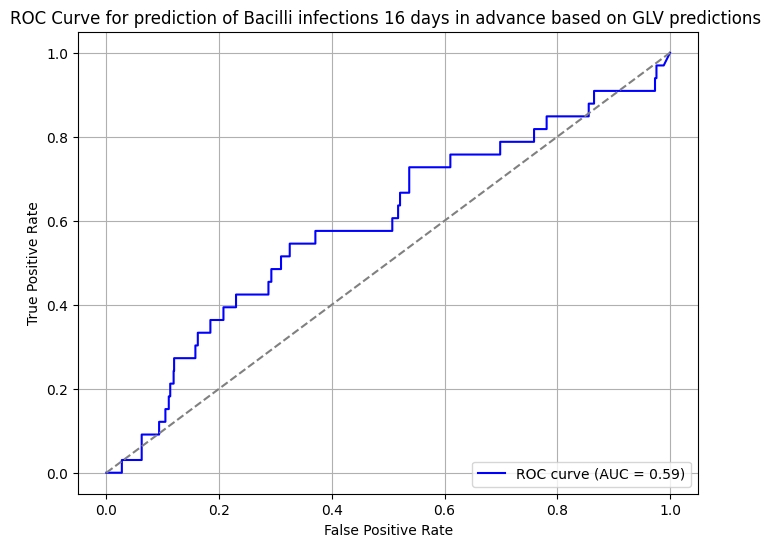

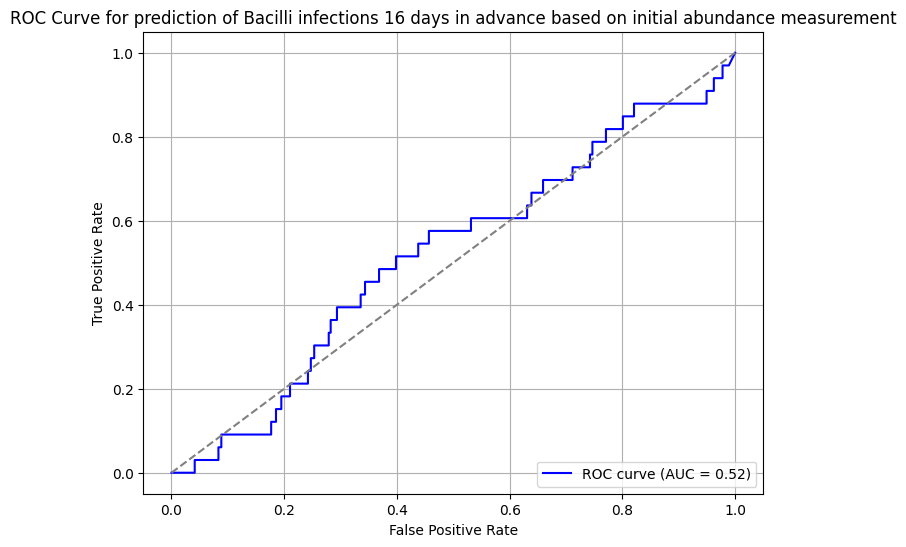

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


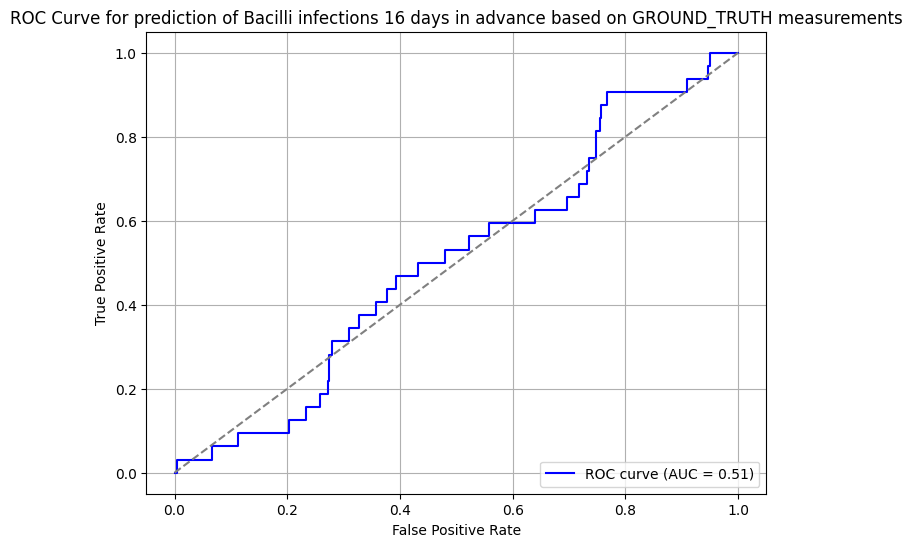

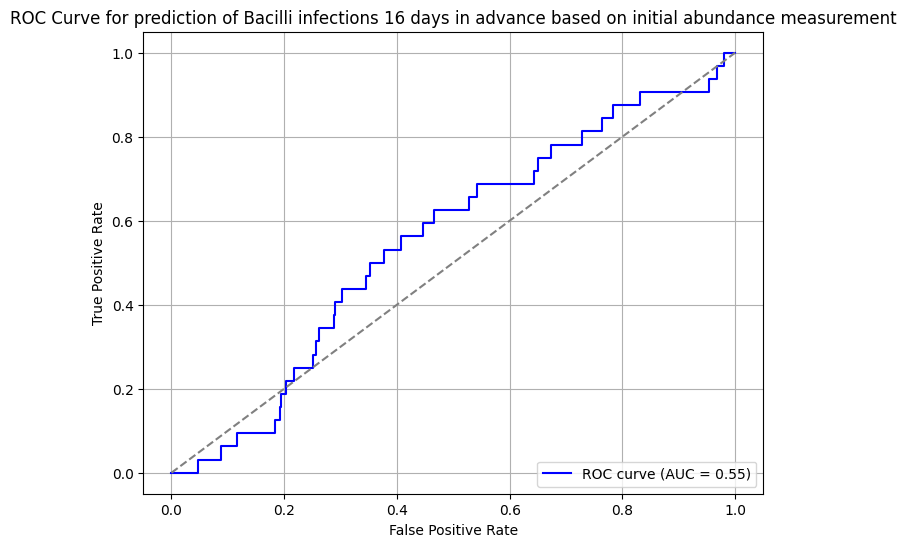

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


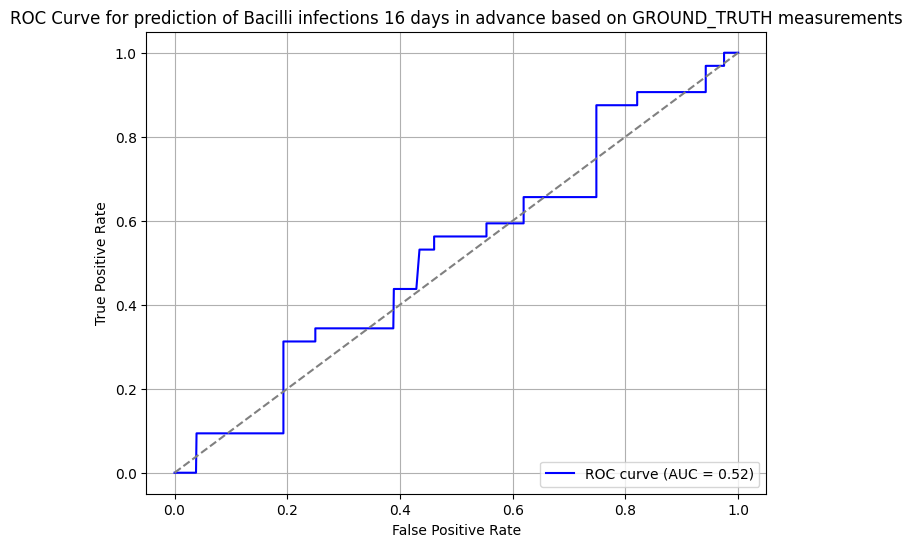

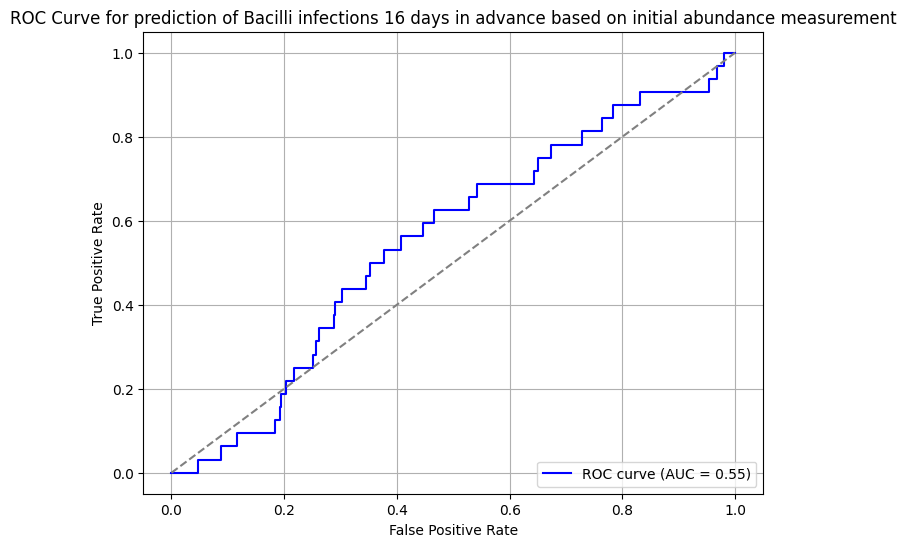

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


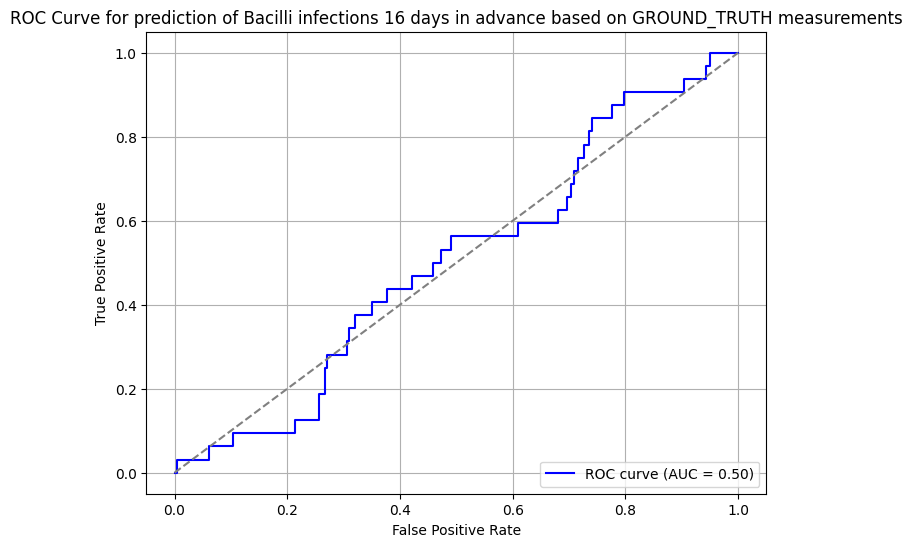

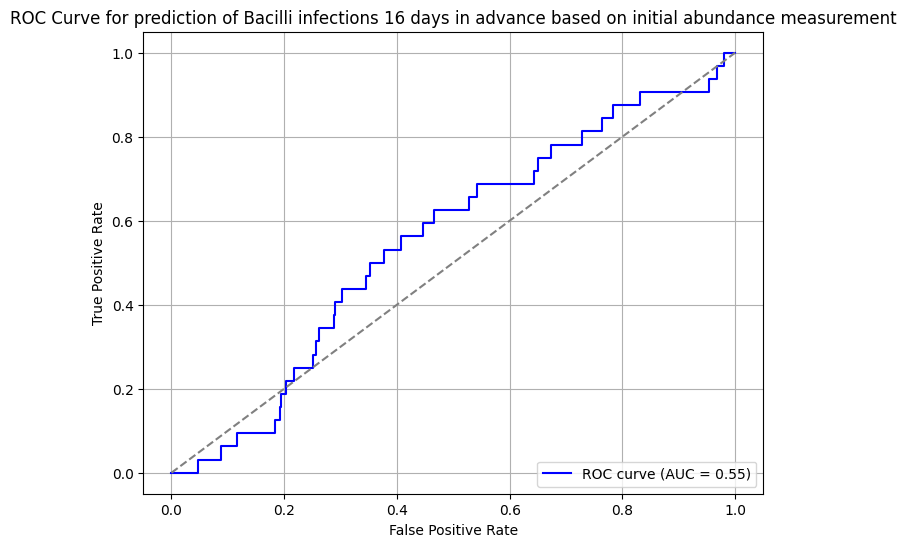

computing infection predictions...
plotting ROC curve...


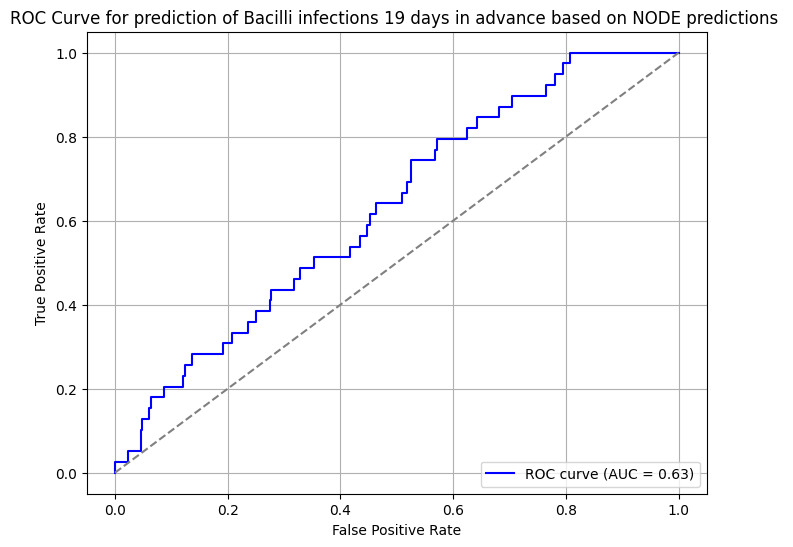

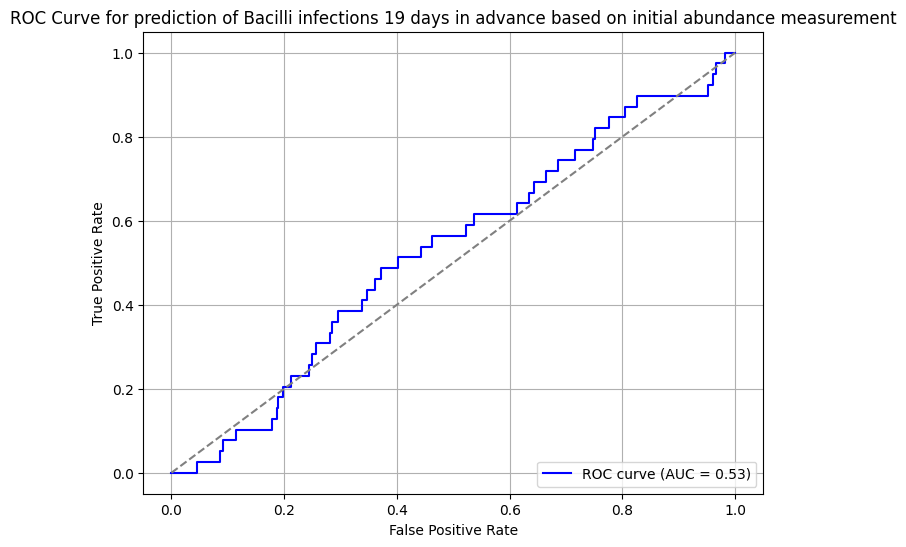

computing infection predictions...
plotting ROC curve...


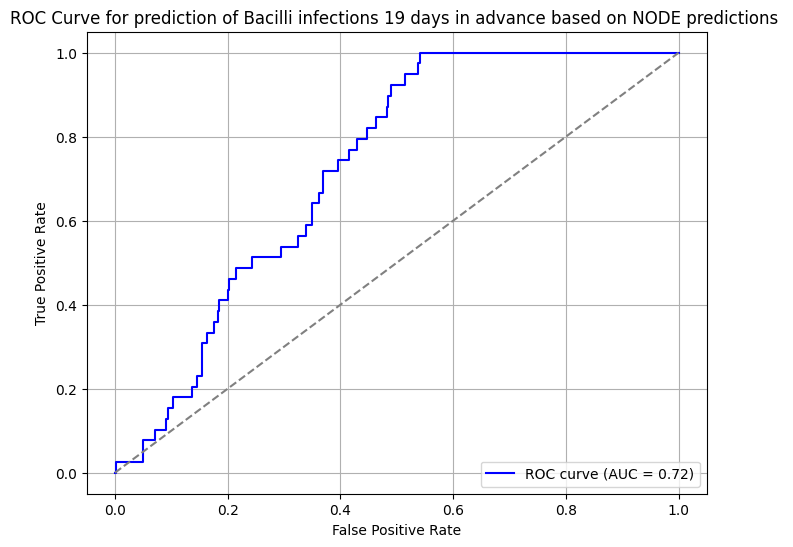

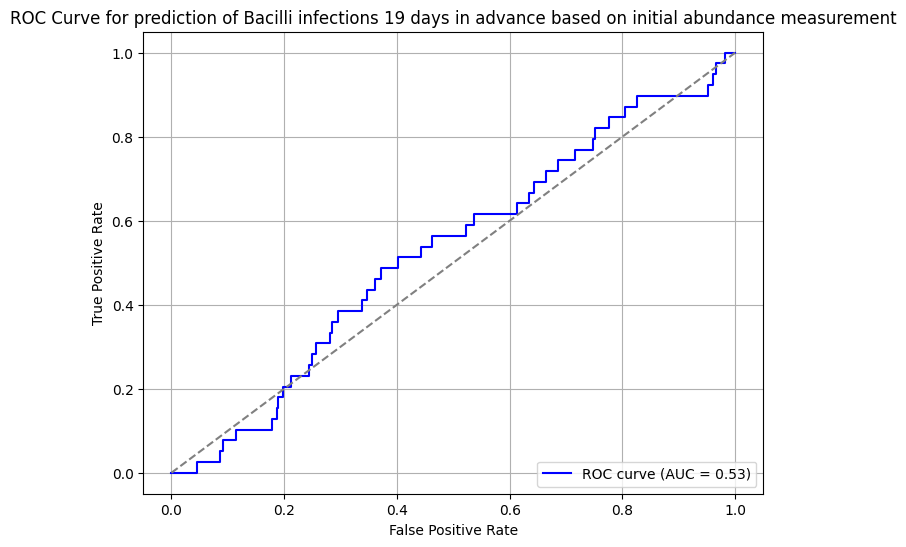

computing infection predictions...
plotting ROC curve...


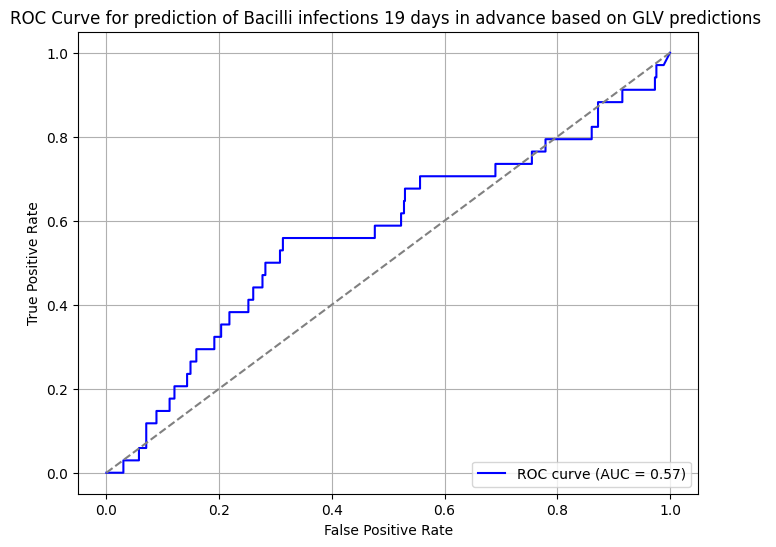

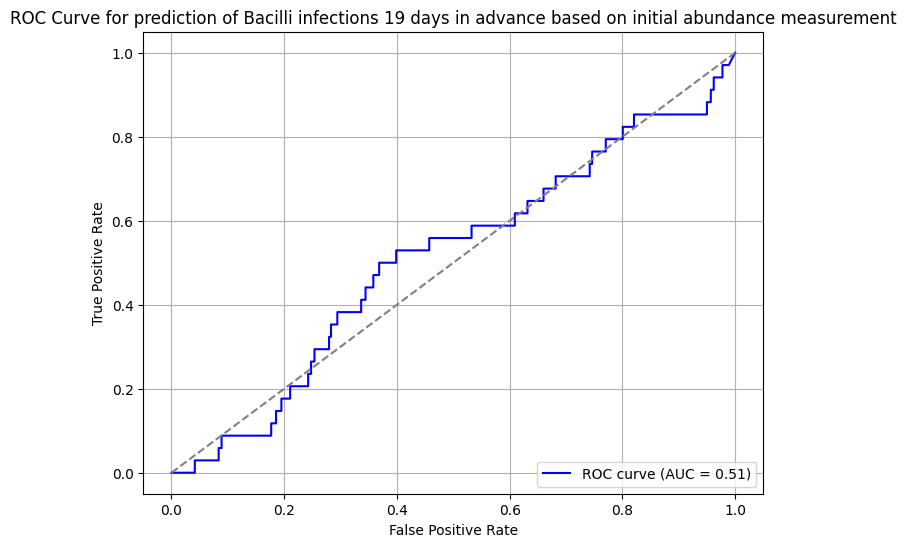

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


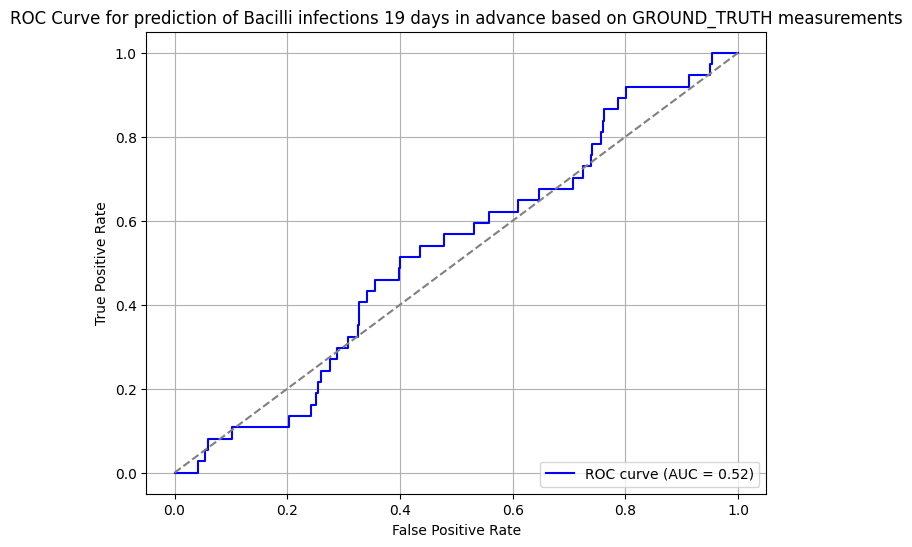

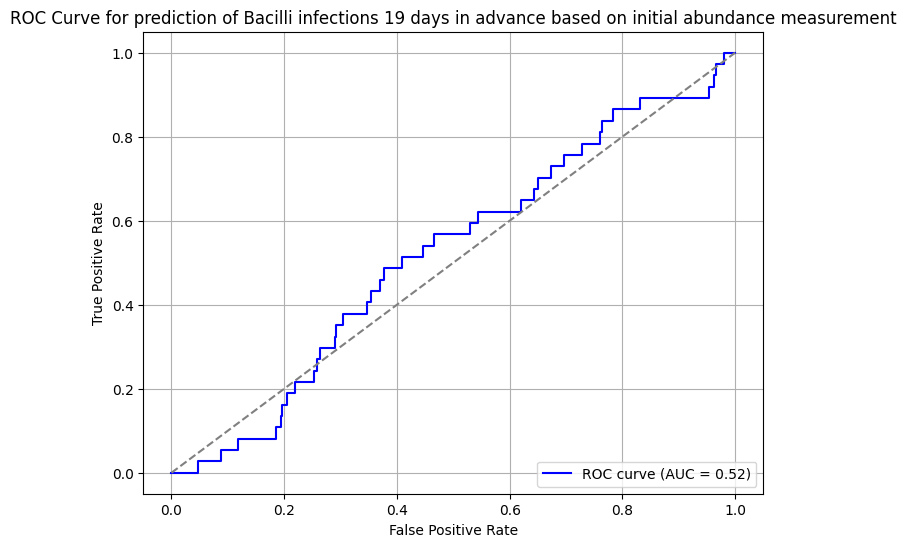

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


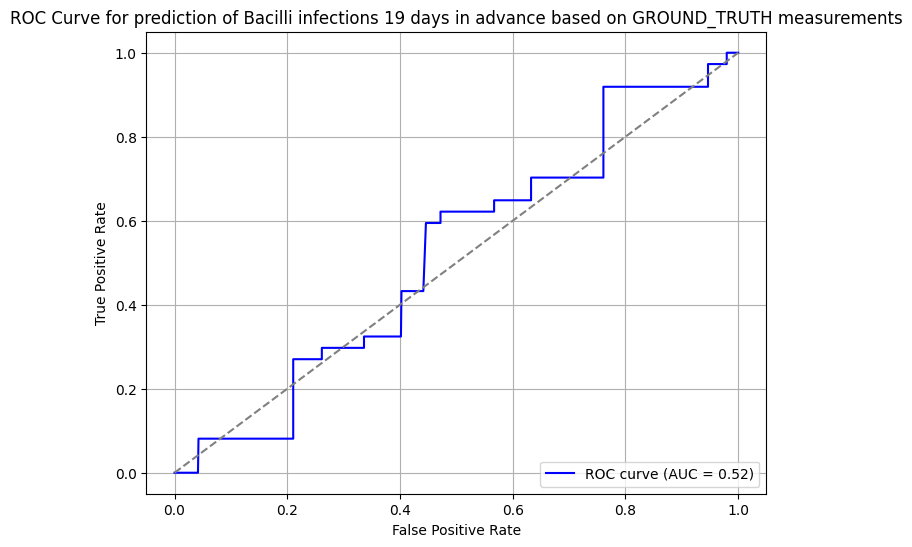

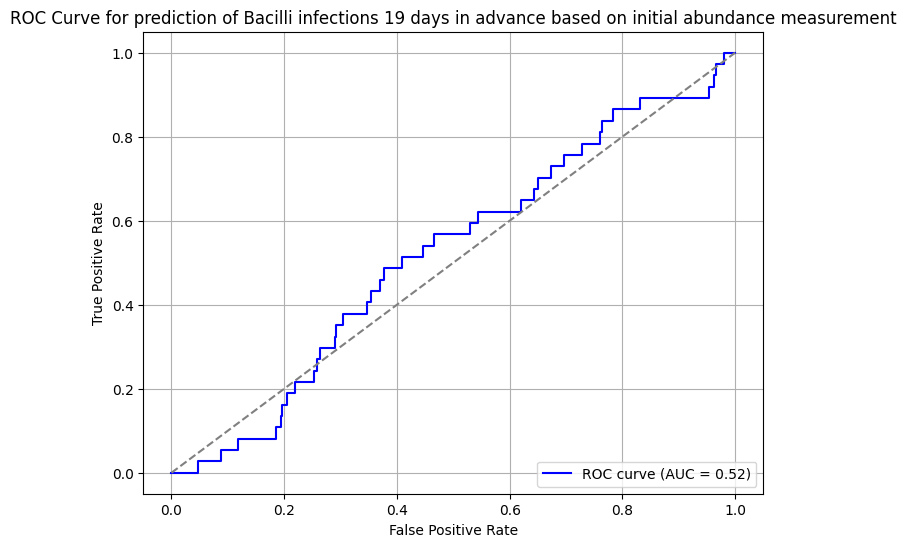

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


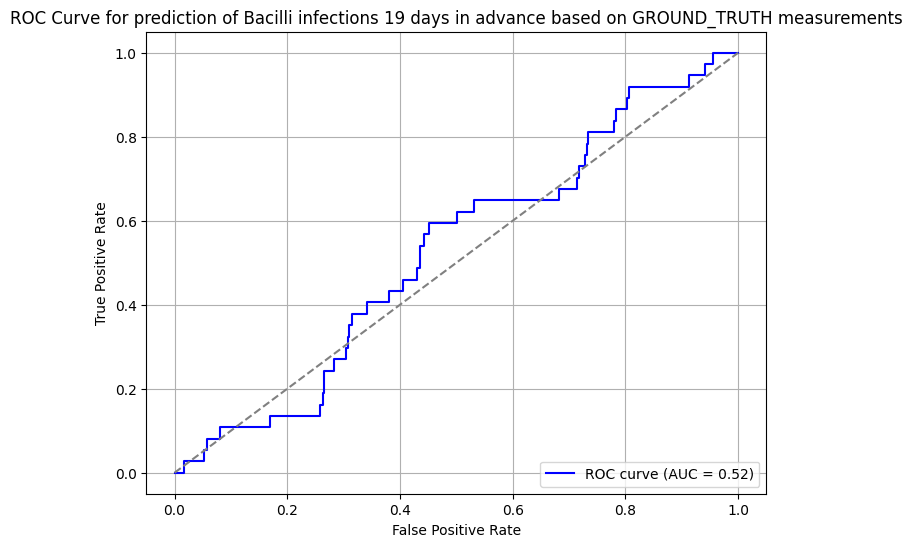

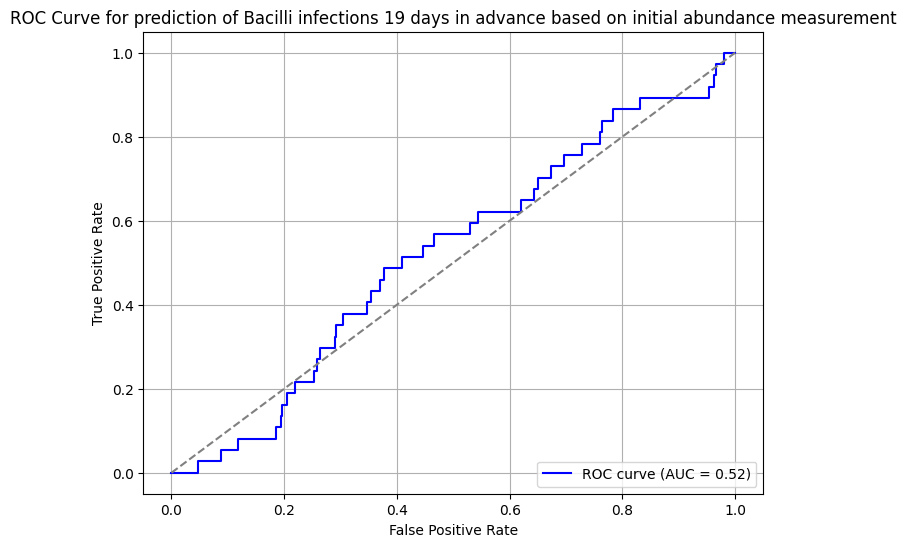

computing infection predictions...
plotting ROC curve...


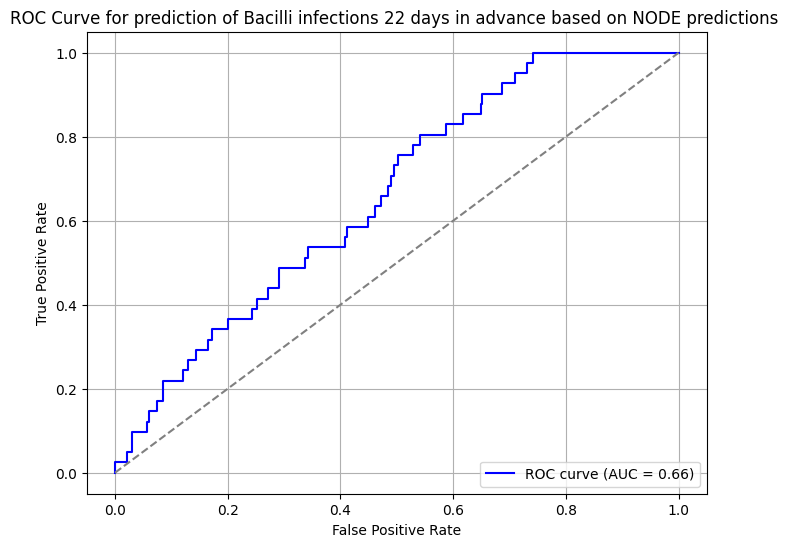

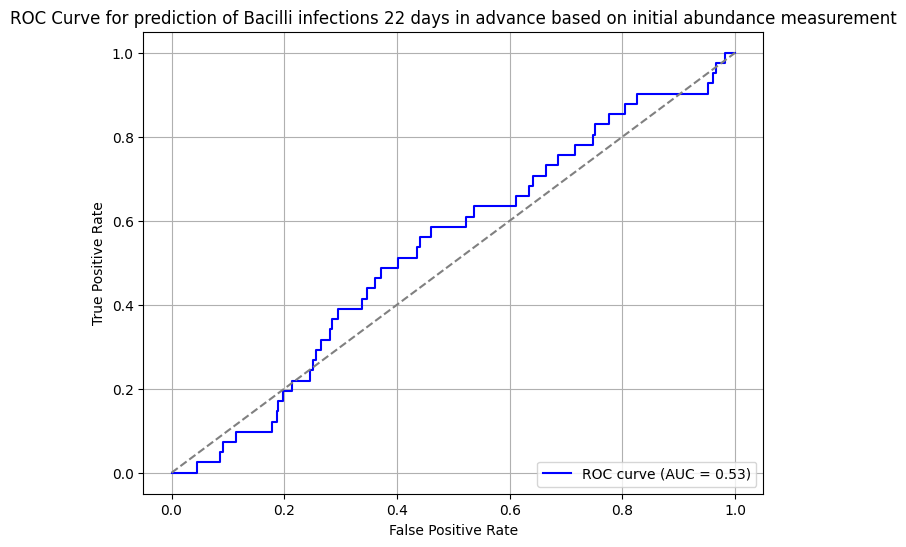

computing infection predictions...
plotting ROC curve...


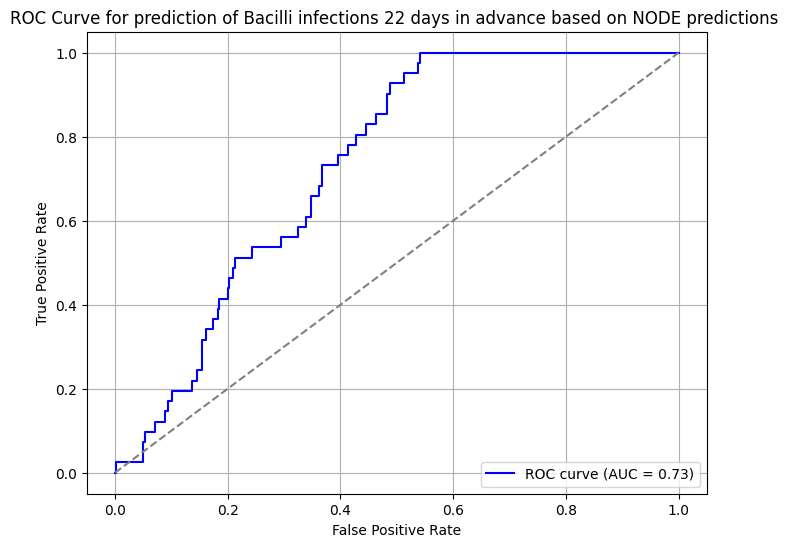

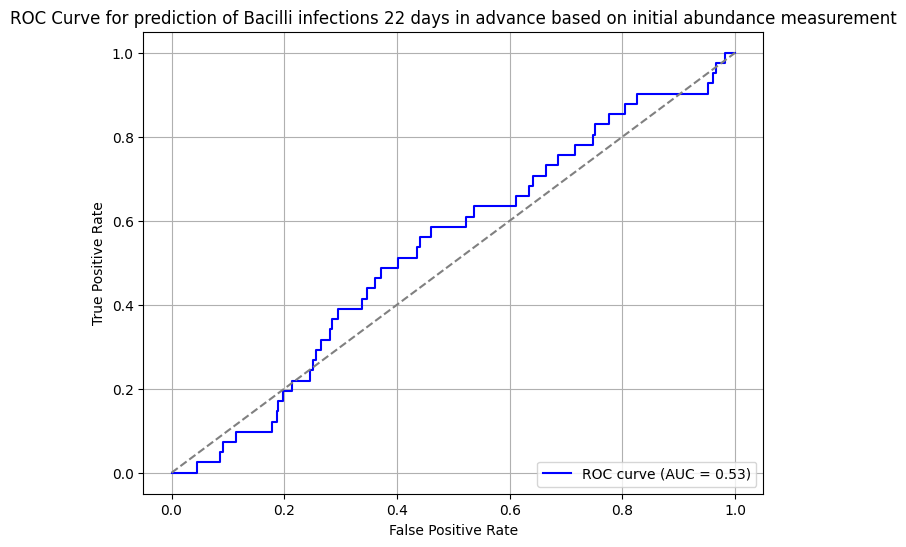

computing infection predictions...
plotting ROC curve...


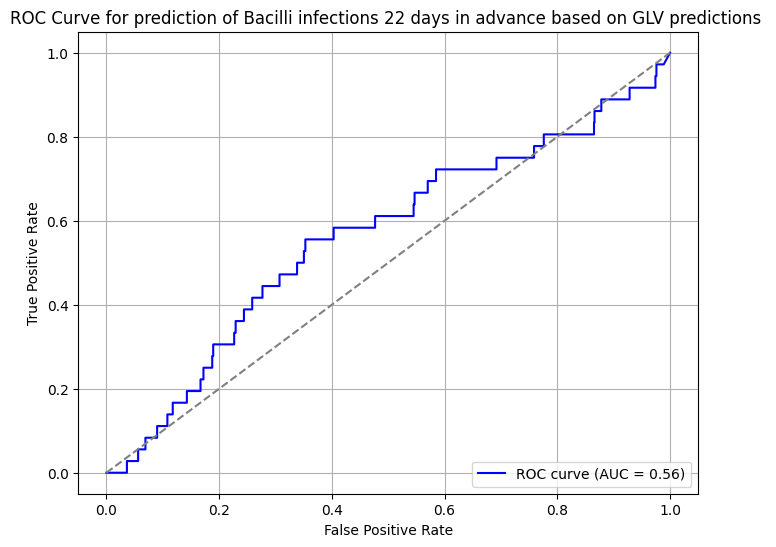

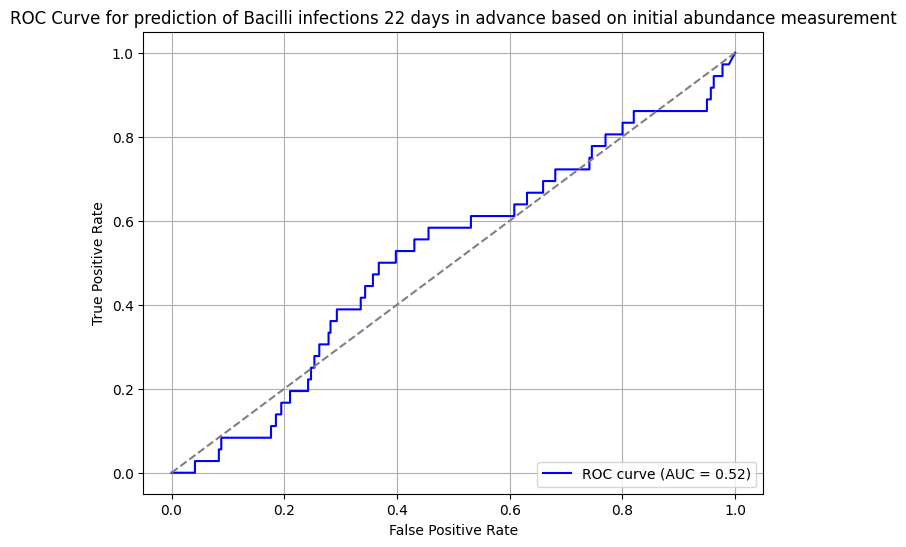

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


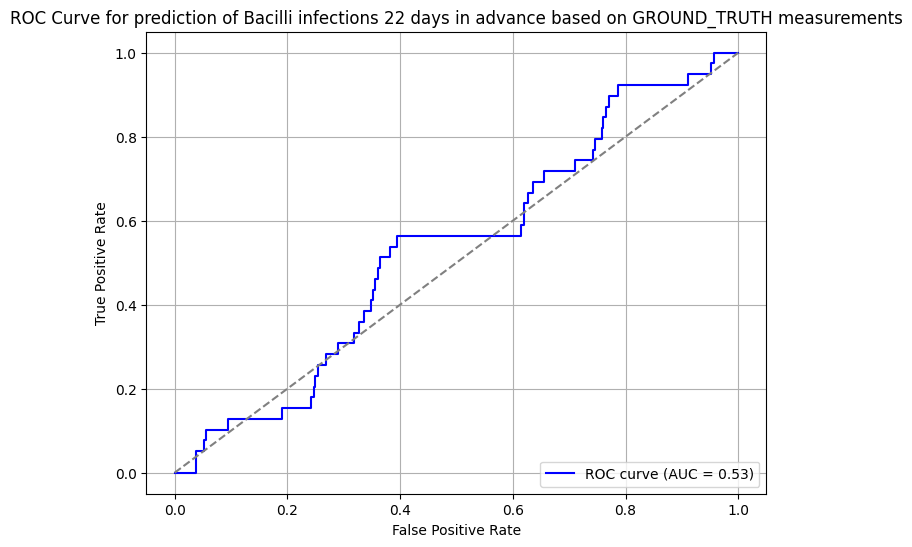

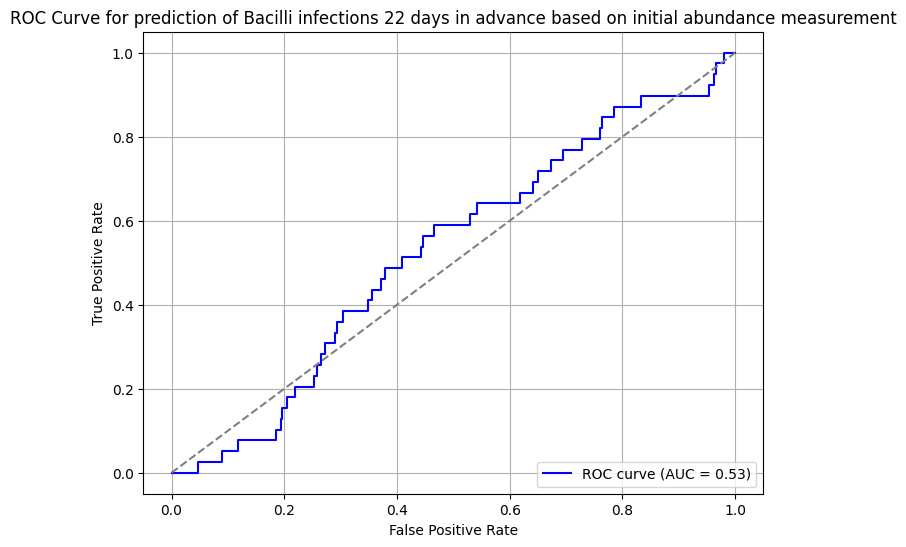

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


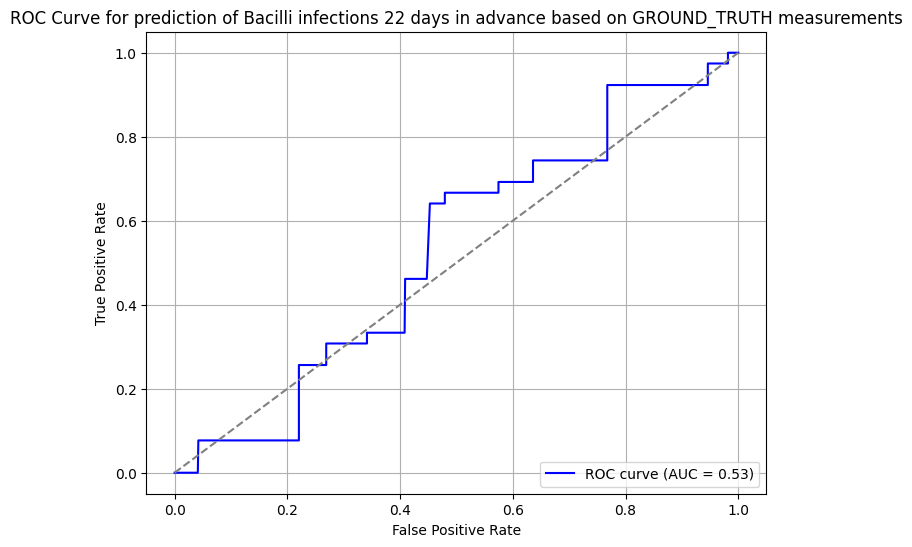

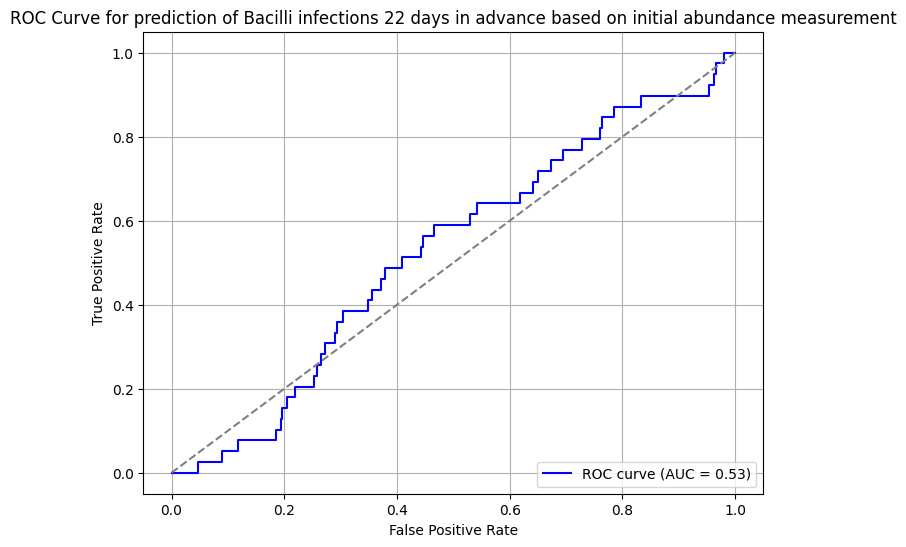

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


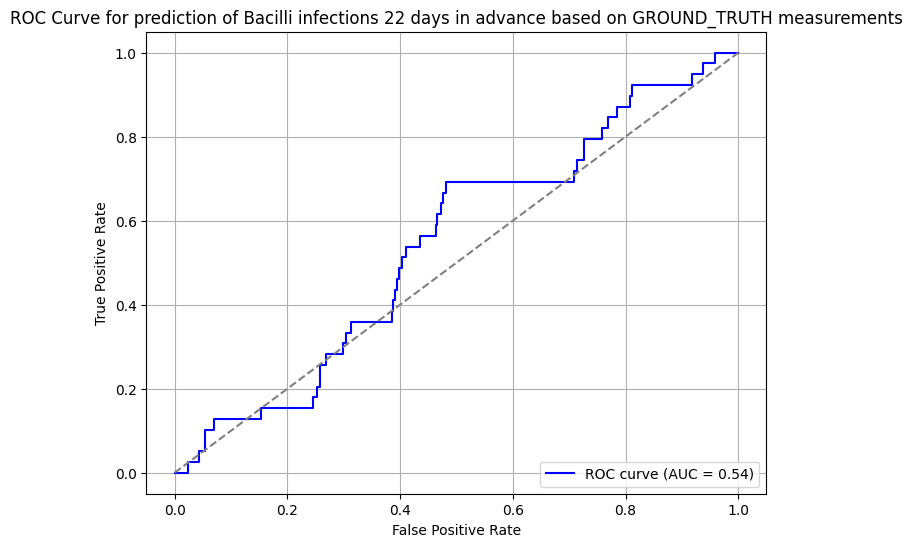

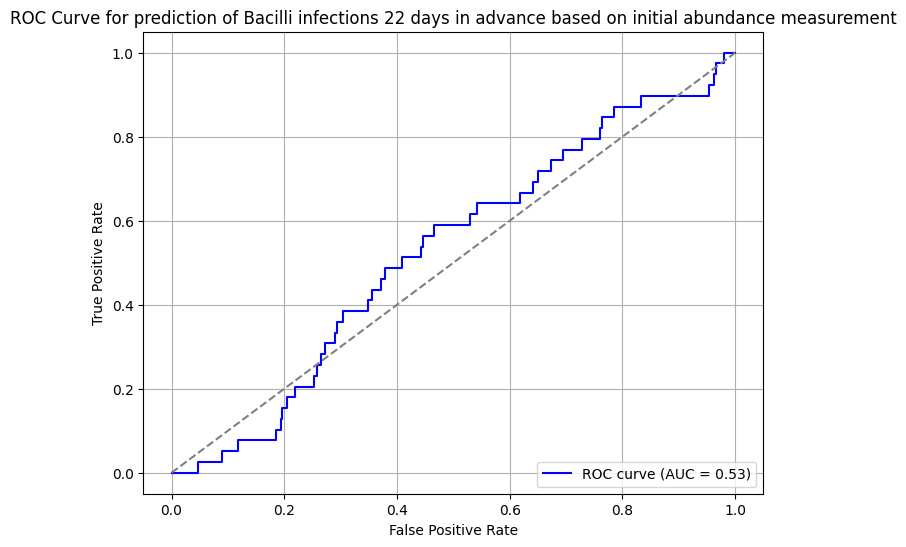

computing infection predictions...
plotting ROC curve...


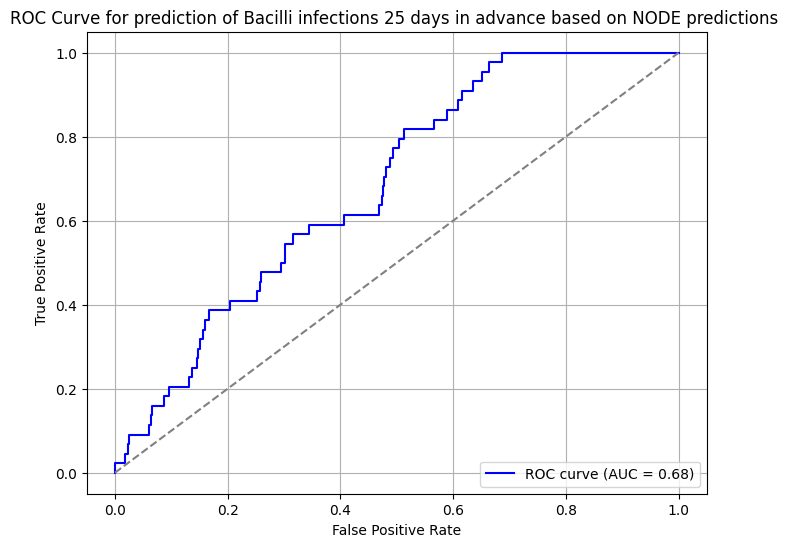

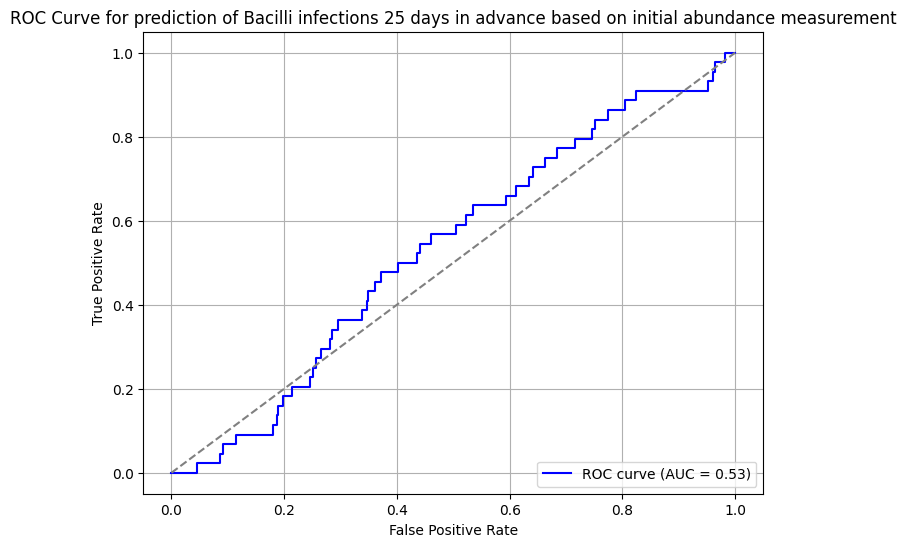

computing infection predictions...
plotting ROC curve...


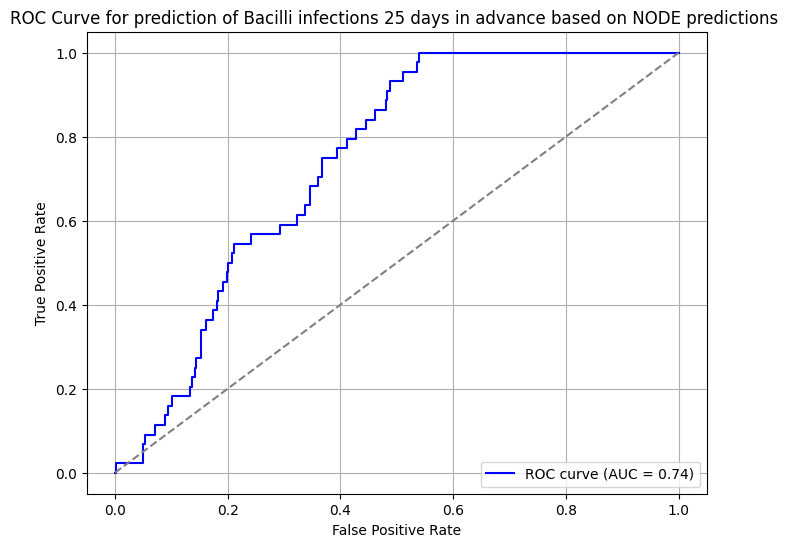

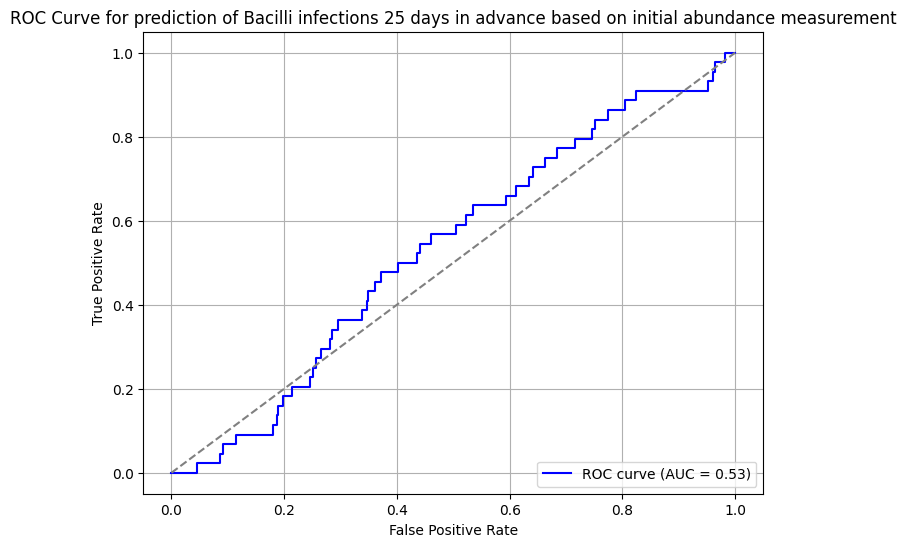

computing infection predictions...
plotting ROC curve...


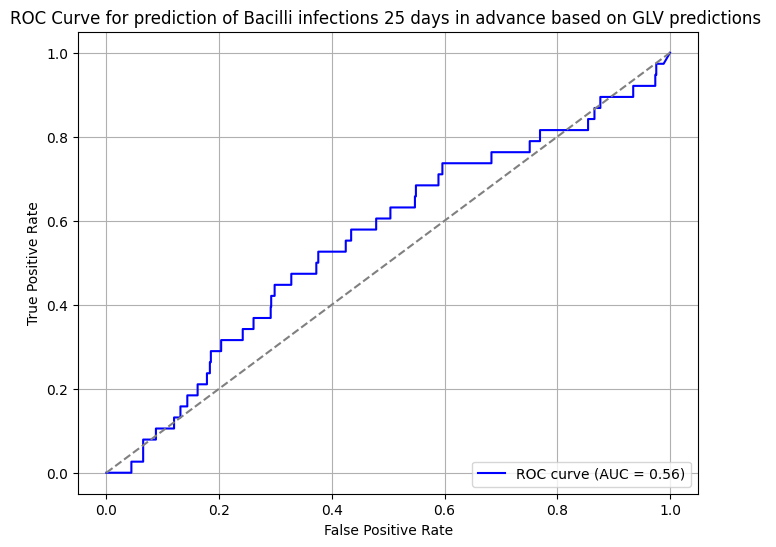

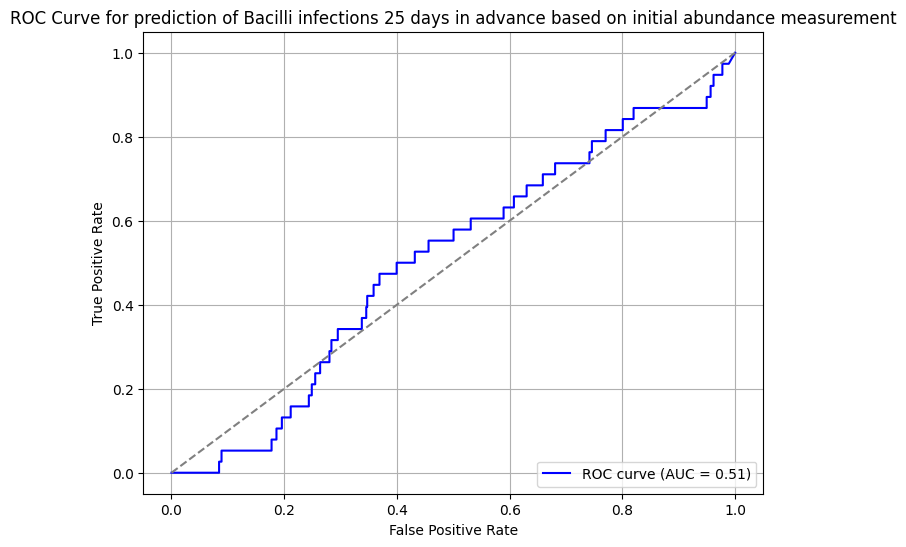

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


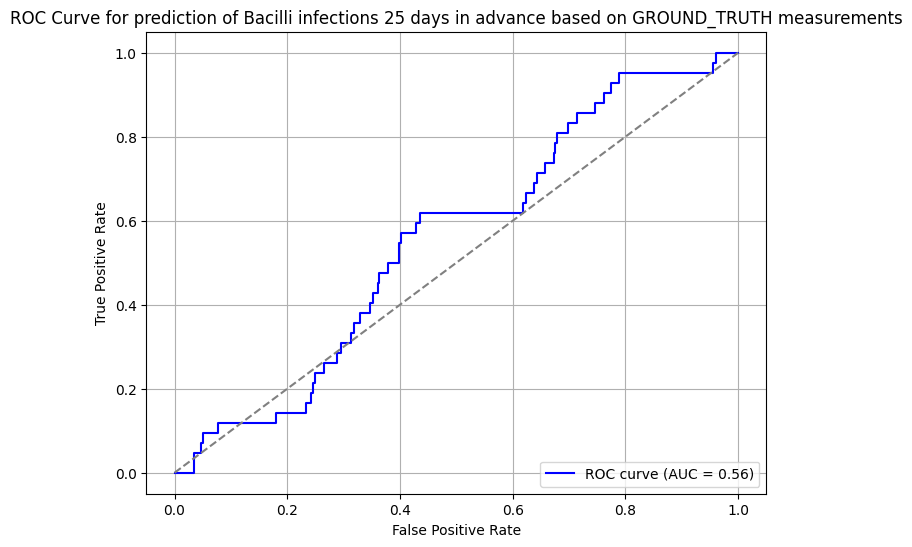

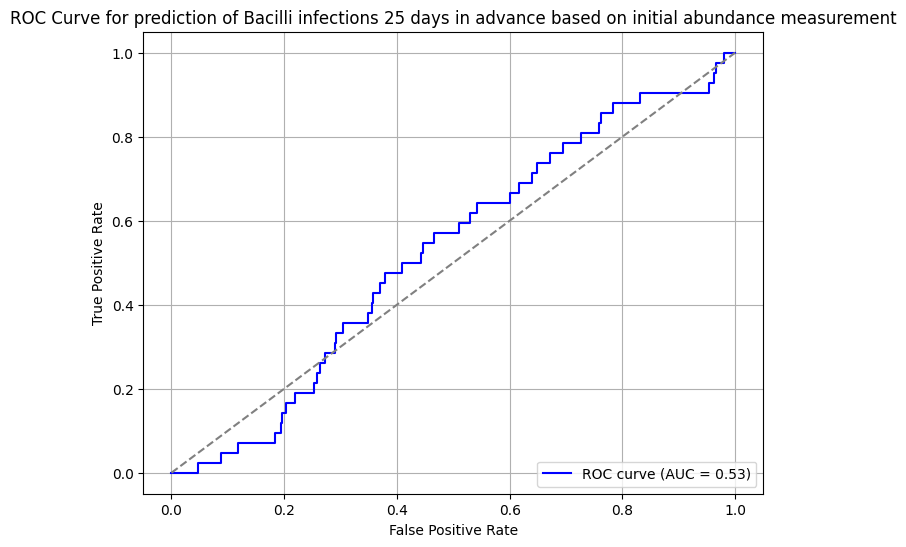

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


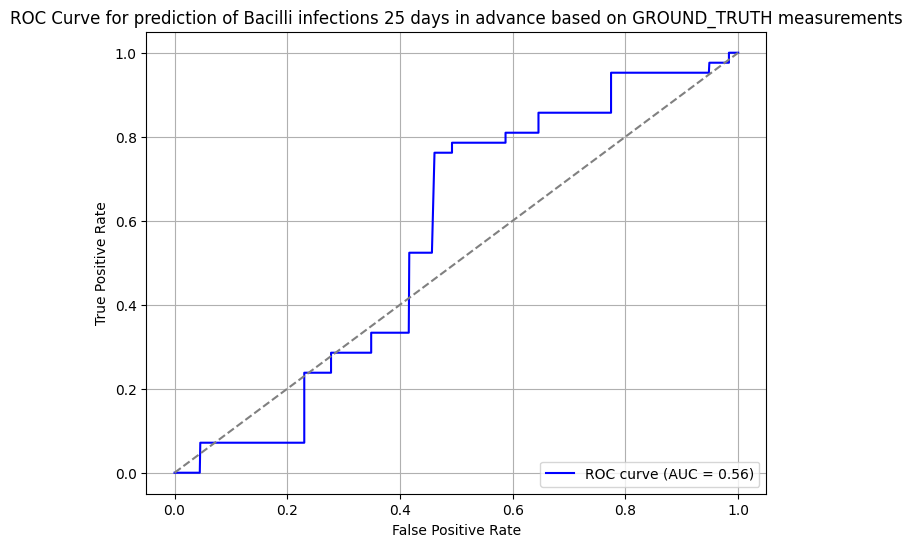

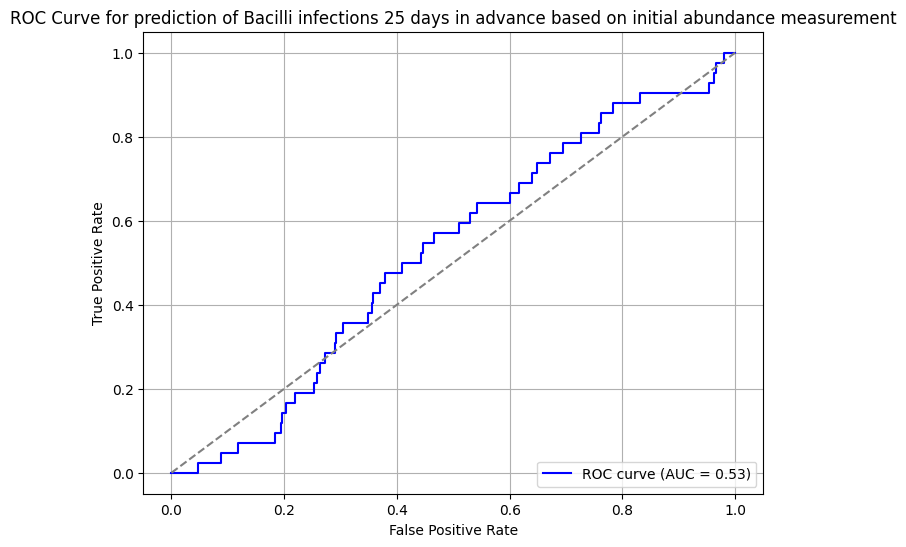

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


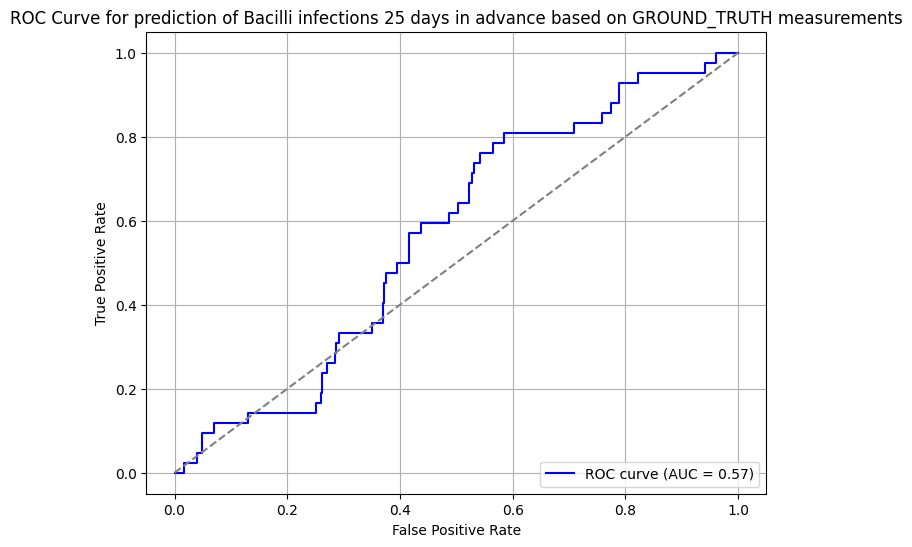

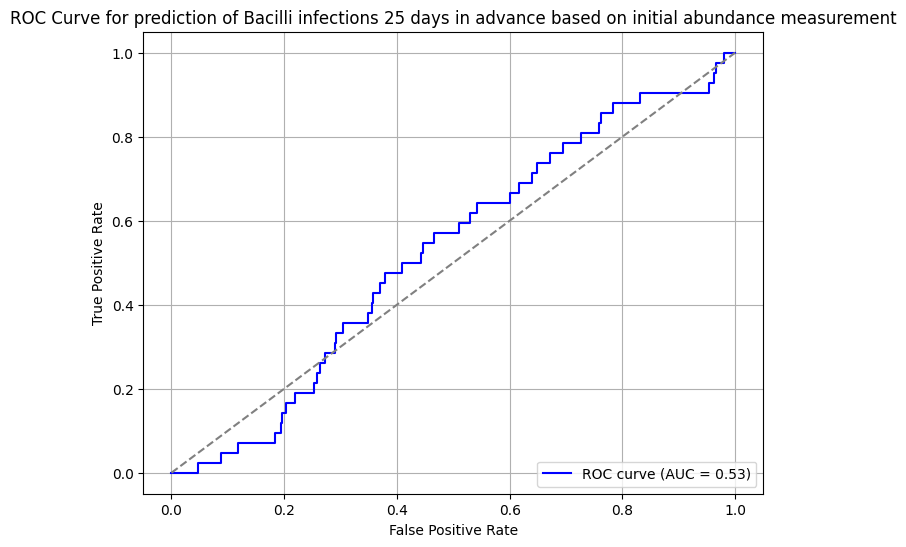

computing infection predictions...
plotting ROC curve...


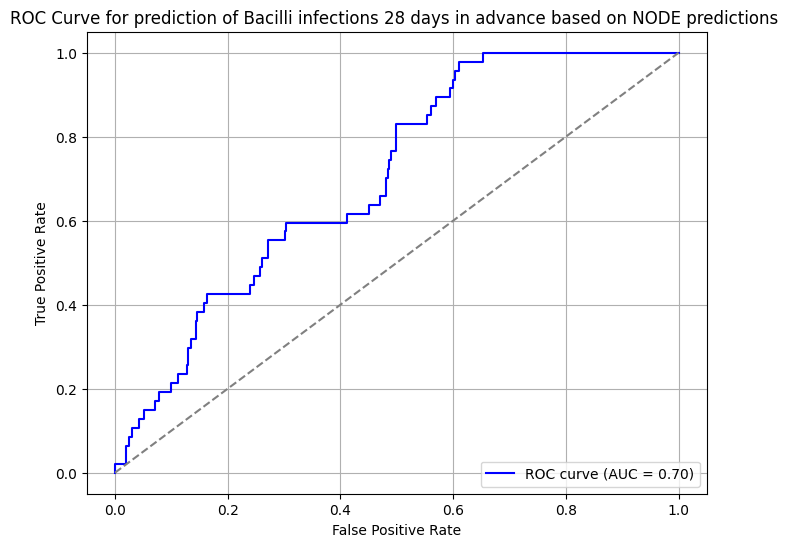

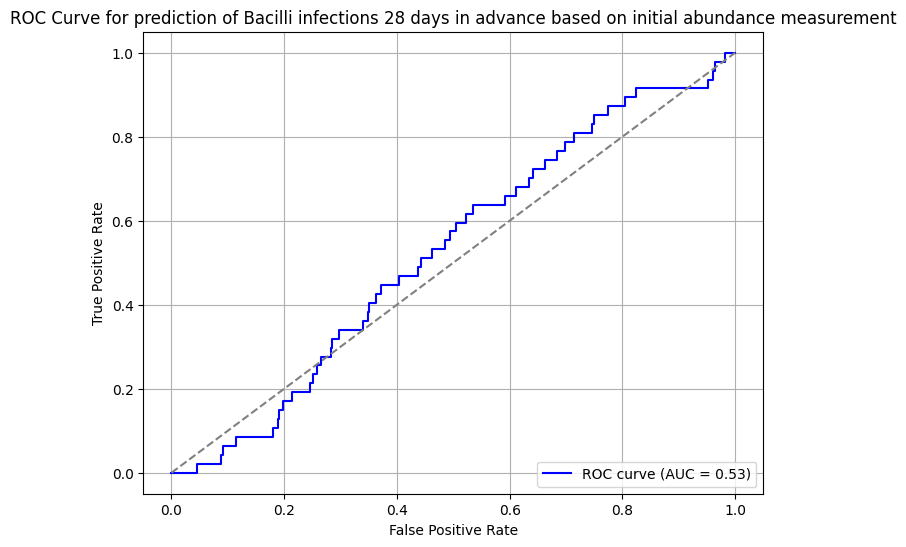

computing infection predictions...
plotting ROC curve...


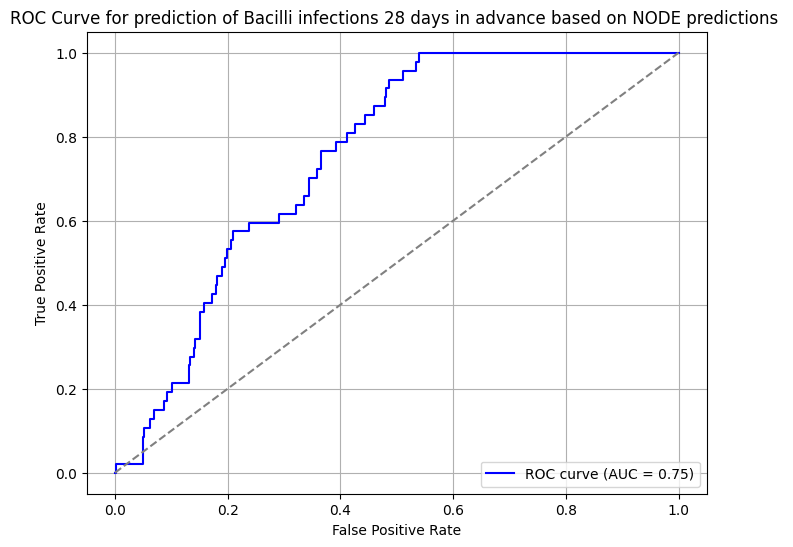

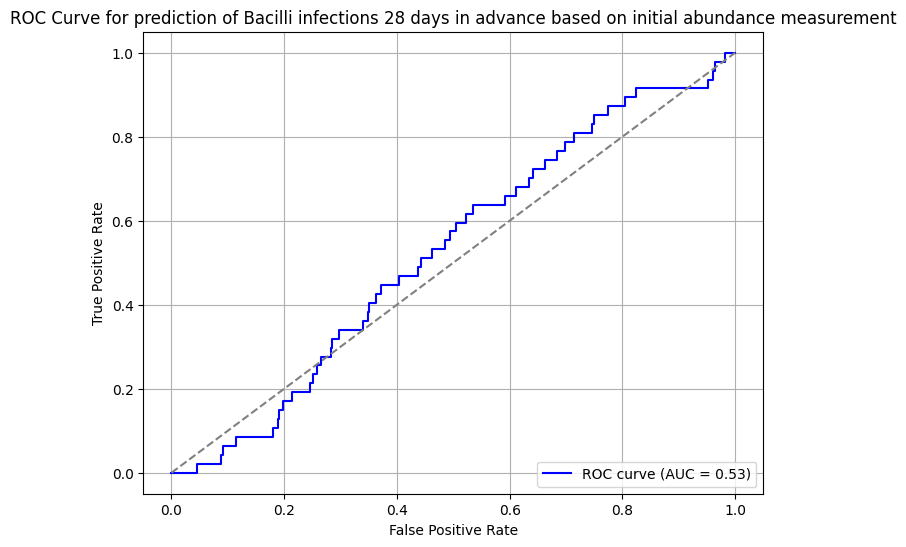

computing infection predictions...
plotting ROC curve...


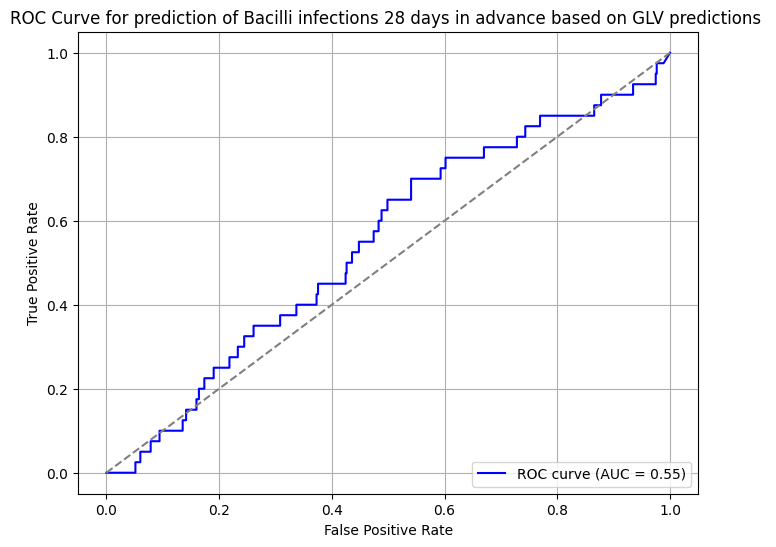

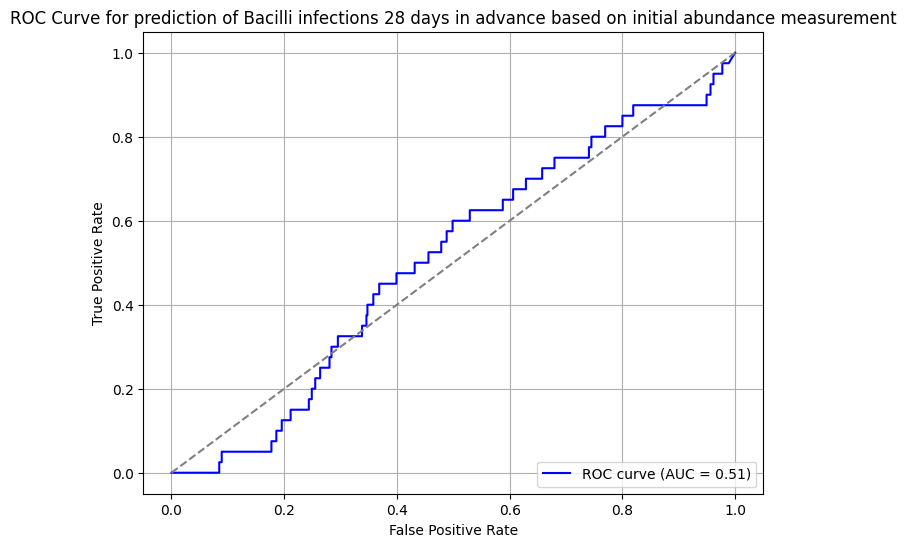

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


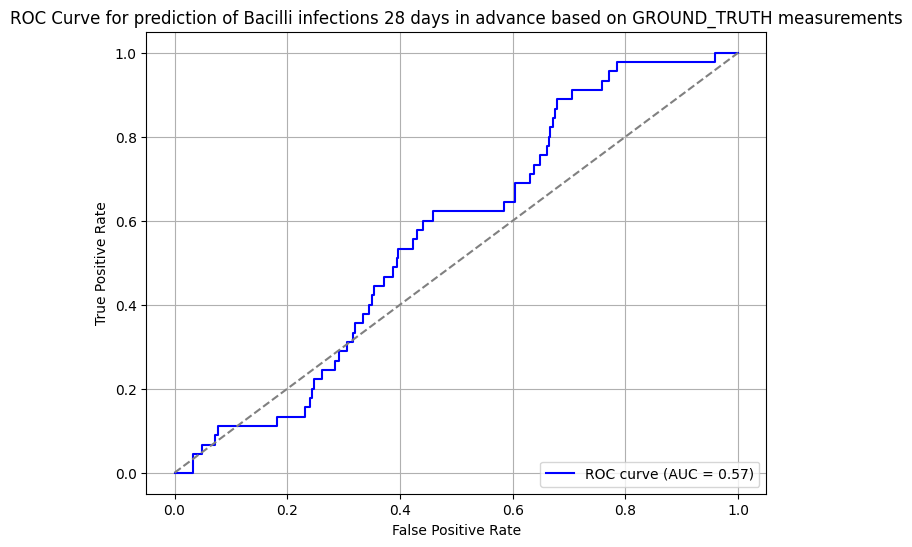

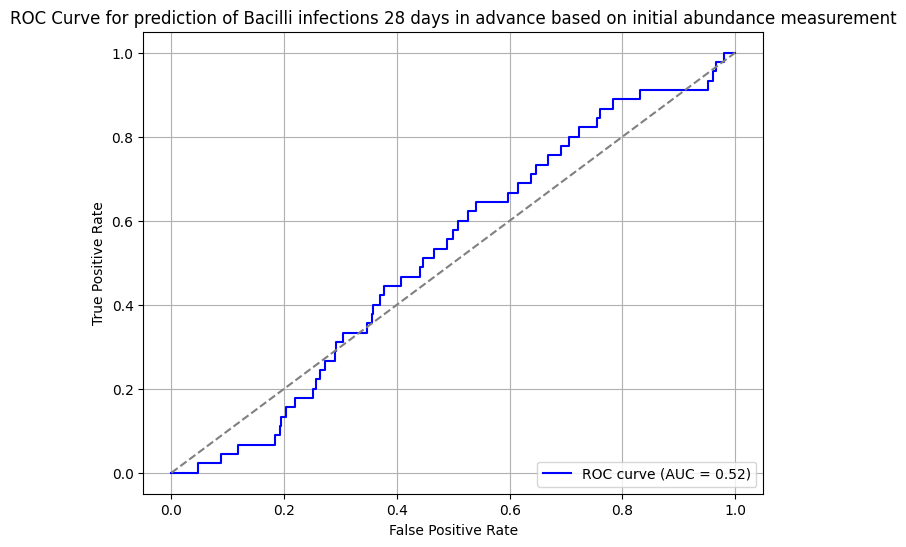

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


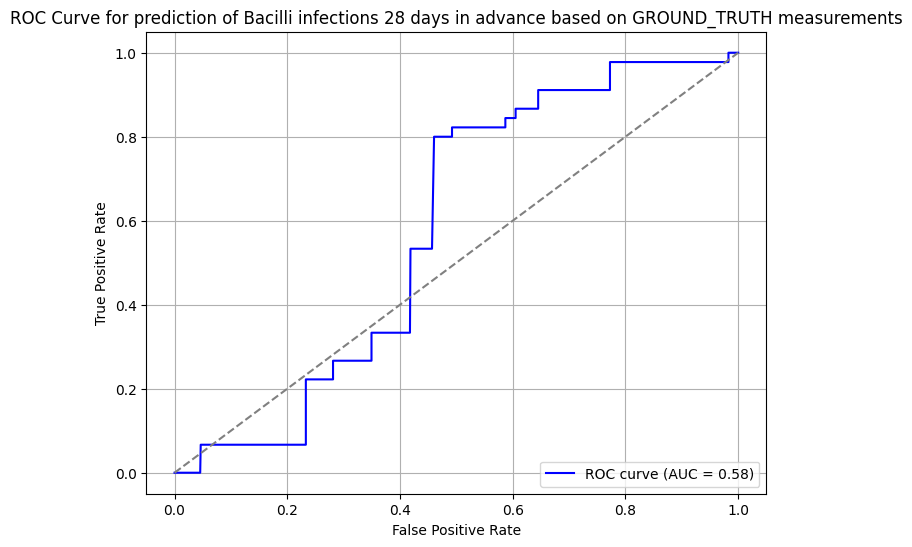

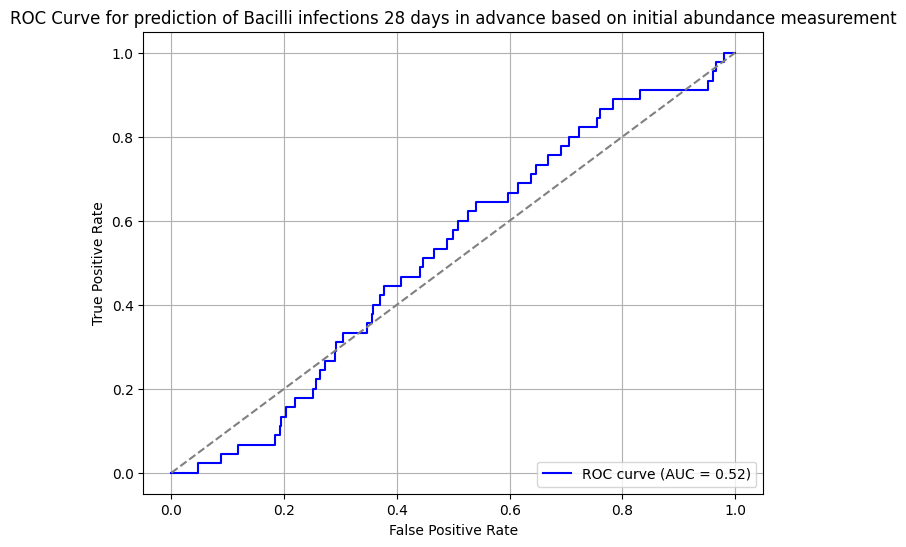

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


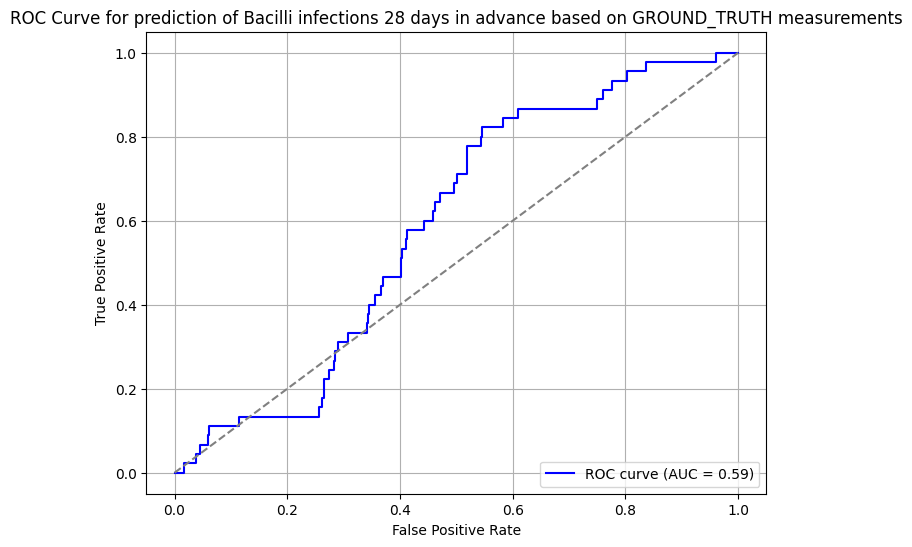

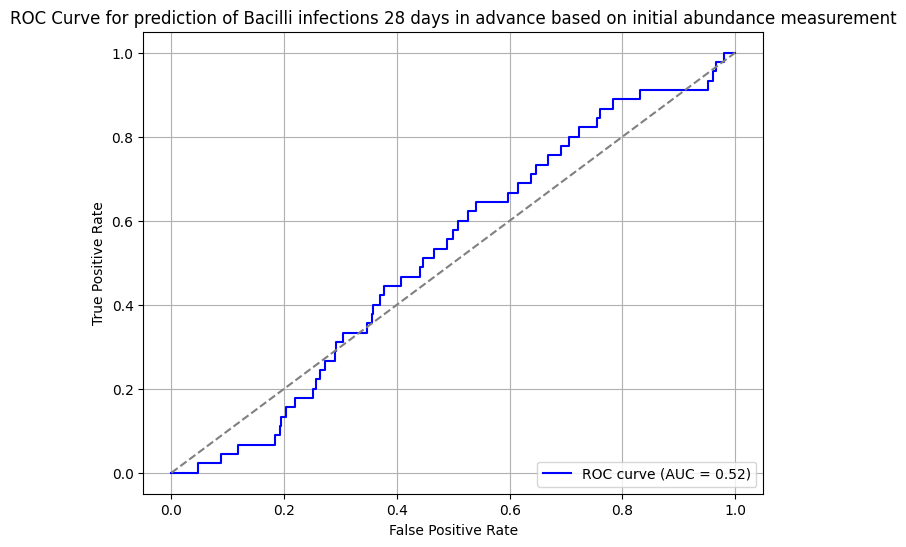

computing infection predictions...
plotting ROC curve...


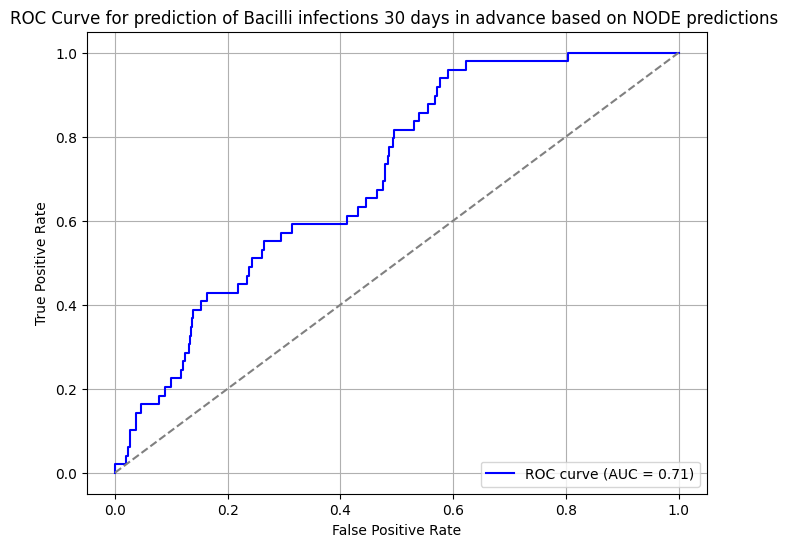

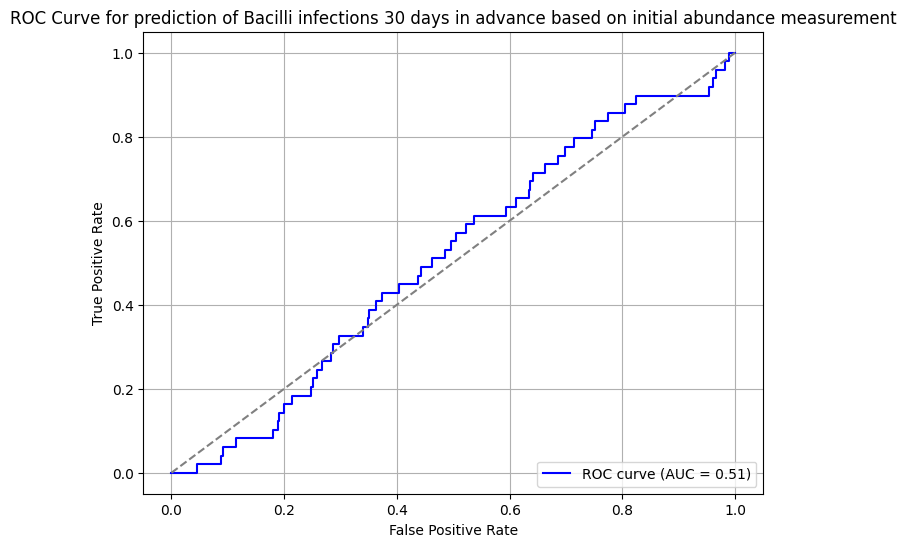

computing infection predictions...
plotting ROC curve...


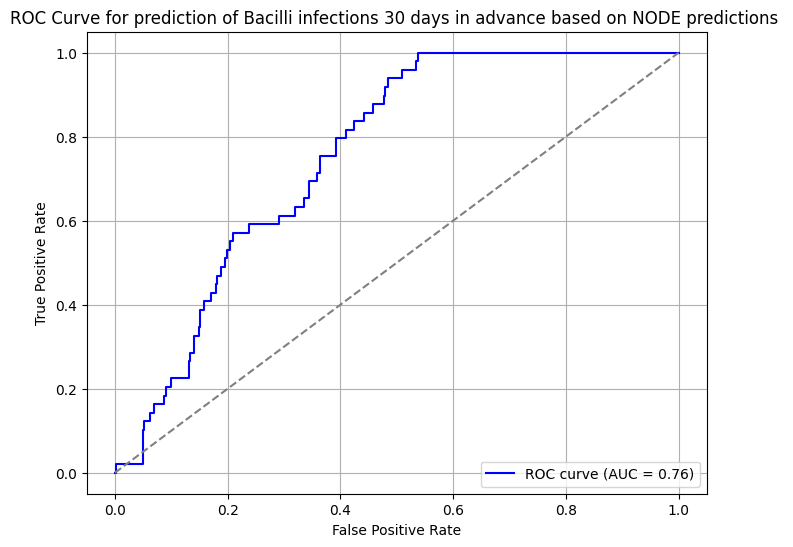

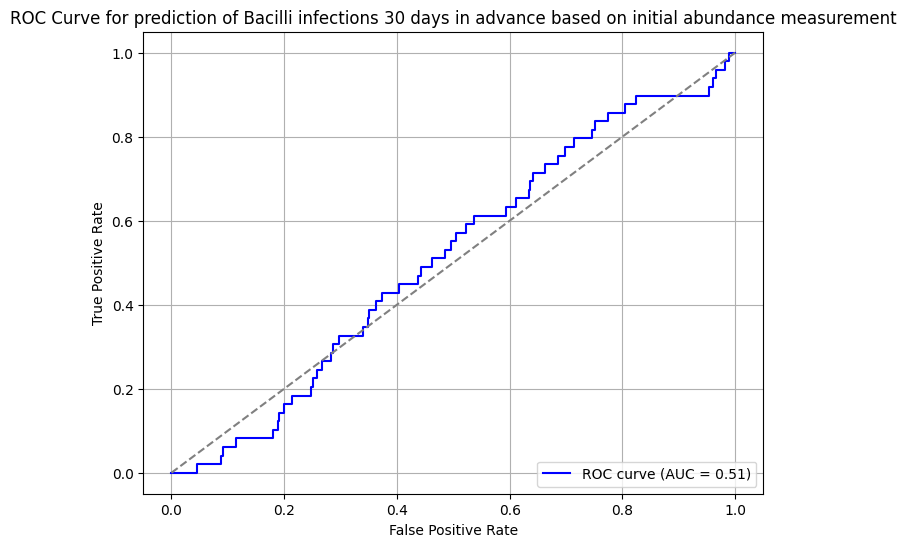

computing infection predictions...
plotting ROC curve...


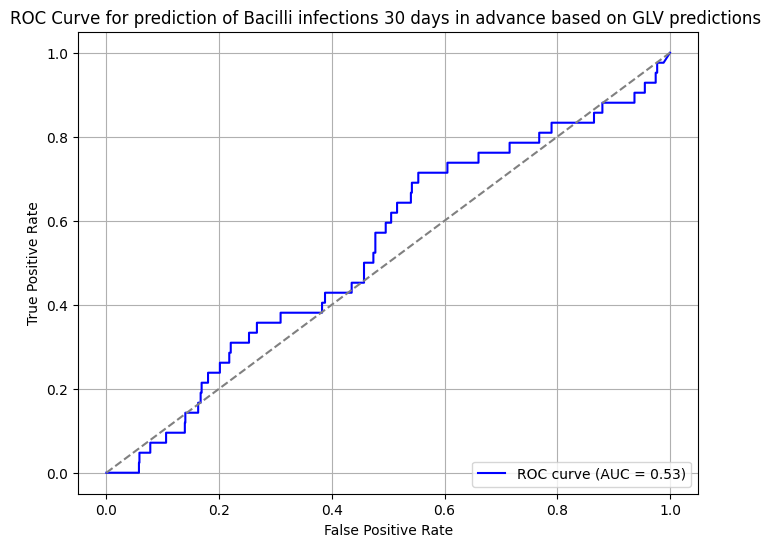

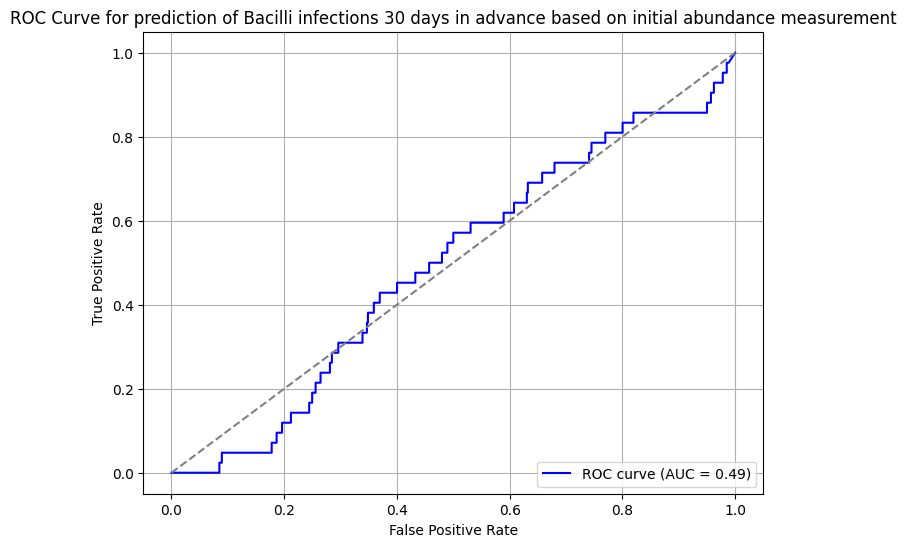

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


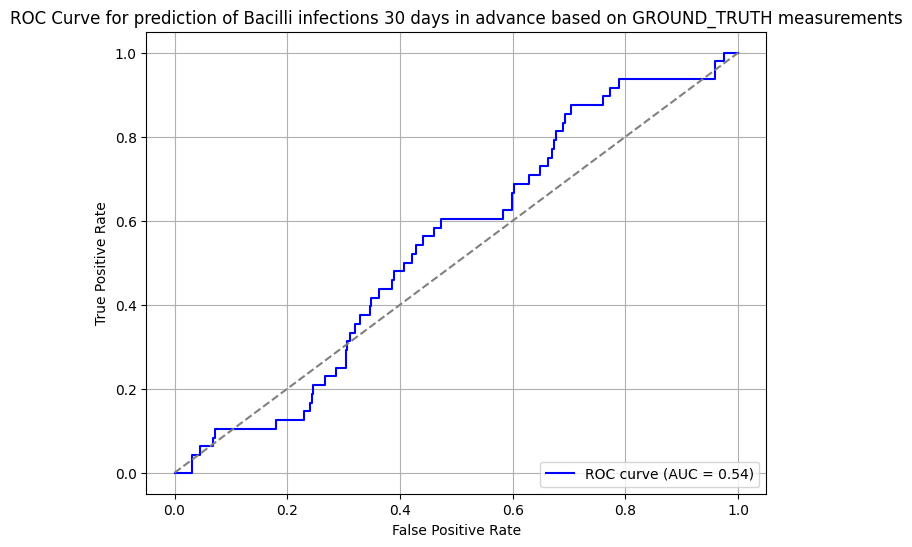

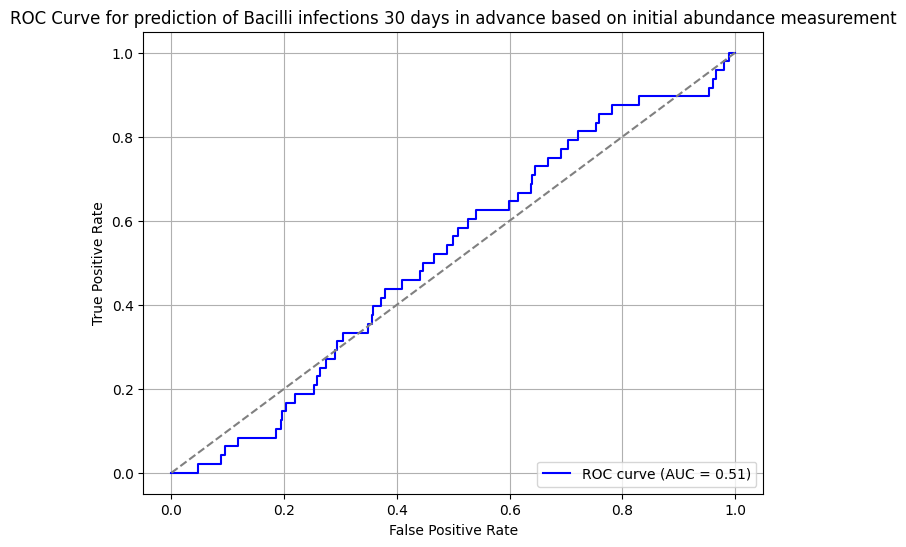

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


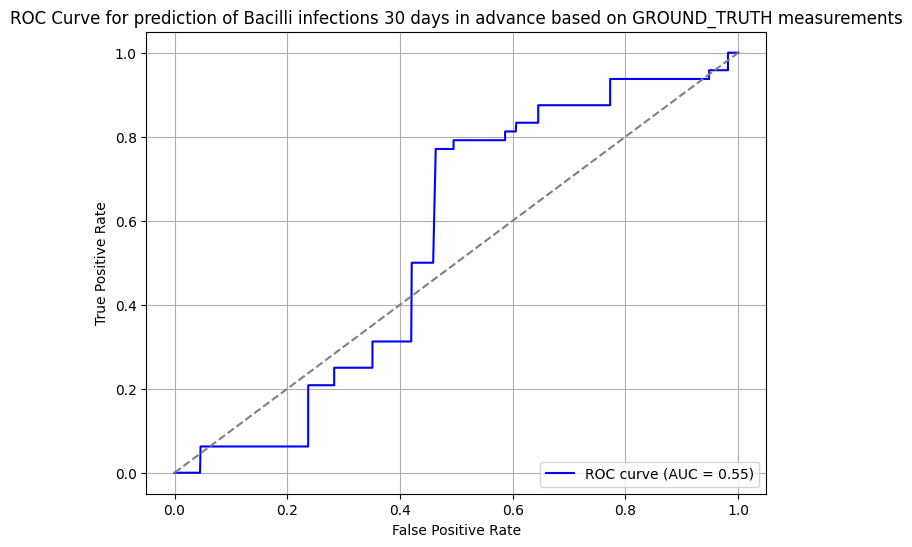

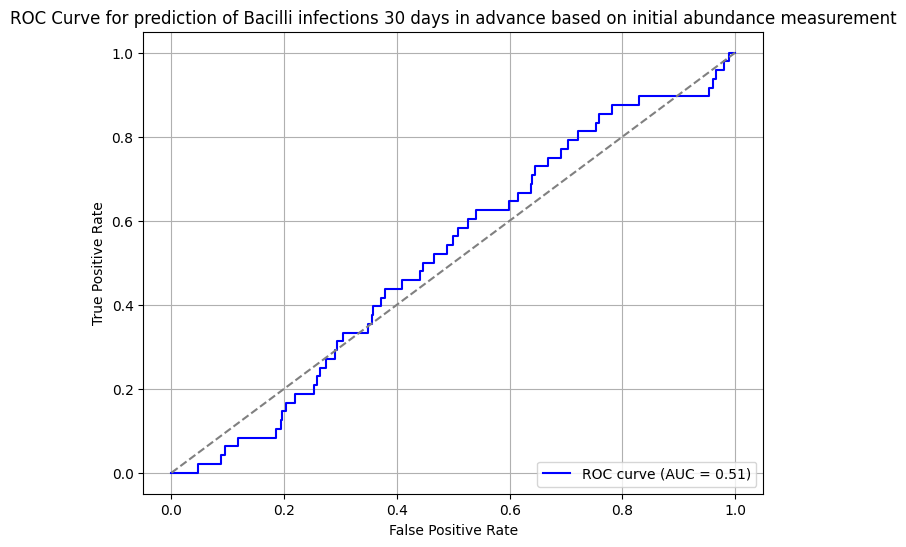

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


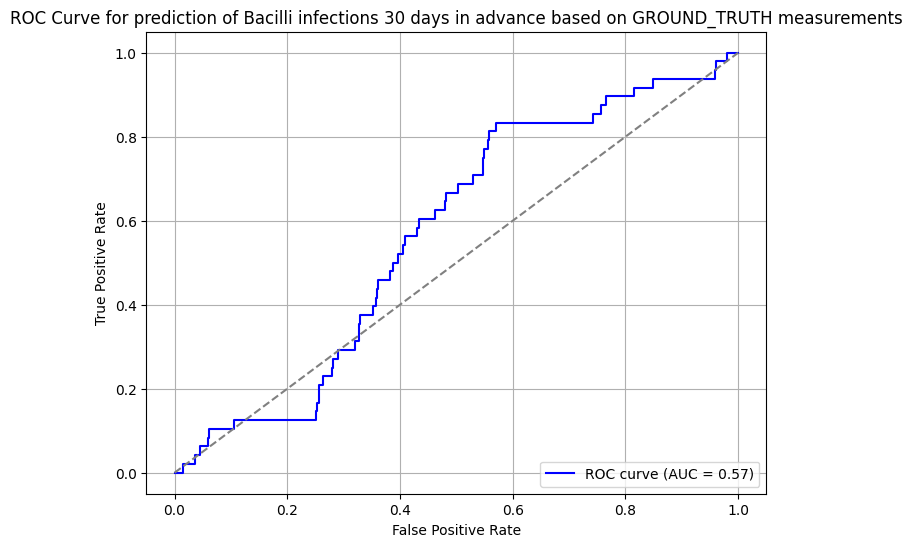

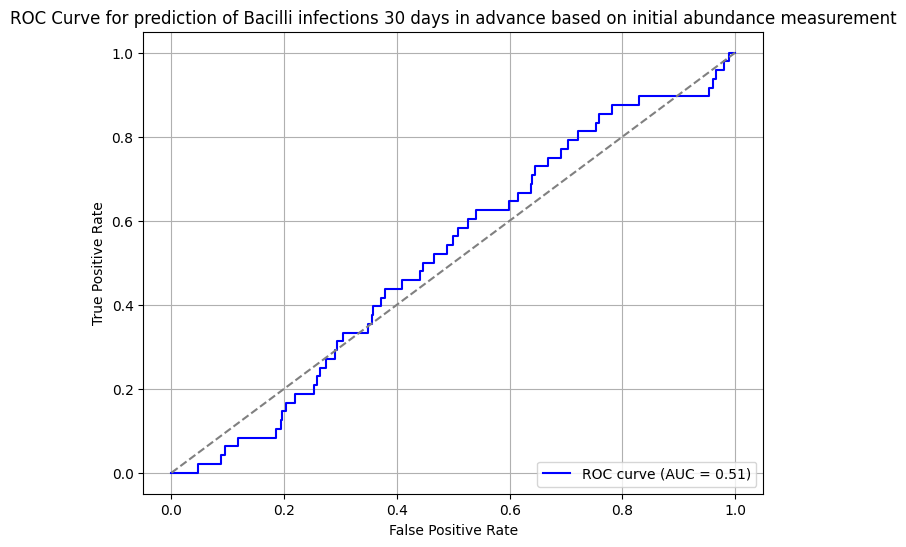

computing infection predictions...
plotting ROC curve...


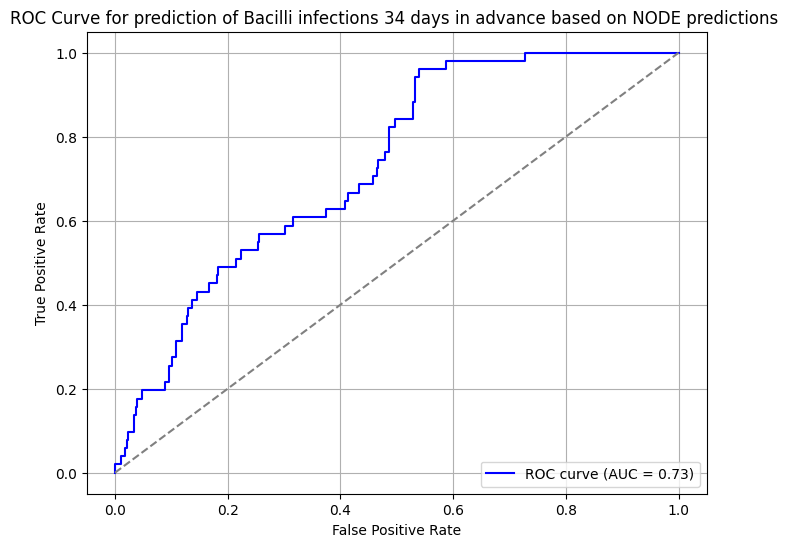

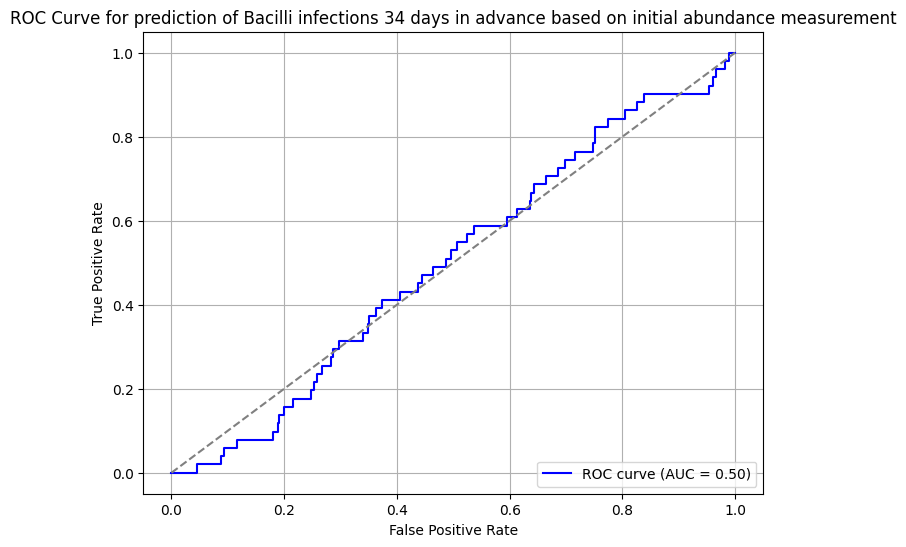

computing infection predictions...
plotting ROC curve...


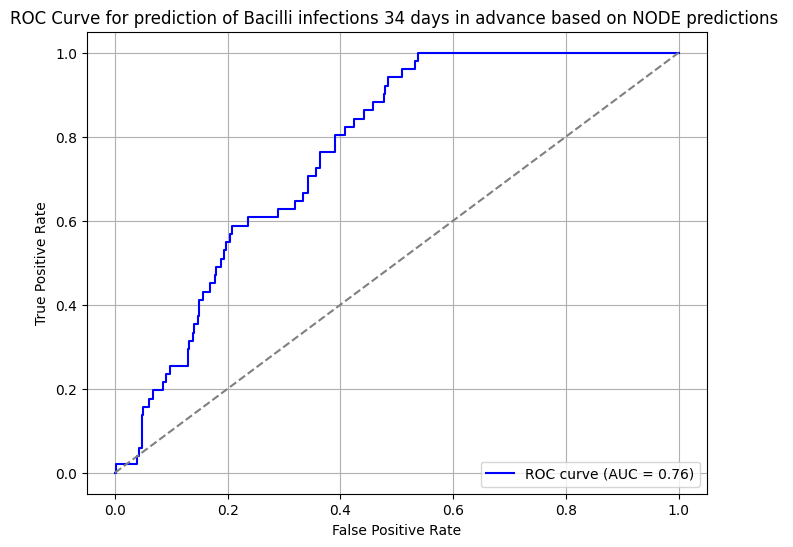

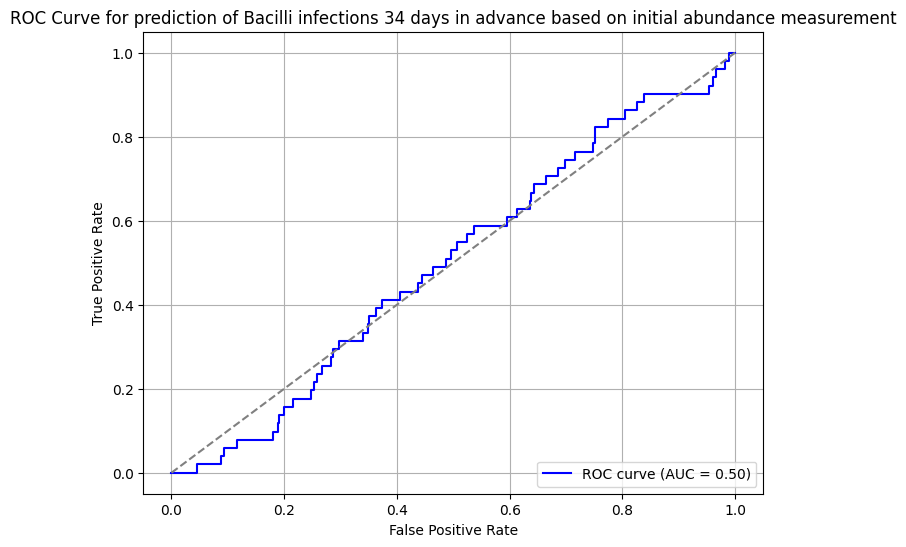

computing infection predictions...
plotting ROC curve...


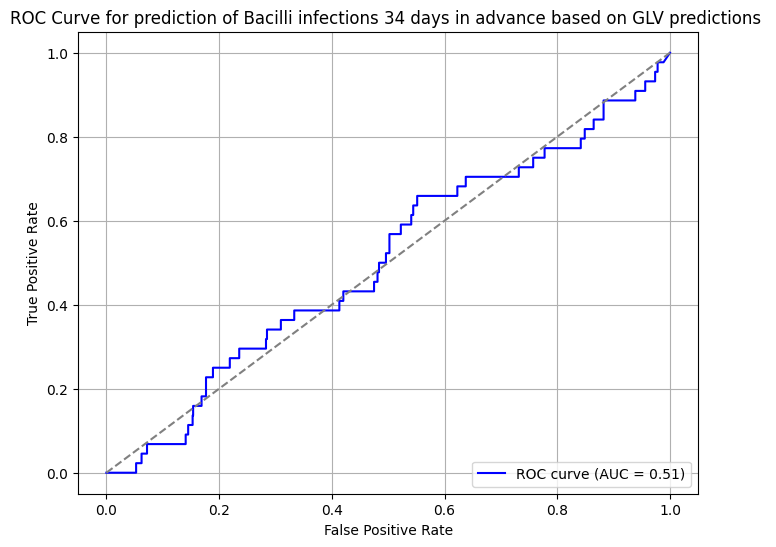

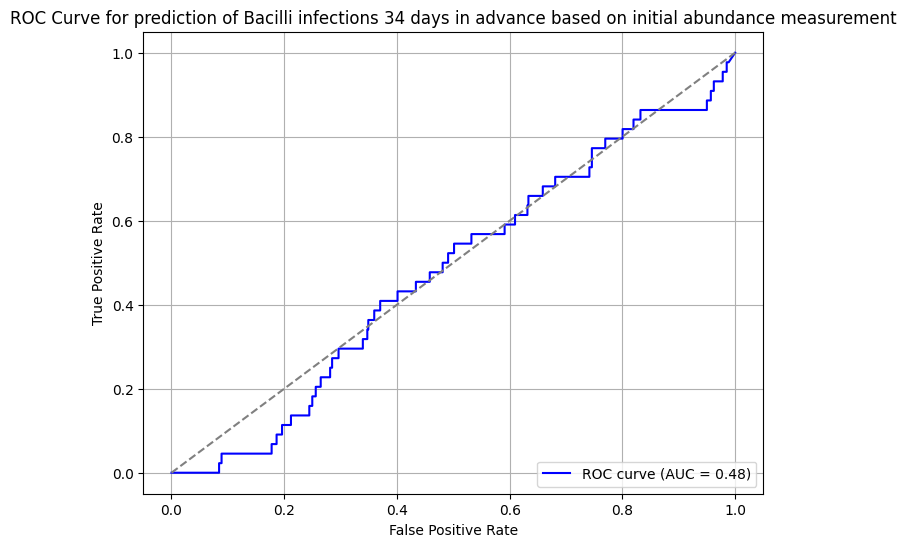

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


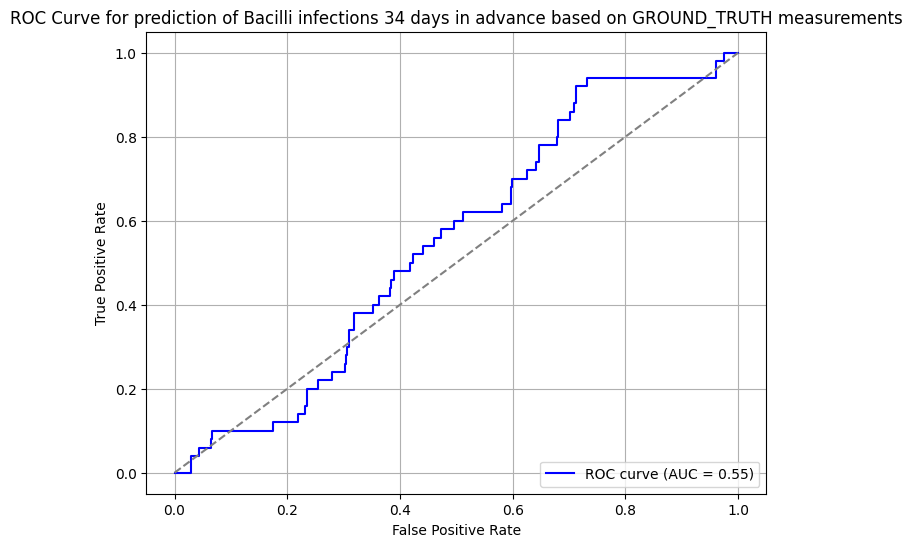

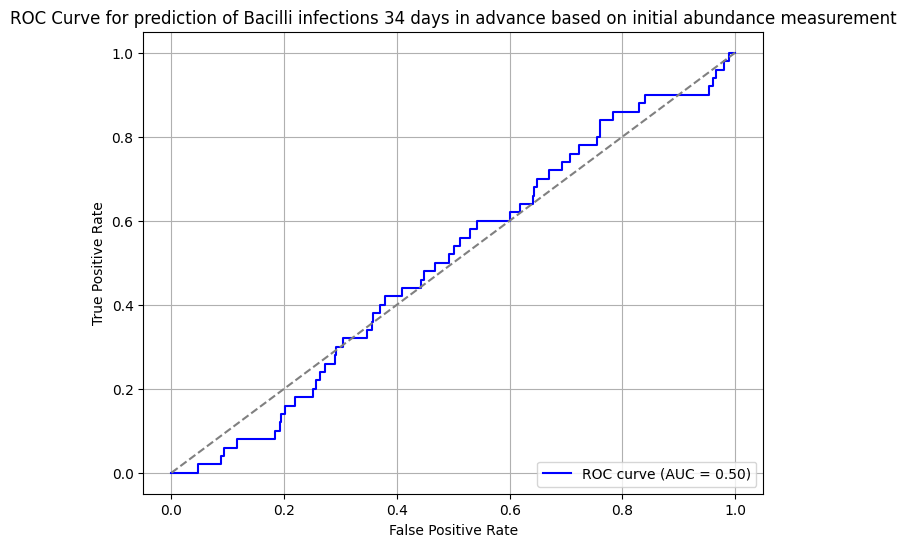

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


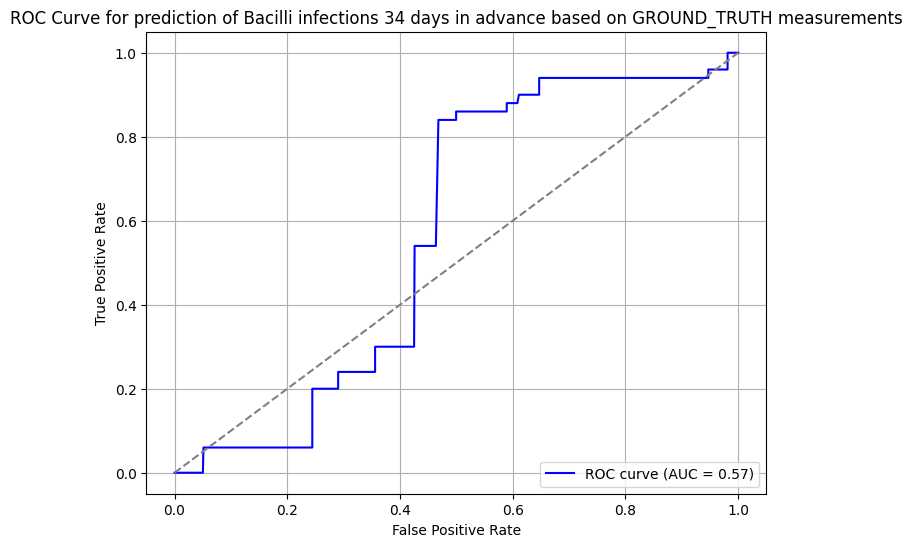

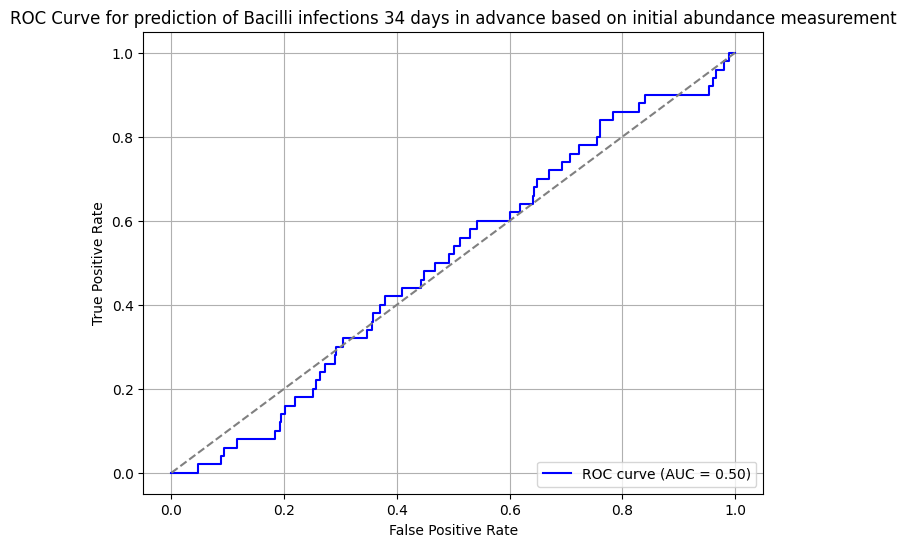

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


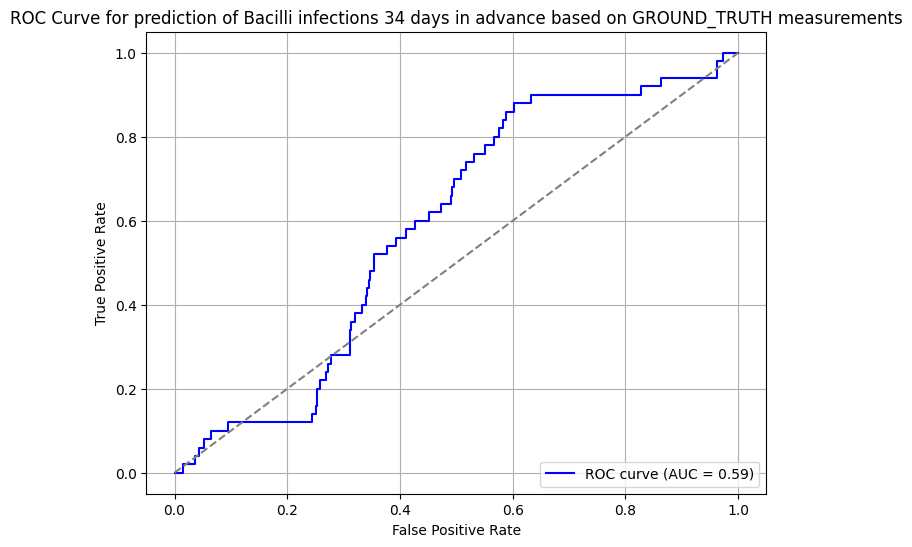

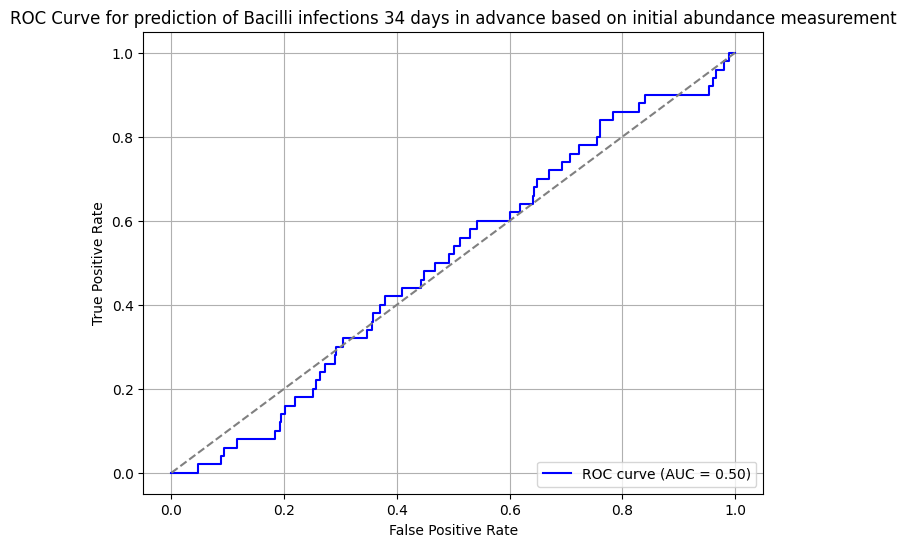

computing infection predictions...
plotting ROC curve...


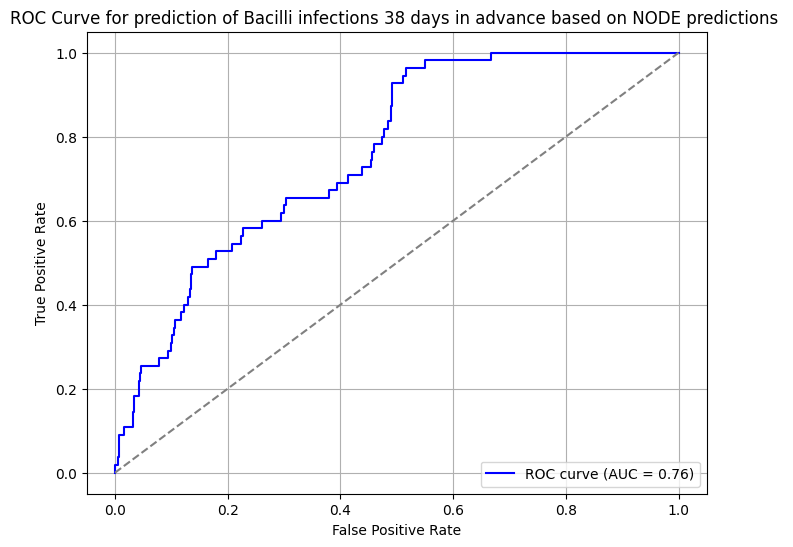

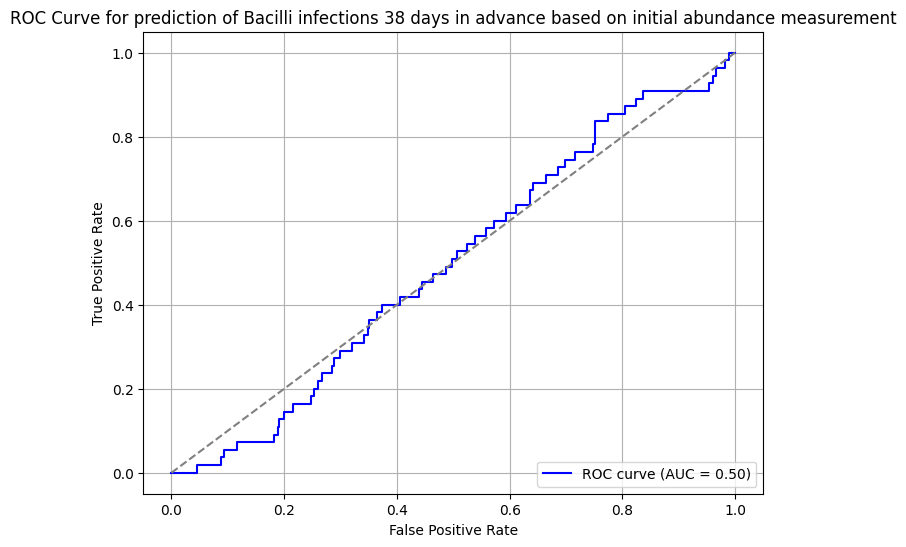

computing infection predictions...
plotting ROC curve...


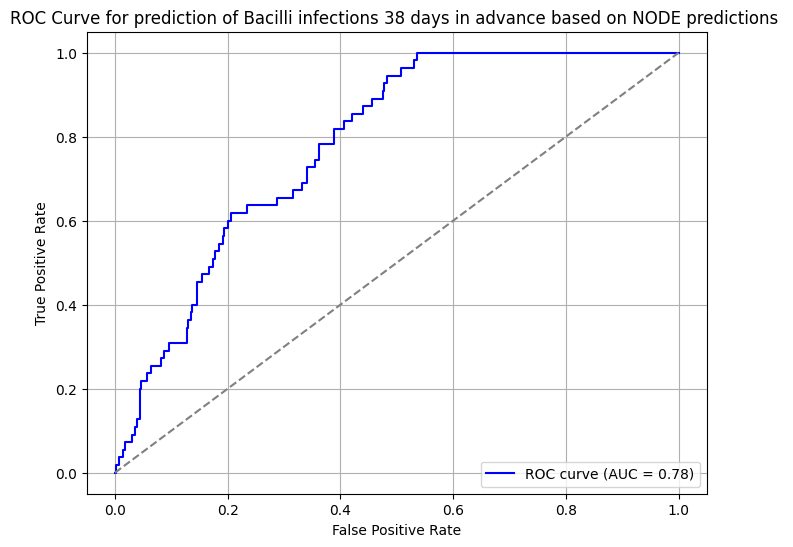

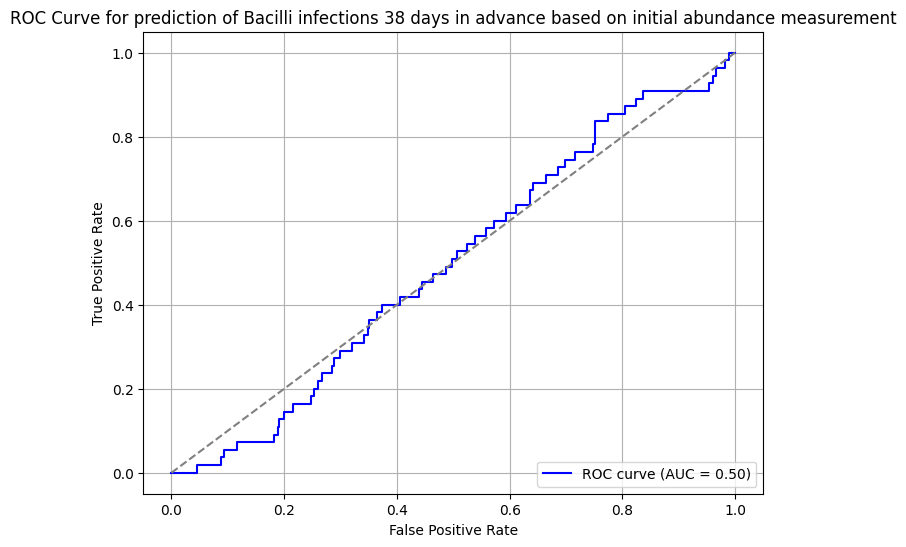

computing infection predictions...
plotting ROC curve...


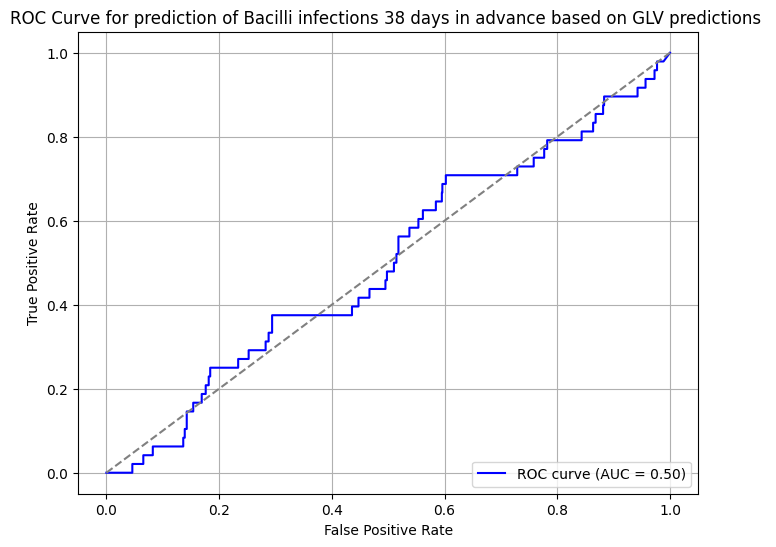

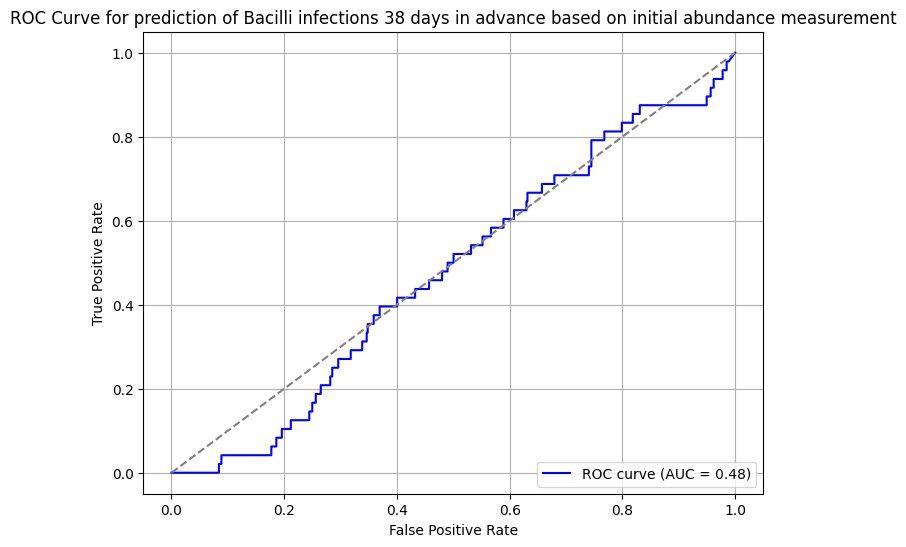

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


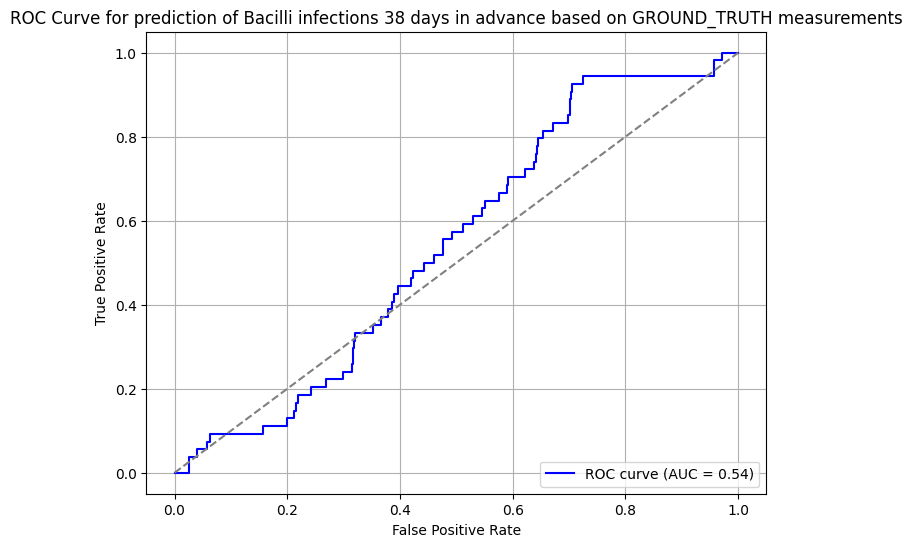

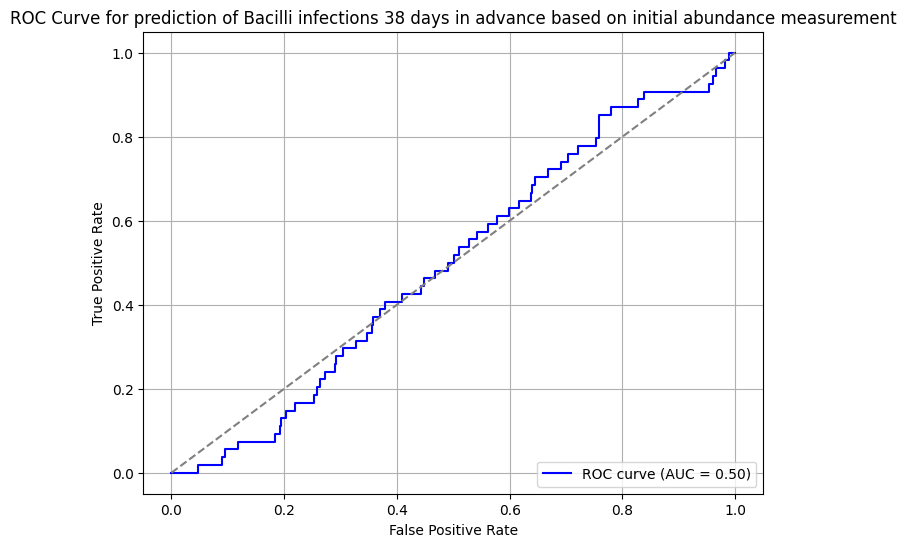

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


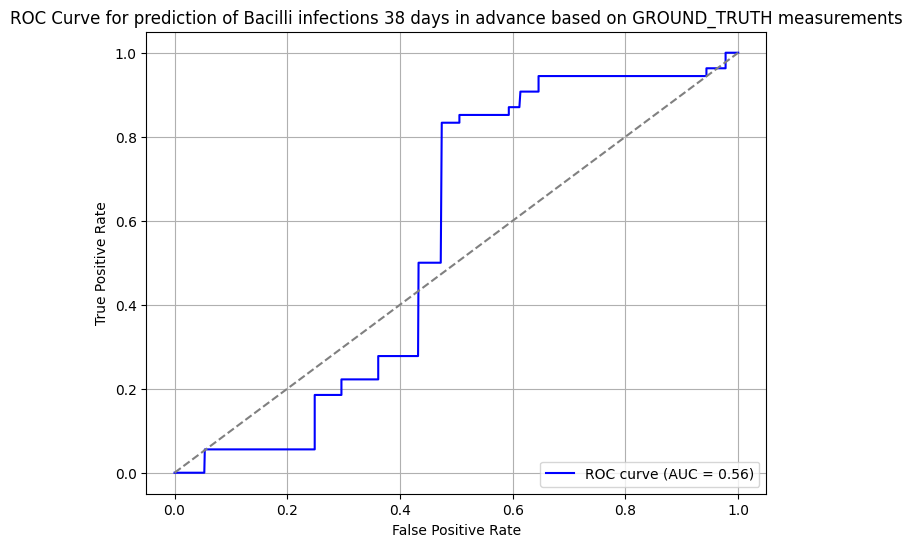

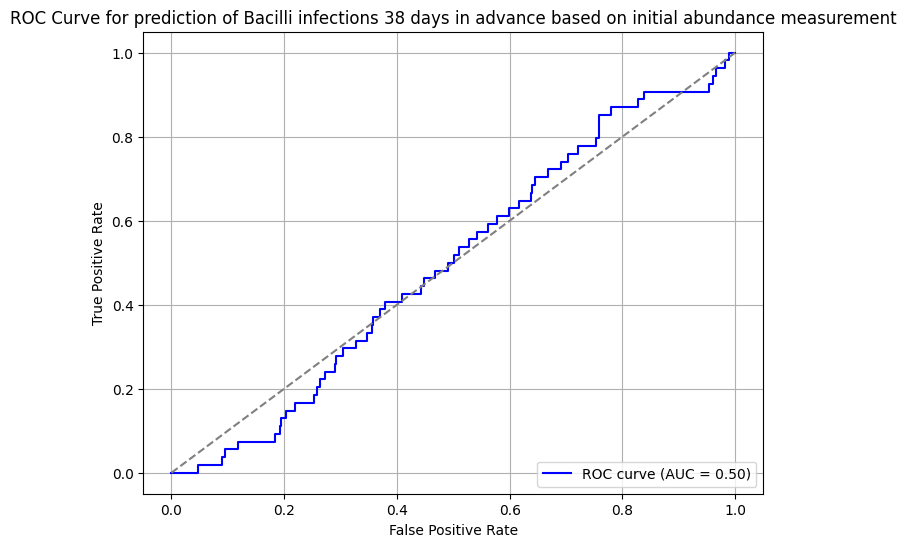

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


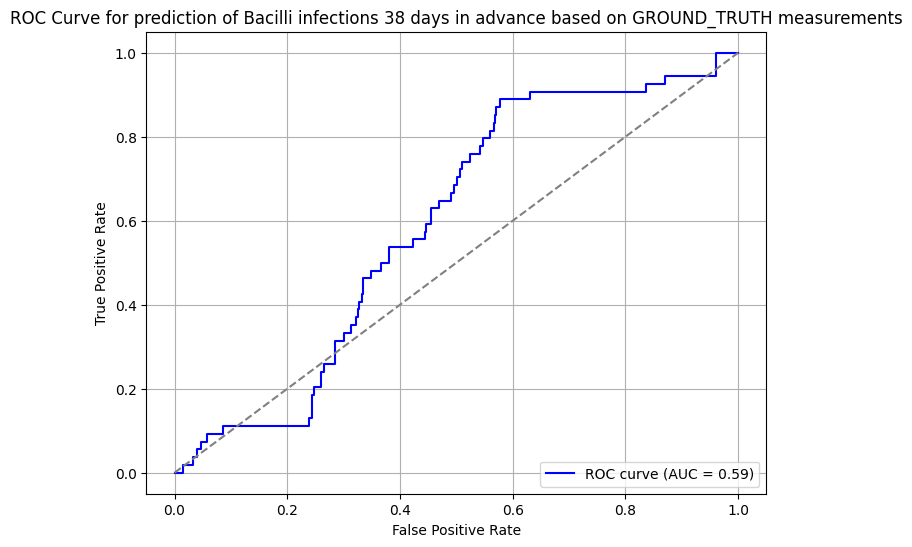

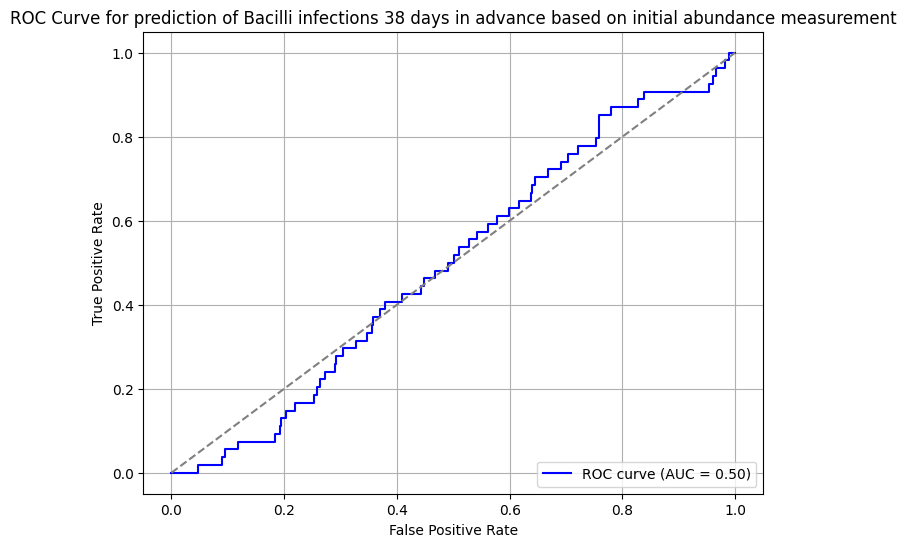

computing infection predictions...
plotting ROC curve...


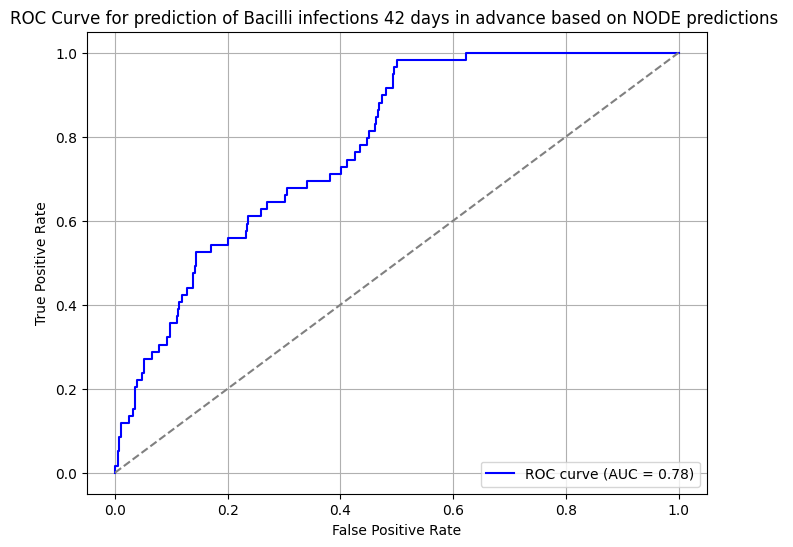

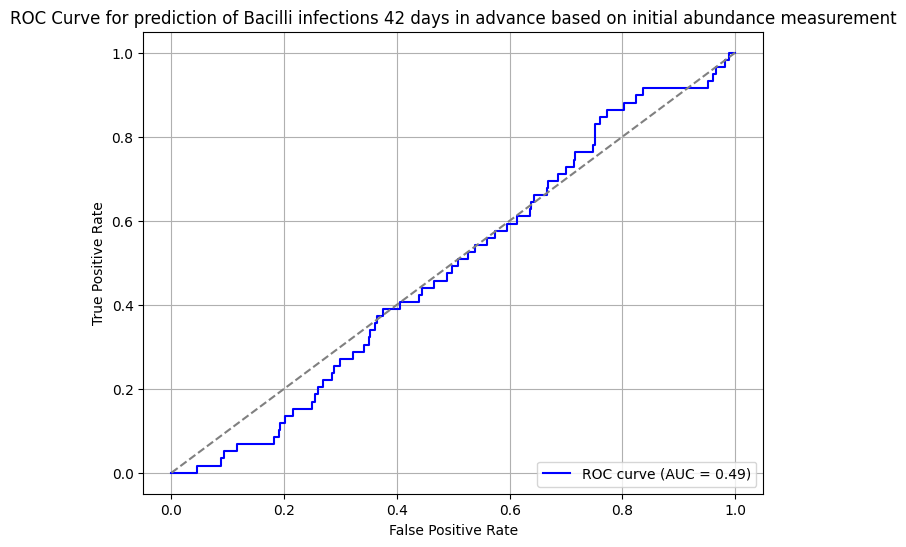

computing infection predictions...
plotting ROC curve...


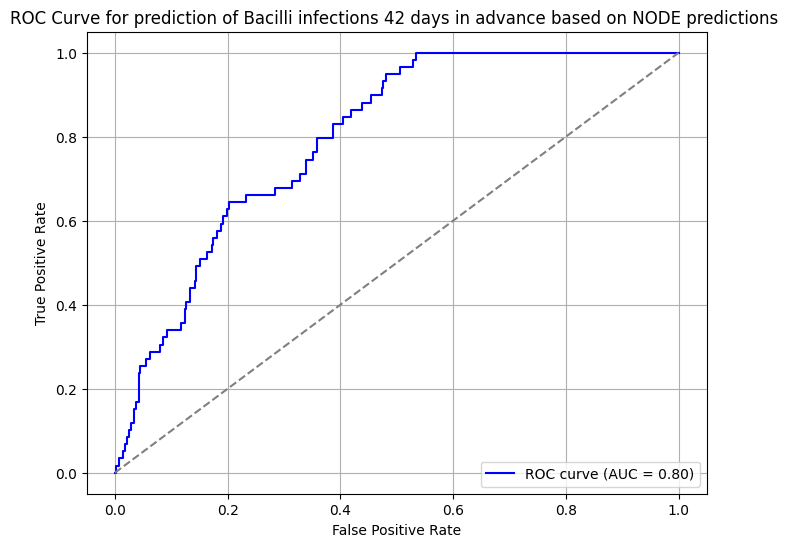

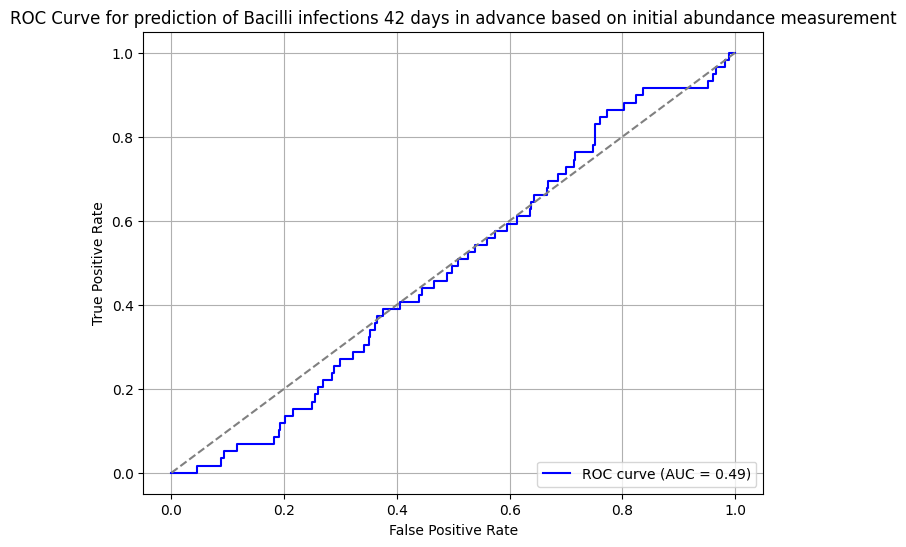

computing infection predictions...
plotting ROC curve...


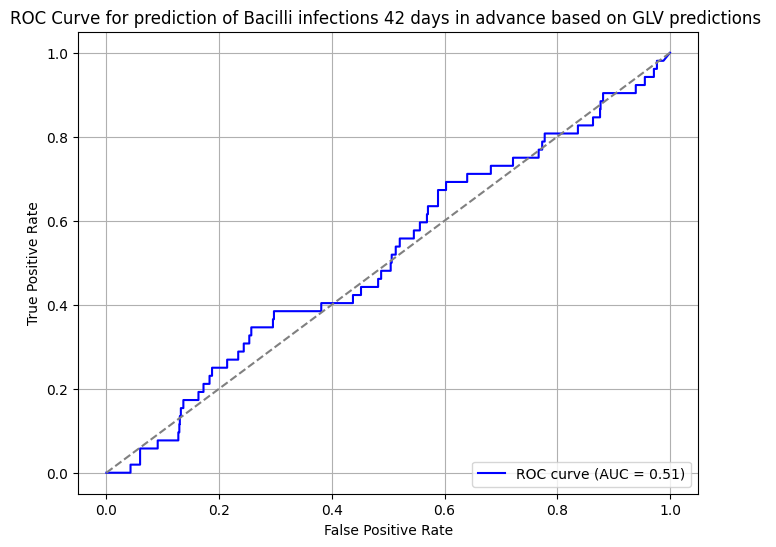

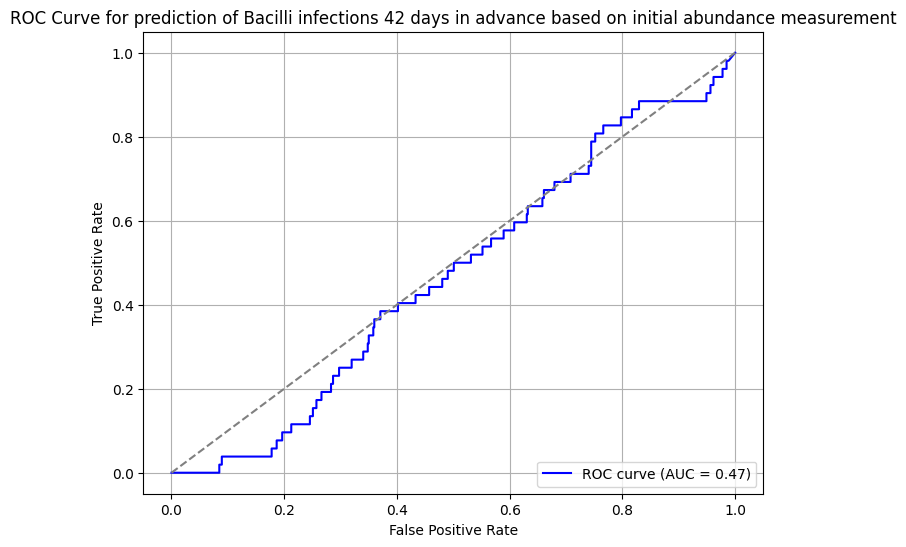

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


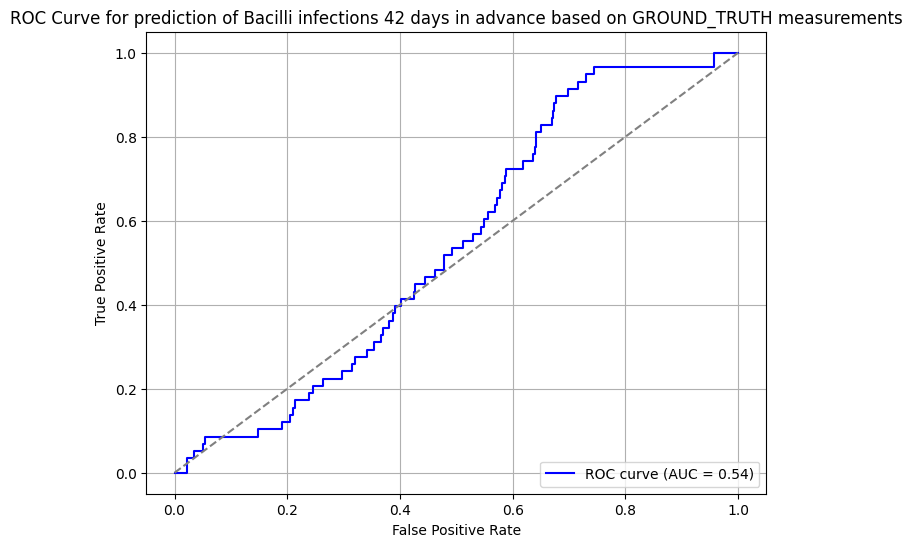

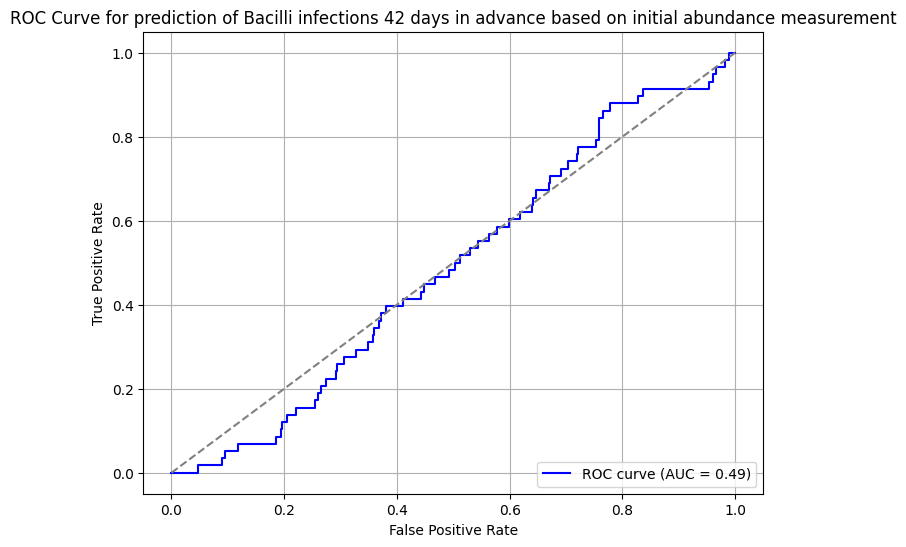

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


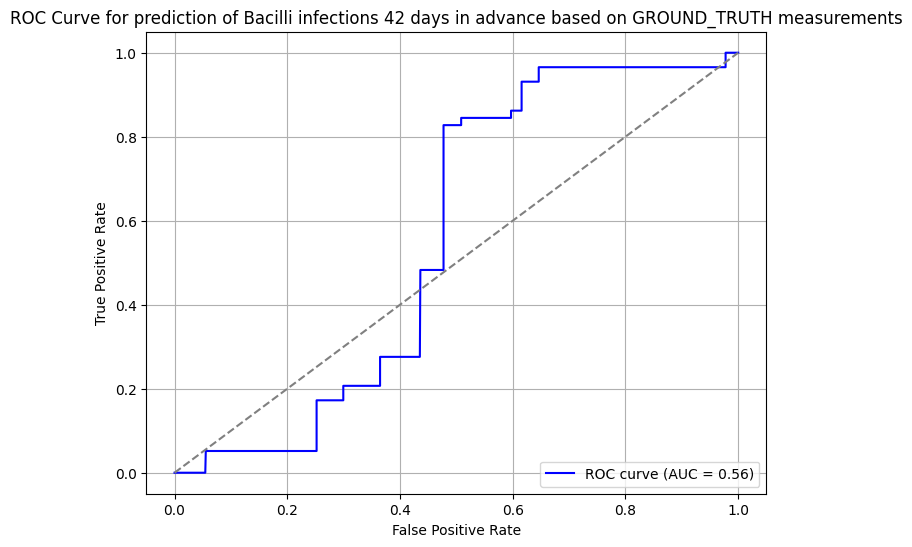

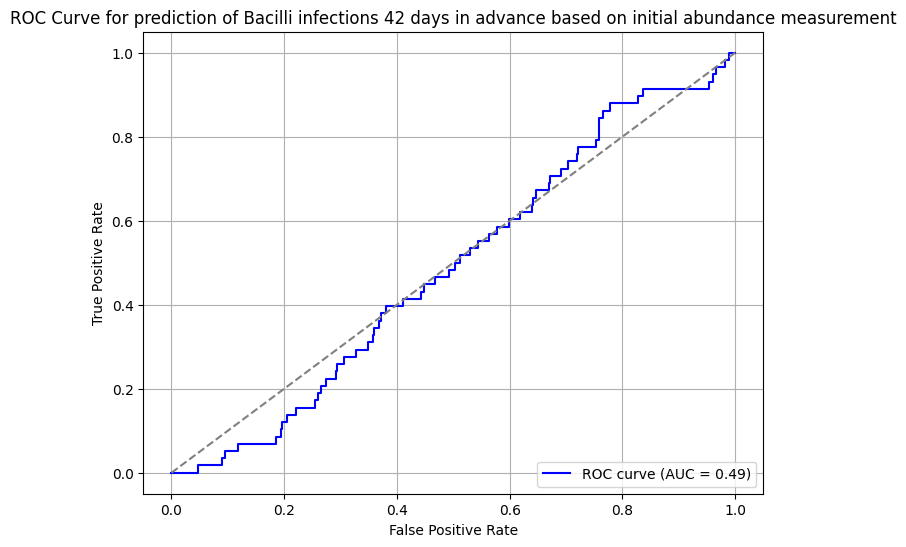

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


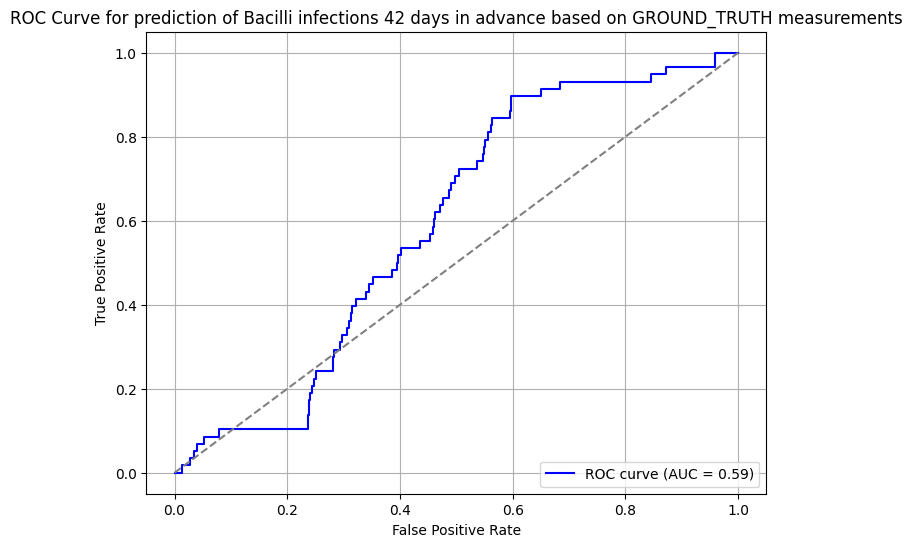

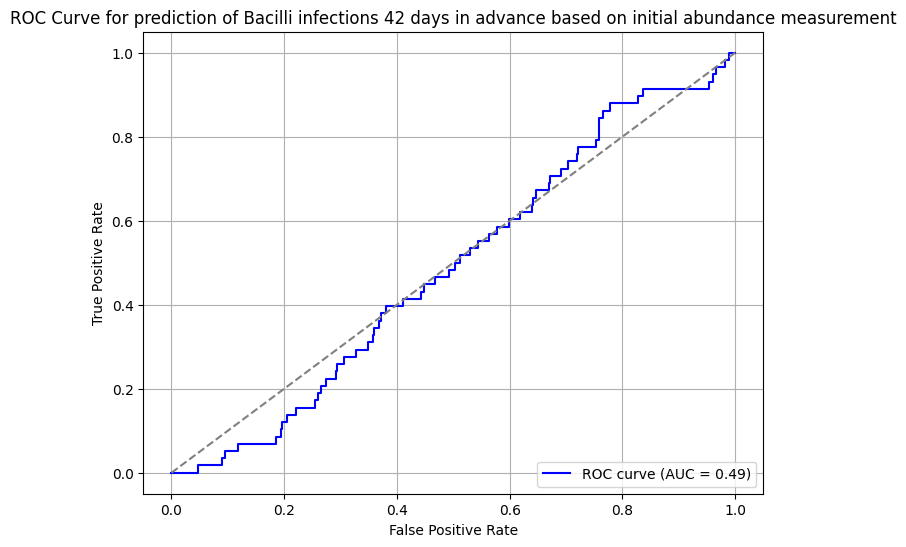

computing infection predictions...
plotting ROC curve...


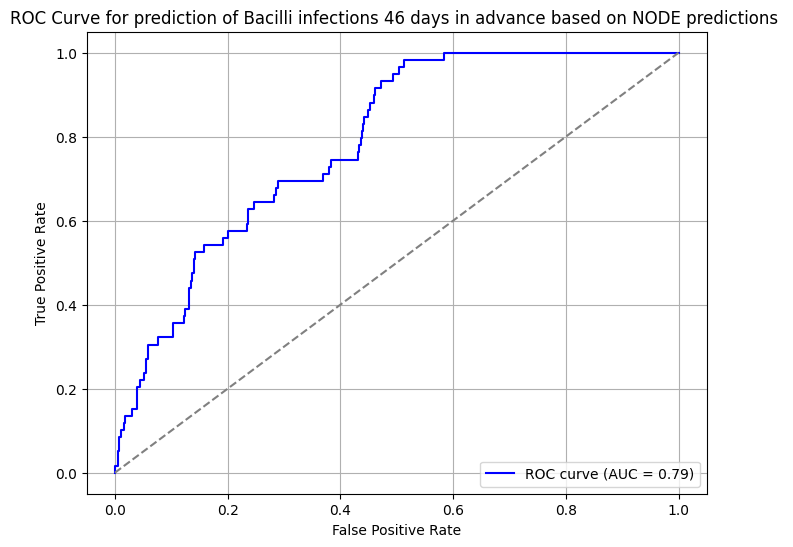

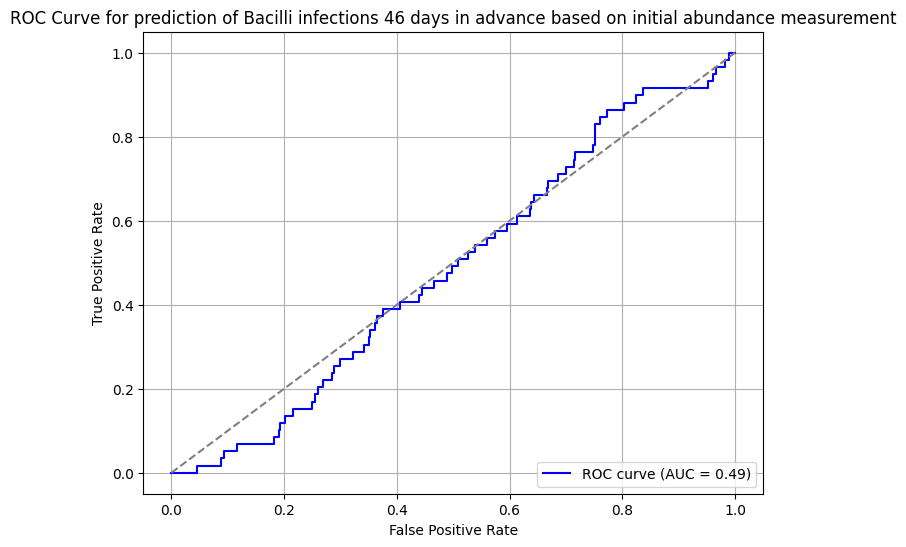

computing infection predictions...
plotting ROC curve...


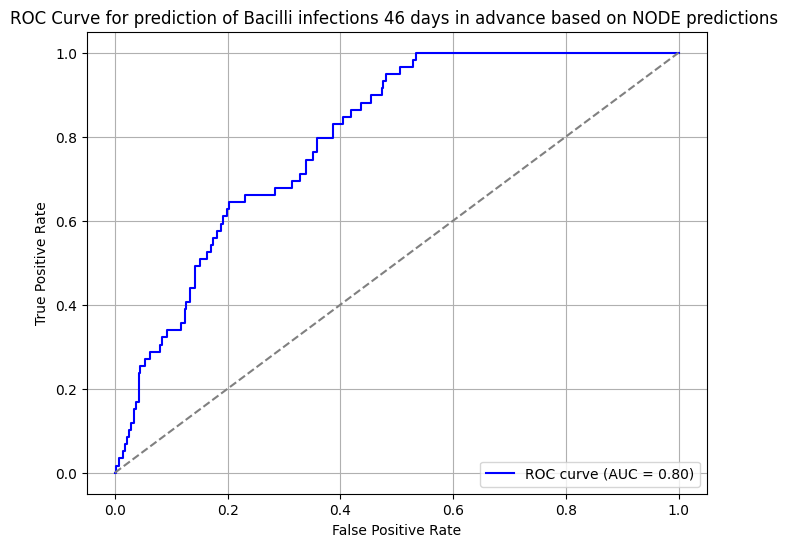

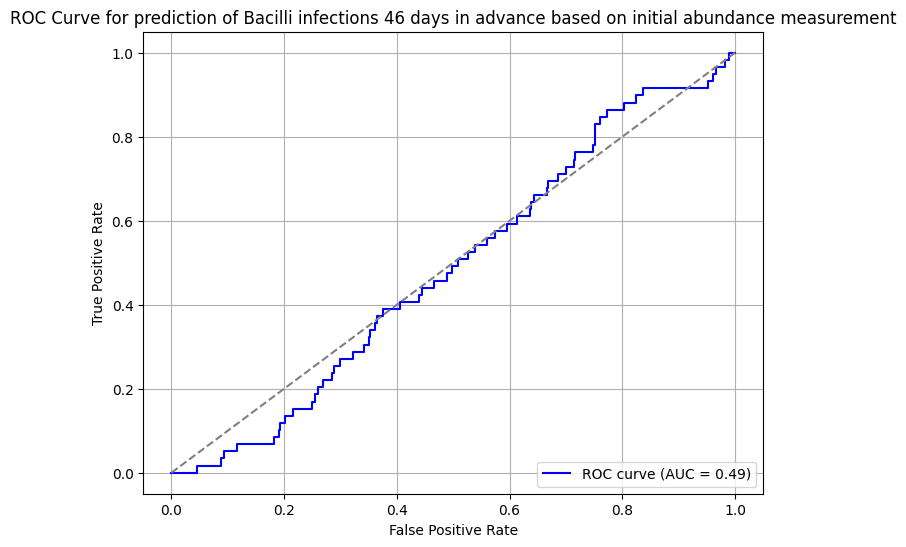

computing infection predictions...
plotting ROC curve...


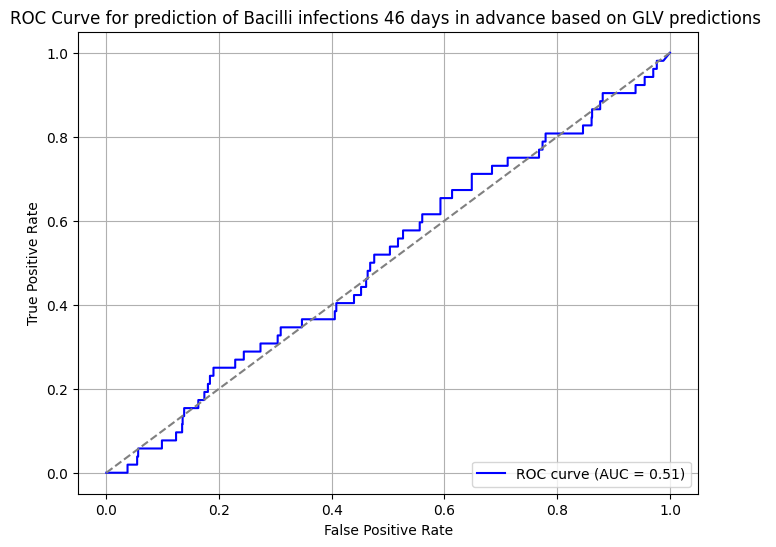

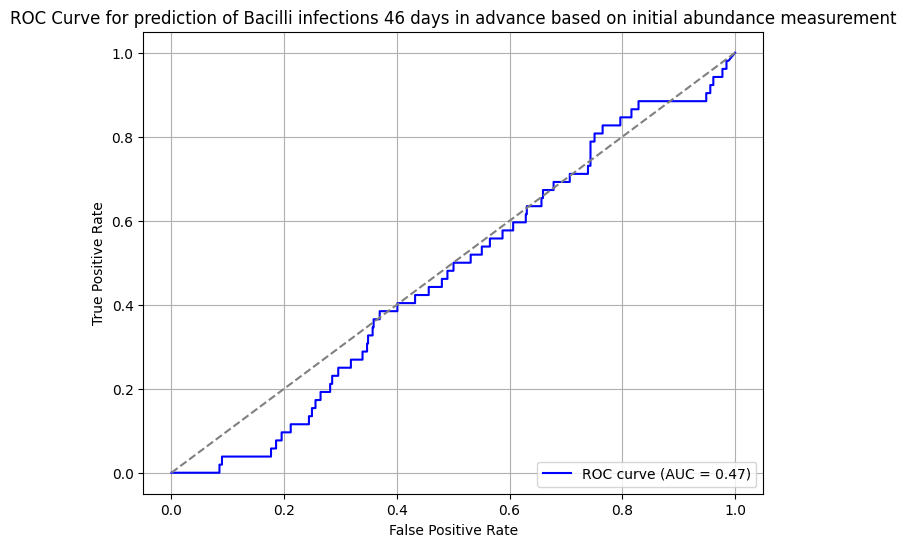

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


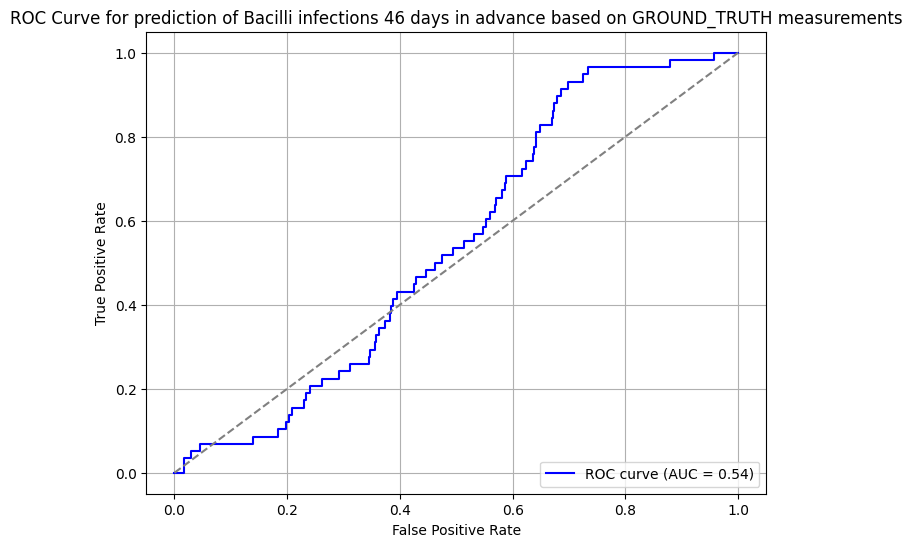

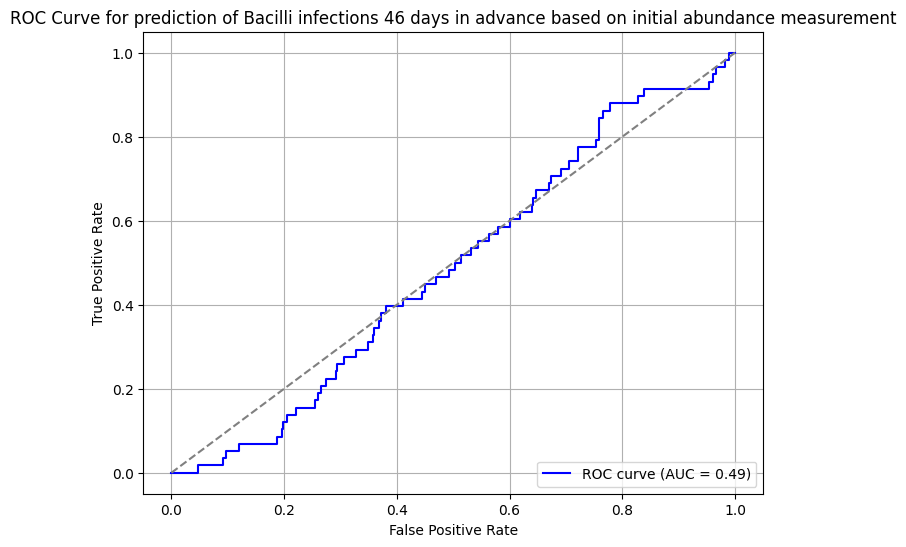

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


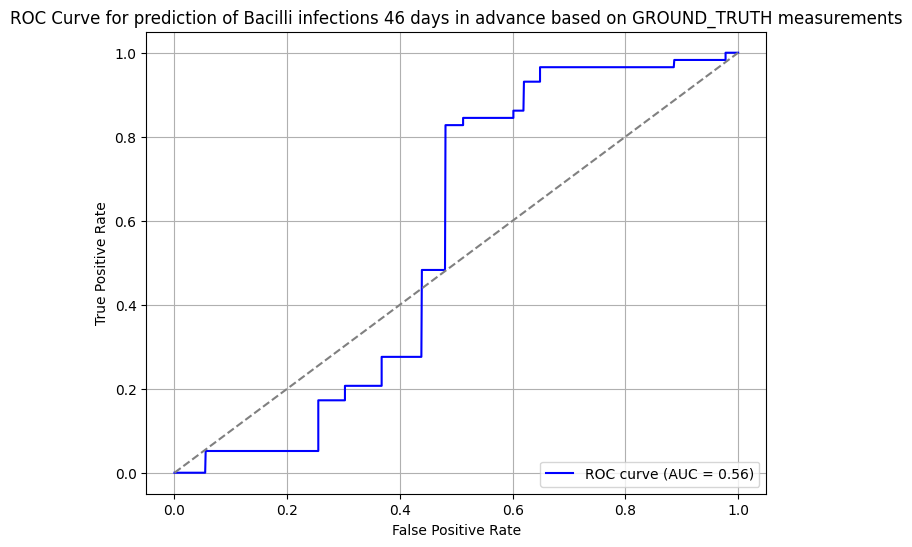

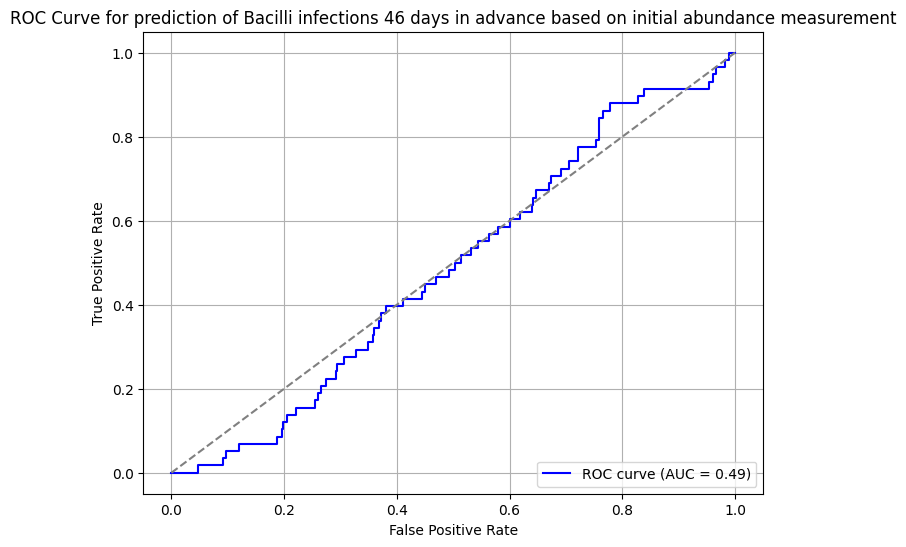

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


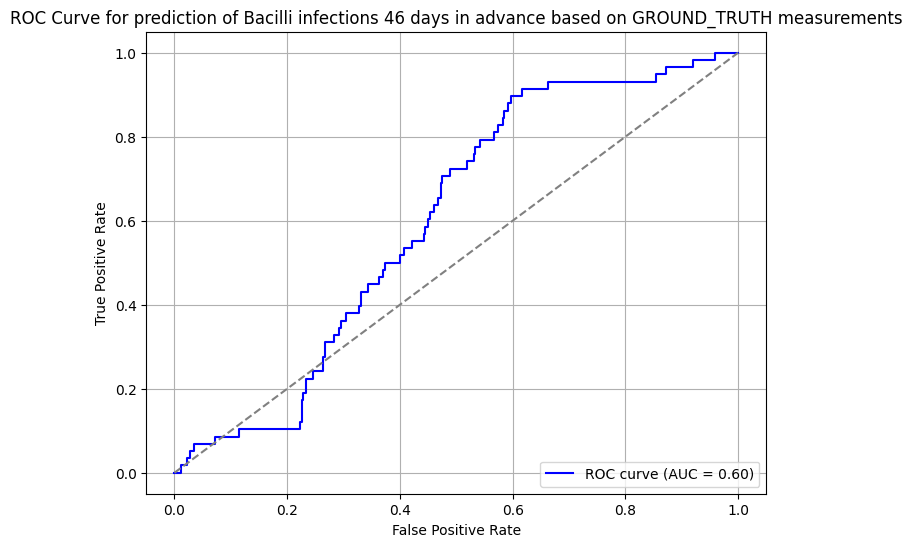

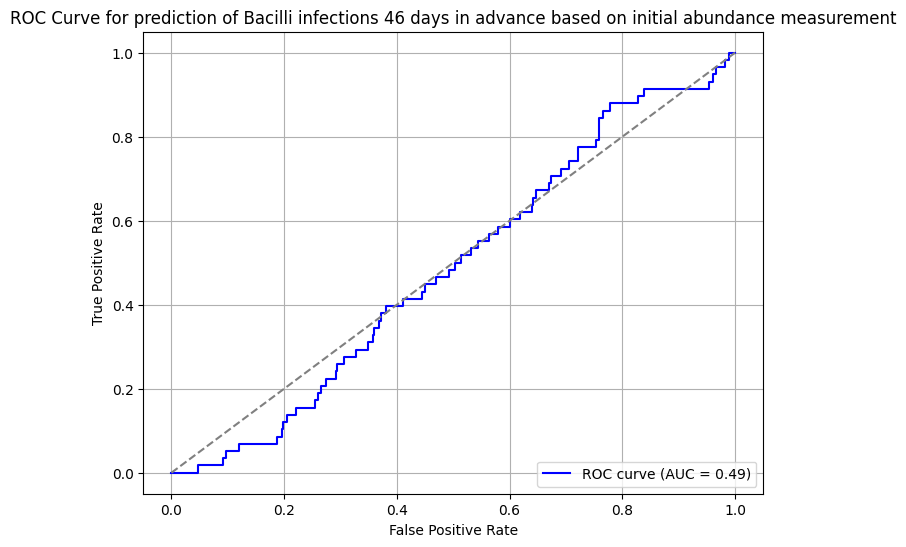

computing infection predictions...
plotting ROC curve...


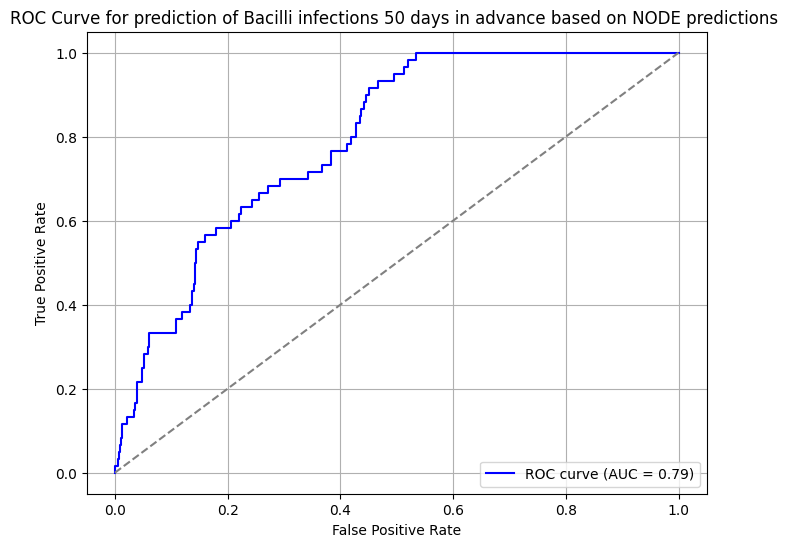

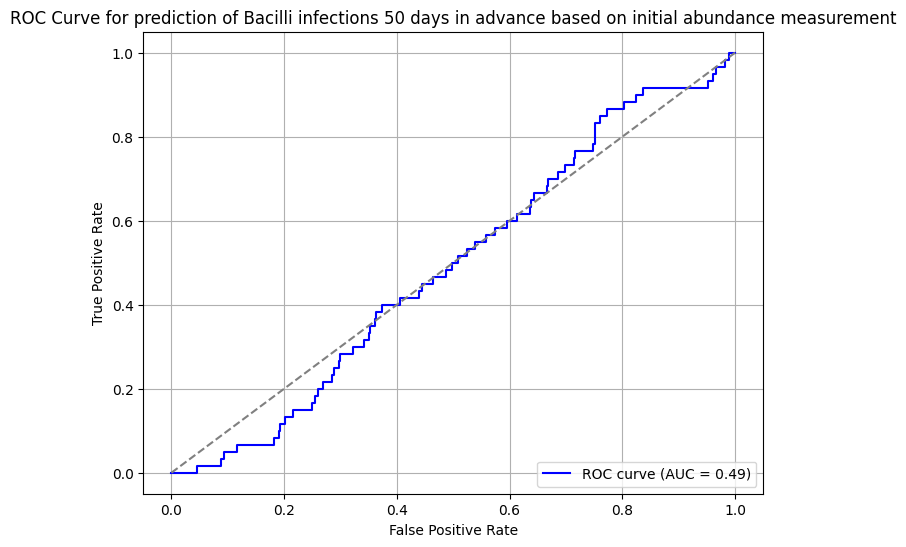

computing infection predictions...
plotting ROC curve...


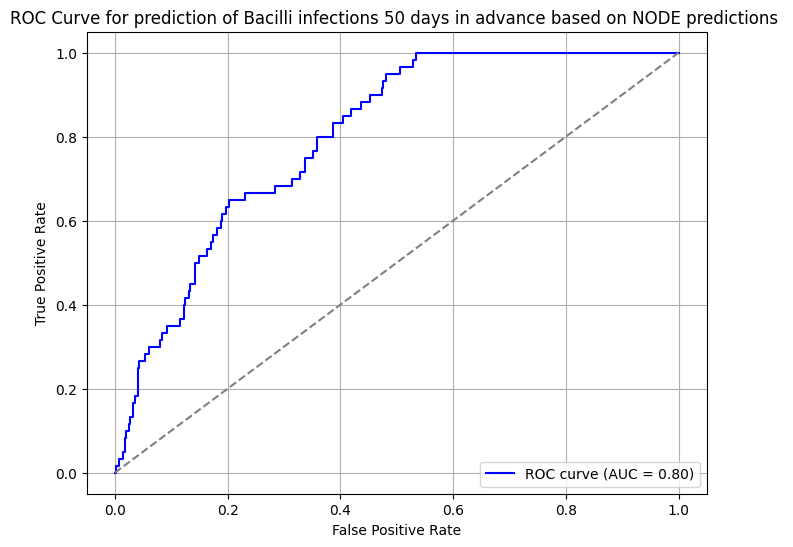

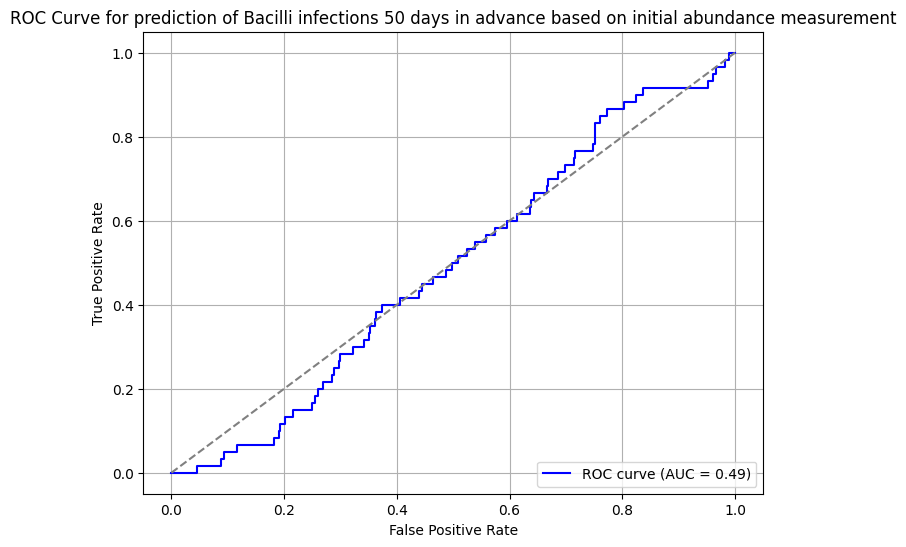

computing infection predictions...
plotting ROC curve...


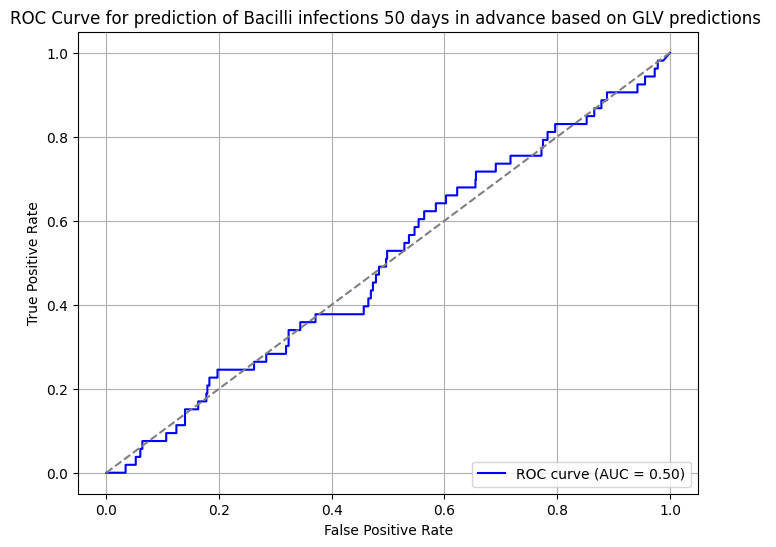

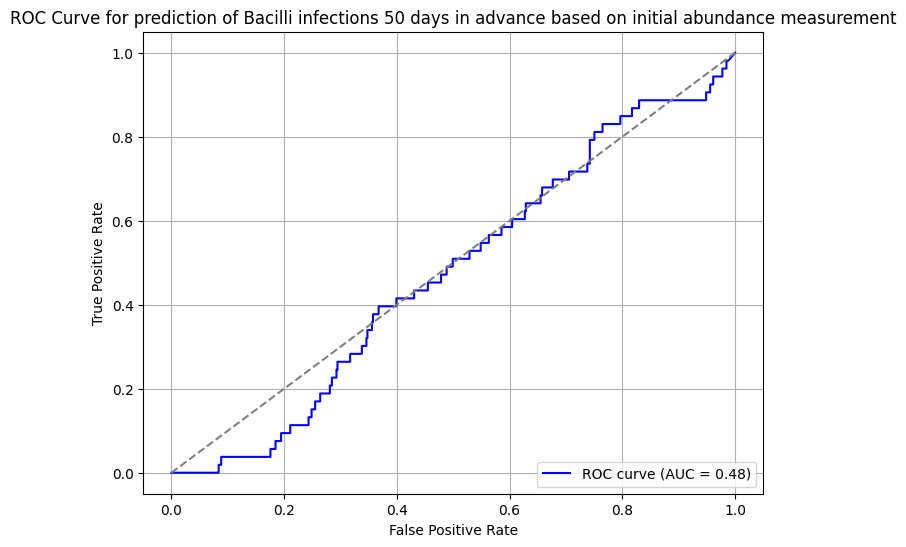

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


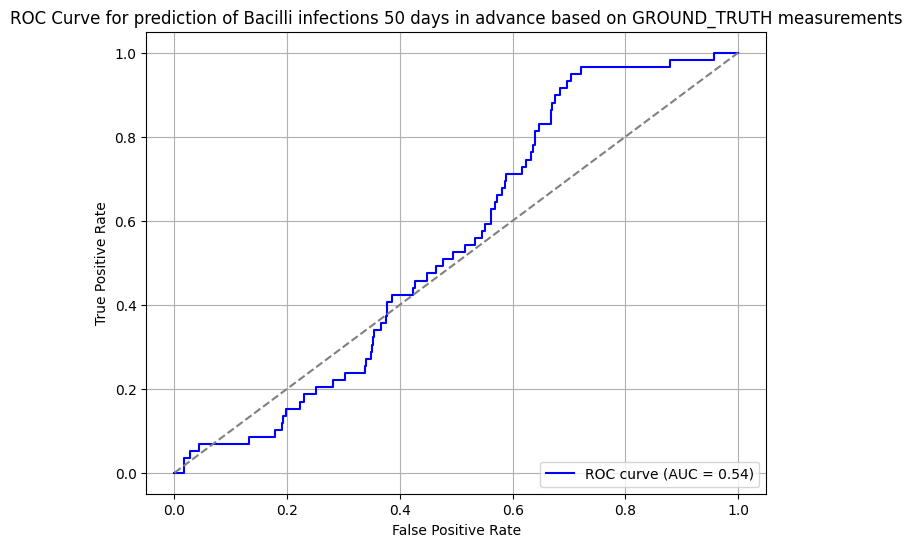

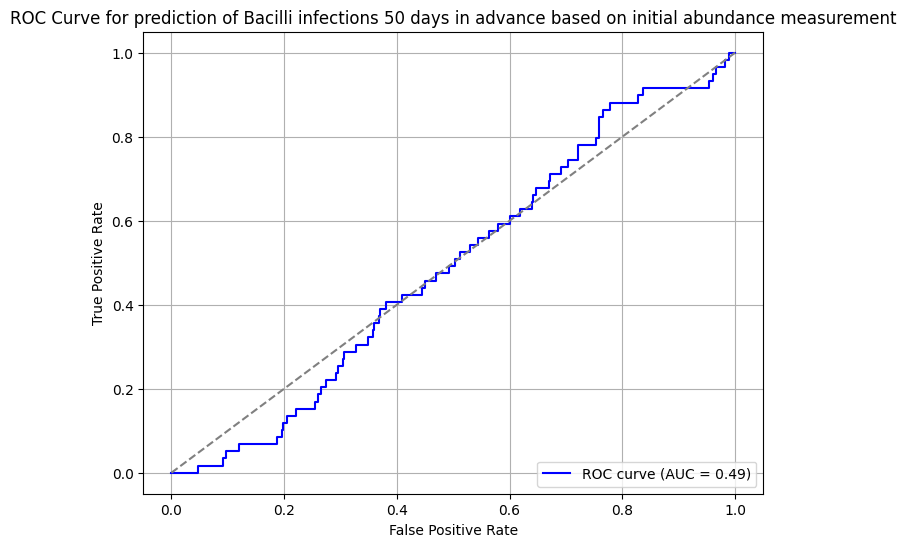

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


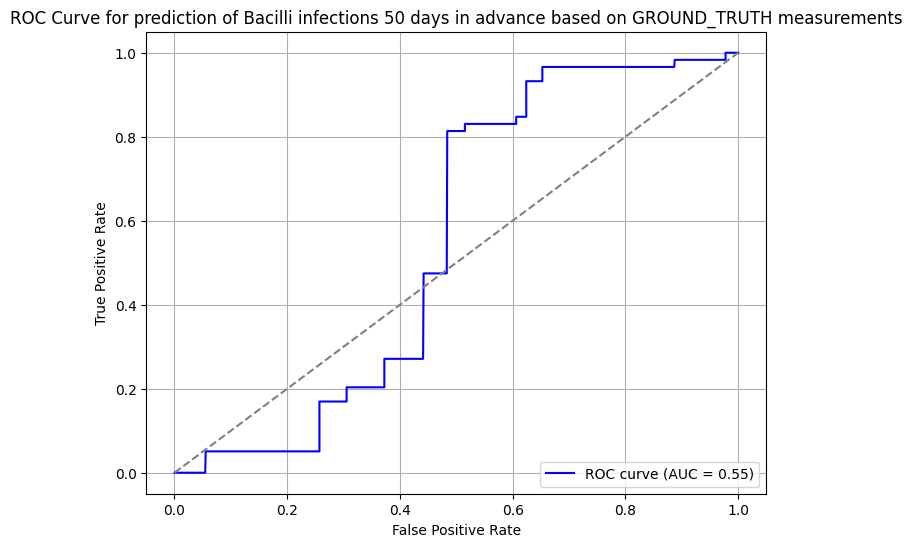

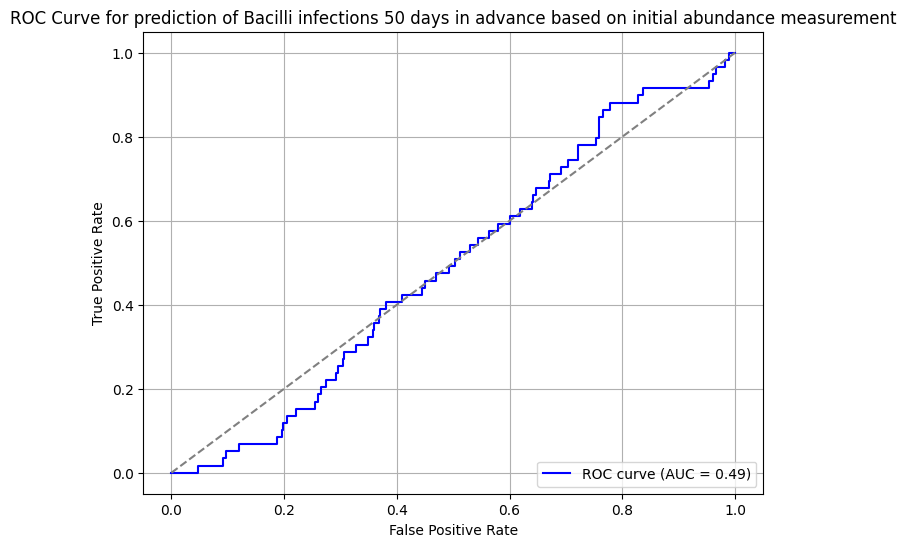

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


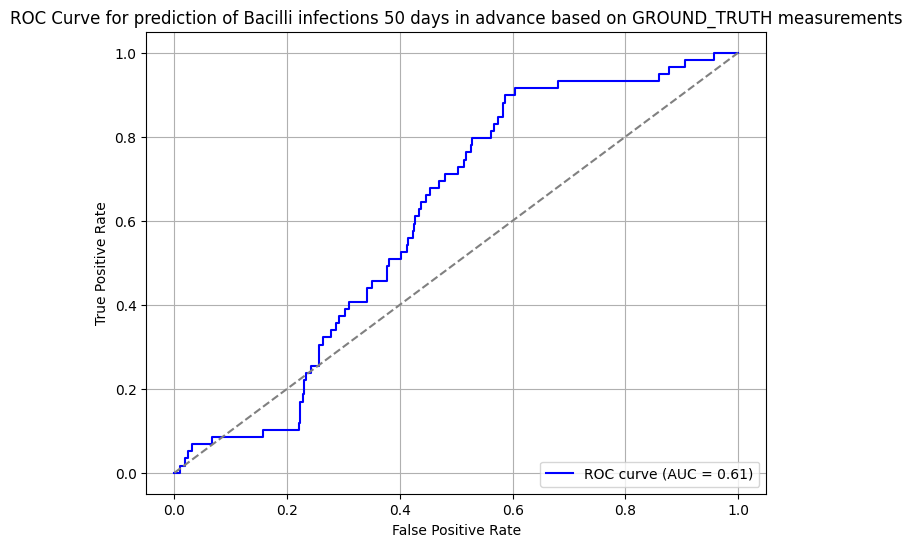

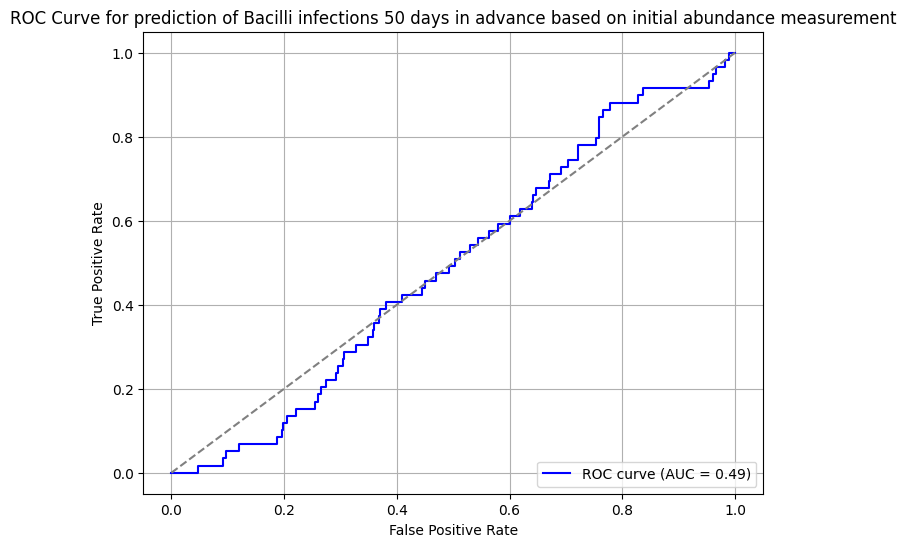

computing infection predictions...
plotting ROC curve...


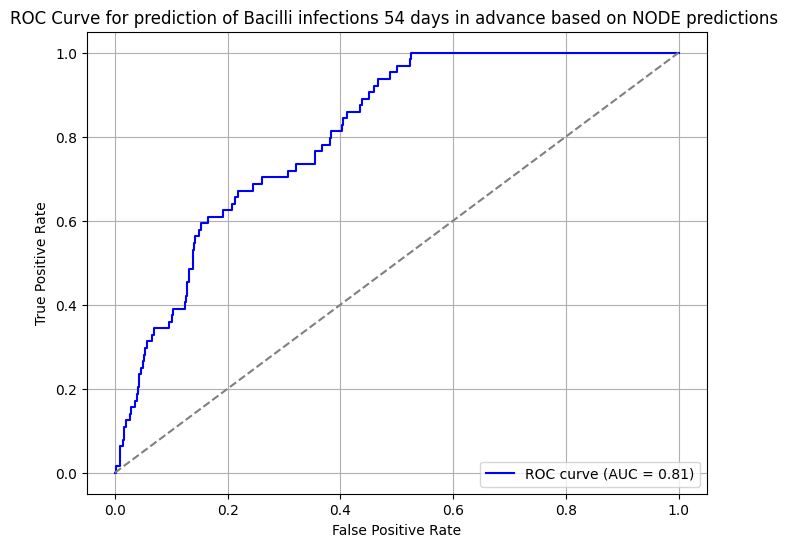

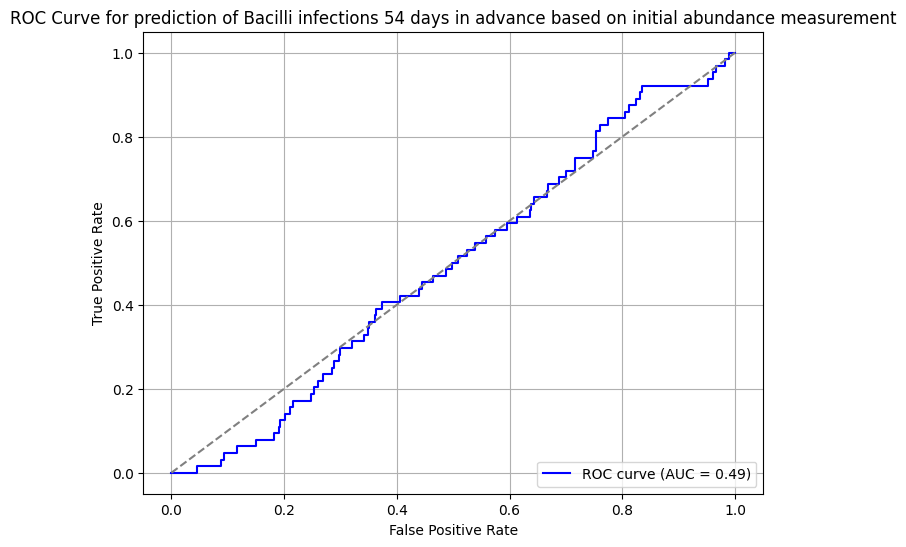

computing infection predictions...
plotting ROC curve...


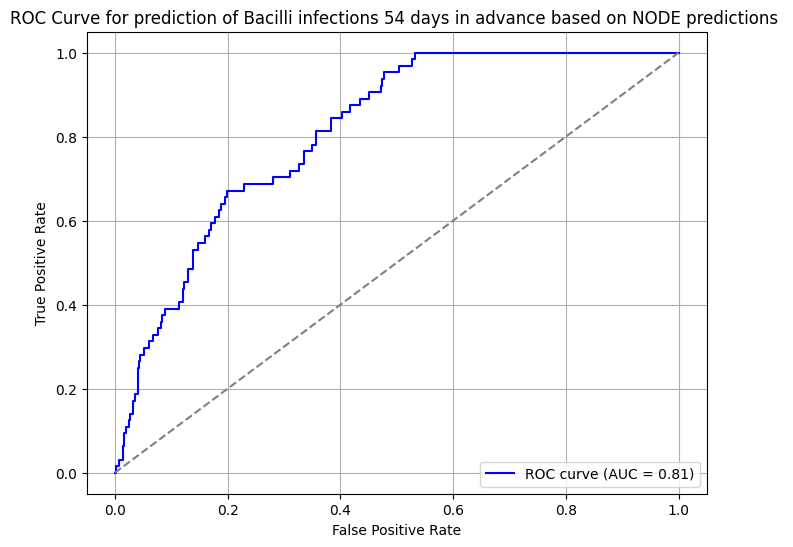

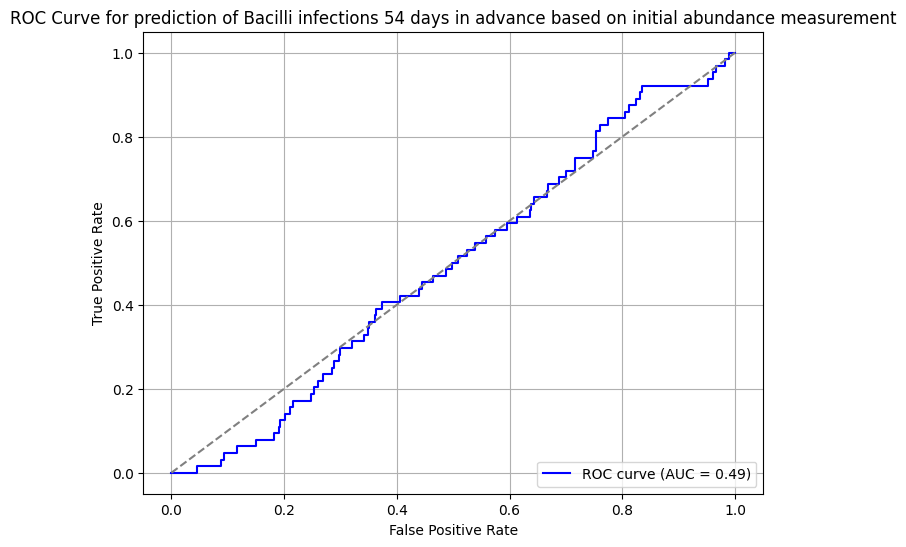

computing infection predictions...
plotting ROC curve...


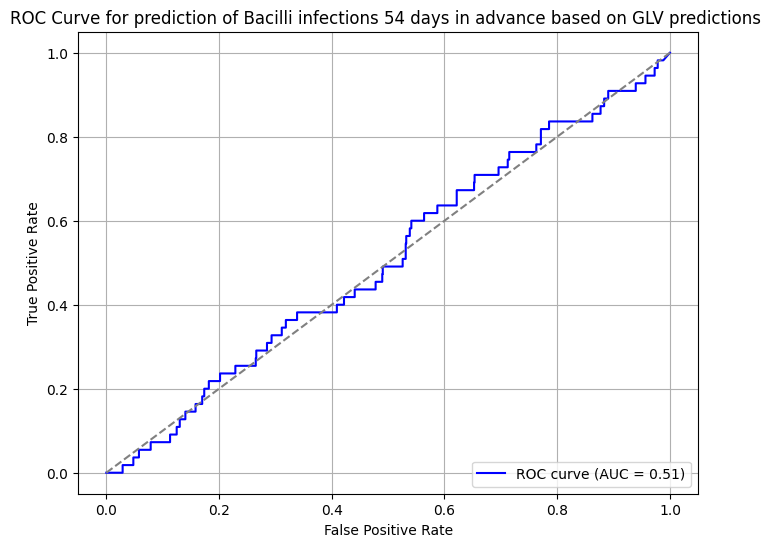

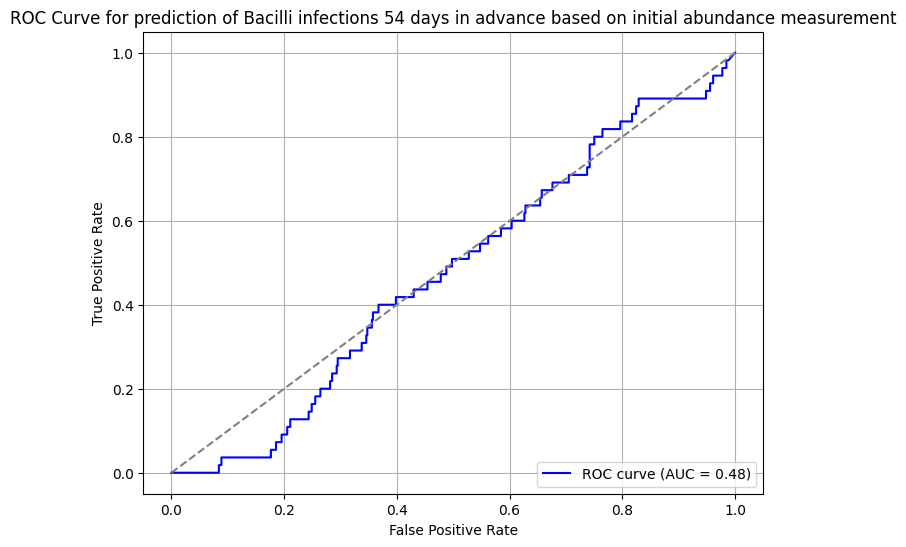

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


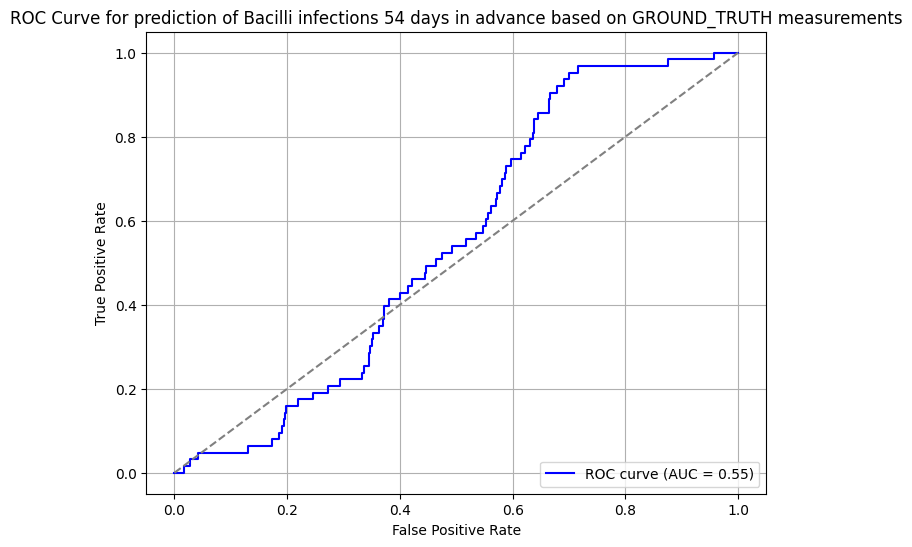

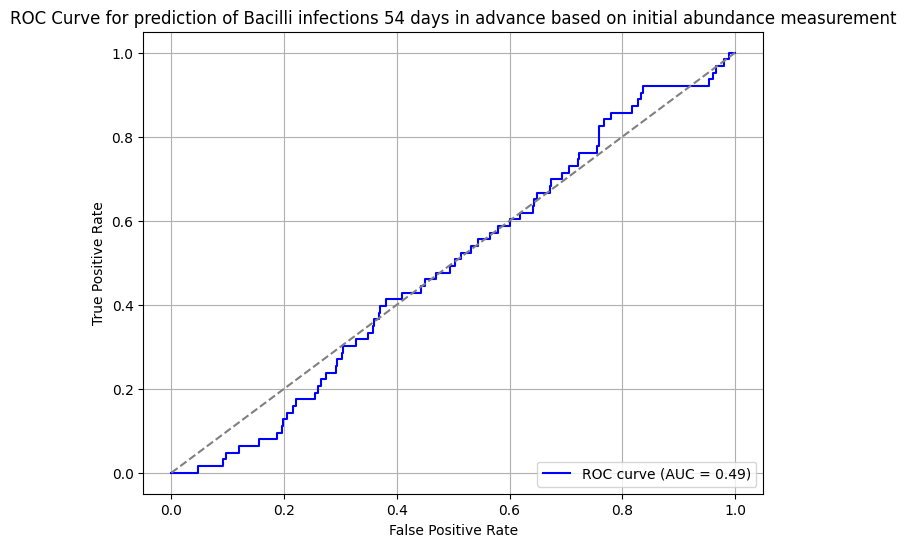

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


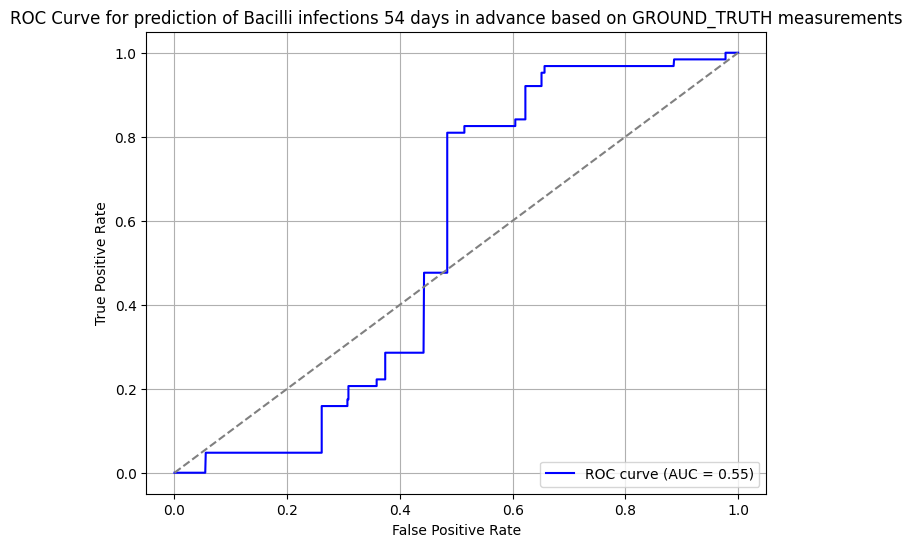

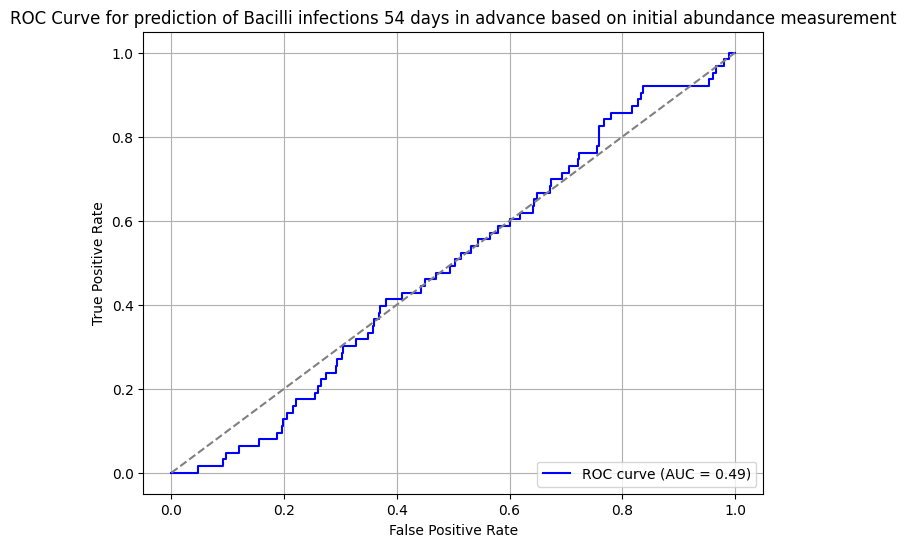

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


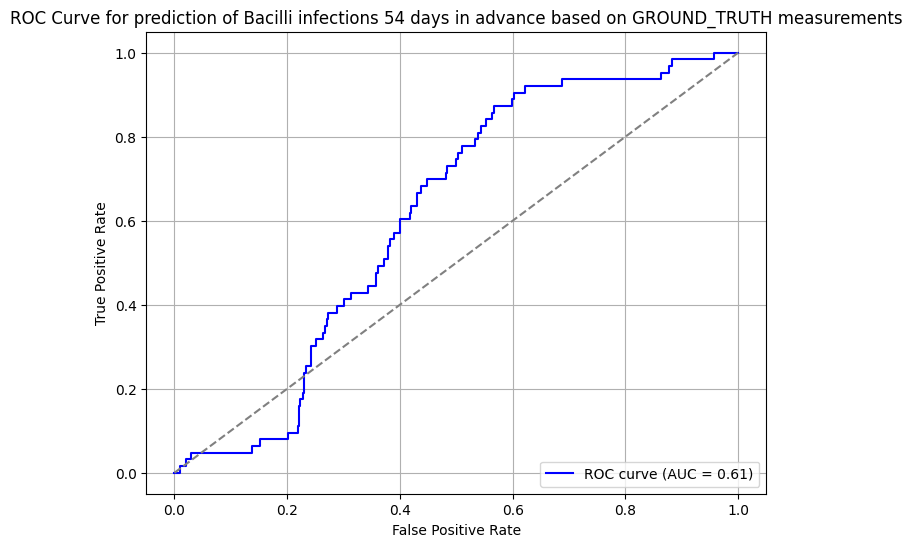

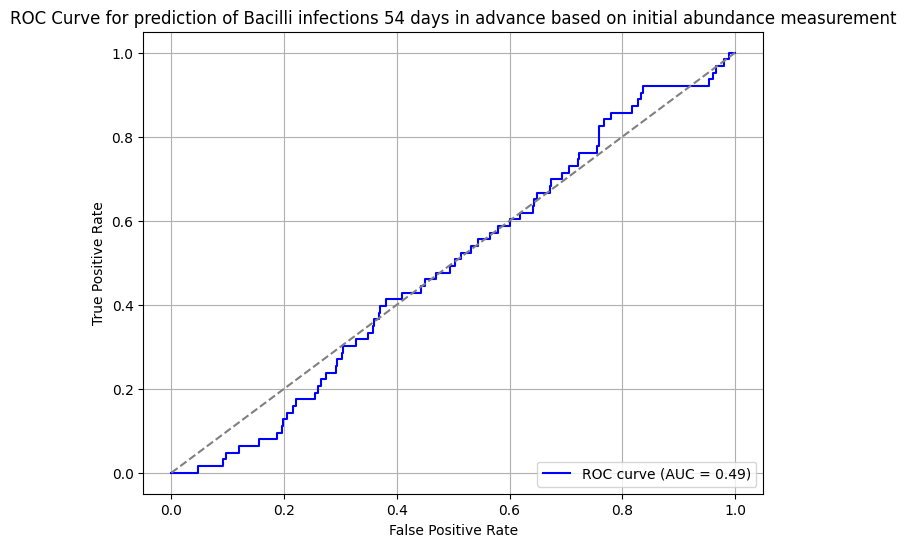

computing infection predictions...
plotting ROC curve...


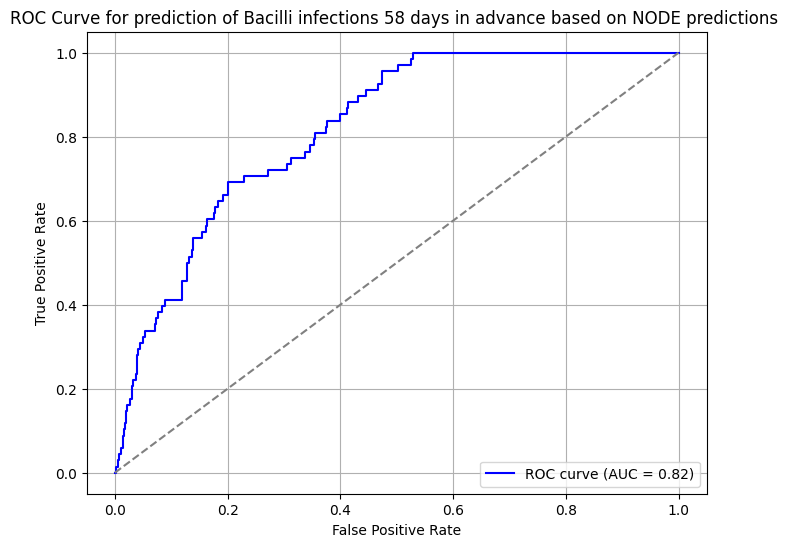

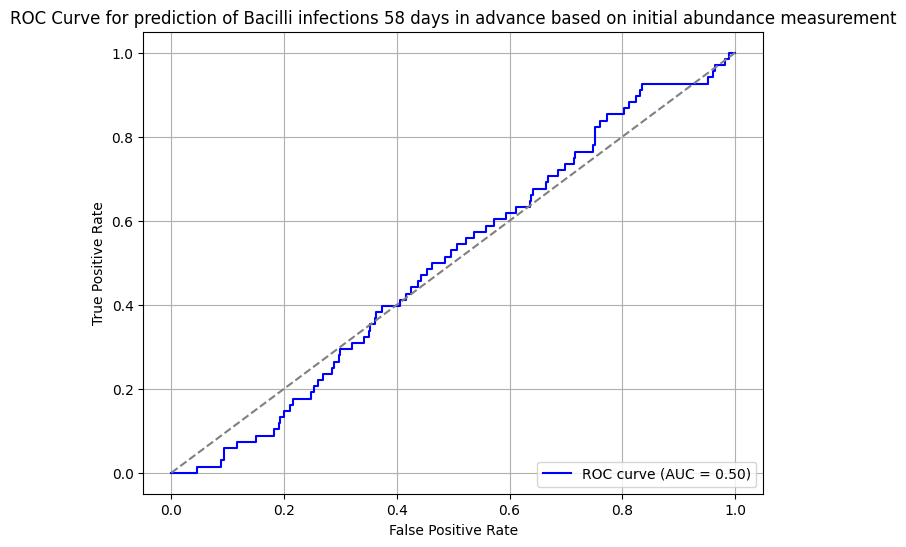

computing infection predictions...
plotting ROC curve...


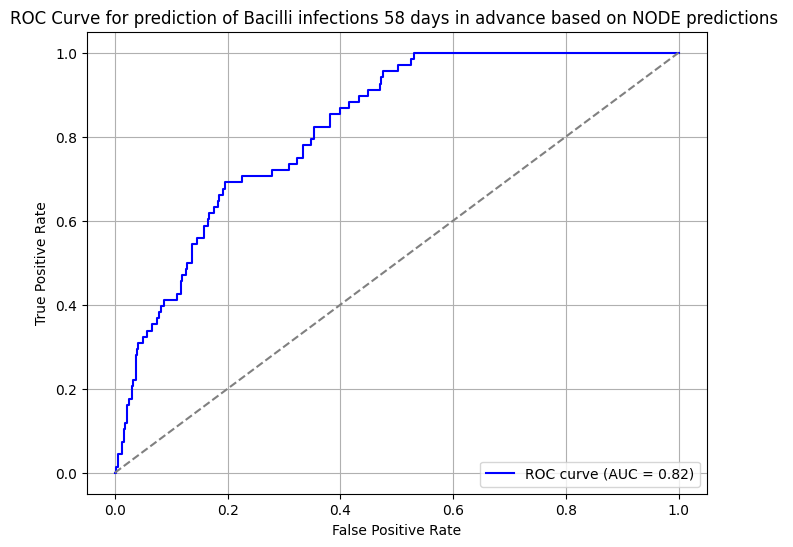

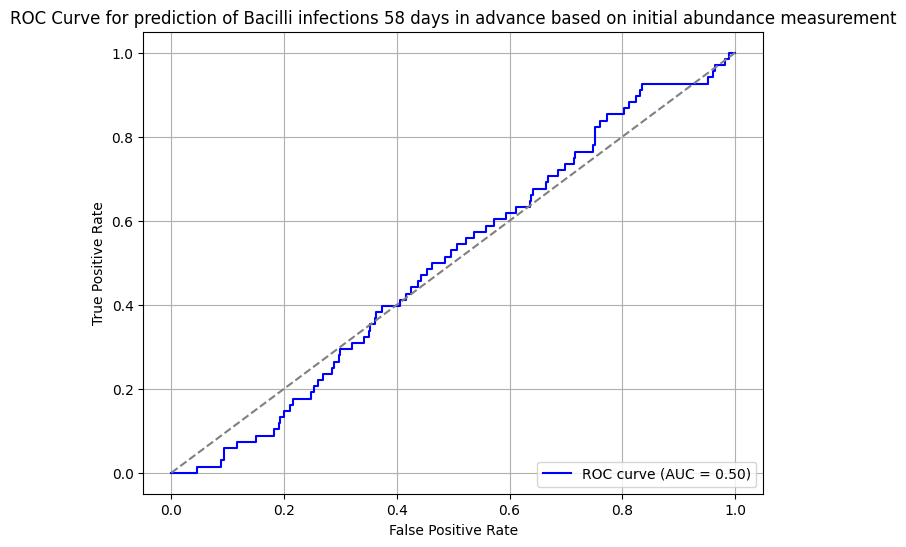

computing infection predictions...
plotting ROC curve...


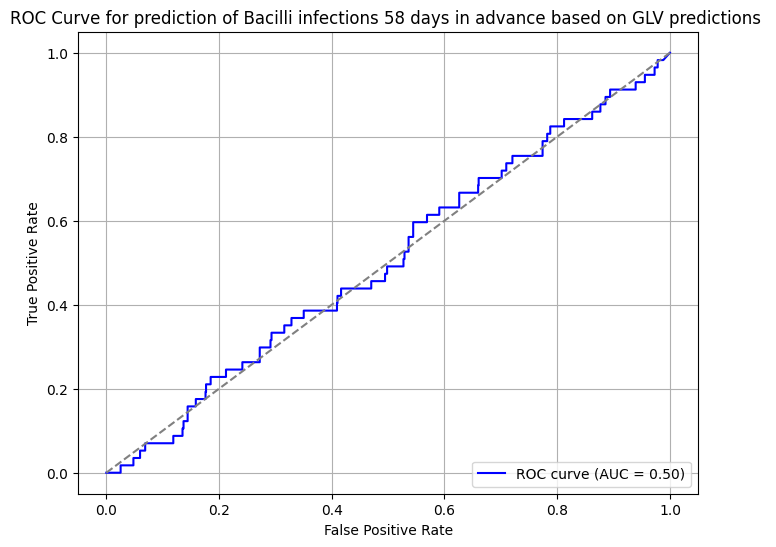

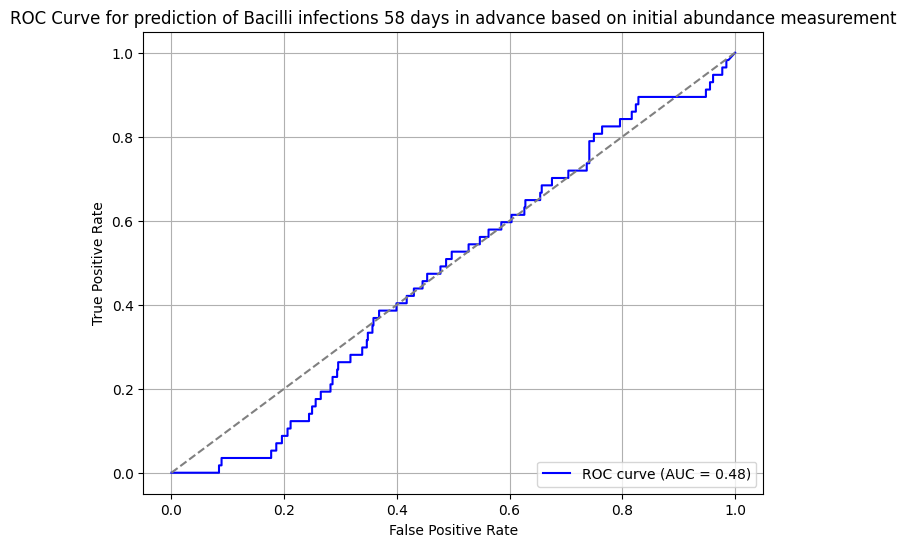

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


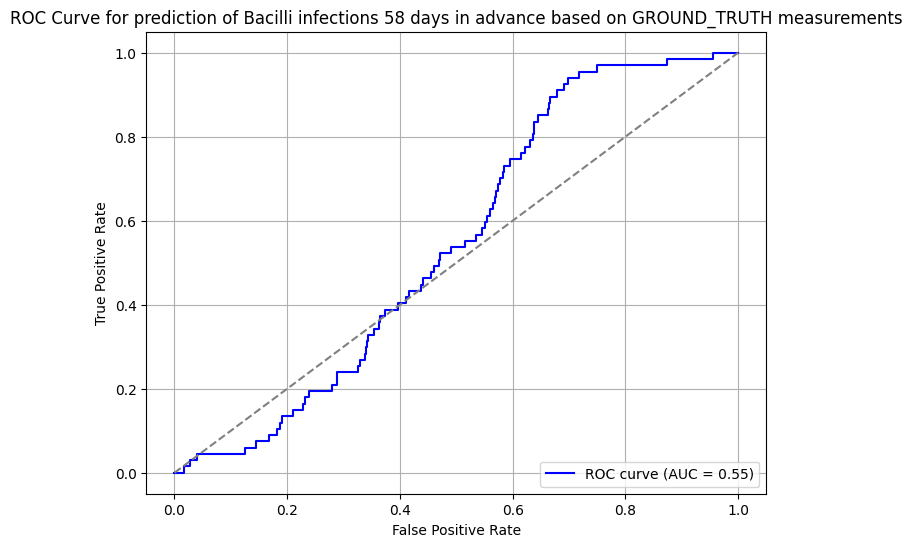

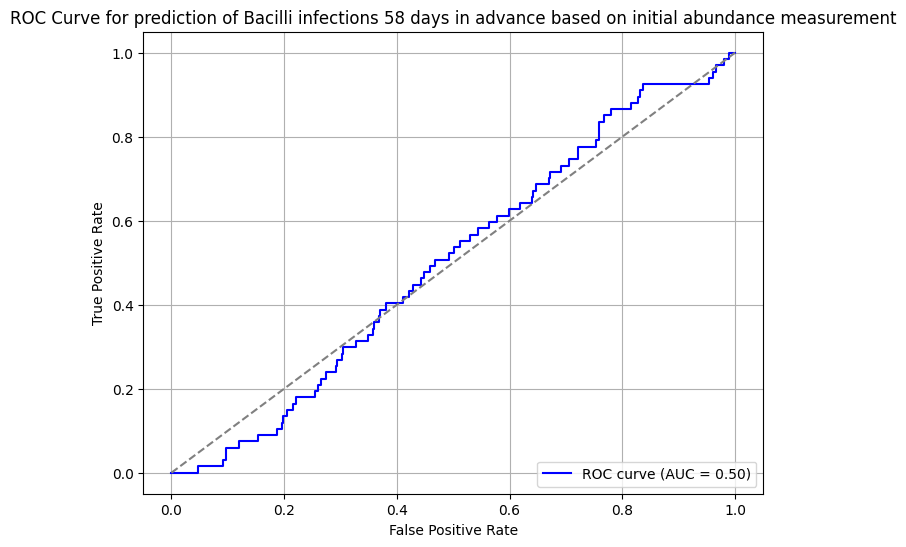

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


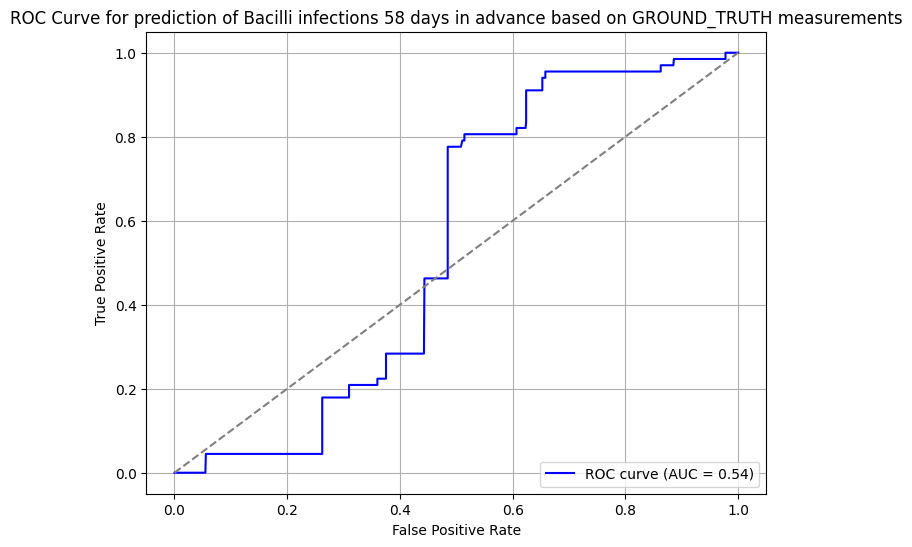

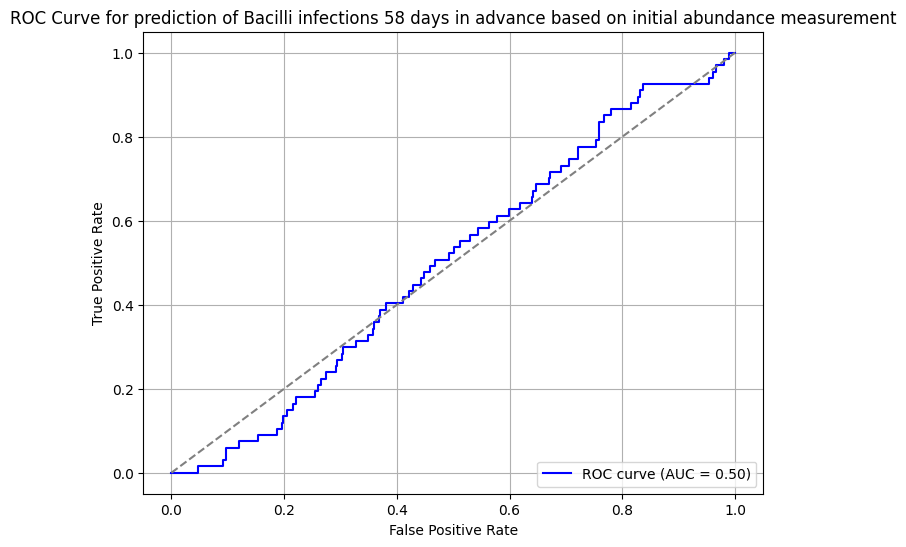

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


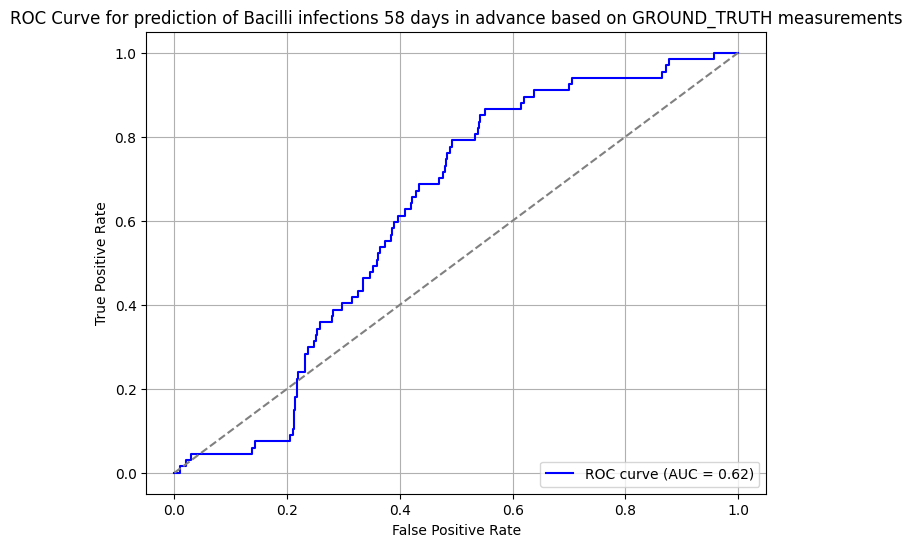

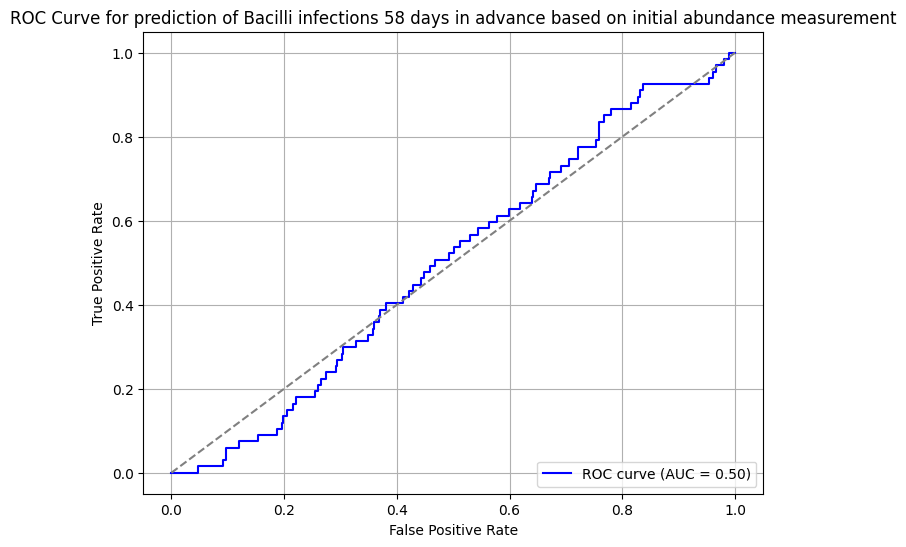

computing infection predictions...
plotting ROC curve...


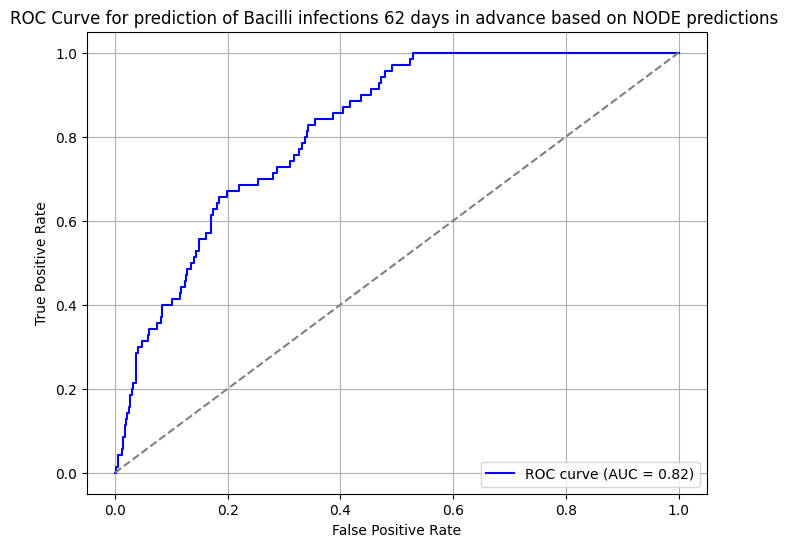

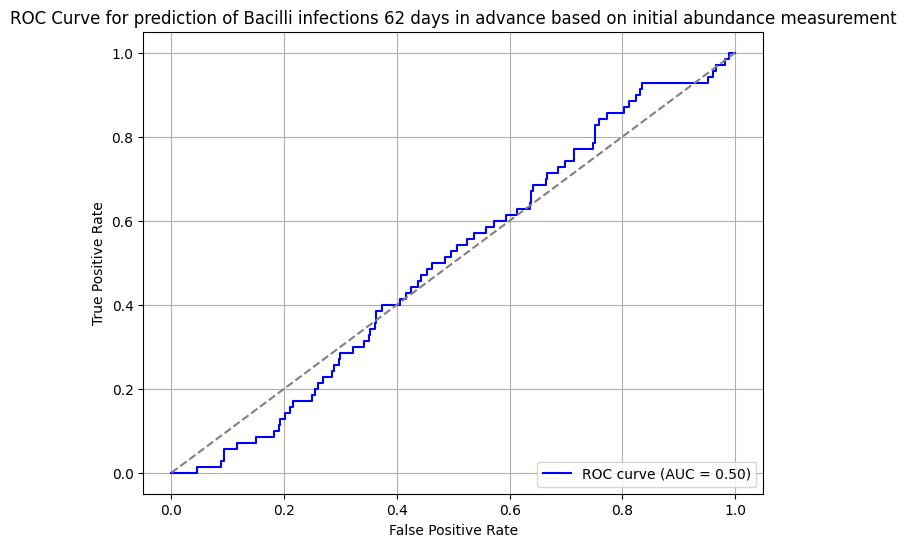

computing infection predictions...
plotting ROC curve...


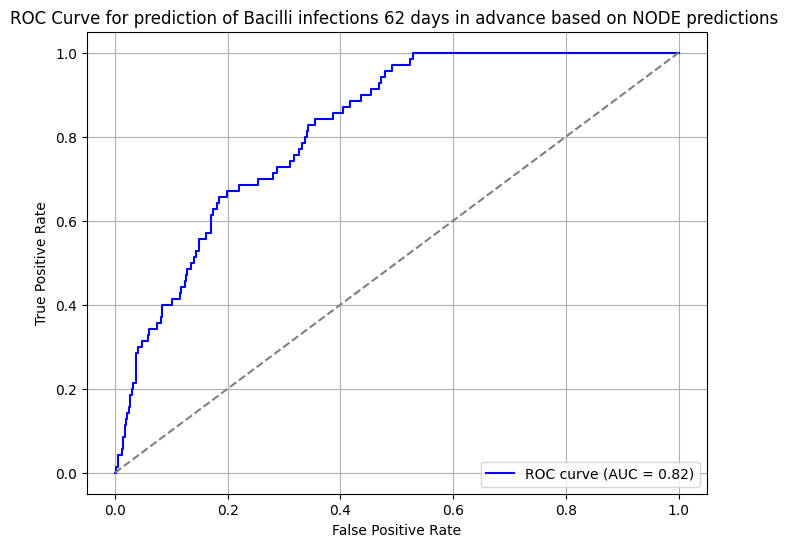

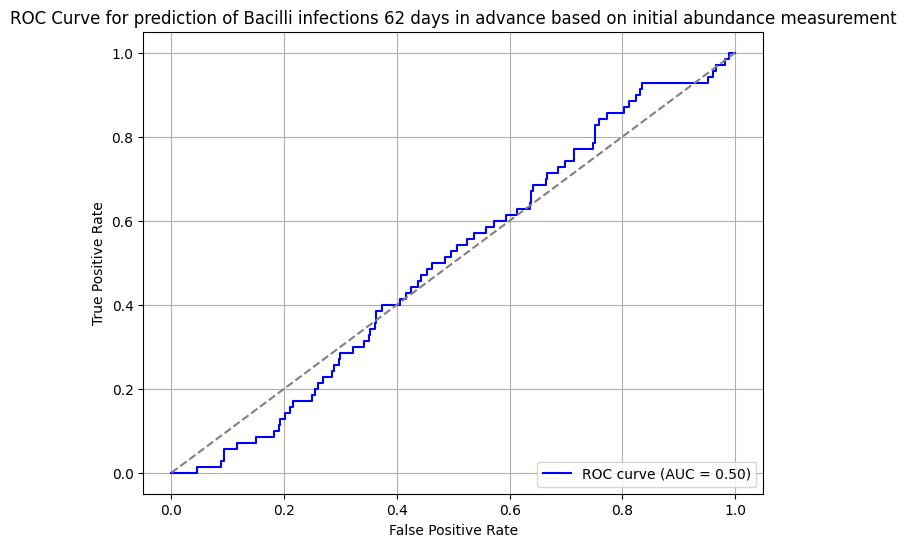

computing infection predictions...
plotting ROC curve...


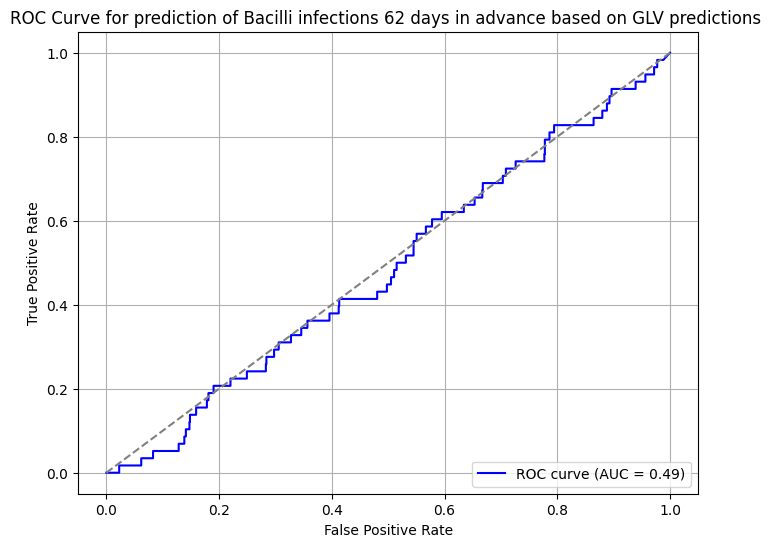

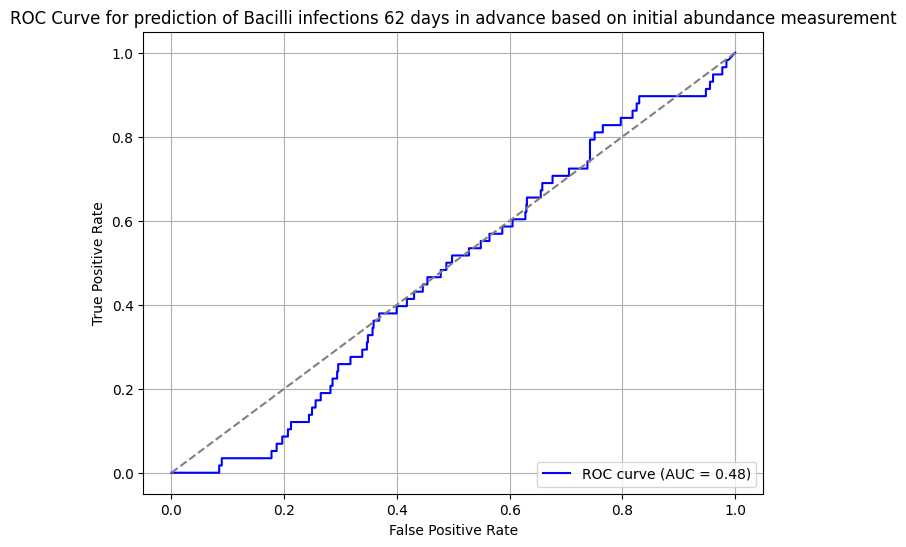

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


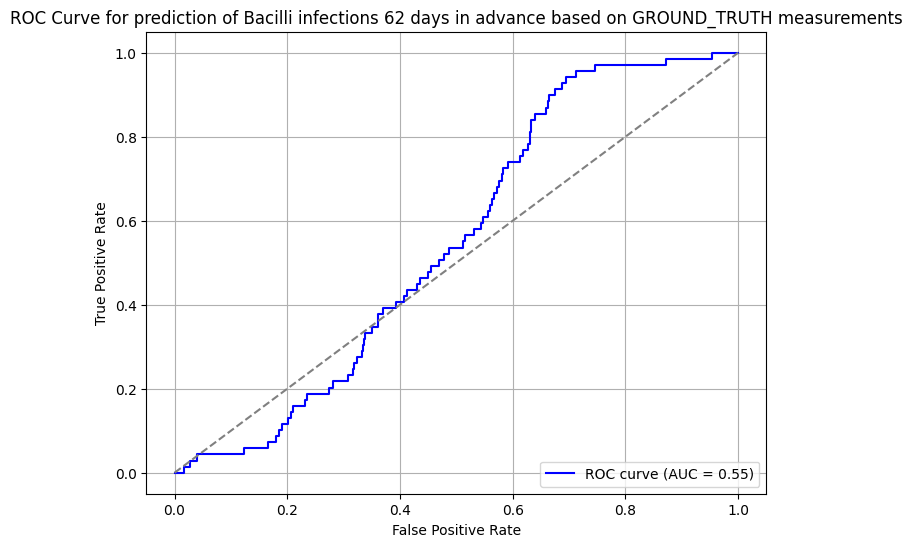

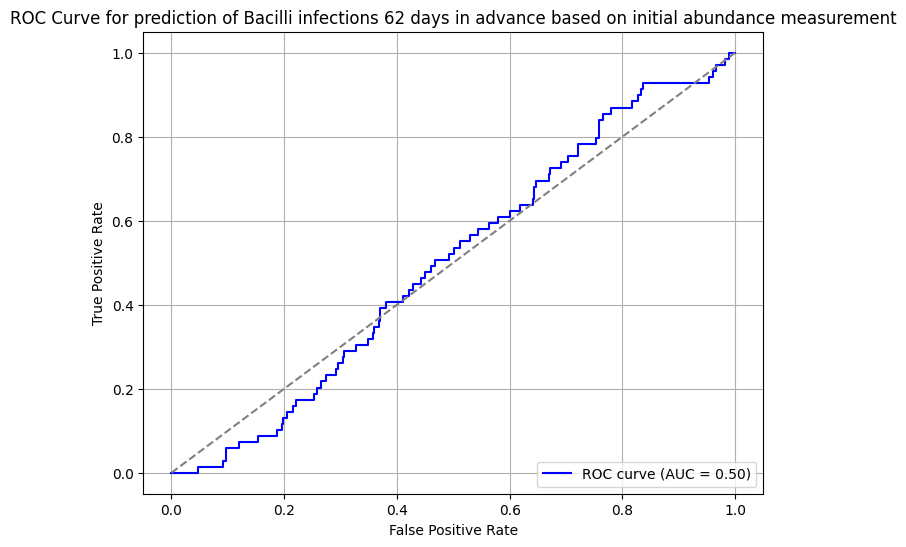

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


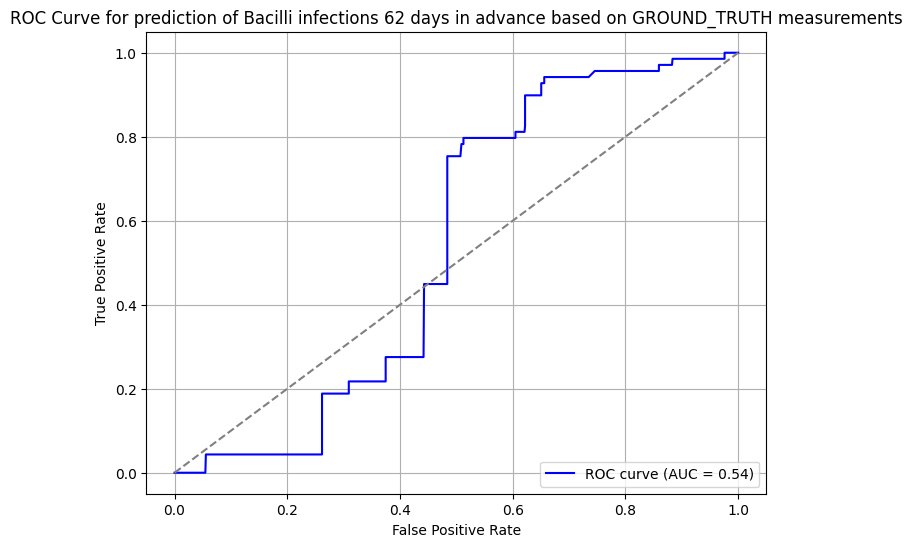

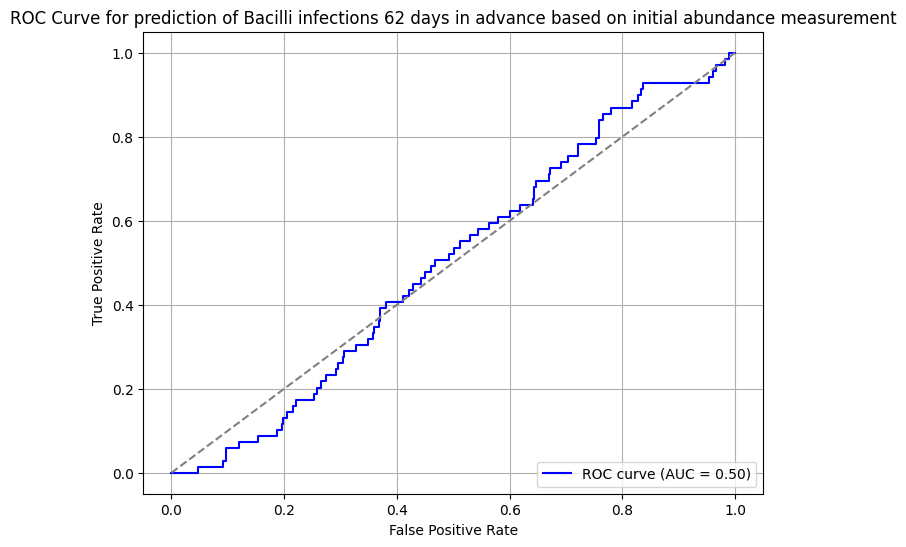

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


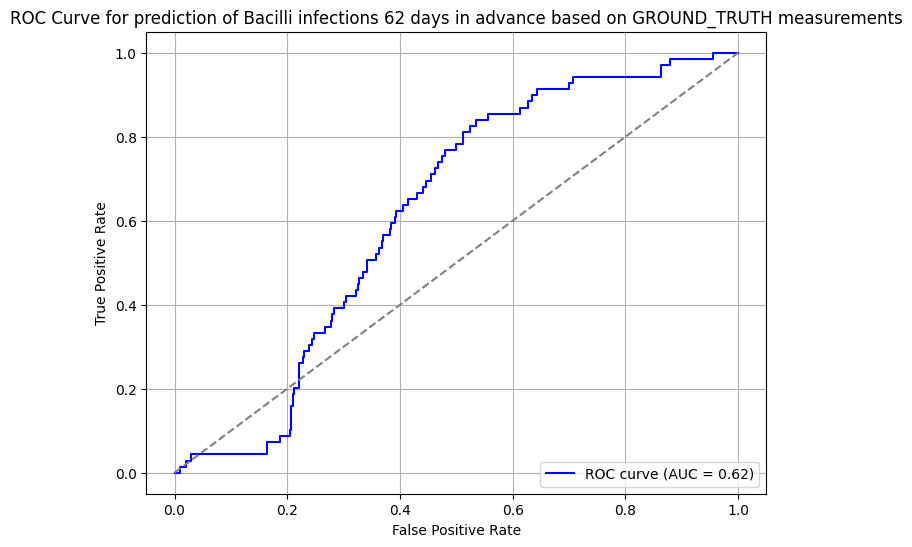

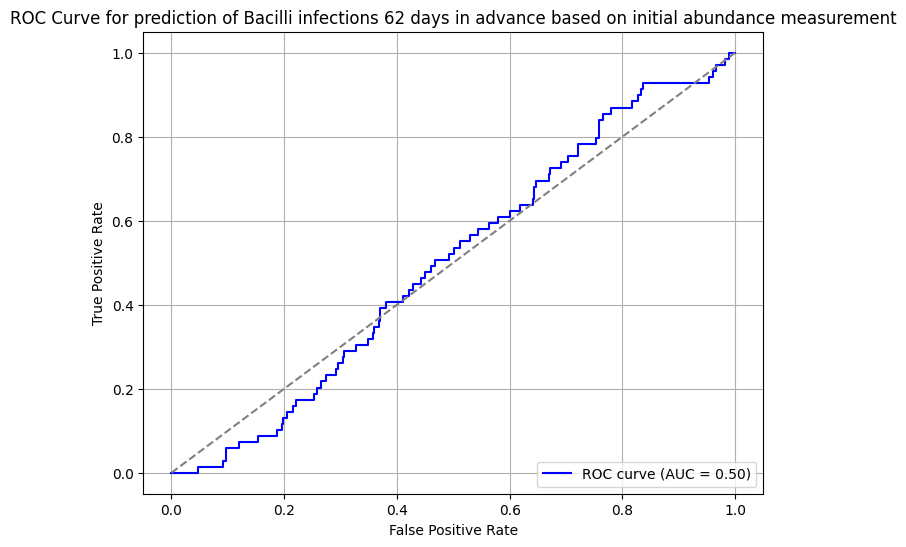

computing infection predictions...
plotting ROC curve...


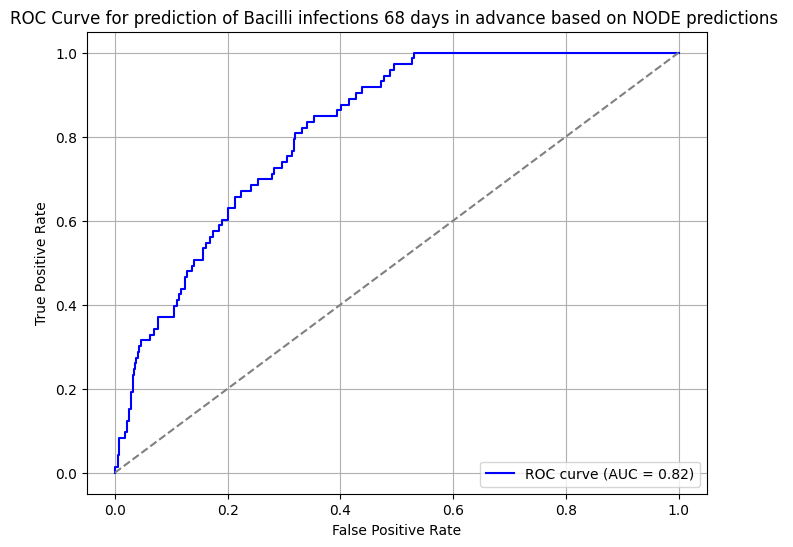

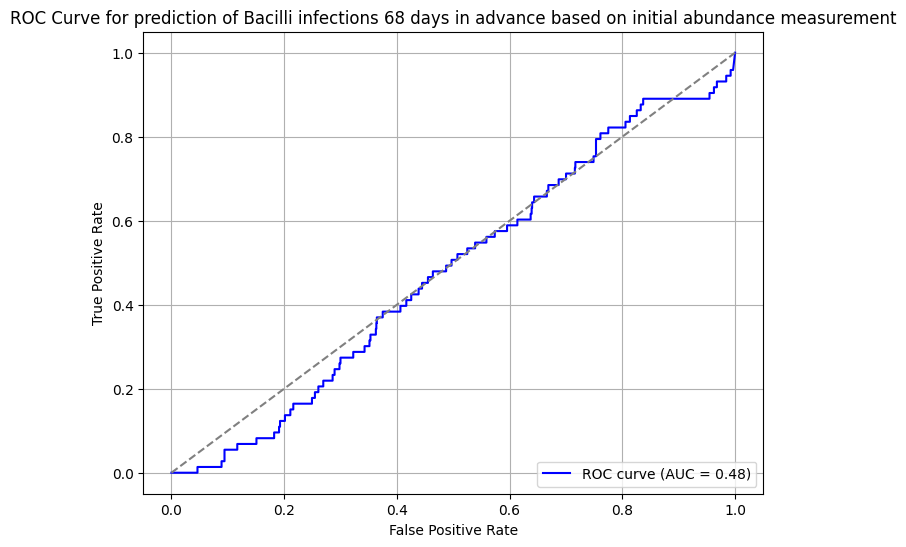

computing infection predictions...
plotting ROC curve...


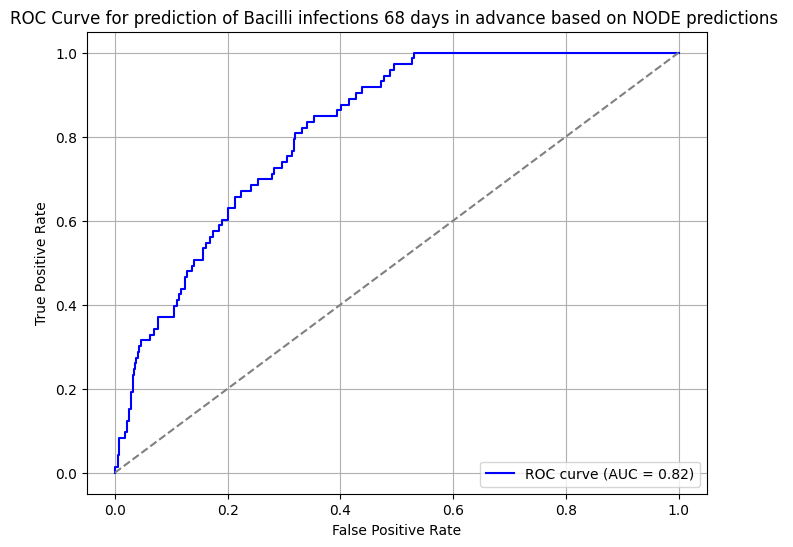

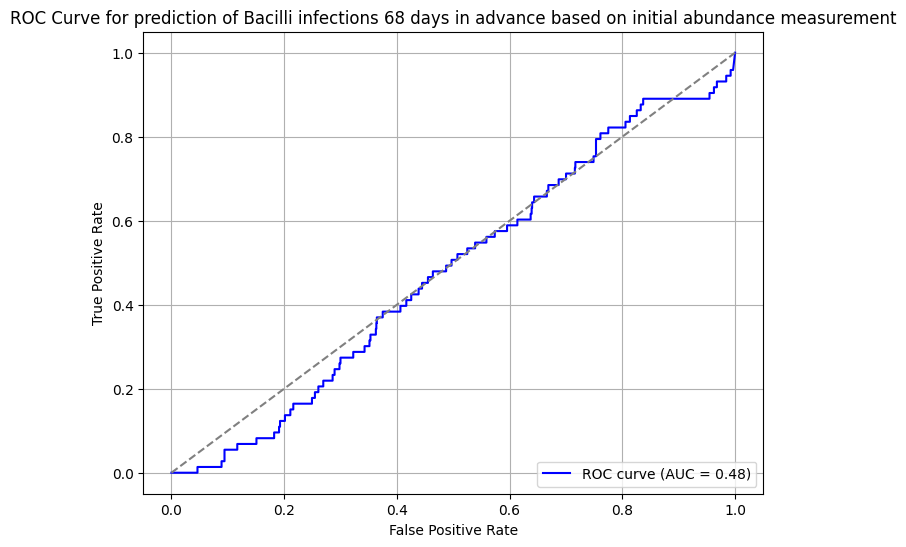

computing infection predictions...
plotting ROC curve...


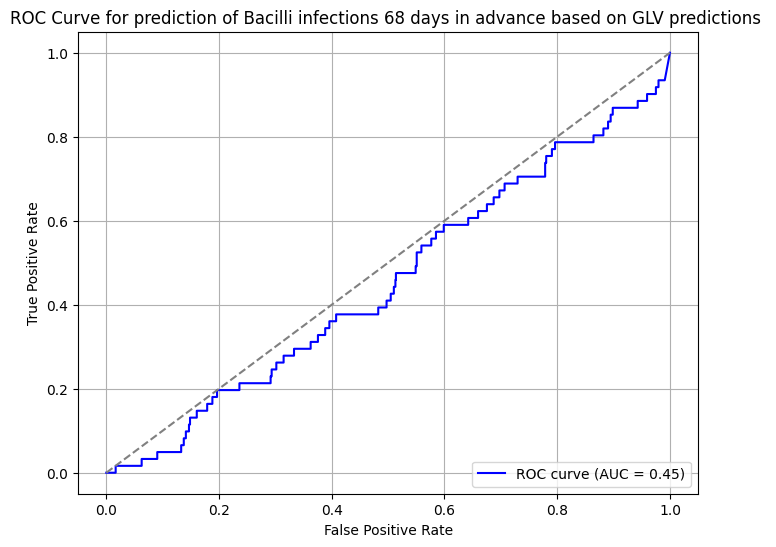

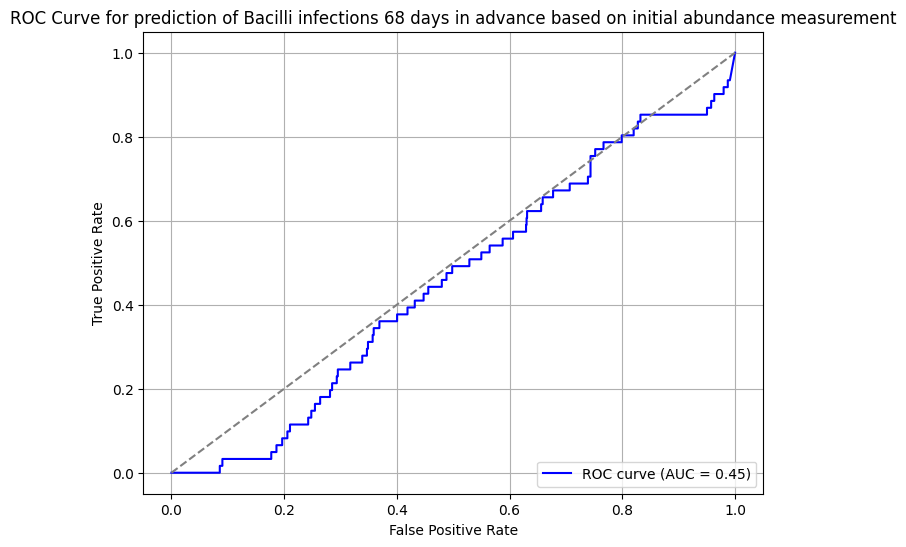

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


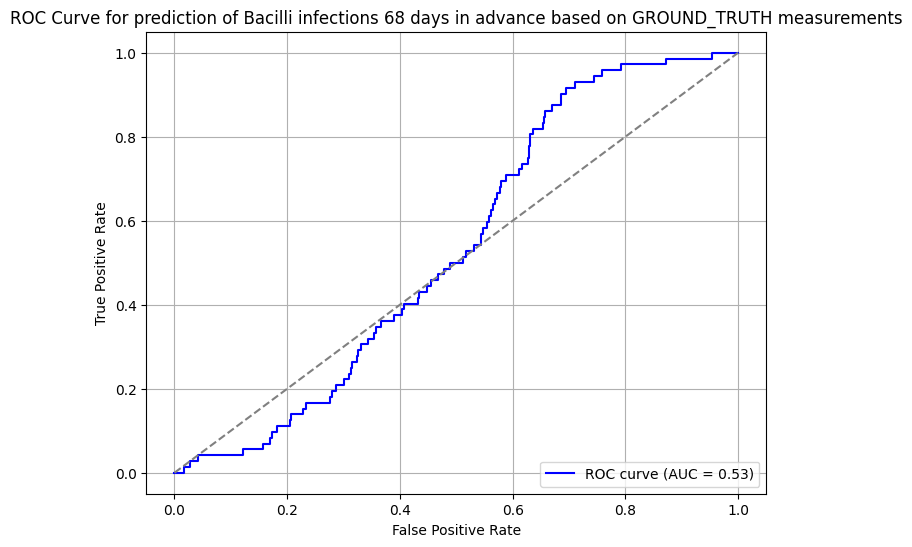

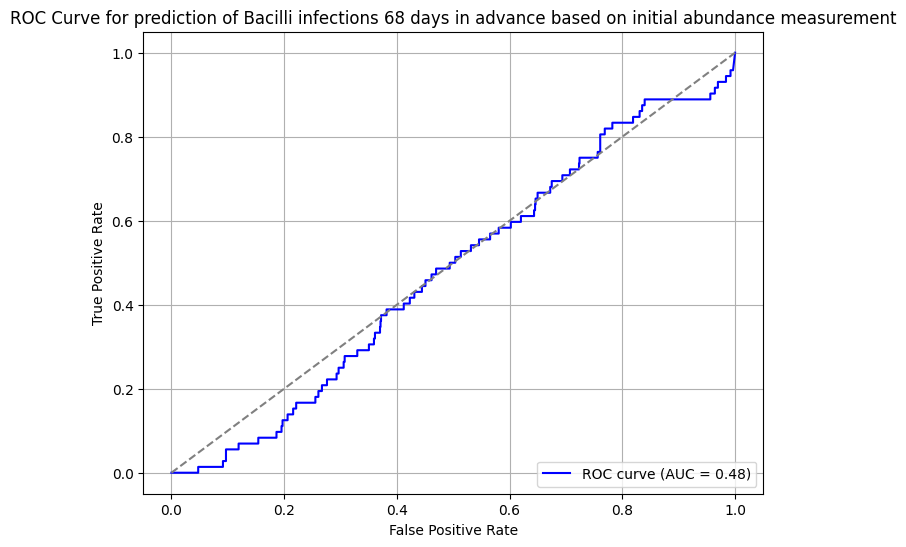

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


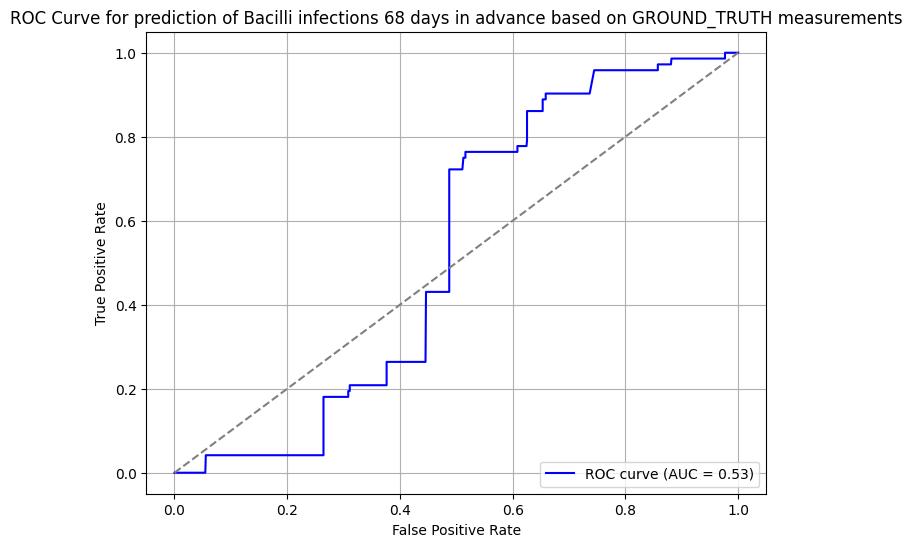

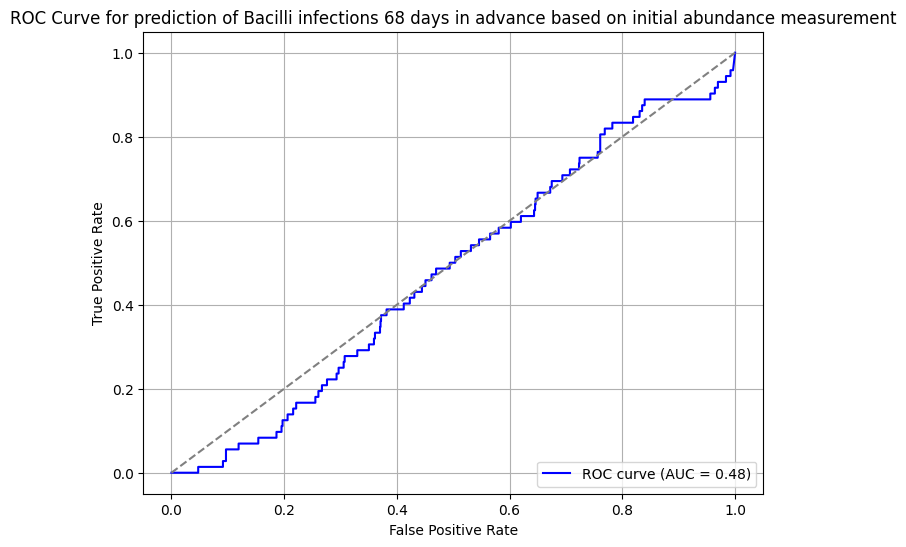

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


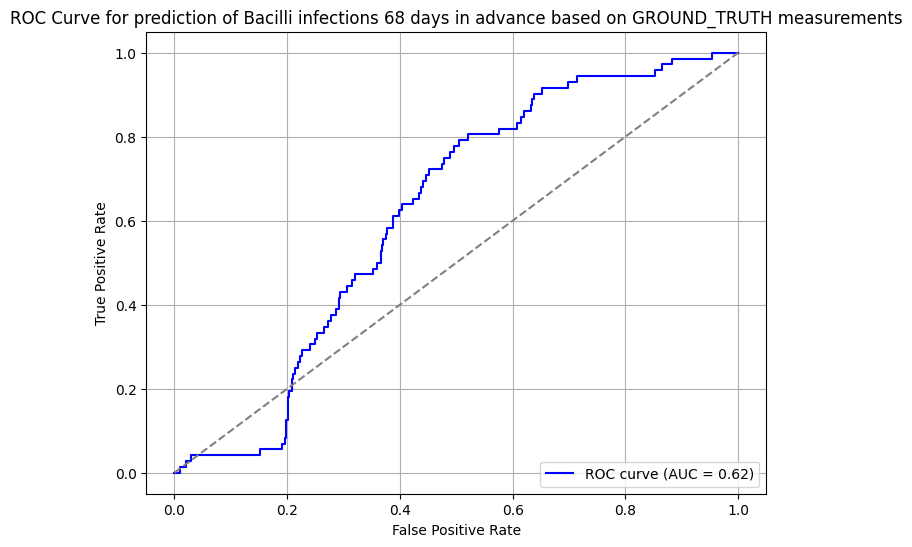

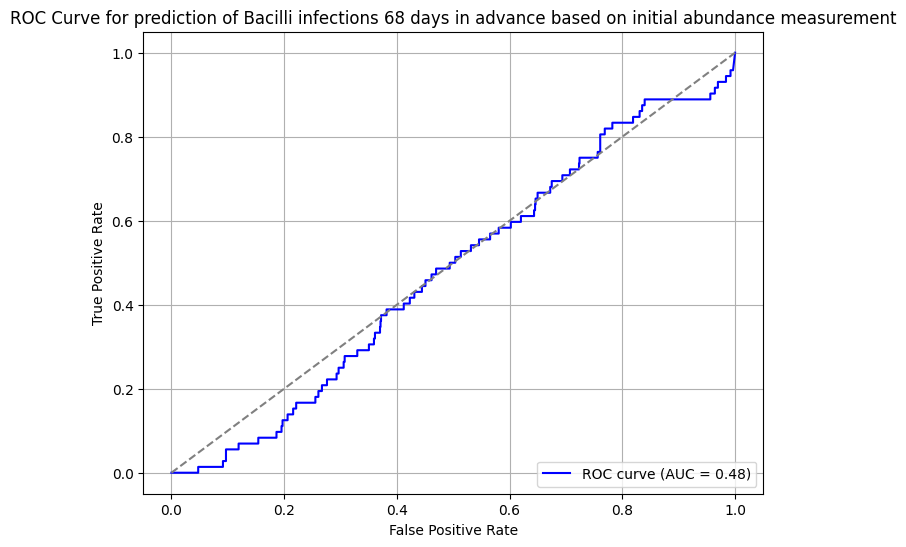

computing infection predictions...
plotting ROC curve...


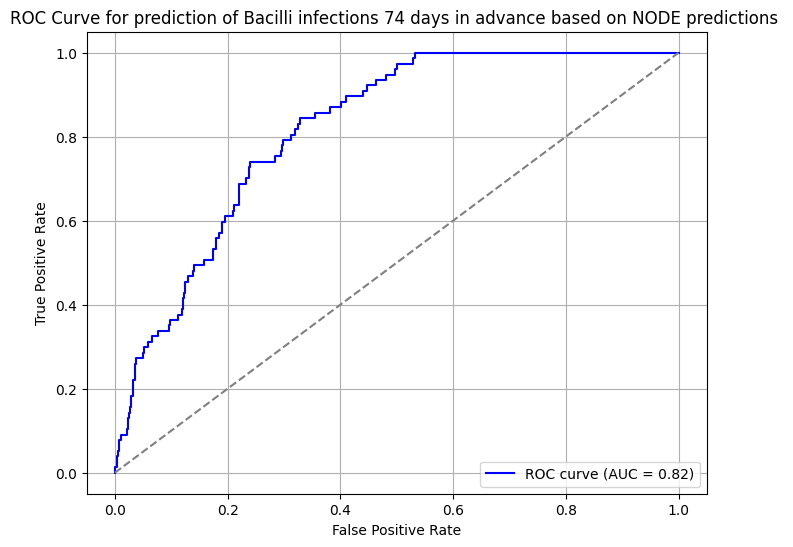

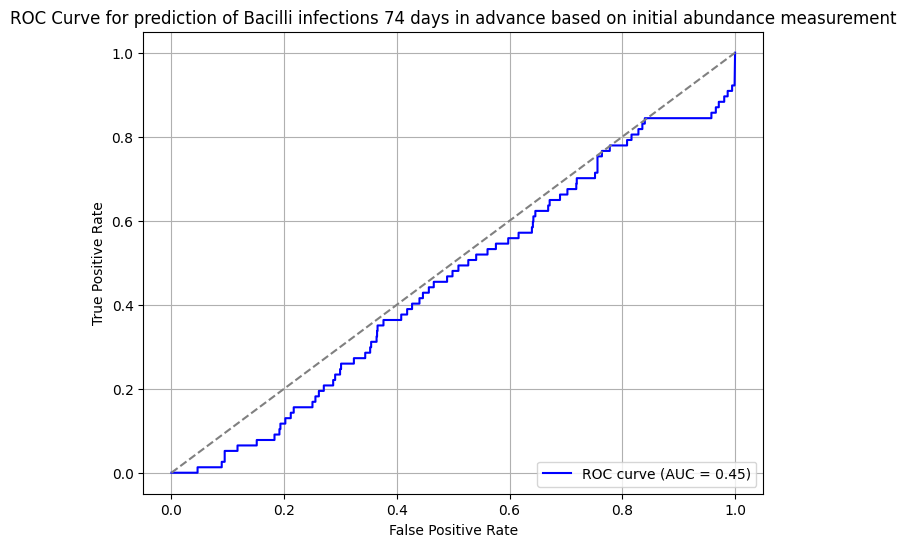

computing infection predictions...
plotting ROC curve...


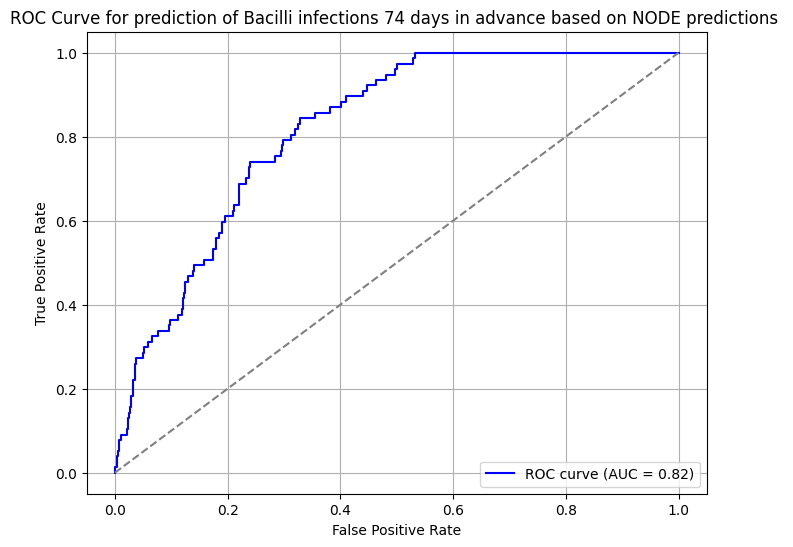

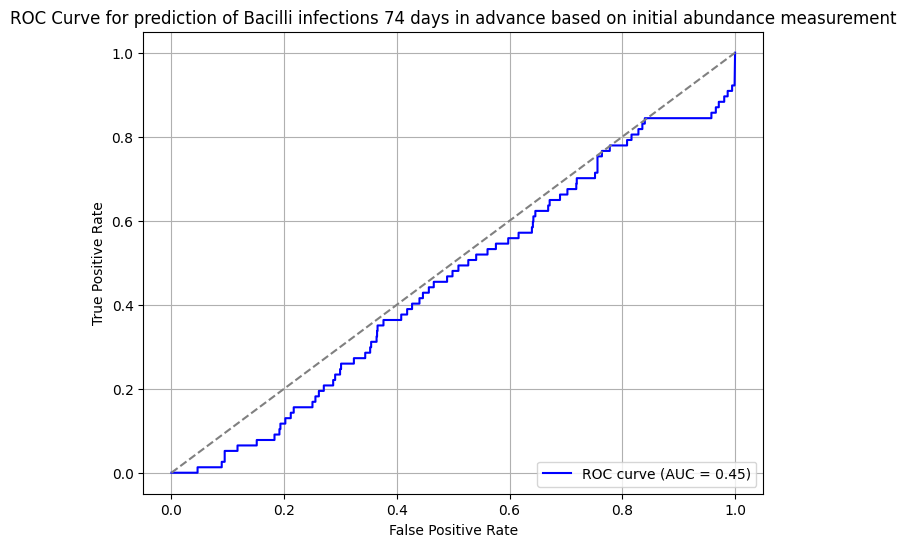

computing infection predictions...
plotting ROC curve...


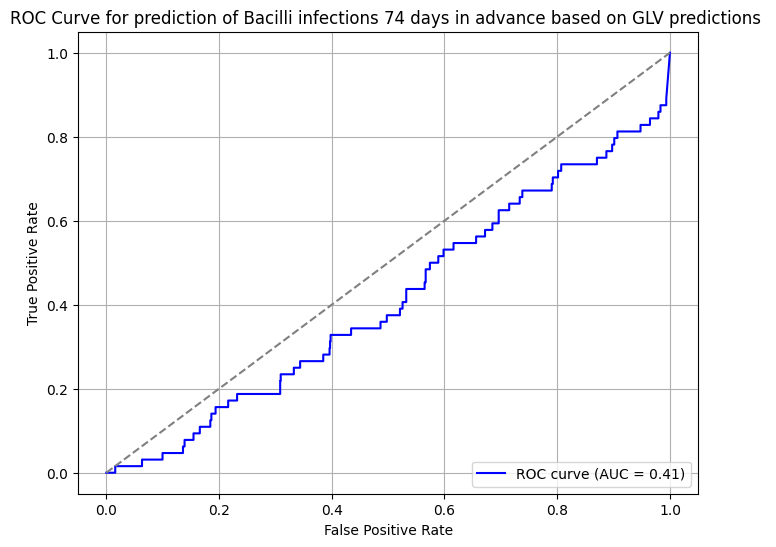

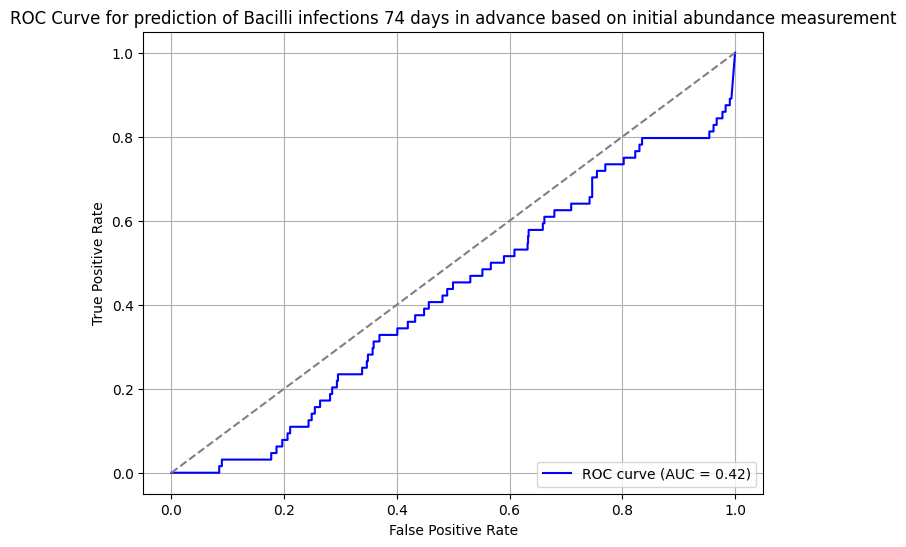

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


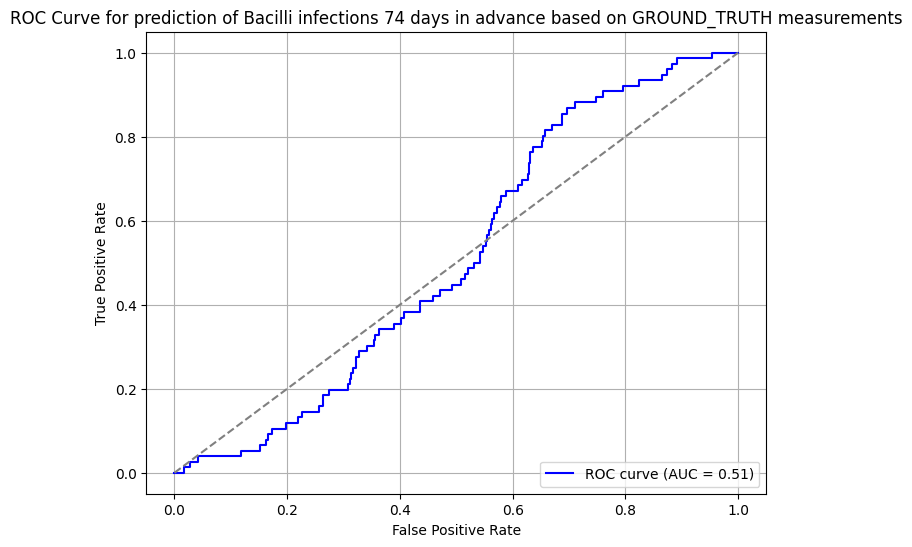

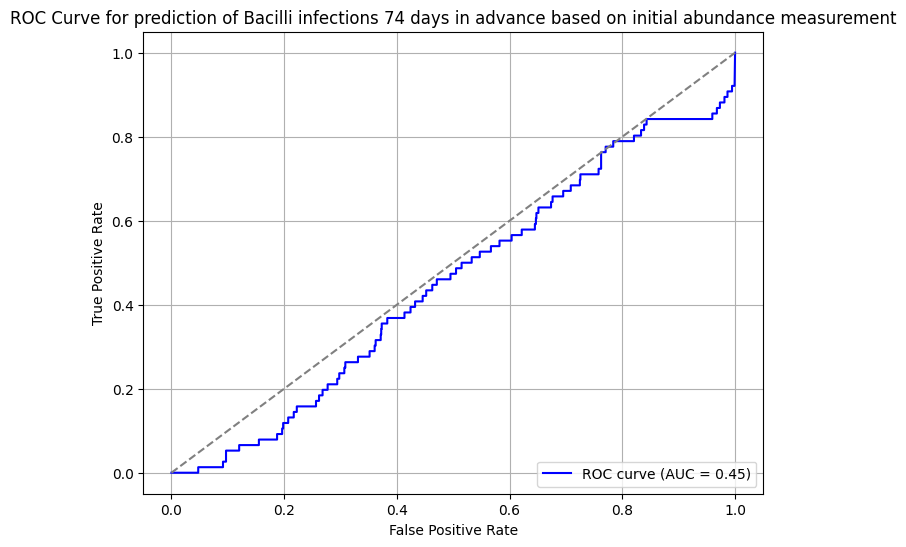

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


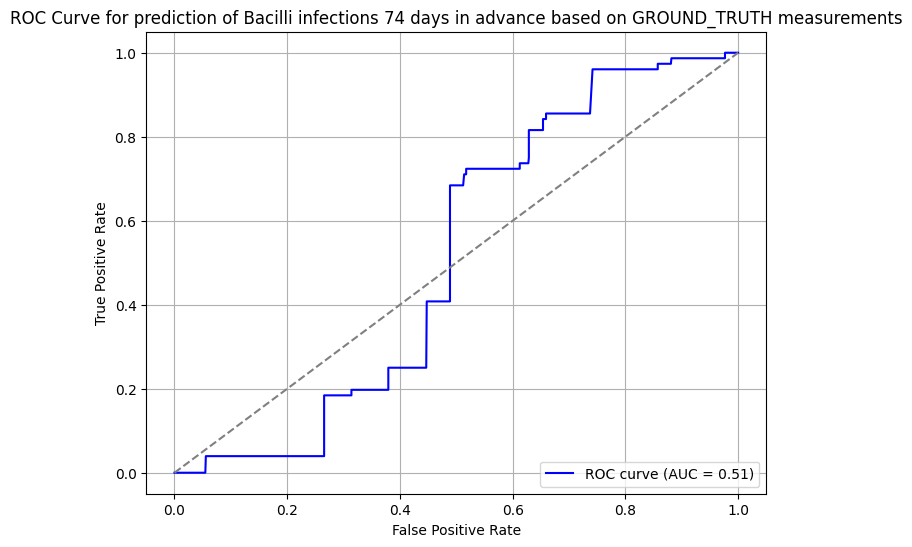

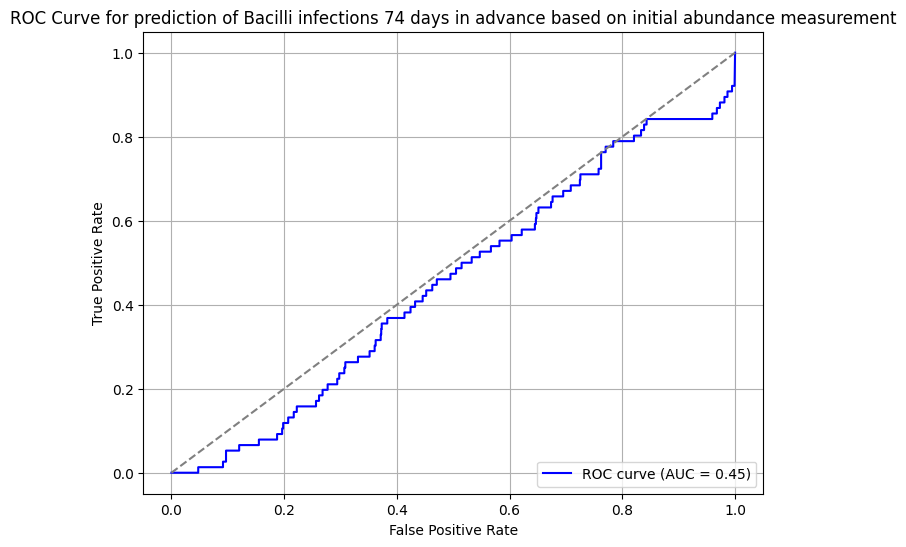

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


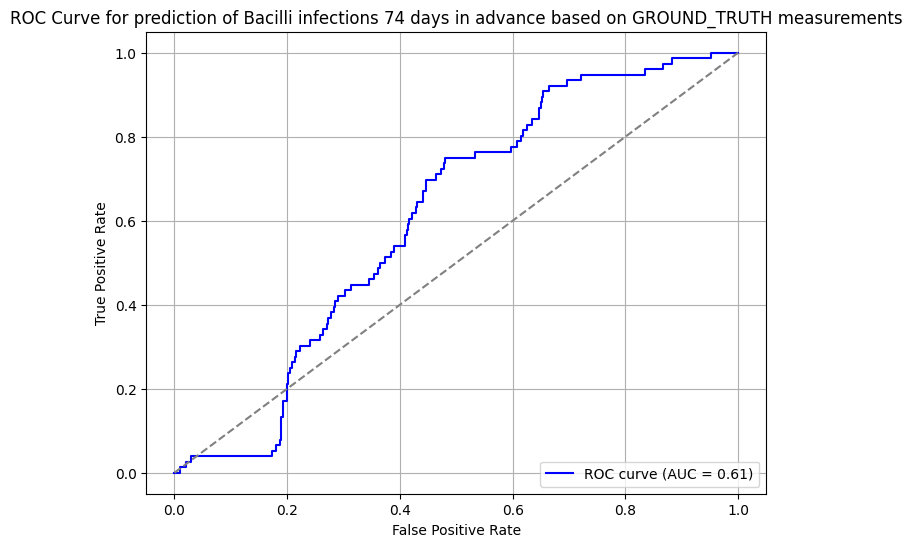

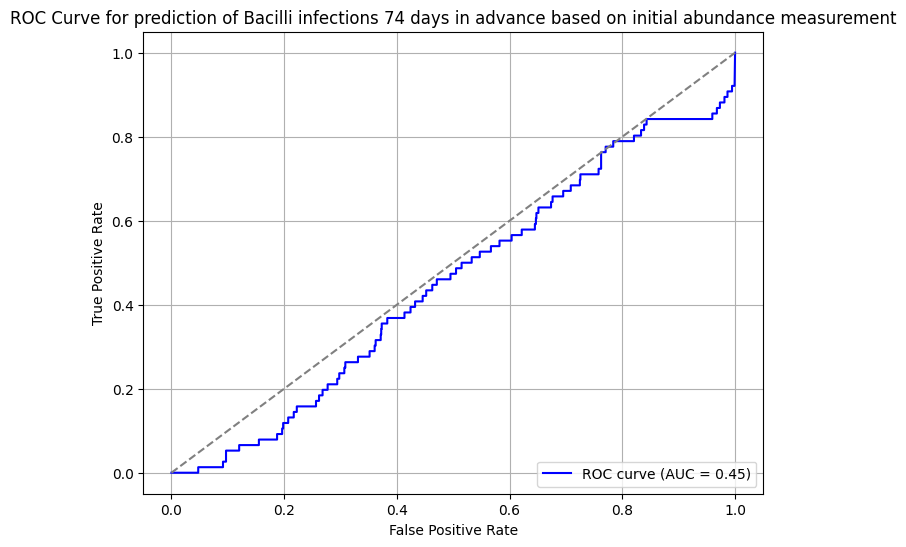

computing infection predictions...
plotting ROC curve...


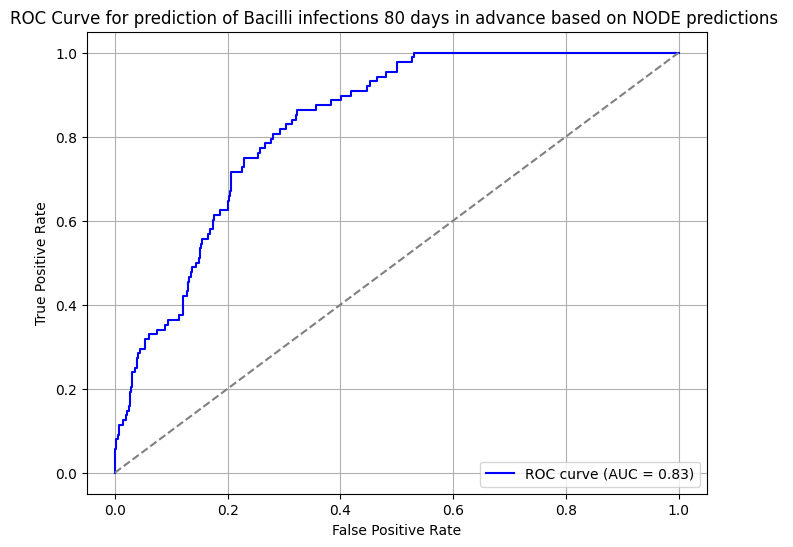

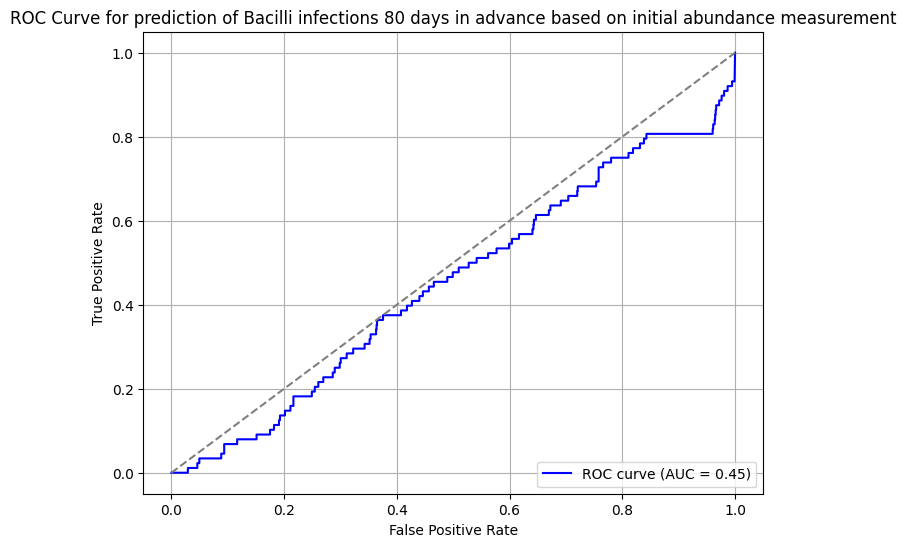

computing infection predictions...
plotting ROC curve...


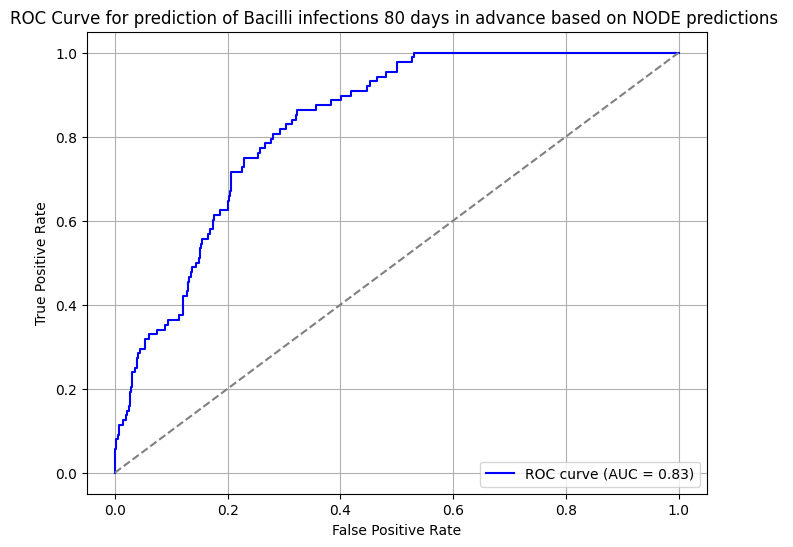

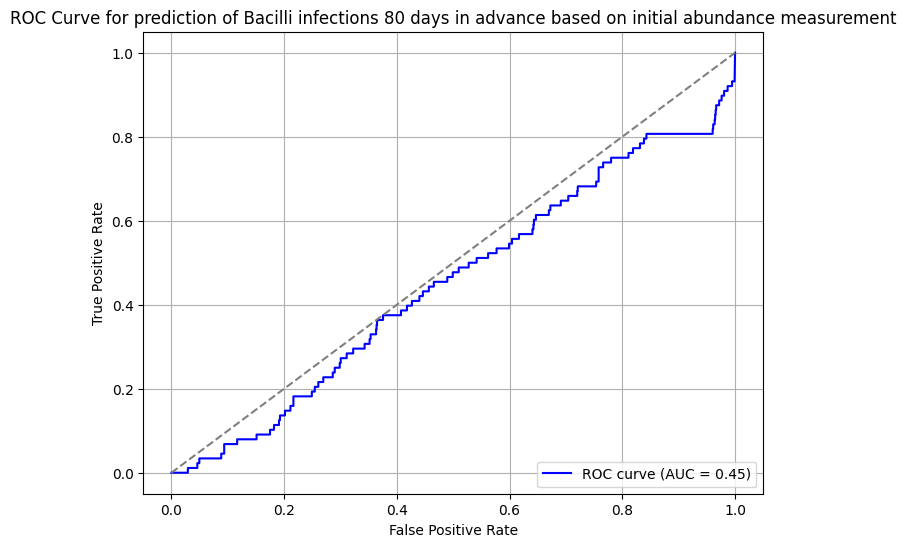

computing infection predictions...
plotting ROC curve...


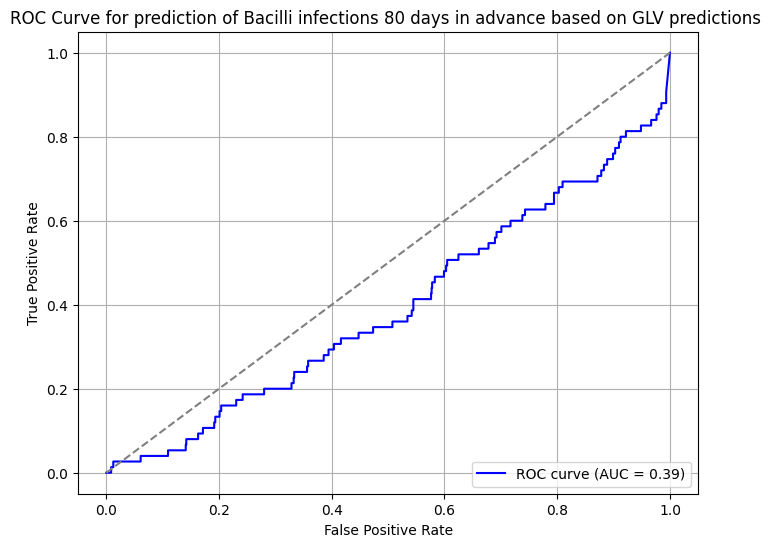

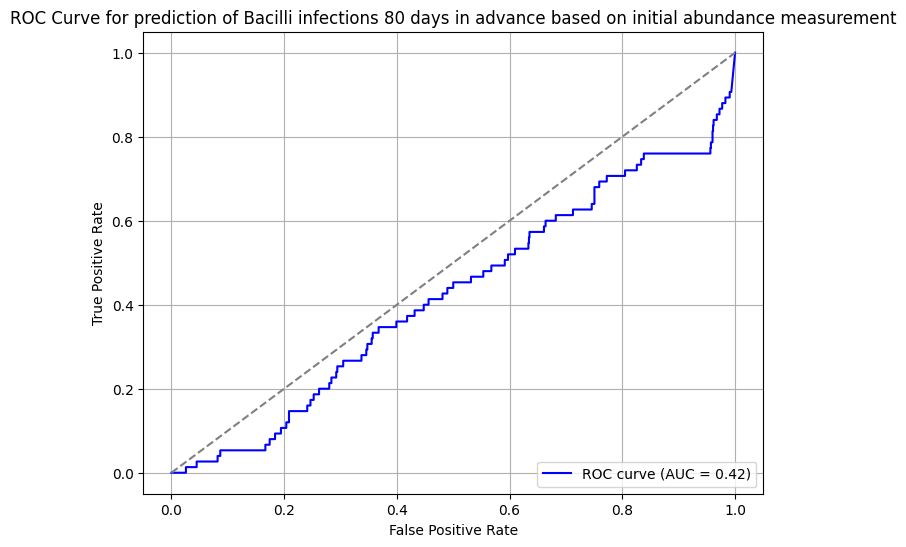

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


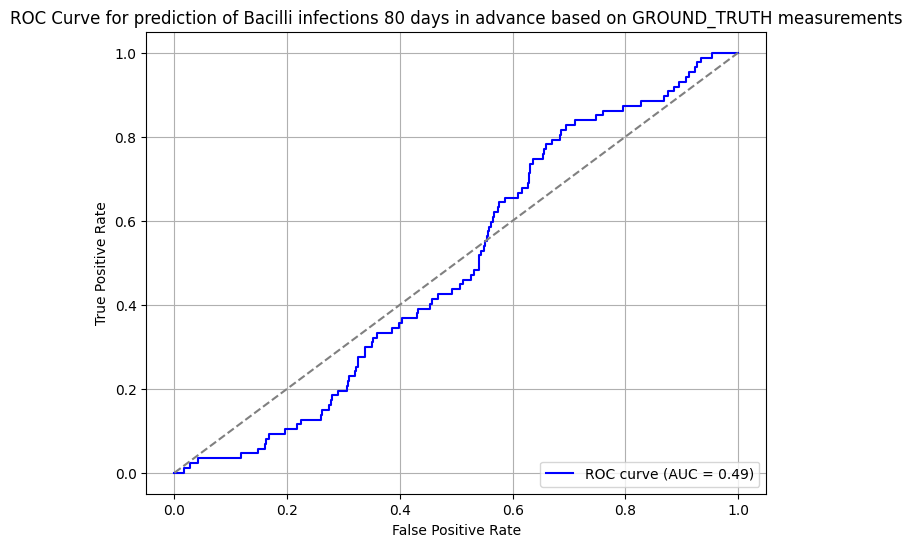

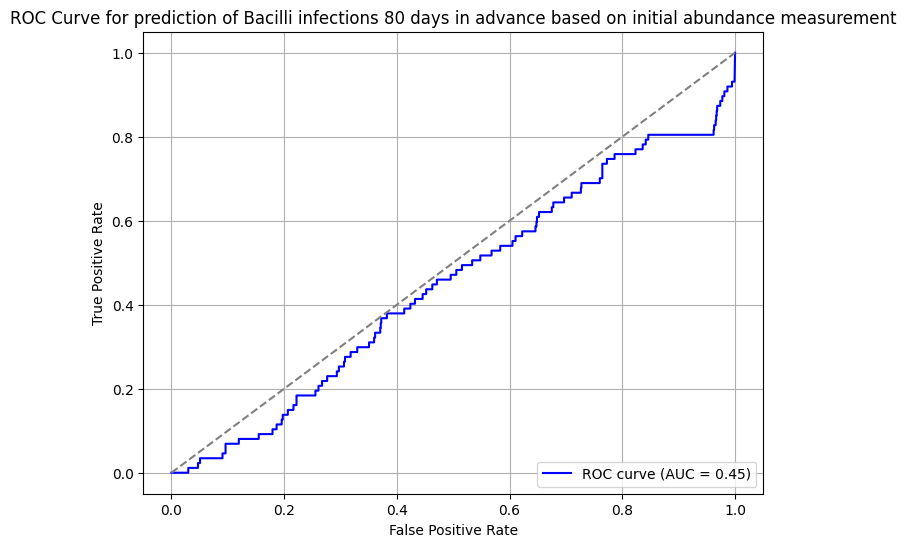

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


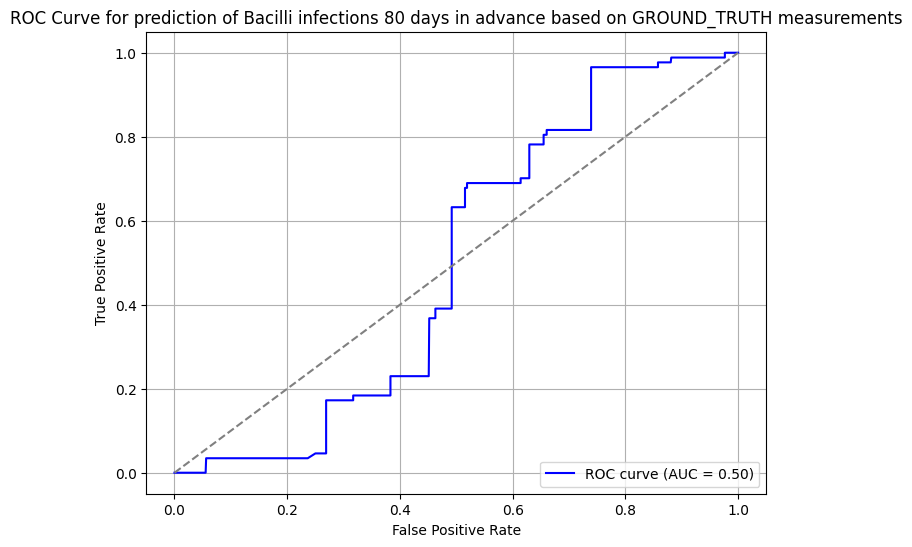

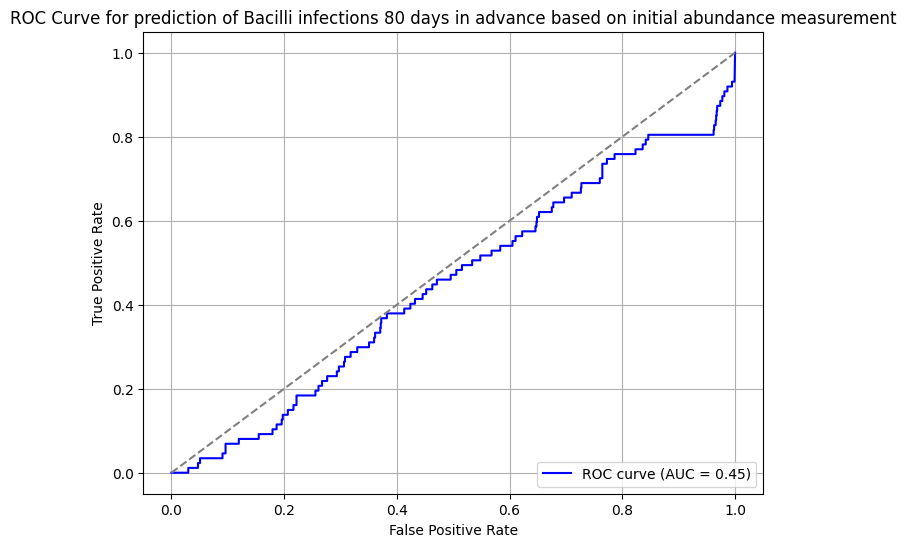

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


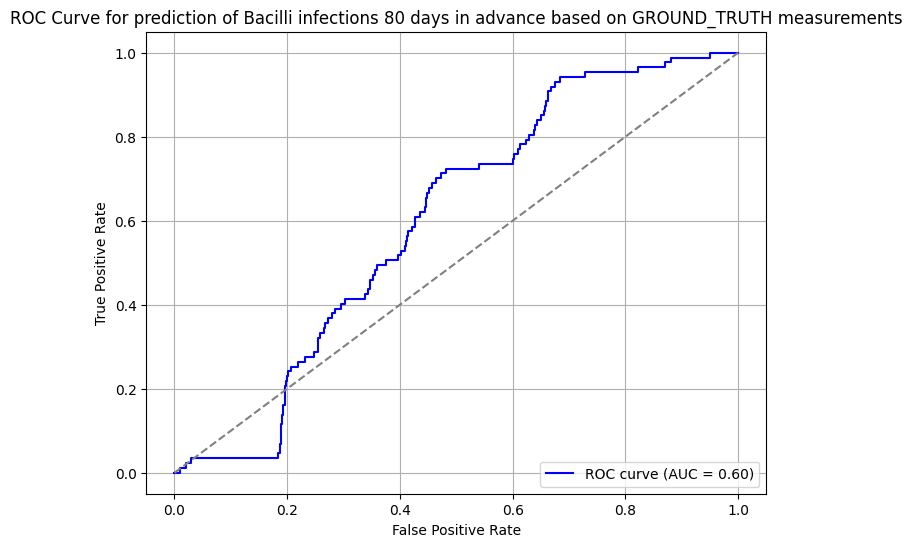

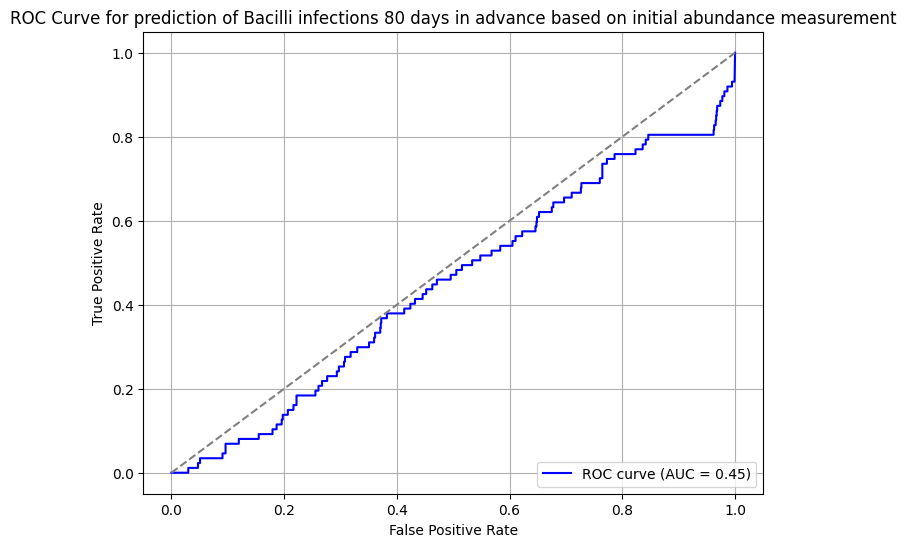

computing infection predictions...
plotting ROC curve...


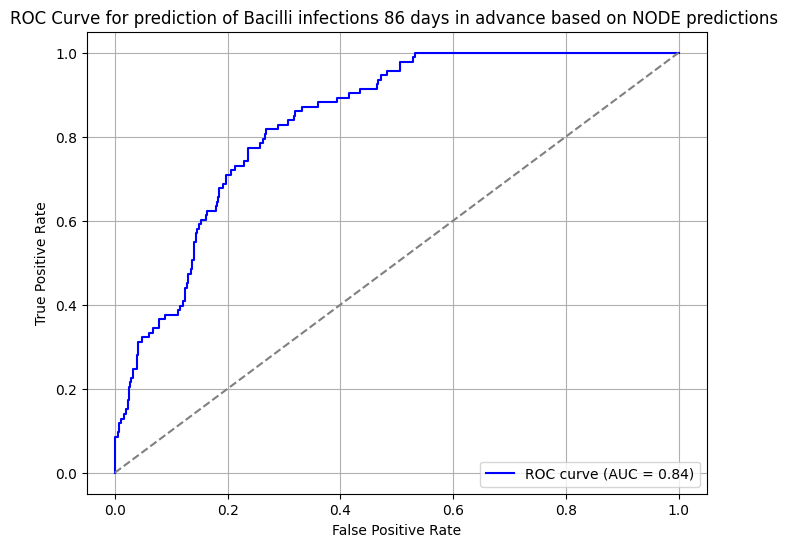

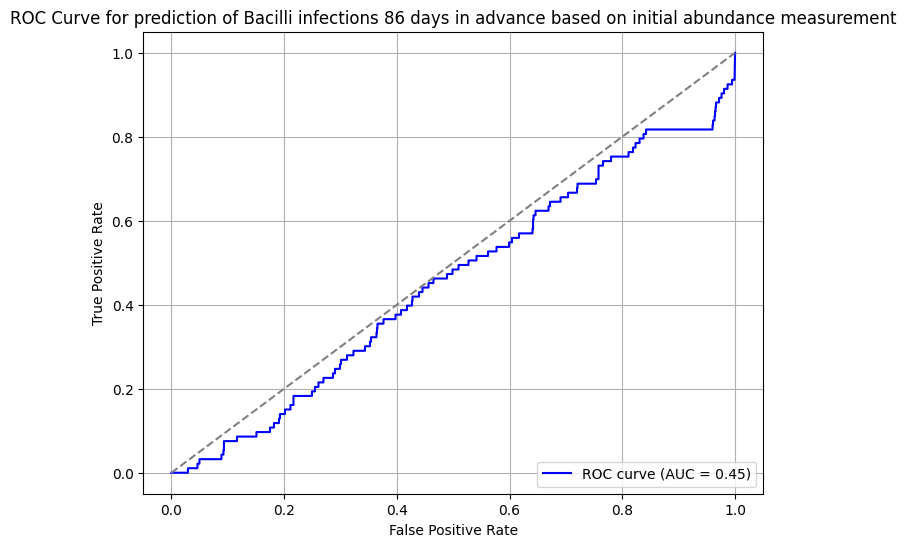

computing infection predictions...
plotting ROC curve...


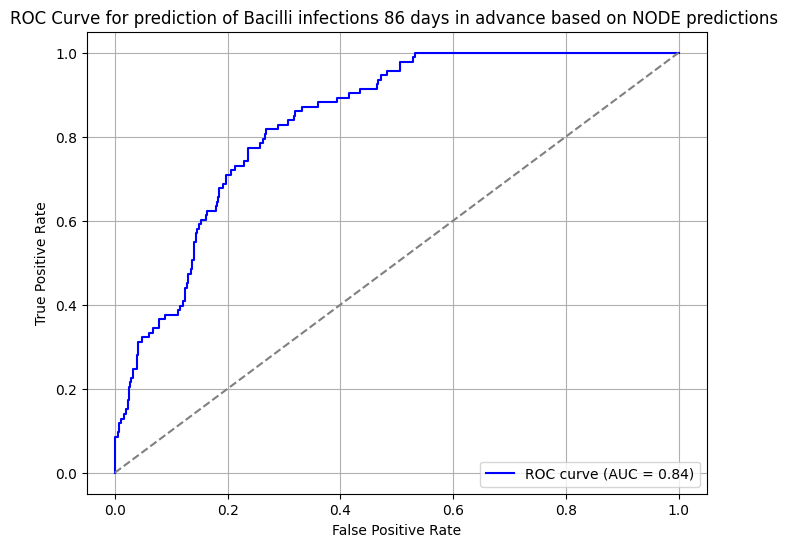

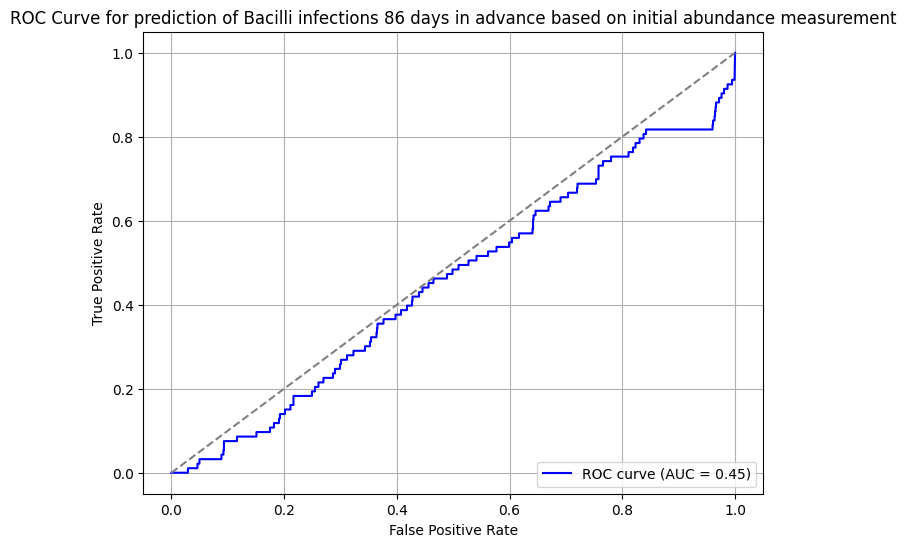

computing infection predictions...
plotting ROC curve...


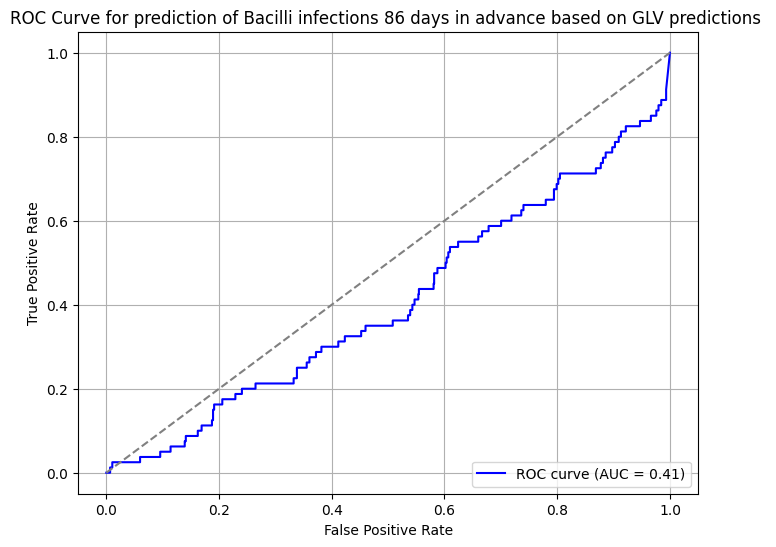

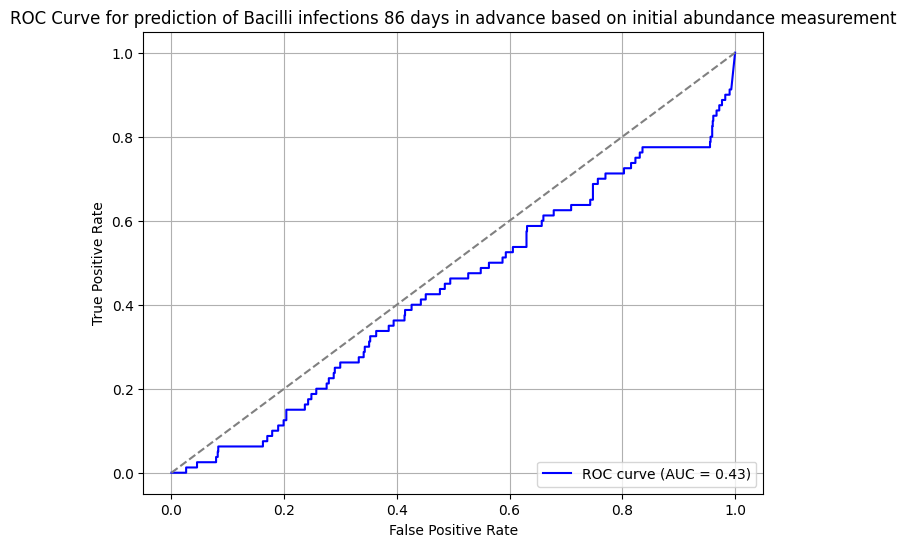

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


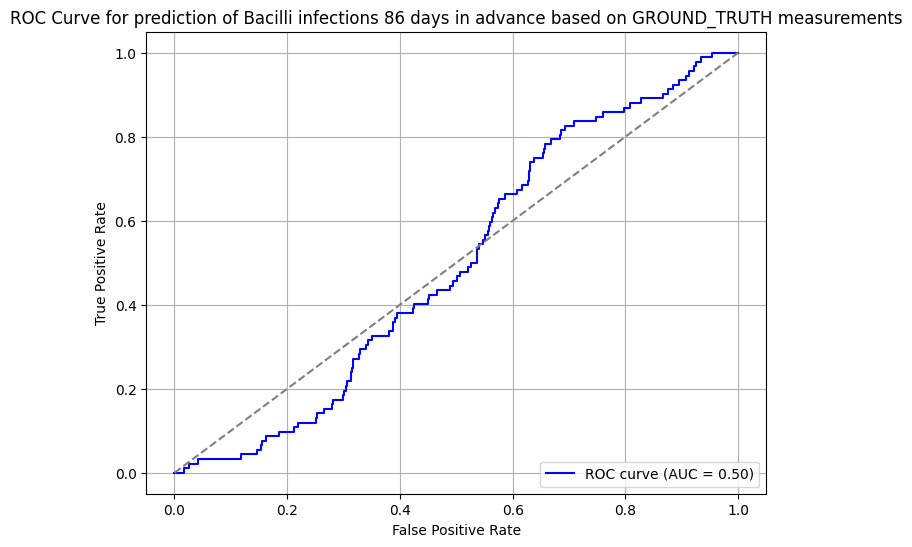

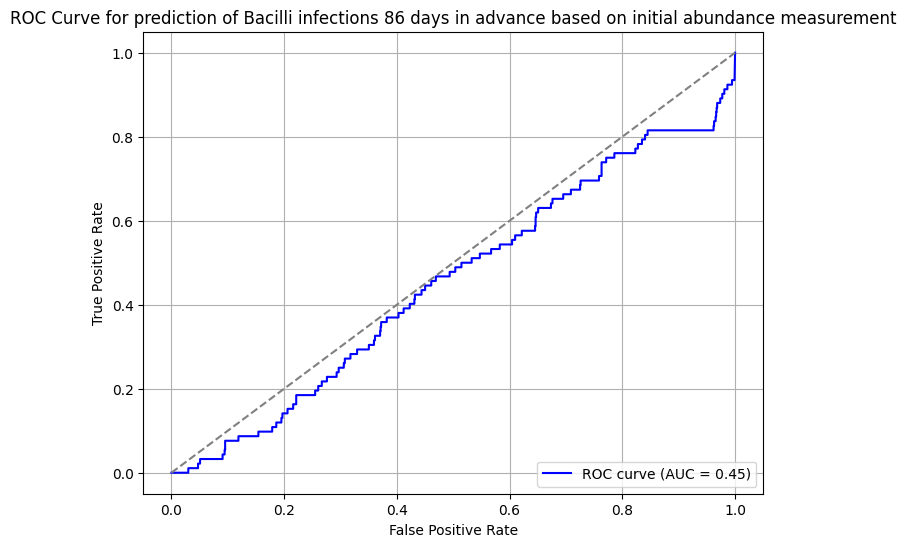

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


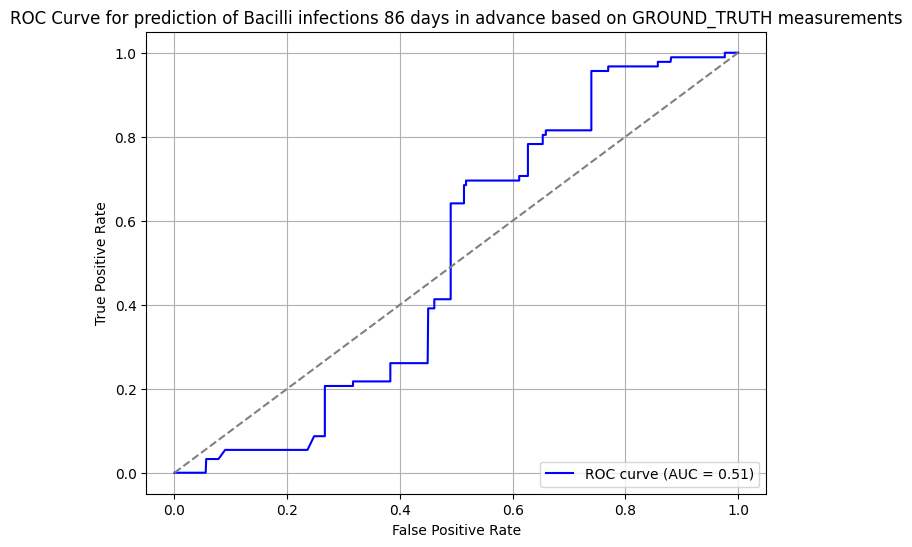

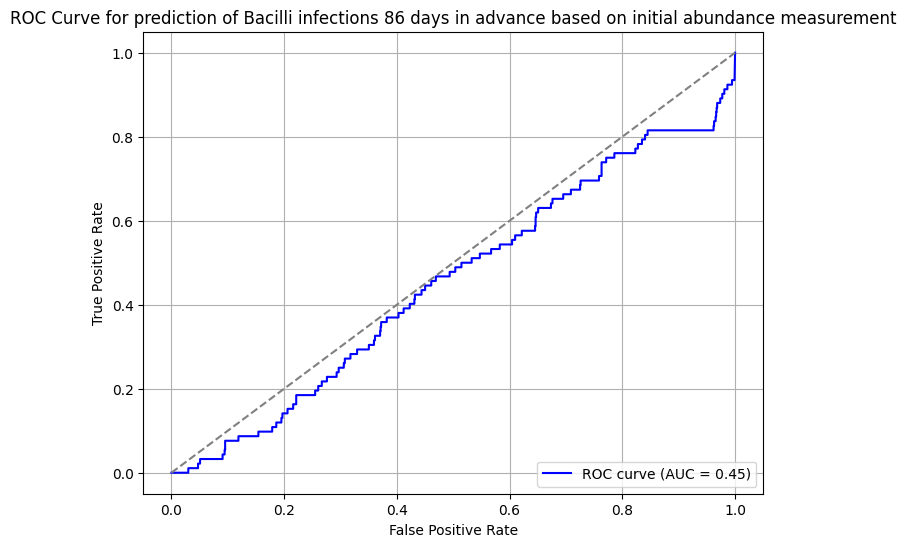

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


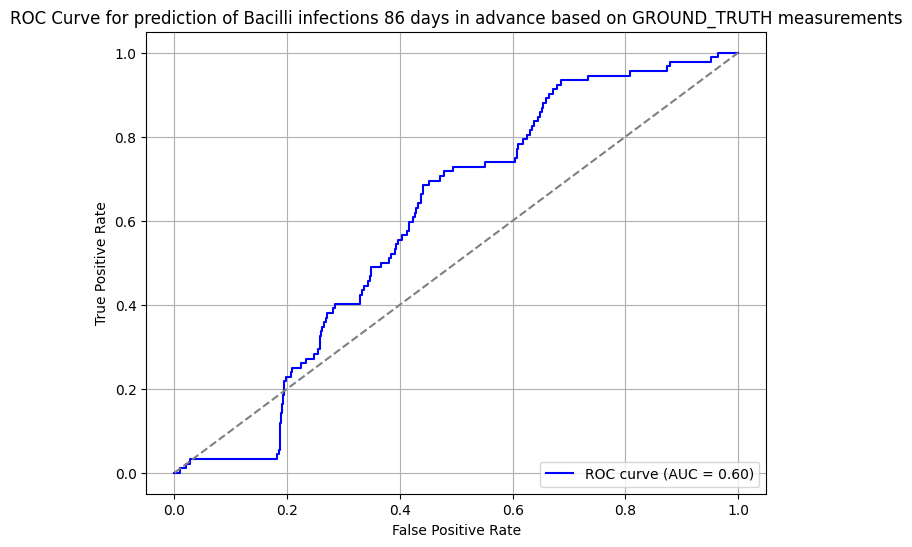

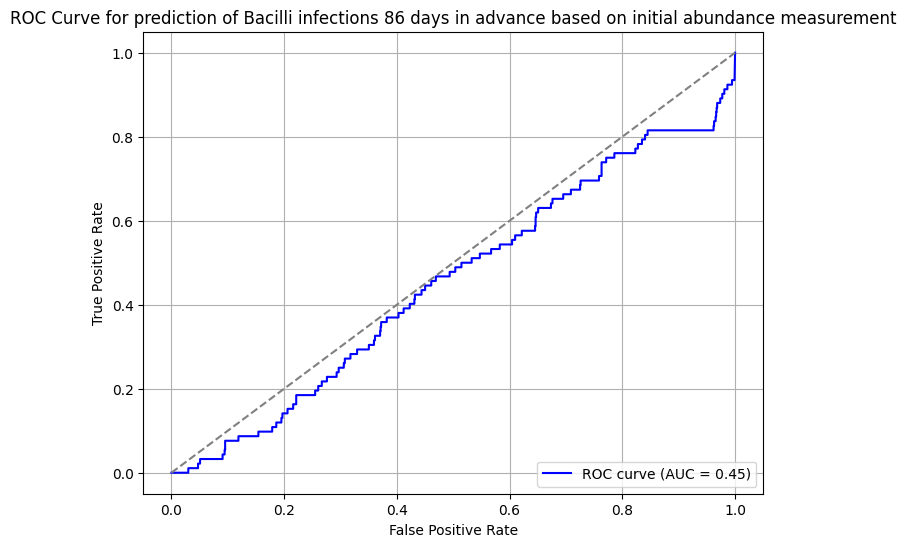

computing infection predictions...
plotting ROC curve...


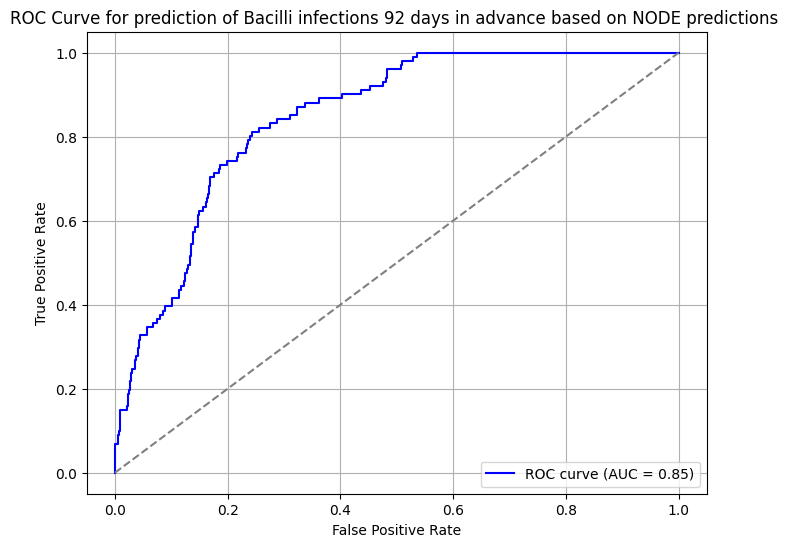

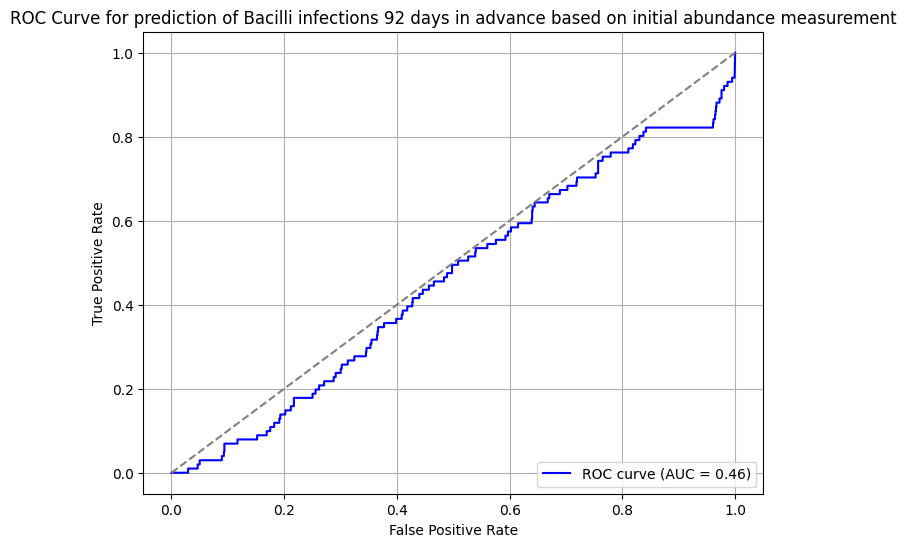

computing infection predictions...
plotting ROC curve...


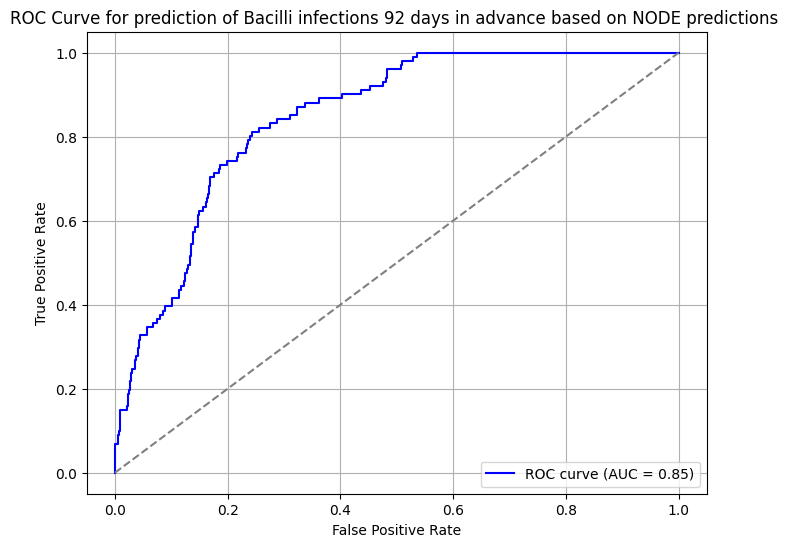

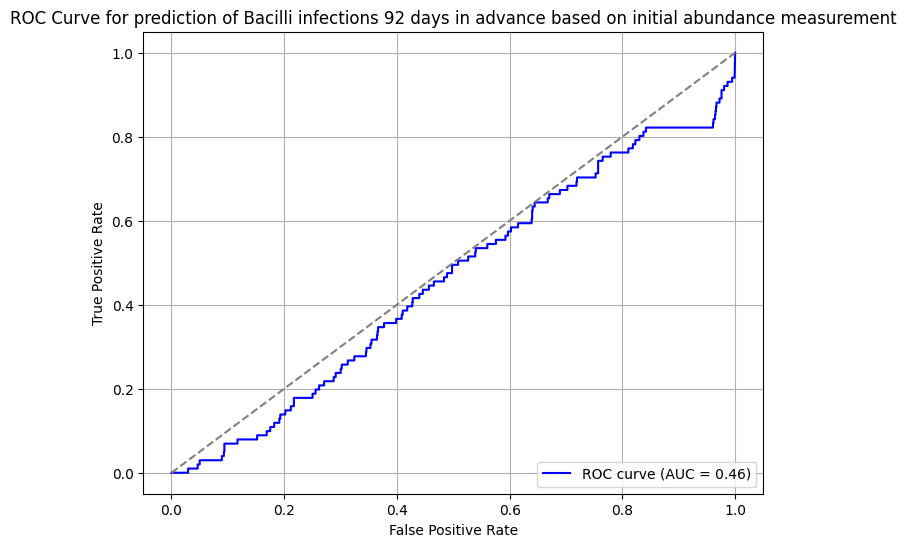

computing infection predictions...
plotting ROC curve...


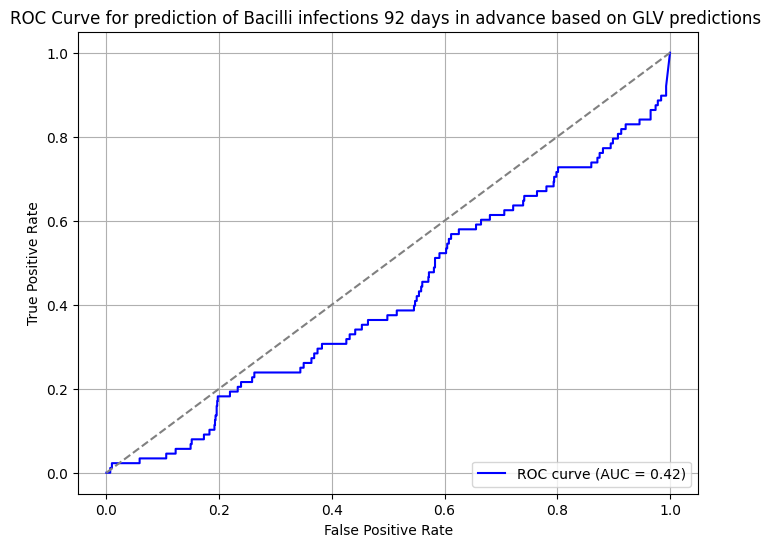

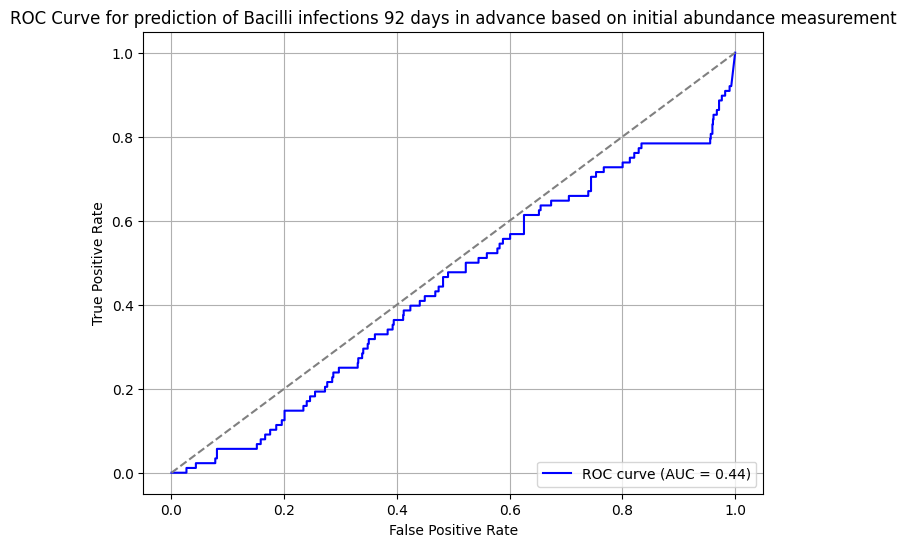

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


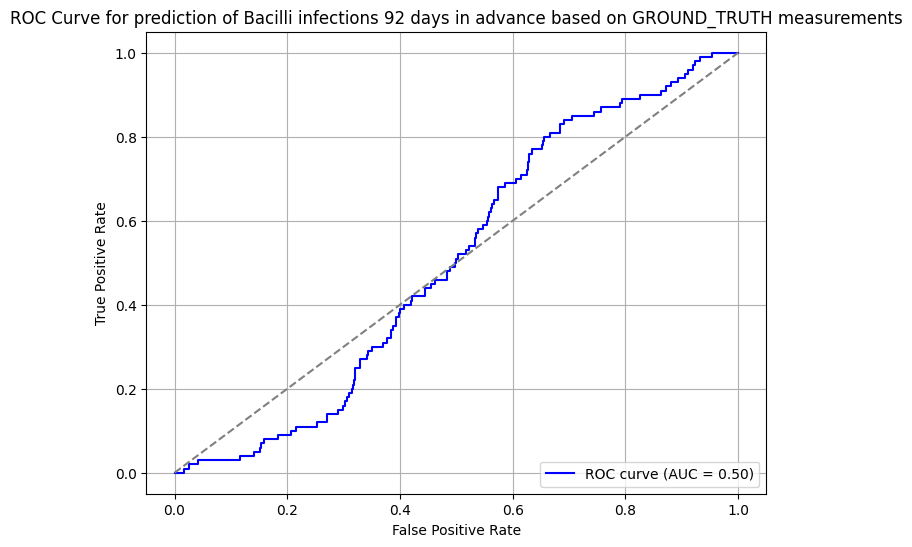

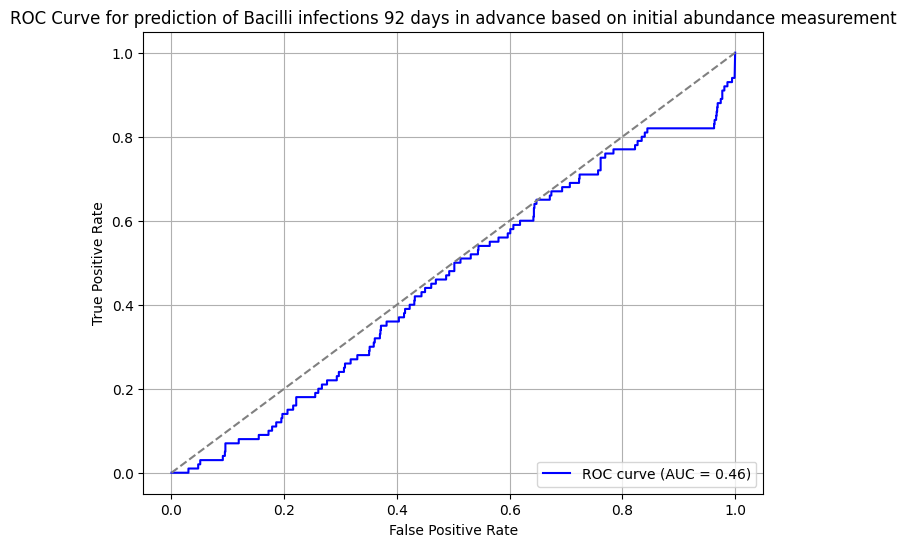

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


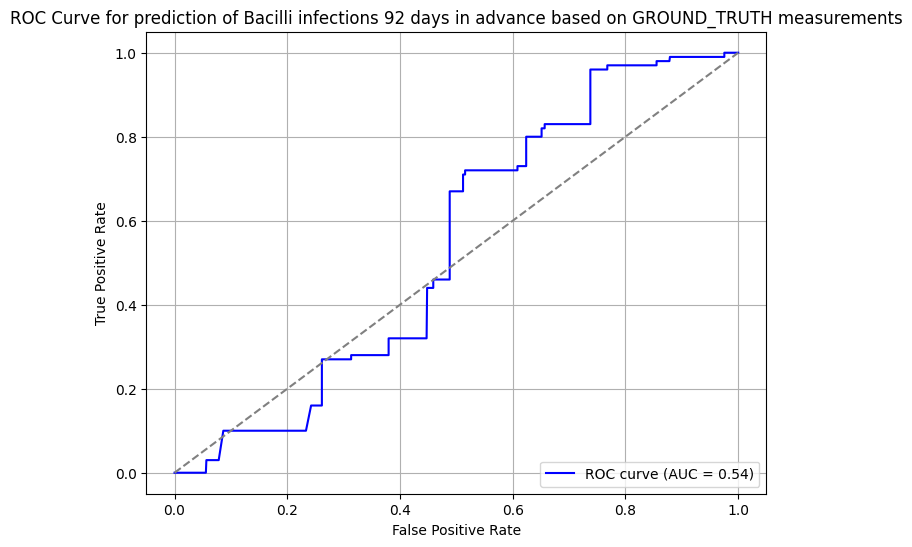

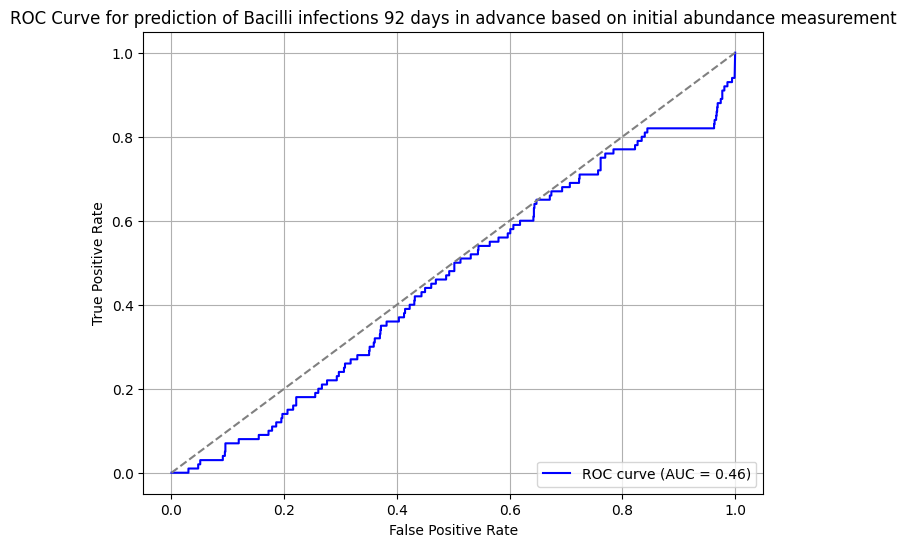

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


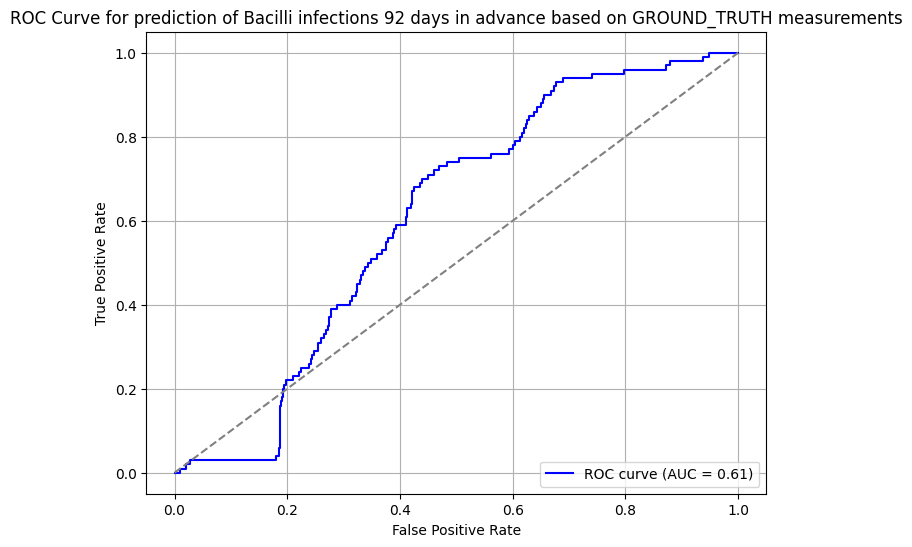

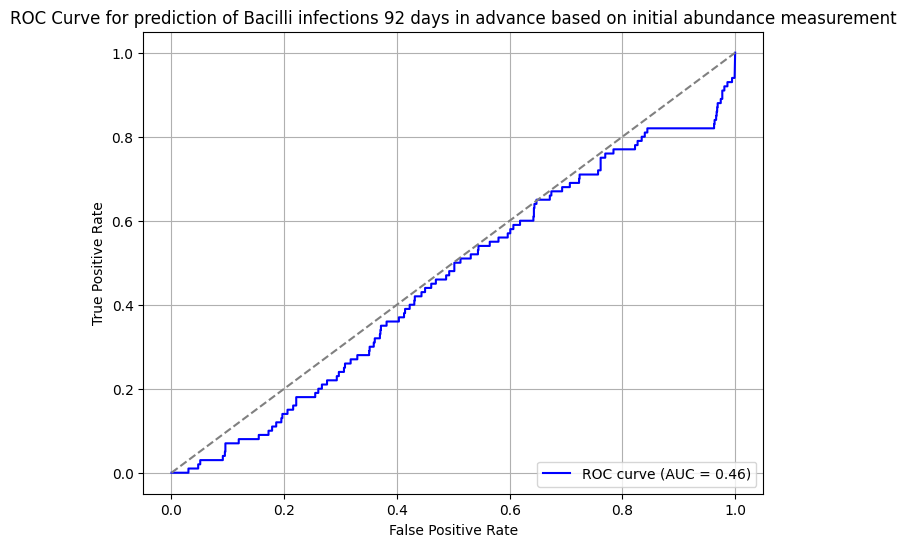

computing infection predictions...
plotting ROC curve...


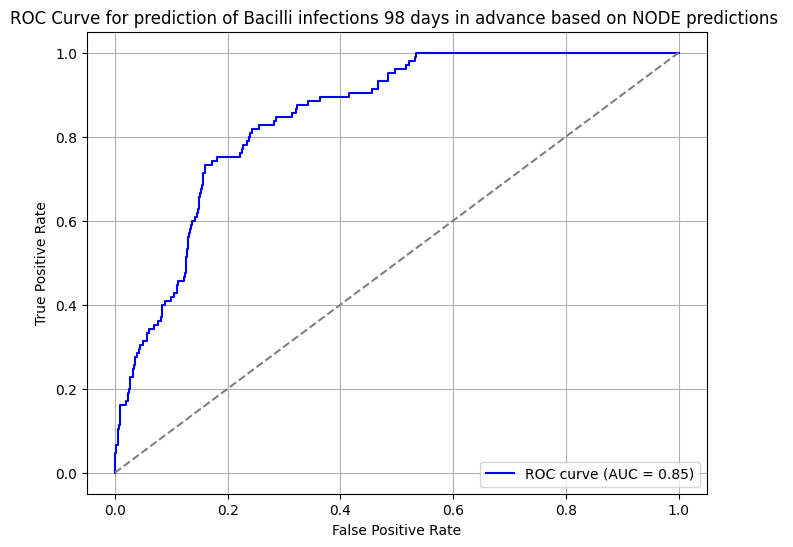

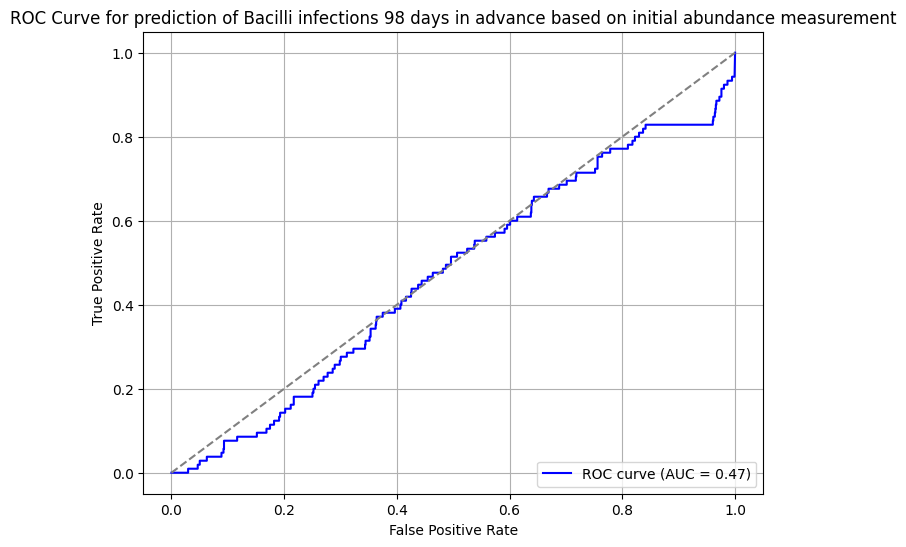

computing infection predictions...
plotting ROC curve...


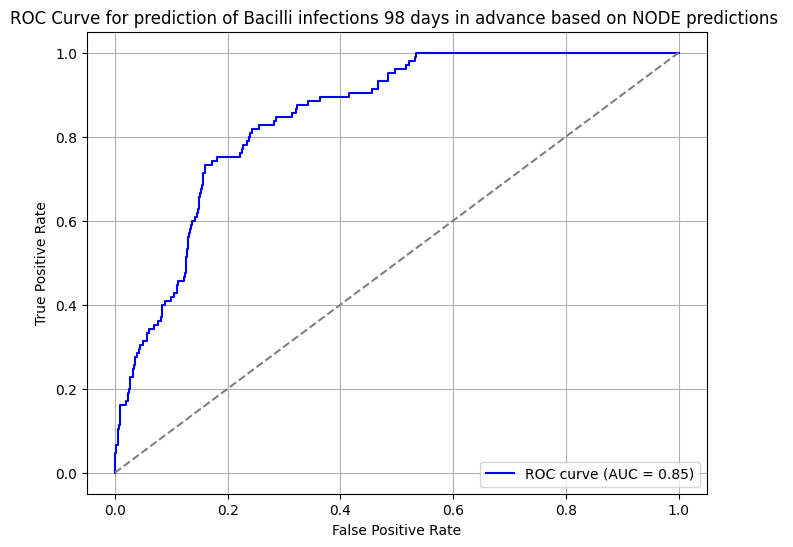

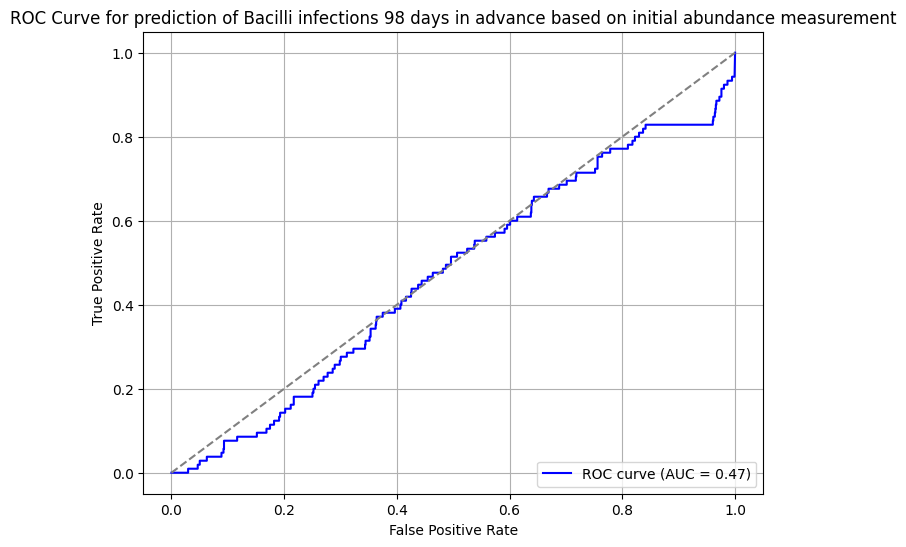

computing infection predictions...
plotting ROC curve...


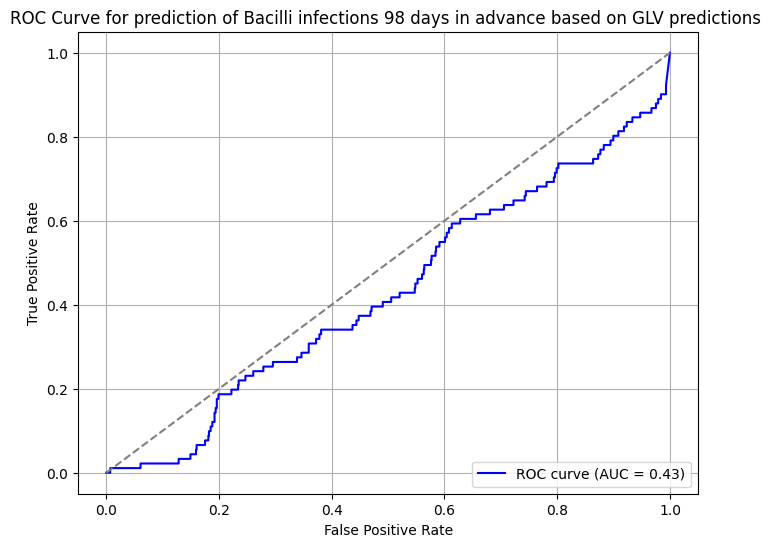

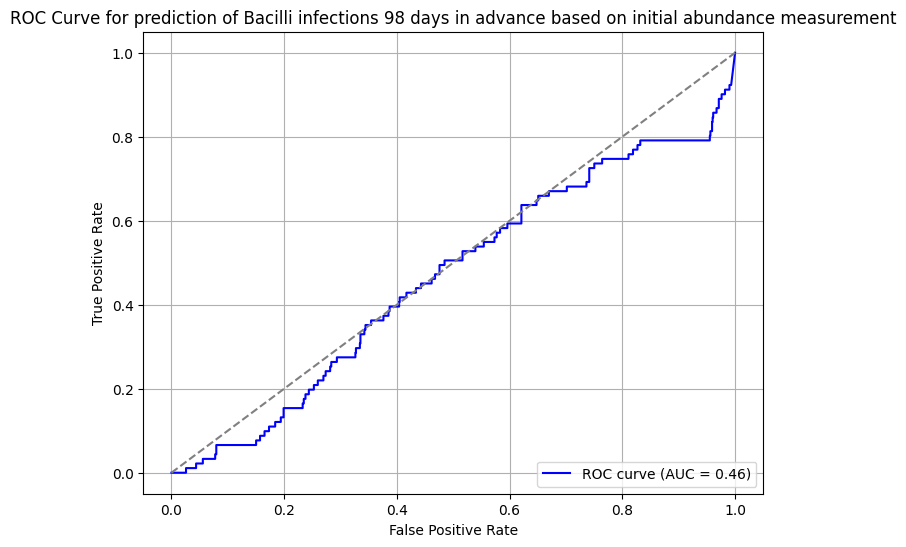

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


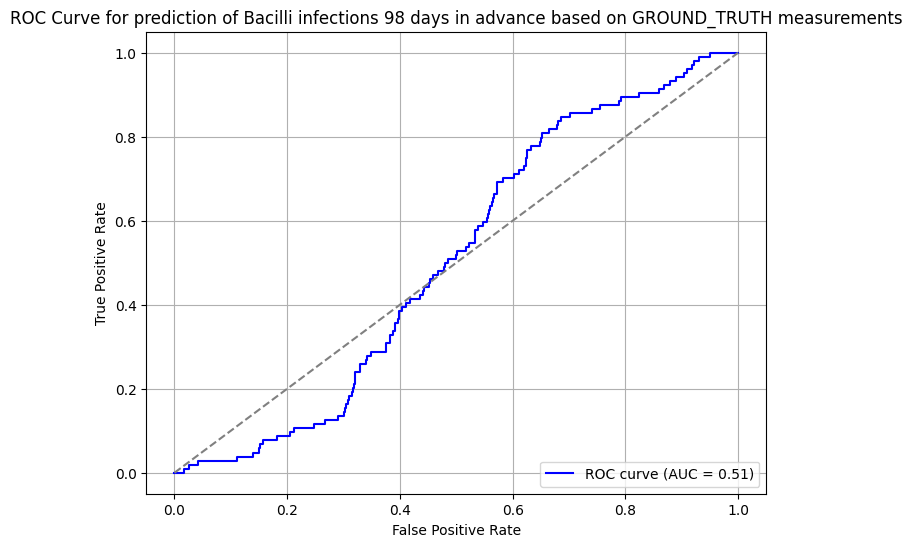

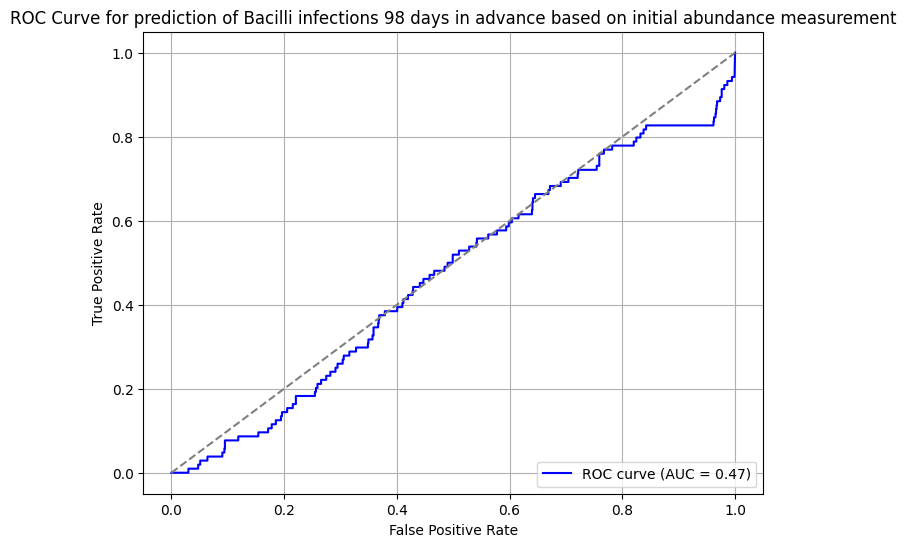

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


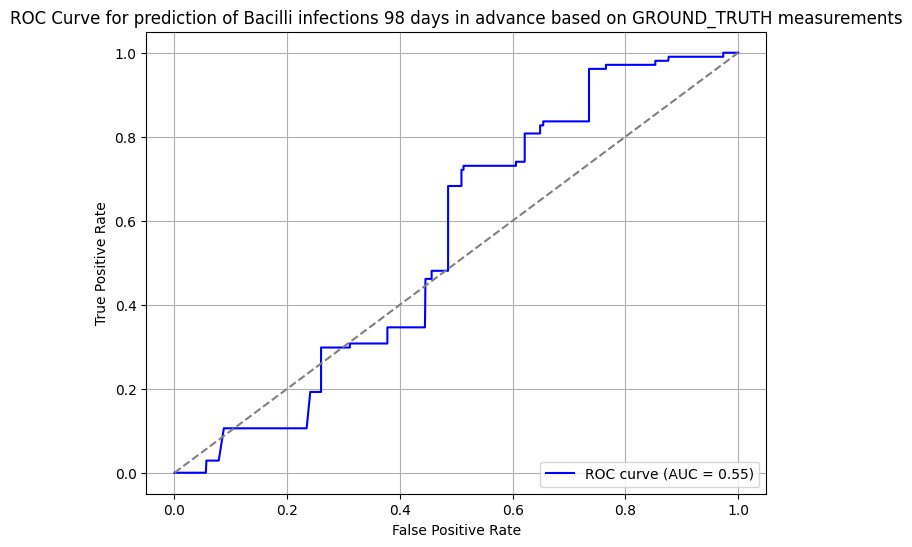

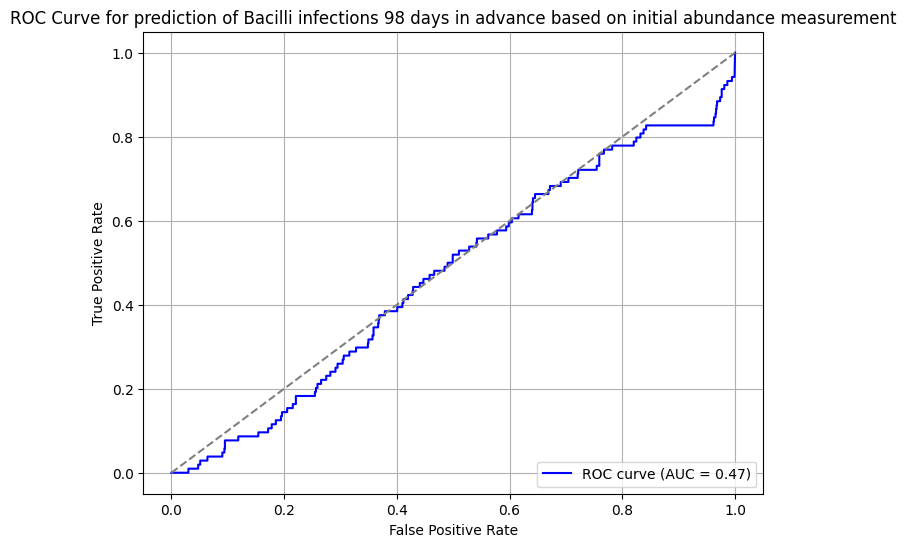

computing infection predictions using ground truth measurements...
plotting ROC curve for ground truth measurements...


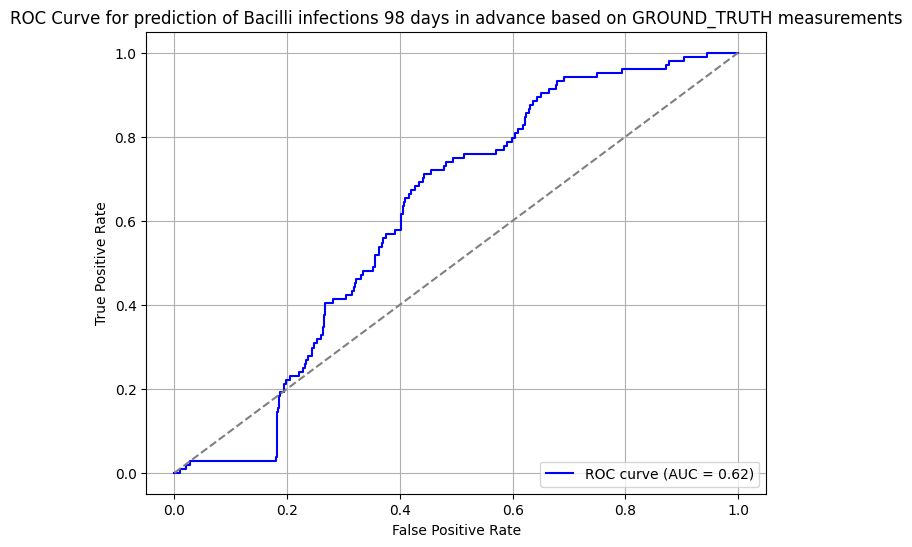

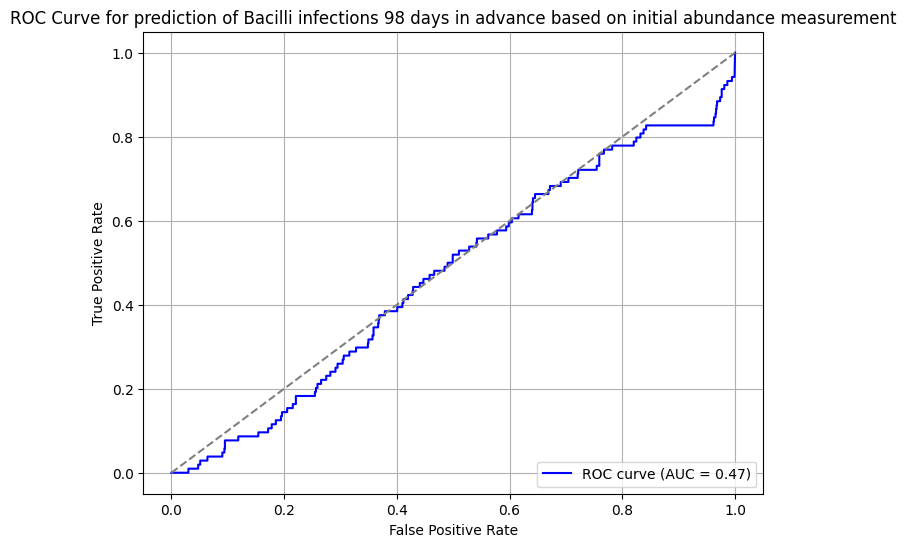

In [24]:
node_aucs = []
node_aucs_with_modified_prediction_window = []
glv_aucs = []
ground_truth_mean_aucs = []
ground_truth_max_aucs = []
ground_truth_weighted_avg_aucs = []
constant_aucs = []

for days in list(range(1, 30, 3)) + list(range(30, 60, 4)) + list(range(62, 100, 6)):
    node_auc, constant_auc = make_infection_predictions(node_model, glv_test_df_relative_abundances, index_of_taxa=2, range_of_node_prediction = days, range_of_infection_prediction = days)
    node_aucs_with_modified_prediction_window_auc, _ = make_infection_predictions(node_model, glv_test_df_relative_abundances, index_of_taxa=2, range_of_node_prediction = max(60, days), range_of_infection_prediction = days)
    glv_auc, _ = make_infection_predictions(glv_model, glv_test_df, index_of_taxa=2, range_of_node_prediction = days, range_of_infection_prediction = days,convert_to_relative_abundances=True, name="GLV")
    ground_truth_mean_auc, _ = make_infection_predictions_ground_truth(node_model, glv_test_df_relative_abundances, index_of_taxa=2, range_of_node_prediction = days, aggregate_statistic = 'mean', range_of_infection_prediction = days)
    ground_truth_max_auc, _ = make_infection_predictions_ground_truth(node_model, glv_test_df_relative_abundances, index_of_taxa=2, range_of_node_prediction = days, aggregate_statistic = 'max', range_of_infection_prediction = days)
    ground_truth_weighted_avg_auc, _ = make_infection_predictions_ground_truth_weighted_average(node_model, glv_test_df_relative_abundances, index_of_taxa=2, range_of_node_prediction = days, range_of_infection_prediction = days)
    
    ground_truth_mean_aucs.append(ground_truth_mean_auc)
    ground_truth_max_aucs.append(ground_truth_max_auc)
    ground_truth_weighted_avg_aucs.append(ground_truth_weighted_avg_auc)
    node_aucs.append(node_auc)
    node_aucs_with_modified_prediction_window.append(node_aucs_with_modified_prediction_window_auc)
    glv_aucs.append(glv_auc)
    constant_aucs.append(constant_auc)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


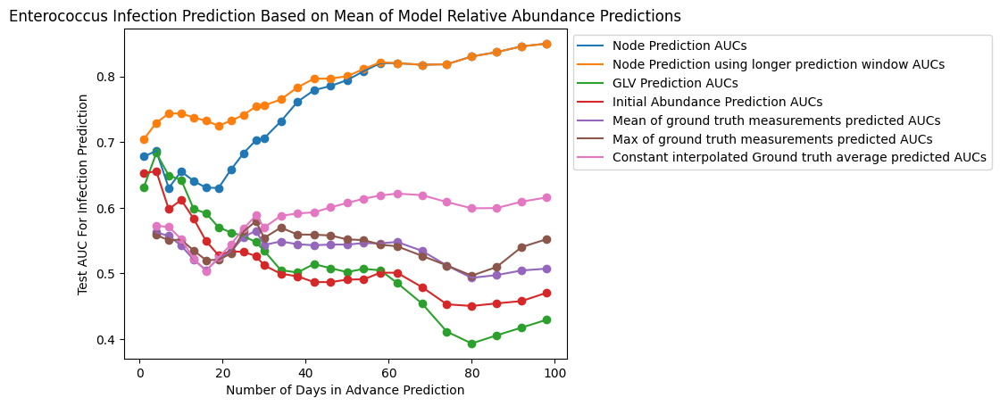

In [25]:

times = list(range(1, 30, 3)) + list(range(30, 60, 4)) + list(range(62, 100, 6))
plt.plot(times, node_aucs, label = 'Node Prediction AUCs')
plt.plot(times, node_aucs_with_modified_prediction_window, label = 'Node Prediction using longer prediction window AUCs')
plt.plot(times, glv_aucs, label = 'GLV Prediction AUCs')
plt.plot(times, constant_aucs, label = 'Initial Abundance Prediction AUCs')
plt.plot(times[1:], ground_truth_mean_aucs[1:], label = 'Mean of ground truth measurements predicted AUCs')
plt.plot(times[1:], ground_truth_max_aucs[1:], label = 'Max of ground truth measurements predicted AUCs')
plt.plot(times[1:], ground_truth_weighted_avg_aucs[1:], label = 'Constant interpolated Ground truth average predicted AUCs')
plt.scatter(times, node_aucs)
plt.scatter(times, node_aucs_with_modified_prediction_window)
plt.scatter(times, glv_aucs)
plt.scatter(times, constant_aucs)
plt.scatter(times[1:], ground_truth_mean_aucs[1:])
plt.scatter(times[1:], ground_truth_max_aucs[1:])
plt.scatter(times[1:], ground_truth_weighted_avg_aucs[1:])
plt.xlabel('Number of Days in Advance Prediction')
plt.ylabel('Test AUC For Infection Prediction')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.title('Enterococcus Infection Prediction Based on Mean of Model Relative Abundance Predictions' )
plt.savefig(
    "bloodstream_infection_prediction_aucs.eps",
    format="eps",
    bbox_inches="tight",
    pad_inches=0.1   # adjust padding if you need more/less whitespace
)





In [9]:
def make_infection_predictions(model, test_df, index_of_taxa = 2, 
                               number_of_taxa = 'reduced', method = 'euler', 
                               aggregate_statistic = 'mean', convert_to_relative_abundances = False):
    
    print('computing infection predictions...')
    
    if index_of_taxa == 2:
        infections_df = df_bacilli_infections
        name_of_class = 'Bacilli'
    if index_of_taxa == 9:
        infections_df = df_gammaproteobacteria_infections
        name_of_class = 'Gammaproteobacteria'
    
    # Dictionary to store predictions for each range (1 to 100 days)
    predictions_by_range = {range_days: [] for range_days in range(1, 101)}
    
    for patient_id in test_df['PatientID'].unique():
        model.patient_id = patient_id
        # get the trajectory data for patient_id's timeline
        t_preds, t_true, y_trues, true_indices = MyModels.get_data(test_df, patient_id, number_of_taxa = number_of_taxa)
        print(patient_id)
        for i in range(len(t_true)-1):
            # start of predicted trajectory
            t_start = t_true[i]
            y0 = y_trues[i]
            t_end = t_start + 100  # Predict 100 days ahead
            t_preds = torch.linspace(t_start, t_end, int((t_end-t_start)*3)).to(device)
            
            # Compute NODE prediction once for 100 days
            y_pred_trajectory = odeint(model, y0, t_preds, method=method)
            
            # if the model is glv
            if convert_to_relative_abundances:
                y0 = torch.nn.functional.normalize(torch.clamp(y0, min=0), p=1, dim=0)
                y_pred_trajectory = torch.nn.functional.normalize(torch.clamp(y_pred_trajectory, min=0), p=1, dim=1)

            taxa_pred_trajectory = y_pred_trajectory[:, index_of_taxa]
            actual_infection_times = list(infections_df[infections_df['PatientID']==patient_id]['DayRelativeToNearestHCT'])
            t_start_cpu = t_start.cpu().numpy()
            initial_bacilli_abundance_level = np.float64(y0[index_of_taxa].cpu().detach().item())
            
            # For each range from 1 to 100 days
            for range_days in range(1, 101):
                # Determine which time points fall within this range
                t_preds_cpu = t_preds.cpu().numpy()
                mask = (t_preds_cpu >= t_start_cpu) & (t_preds_cpu <= t_start_cpu + range_days)
                taxa_pred_in_range = taxa_pred_trajectory[mask]
                
                # Compute aggregate statistic for this range
                if aggregate_statistic == 'max':
                    taxa_pred_summary_abundance_level = np.float64(torch.max(taxa_pred_in_range).item())
                elif aggregate_statistic == 'mean':
                    taxa_pred_summary_abundance_level = np.float64(torch.mean(taxa_pred_in_range).item())
                
                # Check if infection occurred within this range
                actual_infection = int(any((t_start_cpu <= t < t_start_cpu + range_days) for t in actual_infection_times))
                
                predictions_by_range[range_days].append([
                    taxa_pred_summary_abundance_level, 
                    actual_infection, 
                    initial_bacilli_abundance_level
                ])
    
    # Convert lists to numpy arrays and remove NaN rows
    for range_days in range(1, 101):
        print(range_days)
        abundance_predictions = np.array(predictions_by_range[range_days])
        # remove rows with NAN
        abundance_predictions = abundance_predictions[~np.isnan(abundance_predictions).any(axis=1)]
        predictions_by_range[range_days] = abundance_predictions
    
    print('done computing infection predictions')
    return predictions_by_range

mydict = make_infection_predictions(node_model, test_df)


computing infection predictions...
1001
1008
1009
1012
1015
1021
1024
1037
104
1044
1045
1049
1053
1063
1075
1080
1097
1107
1119
1124
1128
114
1141
1143
1144
1147
1151
1156
1158
116
1160
1171
1173
1174
118
1193
1196
120
1201
1203
1207
1208
1209
1210
1220
1229
123
124
1244
1245
1249
125
1251
1252
126
1261
1262
1270
1271
1276
128
1293
130
1303
1305
1312
1316
1331
1333
1338
1341
1345
1347
136
1362
1364
1366
137
1379
1380
1381
139
1393
1398
1400
1414
142
1425
143
1431
1443
1452
146
1461
1479
1491
1498
151
1513
1520
1530
1533
154
1552
156
1564
1569
157
1580
1581
162
164
1644
1648
1663
1686
1691
1708
1711
1713
1716
1721
173
1730
1751
1757
1760
177
1777
1785
1816
182
1826
1833
1838
184
1842
1844
1846
1855
1856
1858
186
187
1876
1881
1885
1891
1893
190
1902
1908
1921
1928
1934
194
1953
1957
1959
1965
1966
1987
199
1995
2000
2023
2029
204
2042
2054
206
2065
2066
207
2070
2081
209
2090
210
2104
2105
2111
2126
2127
2144
2163
218
2180
2196
220
221
226
235
236
238
245
251
266
267
270
271
275
276
27

plotting ROC curve...


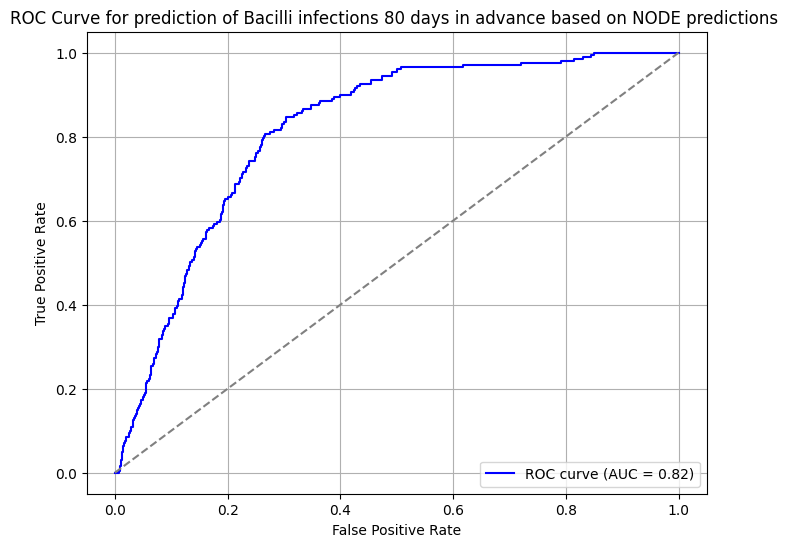

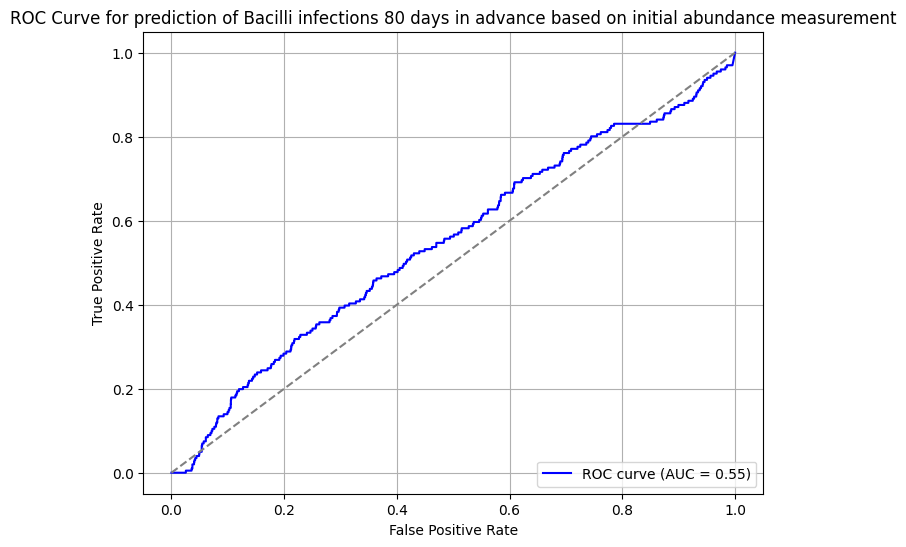

In [23]:
def make_plot_from_prediction_data(number_of_days, dict):
    abundance_predictions = mydict[number_of_days]
    index_of_taxa = 2
    name_of_class = 'Bacilli'
    range_of_infection_prediction = number_of_days
    name = 'NODE'
    
    print('plotting ROC curve...')
    y_scores = abundance_predictions[:, 0]  # Predicted probabilities
    y_true = abundance_predictions[:, 1]    # Actual binary labels
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)  # Compute the area under the curve (AUC)
    plt.figure(figsize=(8, 6), num=None)
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guess line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    taxa_name = test_df.columns[index_of_taxa]
    plt.title(f'ROC Curve for prediction of {name_of_class} infections {range_of_infection_prediction} days in advance based on {name} predictions ')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()
    model_auc = roc_auc
    
    
    # lets make an ROC curve for just using inital abundances, not the NODE predictions:
    y_scores = abundance_predictions[:, 2]  # Predicted probabilities
    y_true = abundance_predictions[:, 1]    # Actual binary labels
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)  # Compute the area under the curve (AUC)
    plt.figure(figsize=(8, 6), num=None)
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random guess line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    taxa_name = test_df.columns[index_of_taxa]
    plt.title(f'ROC Curve for prediction of {name_of_class} infections {range_of_infection_prediction} days in advance based on initial abundance measurement')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()
    initial_abundance_auc = roc_auc

make_plot_from_prediction_data(80, mydict)

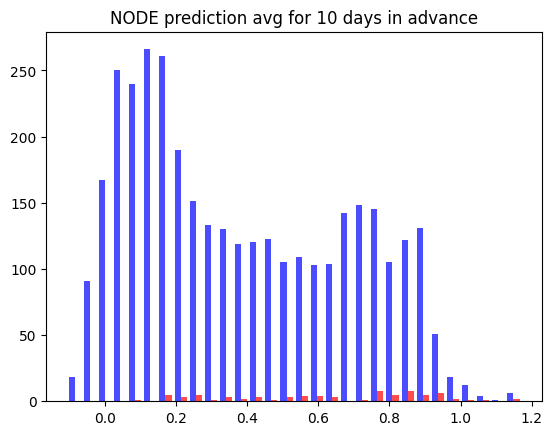

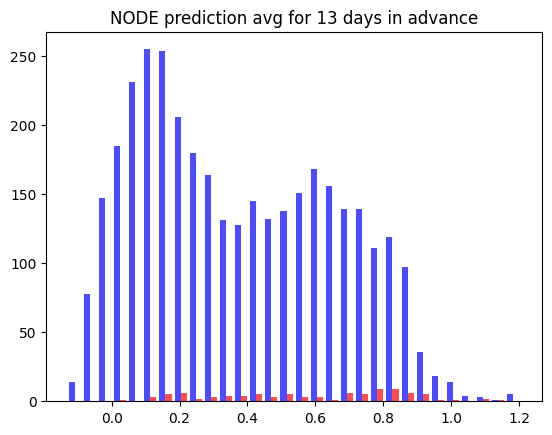

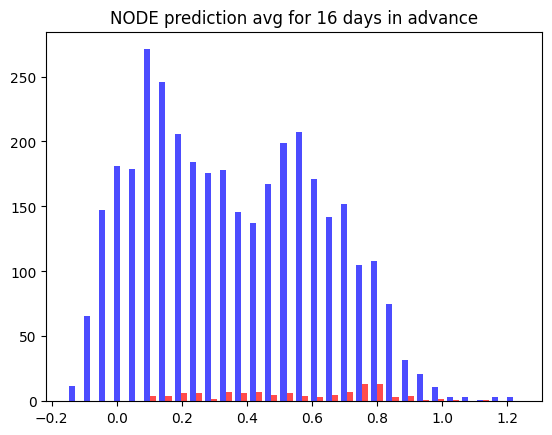

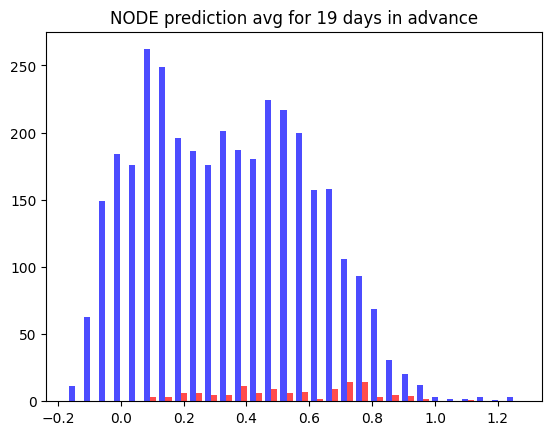

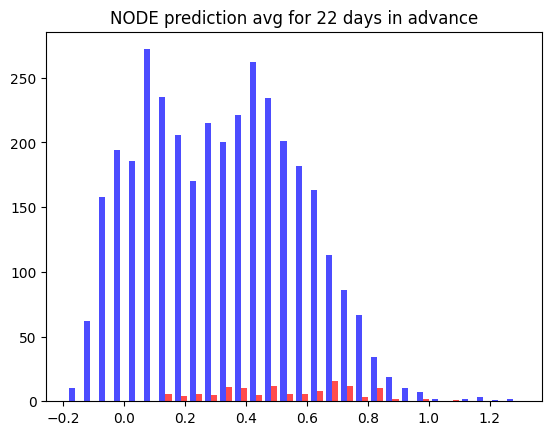

...

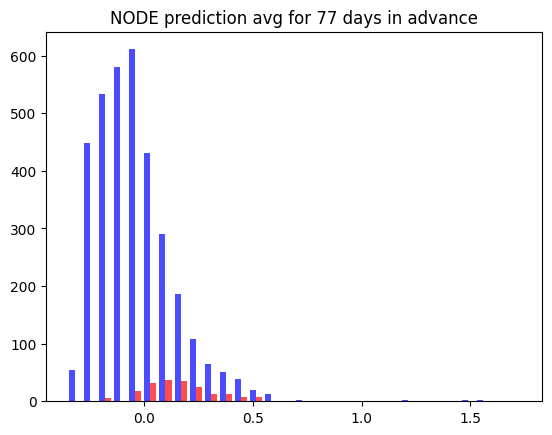

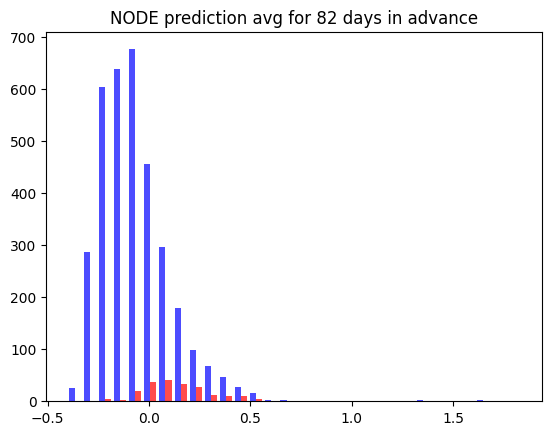

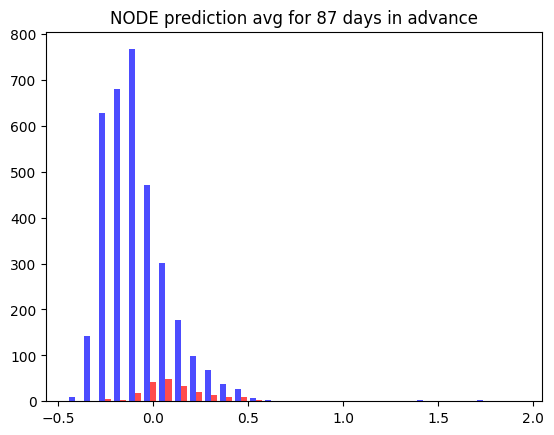

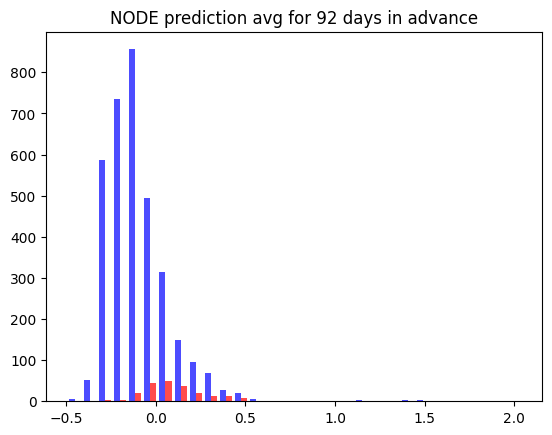

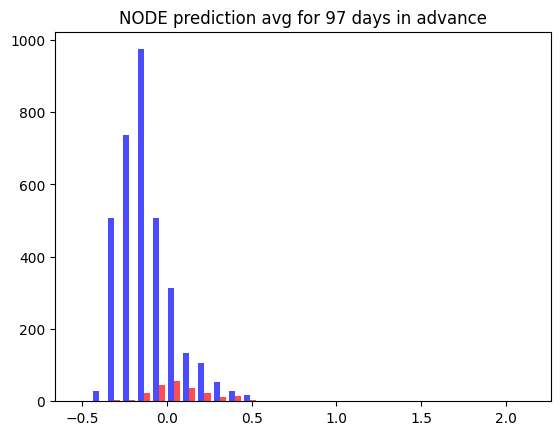

In [57]:
for i in list(range(10, 40, 3)) + list(range(42, 100, 5)):
    abundance_predictions = mydict[i]
    plt.hist([abundance_predictions[abundance_predictions[:, 1] == 0, 0], abundance_predictions[abundance_predictions[:, 1] == 1, 0]], bins=30, color=['blue', 'red'], label=['Category 0', 'Category 1'], alpha=0.7)
    plt.title(f'NODE prediction avg for {i} days in advance')
    plt.show()


computing infection predictions using ground truth measurements...
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
done computing infection predictions from ground truth


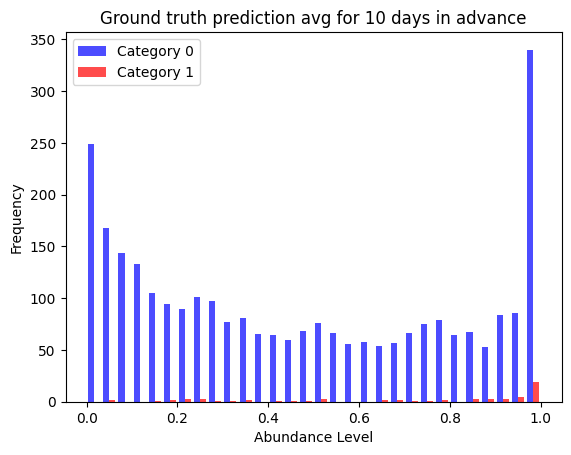

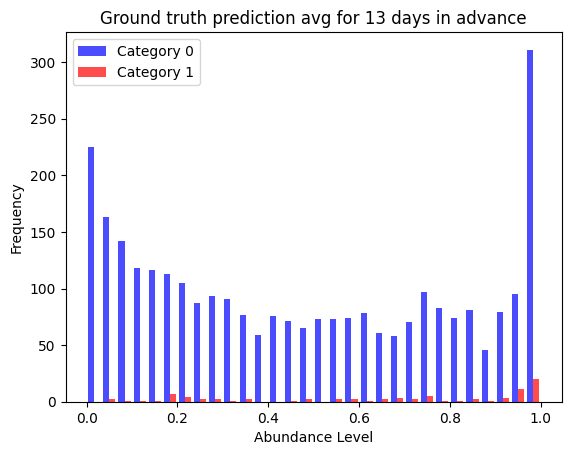

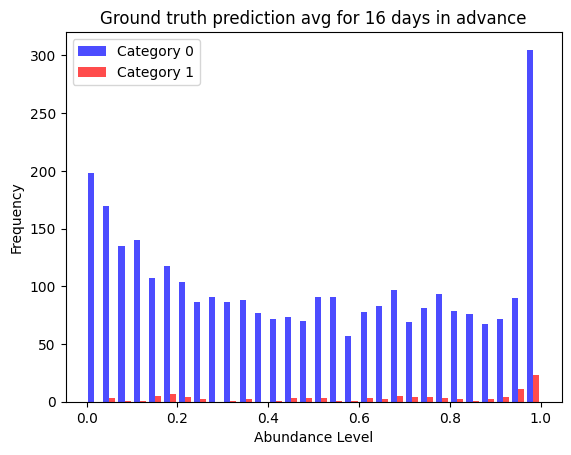

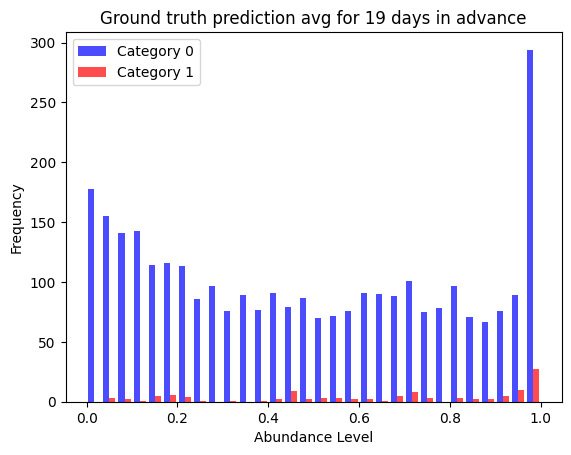

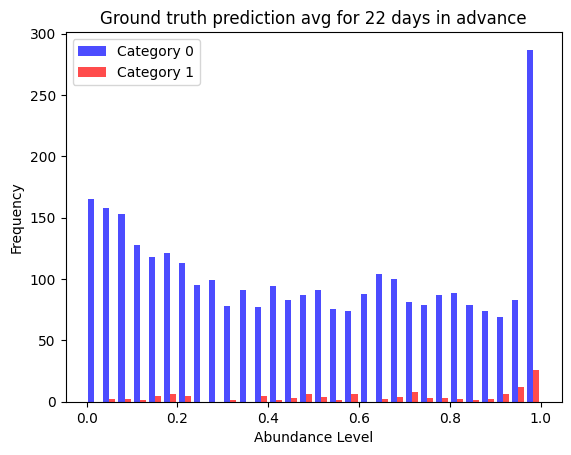

...

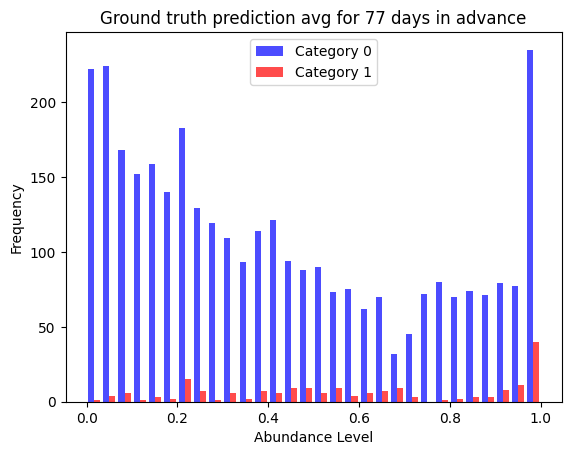

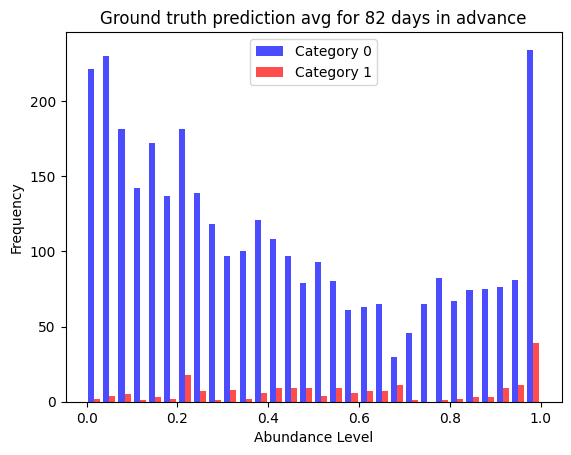

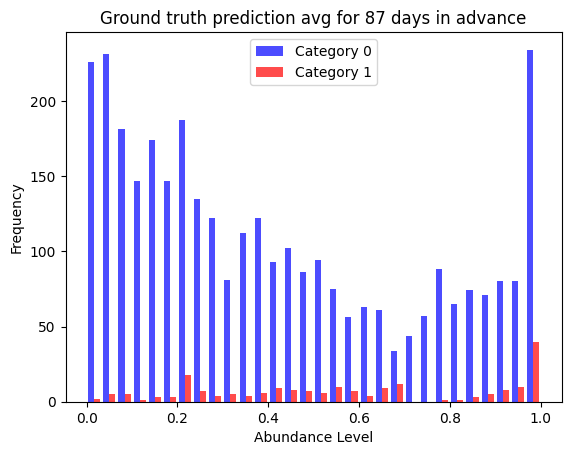

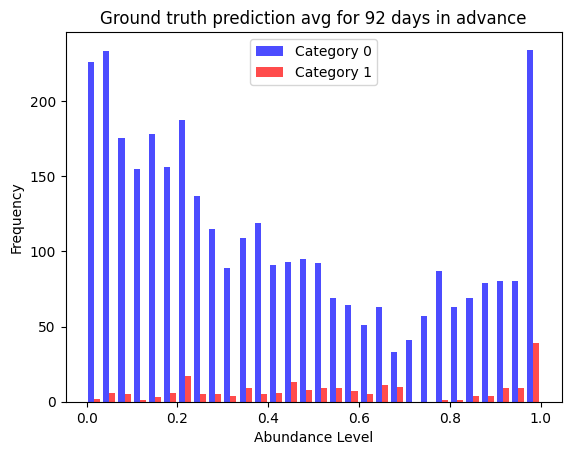

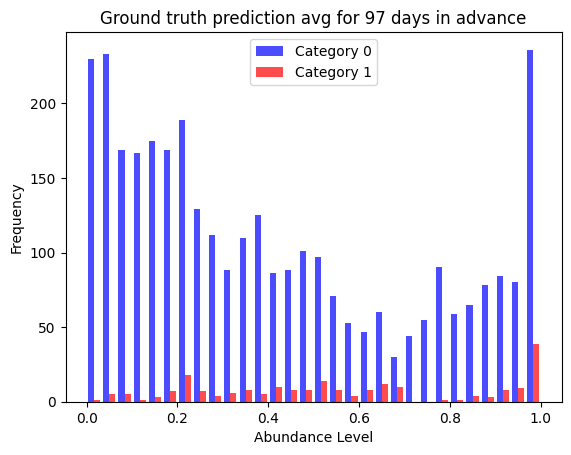

In [18]:
# First, create a ground truth prediction function that works for multiple ranges
def make_infection_predictions_ground_truth_multiple_ranges(model, test_df, index_of_taxa = 2, 
                               number_of_taxa = 'reduced', 
                               aggregate_statistic = 'mean', convert_to_relative_abundances = False):
    
    print('computing infection predictions using ground truth measurements...')
    
    if index_of_taxa == 2:
        infections_df = df_bacilli_infections
        name_of_class = 'Bacilli'
    if index_of_taxa == 9:
        infections_df = df_gammaproteobacteria_infections
        name_of_class = 'Gammaproteobacteria'
    
    # Dictionary to store predictions for each range (1 to 100 days)
    predictions_by_range = {range_days: [] for range_days in range(1, 101)}
    
    for patient_id in test_df['PatientID'].unique():
        # get the trajectory data for patient_id's timeline
        t_preds, t_true, y_trues, true_indices = MyModels.get_data(test_df, patient_id, number_of_taxa = number_of_taxa)
        
        # Get patient's data from test_df
        patient_data = test_df[test_df['PatientID'] == patient_id].copy()
        
        for i in range(len(t_true)-1):
            # start of prediction window
            t_start = t_true[i]
            y0 = y_trues[i]
            t_start_np = t_start.cpu().numpy()
            
            # Initial abundance level
            initial_bacilli_abundance_level = np.float64(y0[index_of_taxa].cpu().detach().item())
            
            # Get actual infection times for this patient
            actual_infection_times = list(infections_df[infections_df['PatientID']==patient_id]['DayRelativeToNearestHCT'])
            
            # For each range from 1 to 100 days
            for range_days in range(1, 101):
                t_end_np = t_start_np + range_days
                
                # Get measurements in the prediction window
                window_mask = (patient_data['DayRelativeToNearestHCT'] > t_start_np) & \
                             (patient_data['DayRelativeToNearestHCT'] <= t_end_np)
                window_data = patient_data[window_mask].sort_values('DayRelativeToNearestHCT')
                
                if len(window_data) == 0:
                    # Skip this prediction if no ground truth data available in window
                    continue
                    
                # Get the taxa values from the ground truth data
                taxa_column = test_df.columns[index_of_taxa]
                taxa_measurements = window_data[taxa_column].values
                measurement_times = window_data['DayRelativeToNearestHCT'].values
                
                # Convert to relative abundances if requested
                if convert_to_relative_abundances:
                    taxa_cols = [col for col in test_df.columns if col not in ['PatientID', 'DayRelativeToNearestHCT']]
                    window_taxa_data = window_data[taxa_cols].values
                    row_sums = np.sum(window_taxa_data, axis=1)
                    normalized_data = window_taxa_data / row_sums[:, np.newaxis]
                    taxa_measurements = normalized_data[:, index_of_taxa]
                
                # Remove any NaN values (and corresponding times)
                valid_mask = ~np.isnan(taxa_measurements)
                taxa_measurements = taxa_measurements[valid_mask]
                measurement_times = measurement_times[valid_mask]
                
                if len(taxa_measurements) == 0:
                    continue
                
                # Calculate aggregate statistic
                if aggregate_statistic == 'max':
                    taxa_pred_summary_abundance_level = np.max(taxa_measurements)
                elif aggregate_statistic == 'mean':
                    # Calculate time-weighted mean
                    if len(taxa_measurements) == 1:
                        taxa_pred_summary_abundance_level = taxa_measurements[0]
                    else:
                        # Calculate weights based on time intervals
                        weights = np.zeros(len(taxa_measurements))
                        
                        weights[0] = (measurement_times[0] - t_start_np) + \
                                     (measurement_times[1] - measurement_times[0]) / 2
                        
                        for j in range(1, len(taxa_measurements) - 1):
                            weights[j] = (measurement_times[j] - measurement_times[j-1]) / 2 + \
                                        (measurement_times[j+1] - measurement_times[j]) / 2
                        
                        weights[-1] = (measurement_times[-1] - measurement_times[-2]) / 2 + \
                                      (t_end_np - measurement_times[-1])
                        
                        # Calculate weighted mean
                        taxa_pred_summary_abundance_level = np.average(taxa_measurements, weights=weights)
                
                # Check if infection occurred within this range
                actual_infection = int(any((t_start_np <= t < t_start_np + range_days) for t in actual_infection_times))
                
                predictions_by_range[range_days].append([
                    taxa_pred_summary_abundance_level, 
                    actual_infection, 
                    initial_bacilli_abundance_level
                ])
    
    # Convert lists to numpy arrays and remove NaN rows
    for range_days in range(1, 101):
        print(range_days)
        abundance_predictions = np.array(predictions_by_range[range_days])
        # remove rows with NAN
        abundance_predictions = abundance_predictions[~np.isnan(abundance_predictions).any(axis=1)]
        predictions_by_range[range_days] = abundance_predictions
    
    print('done computing infection predictions from ground truth')
    return predictions_by_range

# Generate ground truth predictions
ground_truth_dict = make_infection_predictions_ground_truth_multiple_ranges(node_model, test_df)

# Create histograms for ground truth data
for i in list(range(10, 40, 3)) + list(range(42, 100, 5)):
    abundance_predictions = ground_truth_dict[i]
    plt.hist([abundance_predictions[abundance_predictions[:, 1] == 0, 0], 
              abundance_predictions[abundance_predictions[:, 1] == 1, 0]], 
             bins=30, color=['blue', 'red'], label=['Category 0', 'Category 1'], alpha=0.7)
    plt.title(f'Ground truth prediction avg for {i} days in advance')
    plt.xlabel('Abundance Level')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

# could try to do this but for the real world data ^
Also for glv 

negative values in node seem to carry a lot of information!

try repeating these experiments except don't put in any antibiotic data, and see if you can predict BSI based on the trajectory in the same way (or could try pointwise derivative)
Interpretation: "Is this initial sample an enterococcus suppressive ecological state?" 
Idea: the more you increase the prediction timeline the more 'information about the initial ecological state' you are extracting from the model - telling you more and more about how suppressive or promoting the ecological state is to enterococcus.

Another thing you could try: predict infections in the next x days based on the trajectory from y days in advance, with x<y (thus far we have done x=y)

Small note: could change the histograms so that the reds and blues have the same visual area, would display the separation of classes better. 

Want to check cor(node predictions for bacilli, ground truth bacilli)

Computing correlations between predictions and ground truth up to 50 days...
Processing patient 1001
Processing patient 1008
Processing patient 1009
Processing patient 1012
Processing patient 1015
Processing patient 1021
Processing patient 1024
Processing patient 1037
Processing patient 104
Processing patient 1044
Processing patient 1045
Processing patient 1049
Processing patient 1053
Processing patient 1063
Processing patient 1075
Processing patient 1080
Processing patient 1097
Processing patient 1107
Processing patient 1119
Processing patient 1124
Processing patient 1128
Processing patient 114
Processing patient 1141
Processing patient 1143
Processing patient 1144
Processing patient 1147
Processing patient 1151
Processing patient 1156
Processing patient 1158
Processing patient 116
Processing patient 1160
Processing patient 1171
Processing patient 1173
Processing patient 1174
Processing patient 118
Processing patient 1193
Processing patient 1196
Processing patient 120
Processing patie

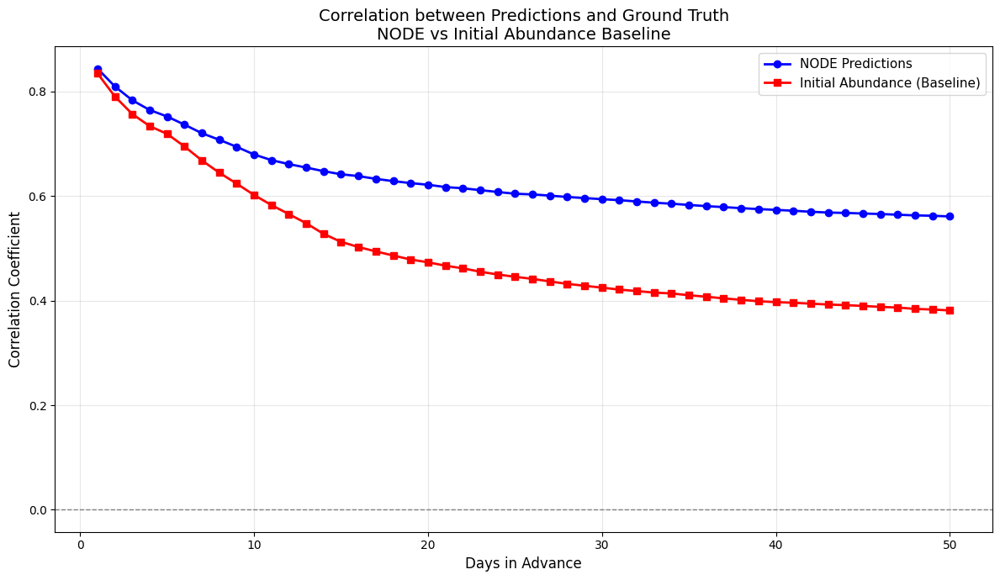

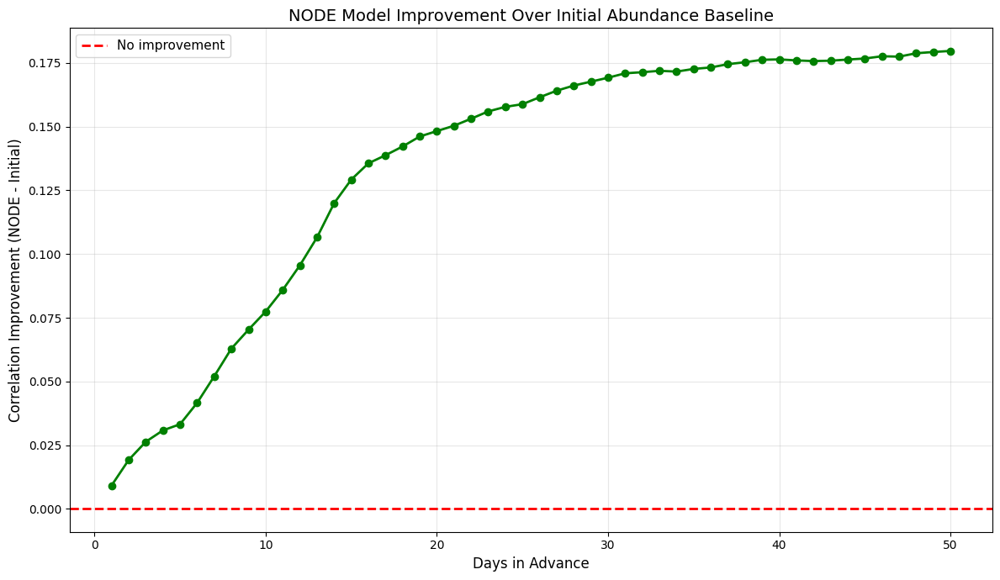

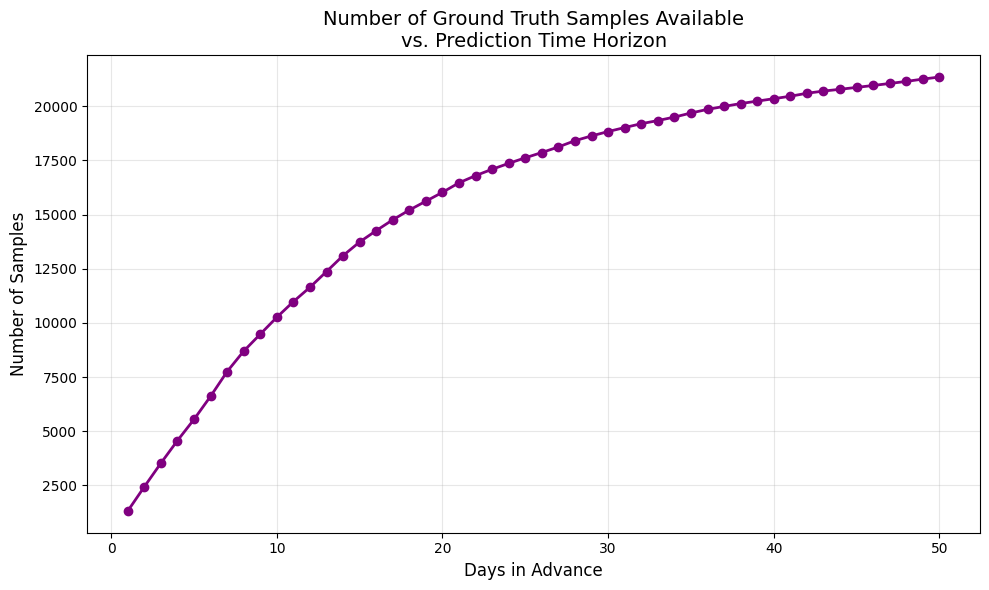


=== Summary Statistics ===

At 1 days:
  NODE correlation: 0.844
  Initial correlation: 0.834
  Improvement: 0.009
  Number of samples: 1320

At 7 days:
  NODE correlation: 0.720
  Initial correlation: 0.668
  Improvement: 0.052
  Number of samples: 7755

At 14 days:
  NODE correlation: 0.647
  Initial correlation: 0.528
  Improvement: 0.120
  Number of samples: 13105

At 30 days:
  NODE correlation: 0.594
  Initial correlation: 0.425
  Improvement: 0.169
  Number of samples: 18830


In [5]:
def compute_node_ground_truth_correlation(model, test_df, index_of_taxa=2, 
                                         max_days=100, number_of_taxa='reduced', 
                                         method='euler', convert_to_relative_abundances=False):
    """
    Compute correlation between NODE predictions and ground truth measurements,
    as well as correlation between initial abundance and ground truth (baseline).
    
    Parameters:
    -----------
    model : NODE model
    test_df : DataFrame with ground truth data
    index_of_taxa : int, index of the taxa to predict (default 2 for Bacilli)
    max_days : int, maximum number of days in advance to make predictions
    number_of_taxa : str, 'reduced' or other
    method : str, ODE solver method (default 'euler')
    convert_to_relative_abundances : bool, whether to normalize to relative abundances
    
    Returns:
    --------
    node_correlations_by_days : dict, NODE correlation coefficient for each prediction range
    initial_correlations_by_days : dict, initial abundance correlation for each range
    """
    
    print(f'Computing correlations between predictions and ground truth up to {max_days} days...')
    
    # Dictionary to store NODE predictions and ground truth for each prediction range
    node_predictions_by_days = {days: {'predicted': [], 'ground_truth': []} for days in range(1, max_days + 1)}
    
    # Dictionary to store initial abundance predictions and ground truth
    initial_predictions_by_days = {days: {'predicted': [], 'ground_truth': []} for days in range(1, max_days + 1)}
    
    for patient_id in test_df['PatientID'].unique():
        model.patient_id = patient_id
        print(f'Processing patient {patient_id}')
        
        # Get the trajectory data for patient_id's timeline
        t_preds, t_true, y_trues, true_indices = MyModels.get_data(test_df, patient_id, number_of_taxa=number_of_taxa)
        
        # Get patient's data from test_df
        patient_data = test_df[test_df['PatientID'] == patient_id].copy()
        taxa_column = test_df.columns[index_of_taxa]
        
        for i in range(len(t_true) - 1):
            # Start of predicted trajectory
            t_start = t_true[i]
            y0 = y_trues[i]
            t_end = t_start + max_days
            
            # Get initial abundance level (baseline predictor)
            initial_abundance = np.float64(y0[index_of_taxa].cpu().detach().item())
            
            # Create time points for prediction
            t_pred_points = torch.linspace(t_start, t_end, int((t_end - t_start) * 3)).to(device)
            
            # Compute NODE prediction once for max_days
            y_pred_trajectory = odeint(model, y0, t_pred_points, method=method)
            
            # Convert to relative abundances if requested
            if convert_to_relative_abundances:
                y0 = torch.nn.functional.normalize(torch.clamp(y0, min=0), p=1, dim=0)
                y_pred_trajectory = torch.nn.functional.normalize(torch.clamp(y_pred_trajectory, min=0), p=1, dim=1)
                initial_abundance = np.float64(y0[index_of_taxa].cpu().detach().item())
            
            taxa_pred_trajectory = y_pred_trajectory[:, index_of_taxa]
            t_start_np = t_start.cpu().numpy()
            t_pred_points_np = t_pred_points.cpu().numpy()
            
            # For each prediction range from 1 to max_days
            for days in range(1, max_days + 1):
                t_end_np = t_start_np + days
                
                # Find ground truth measurements within this prediction window
                window_mask = (patient_data['DayRelativeToNearestHCT'] > t_start_np) & \
                             (patient_data['DayRelativeToNearestHCT'] <= t_end_np)
                window_data = patient_data[window_mask]
                
                if len(window_data) == 0:
                    continue
                
                # For each ground truth measurement in the window
                for _, row in window_data.iterrows():
                    gt_time = row['DayRelativeToNearestHCT']
                    gt_value = row[taxa_column]
                    
                    if np.isnan(gt_value):
                        continue
                    
                    # NODE prediction: find the closest predicted time point
                    time_diffs = np.abs(t_pred_points_np - gt_time)
                    closest_idx = np.argmin(time_diffs)
                    node_pred_value = taxa_pred_trajectory[closest_idx].cpu().detach().item()
                    
                    # Store NODE prediction pair
                    node_predictions_by_days[days]['predicted'].append(node_pred_value)
                    node_predictions_by_days[days]['ground_truth'].append(gt_value)
                    
                    # Store initial abundance prediction pair (baseline)
                    initial_predictions_by_days[days]['predicted'].append(initial_abundance)
                    initial_predictions_by_days[days]['ground_truth'].append(gt_value)
    
    # Compute correlations for each prediction range
    print('Computing correlations...')
    node_correlations_by_days = {}
    initial_correlations_by_days = {}
    
    for days in range(1, max_days + 1):
        # NODE correlations
        node_predicted = np.array(node_predictions_by_days[days]['predicted'])
        node_ground_truth = np.array(node_predictions_by_days[days]['ground_truth'])
        
        if len(node_predicted) > 1:
            valid_mask = ~(np.isnan(node_predicted) | np.isnan(node_ground_truth))
            node_predicted_clean = node_predicted[valid_mask]
            node_ground_truth_clean = node_ground_truth[valid_mask]
            
            if len(node_predicted_clean) > 1:
                node_correlation = np.corrcoef(node_predicted_clean, node_ground_truth_clean)[0, 1]
                node_correlations_by_days[days] = {
                    'correlation': node_correlation,
                    'n_samples': len(node_predicted_clean)
                }
            else:
                node_correlations_by_days[days] = {'correlation': np.nan, 'n_samples': len(node_predicted_clean)}
        else:
            node_correlations_by_days[days] = {'correlation': np.nan, 'n_samples': len(node_predicted)}
        
        # Initial abundance correlations (baseline)
        initial_predicted = np.array(initial_predictions_by_days[days]['predicted'])
        initial_ground_truth = np.array(initial_predictions_by_days[days]['ground_truth'])
        
        if len(initial_predicted) > 1:
            valid_mask = ~(np.isnan(initial_predicted) | np.isnan(initial_ground_truth))
            initial_predicted_clean = initial_predicted[valid_mask]
            initial_ground_truth_clean = initial_ground_truth[valid_mask]
            
            if len(initial_predicted_clean) > 1:
                initial_correlation = np.corrcoef(initial_predicted_clean, initial_ground_truth_clean)[0, 1]
                initial_correlations_by_days[days] = {
                    'correlation': initial_correlation,
                    'n_samples': len(initial_predicted_clean)
                }
            else:
                initial_correlations_by_days[days] = {'correlation': np.nan, 'n_samples': len(initial_predicted_clean)}
        else:
            initial_correlations_by_days[days] = {'correlation': np.nan, 'n_samples': len(initial_predicted)}
        
        if days % 10 == 0:
            print(f'Day {days}: NODE corr = {node_correlations_by_days[days]["correlation"]:.3f}, ' +
                  f'Initial corr = {initial_correlations_by_days[days]["correlation"]:.3f}, ' +
                  f'n = {node_correlations_by_days[days]["n_samples"]}')
    
    print('Done computing correlations')
    return node_correlations_by_days, initial_correlations_by_days


# Usage example
node_corr, initial_corr = compute_node_ground_truth_correlation(
    node_model, test_df, index_of_taxa=2, max_days=50
)

# Plot comparison of correlations
days_list = sorted([d for d in node_corr.keys() 
                    if not np.isnan(node_corr[d]['correlation']) 
                    and not np.isnan(initial_corr[d]['correlation'])])
node_corr_values = [node_corr[d]['correlation'] for d in days_list]
initial_corr_values = [initial_corr[d]['correlation'] for d in days_list]
n_samples = [node_corr[d]['n_samples'] for d in days_list]

plt.figure(figsize=(12, 7))
plt.plot(days_list, node_corr_values, marker='o', linewidth=2, label='NODE Predictions', color='blue')
plt.plot(days_list, initial_corr_values, marker='s', linewidth=2, label='Initial Abundance (Baseline)', color='red')
plt.xlabel('Days in Advance', fontsize=12)
plt.ylabel('Correlation Coefficient', fontsize=12)
plt.title('Correlation between Predictions and Ground Truth\nNODE vs Initial Abundance Baseline', fontsize=14)
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.axhline(y=0, color='gray', linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

# Plot the difference (NODE improvement over baseline)
improvement = np.array(node_corr_values) - np.array(initial_corr_values)
plt.figure(figsize=(12, 7))
plt.plot(days_list, improvement, marker='o', linewidth=2, color='green')
plt.axhline(y=0, color='red', linestyle='--', linewidth=2, label='No improvement')
plt.xlabel('Days in Advance', fontsize=12)
plt.ylabel('Correlation Improvement (NODE - Initial)', fontsize=12)
plt.title('NODE Model Improvement Over Initial Abundance Baseline', fontsize=14)
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Plot sample sizes
plt.figure(figsize=(10, 6))
plt.plot(days_list, n_samples, marker='o', linewidth=2, color='purple')
plt.xlabel('Days in Advance', fontsize=12)
plt.ylabel('Number of Samples', fontsize=12)
plt.title('Number of Ground Truth Samples Available\nvs. Prediction Time Horizon', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


Computing correlations between predictions and ground truth up to 50 days...
Processing patient 1001
Processing patient 1008
Processing patient 1009
Processing patient 1012
Processing patient 1015
Processing patient 1021
Processing patient 1024
Processing patient 1037
Processing patient 104
Processing patient 1044
Processing patient 1045
Processing patient 1049
Processing patient 1053
Processing patient 1063
Processing patient 1075
Processing patient 1080
Processing patient 1097
Processing patient 1107
Processing patient 1119
Processing patient 1124
Processing patient 1128
Processing patient 114
Processing patient 1141
Processing patient 1143
Processing patient 1144
Processing patient 1147
Processing patient 1151
Processing patient 1156
Processing patient 1158
Processing patient 116
Processing patient 1160
Processing patient 1171
Processing patient 1173
Processing patient 1174
Processing patient 118
Processing patient 1193
Processing patient 1196
Processing patient 120
Processing patie

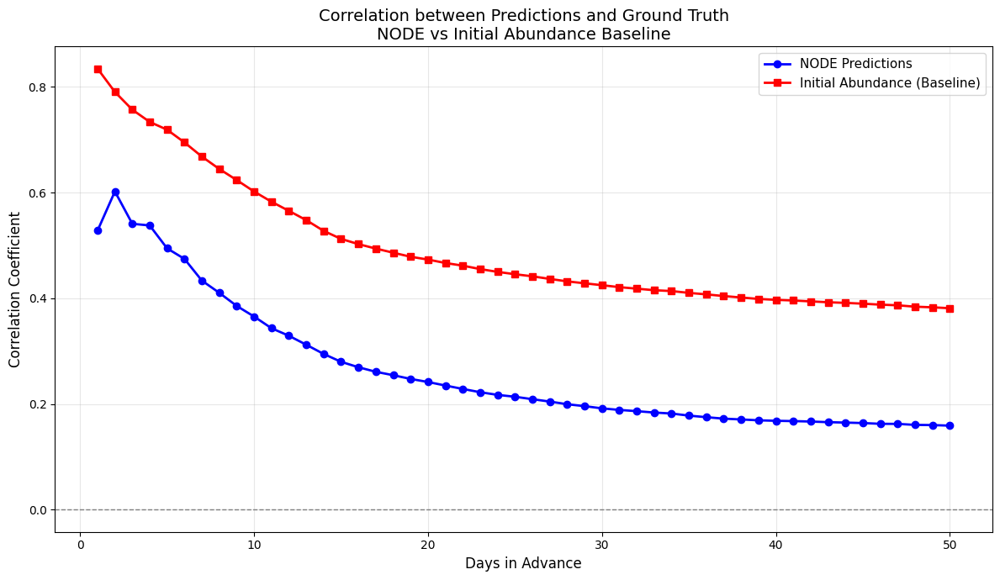

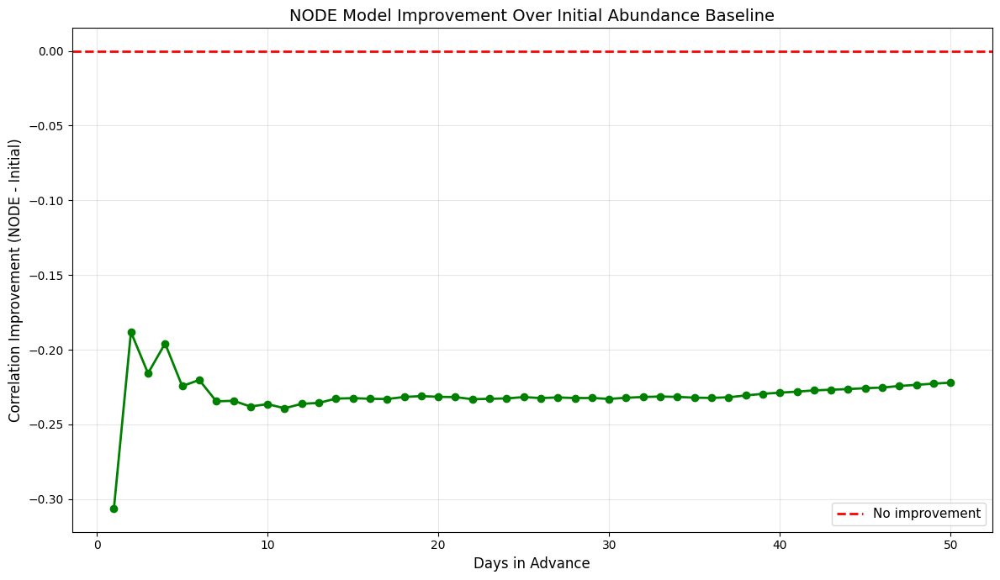

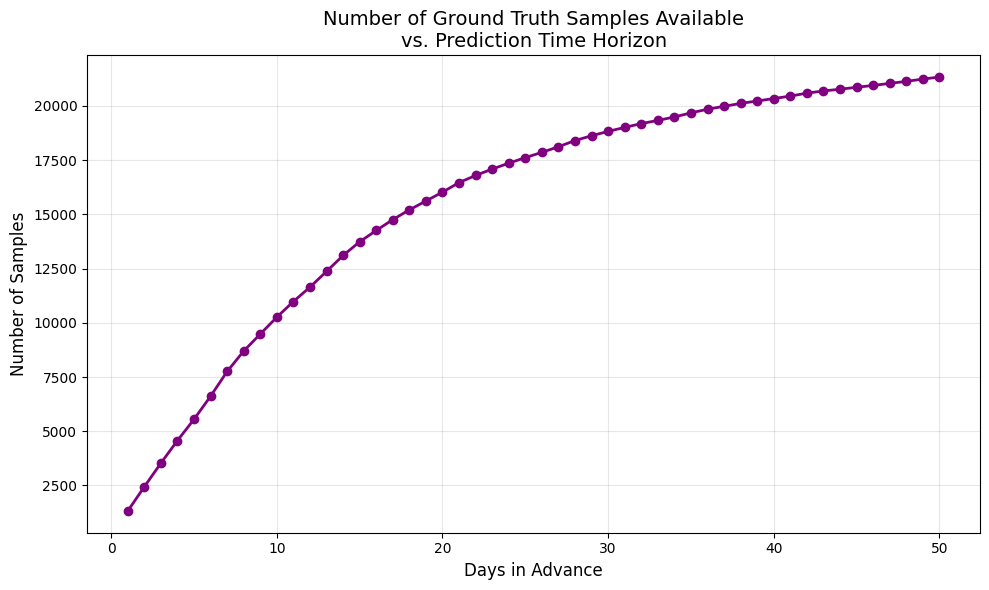

In [7]:


# Usage example
node_corr, initial_corr = compute_node_ground_truth_correlation(
    glv_model, test_df, index_of_taxa=2, max_days=50,convert_to_relative_abundances=True
)

# Plot comparison of correlations
days_list = sorted([d for d in node_corr.keys() 
                    if not np.isnan(node_corr[d]['correlation']) 
                    and not np.isnan(initial_corr[d]['correlation'])])
node_corr_values = [node_corr[d]['correlation'] for d in days_list]
initial_corr_values = [initial_corr[d]['correlation'] for d in days_list]
n_samples = [node_corr[d]['n_samples'] for d in days_list]

plt.figure(figsize=(12, 7))
plt.plot(days_list, node_corr_values, marker='o', linewidth=2, label='NODE Predictions', color='blue')
plt.plot(days_list, initial_corr_values, marker='s', linewidth=2, label='Initial Abundance (Baseline)', color='red')
plt.xlabel('Days in Advance', fontsize=12)
plt.ylabel('Correlation Coefficient', fontsize=12)
plt.title('Correlation between Predictions and Ground Truth\nNODE vs Initial Abundance Baseline', fontsize=14)
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.axhline(y=0, color='gray', linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

# Plot the difference (NODE improvement over baseline)
improvement = np.array(node_corr_values) - np.array(initial_corr_values)
plt.figure(figsize=(12, 7))
plt.plot(days_list, improvement, marker='o', linewidth=2, color='green')
plt.axhline(y=0, color='red', linestyle='--', linewidth=2, label='No improvement')
plt.xlabel('Days in Advance', fontsize=12)
plt.ylabel('Correlation Improvement (NODE - Initial)', fontsize=12)
plt.title('NODE Model Improvement Over Initial Abundance Baseline', fontsize=14)
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Plot sample sizes
plt.figure(figsize=(10, 6))
plt.plot(days_list, n_samples, marker='o', linewidth=2, color='purple')
plt.xlabel('Days in Advance', fontsize=12)
plt.ylabel('Number of Samples', fontsize=12)
plt.title('Number of Ground Truth Samples Available\nvs. Prediction Time Horizon', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


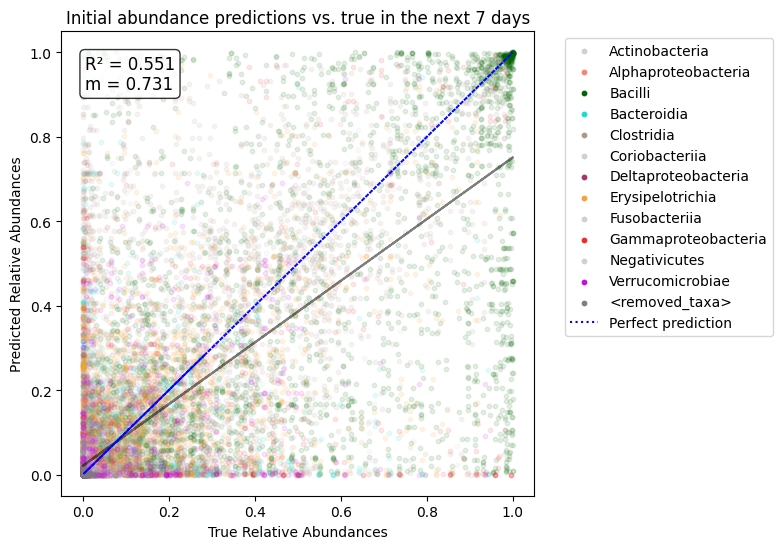

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


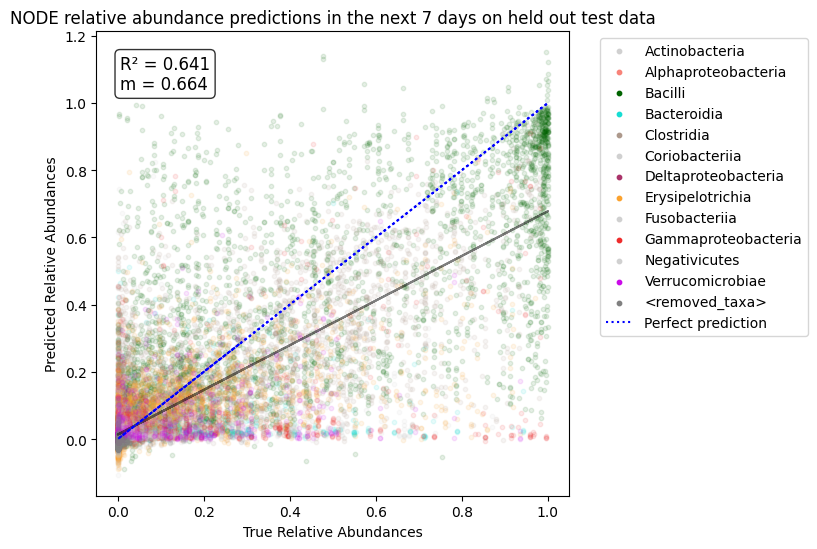

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


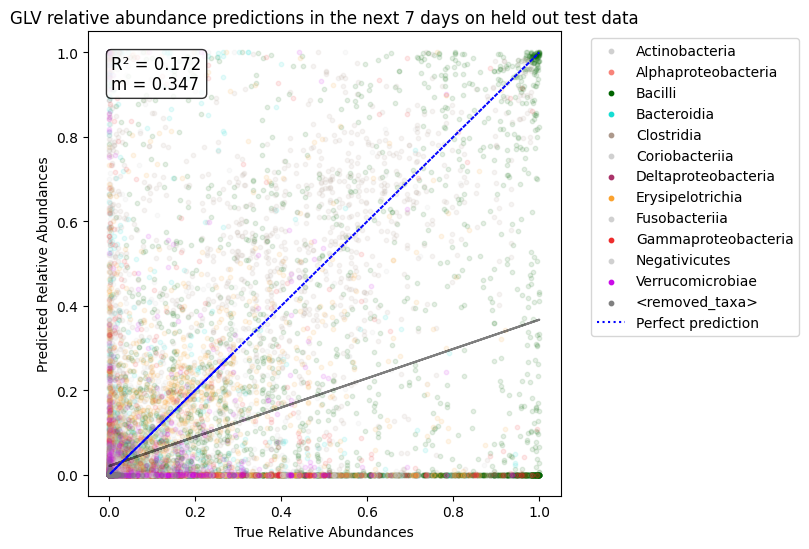

np.float64(0.17219372320653545)

In [4]:
from scipy import stats
def prediction_scatter(x, y, classes_array, colors, class_labels,
                      xlabel='True Relative Abundances', 
                      ylabel='Predicted Relative Abundances',
                      title='NODE relative abundance predictions in the next 7 days on held out test data',
                      plot=True):
    slope, intercept, rvalue, pvalue, stddev = stats.linregress(x, y)
    if plot:
        plt.figure(figsize=(8, 5.6))
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.title(title)
        for i, (color, label) in enumerate(zip(colors, class_labels)):
            mask = classes_array == i
            if mask.any():
                plt.scatter(x[mask], y[mask], color=color, s=10, alpha=0.1, label=label)
        plt.plot(x, slope*x+intercept, alpha=0.5, color='black')
        plt.plot(x, x, linestyle='dotted', color='blue', label='Perfect prediction')
        
        # Add R² and slope as text annotation
        plt.text(0.05, 0.95, f'R² = {round(rvalue**2, 3)}\nm = {round(slope, 3)}', 
                transform=plt.gca().transAxes, fontsize=12, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        legend = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        for lh in legend.legend_handles[:13]:
            lh.set_alpha(1)
        plt.tight_layout()
        plt.savefig(
            f"{title.replace(" ", "_")}.eps",
            format="eps",
            bbox_inches="tight",
            pad_inches=0.1   # adjust padding if you need more/less whitespace
        )
        plt.show()
    return rvalue**2

def compute_scatter_and_r2(model, test_df, prediction_size=7, plot=True):
    colors = ['#D0D0D0', '#F88379', '#006400', '#16DDD3', '#AD998C', '#D0D0D0', 
              '#AA336A', '#FBA22E', '#D0D0D0', '#EE2C2C', '#D0D0D0', '#CA0BE8', '#808080']
    class_labels = ["Actinobacteria", "Alphaproteobacteria", "Bacilli", "Bacteroidia", "Clostridia",
                   "Coriobacteriia", "Deltaproteobacteria", "Erysipelotrichia", "Fusobacteriia",
                   "Gammaproteobacteria", "Negativicutes", "Verrucomicrobiae", "<removed_taxa>"]
    
    test_sample_ids = list(test_df['SampleID'].unique())
    test_y_preds, test_y_true = MyModels.get_batch_prediction_data(model, test_df, batch_patient_ids=test_sample_ids, 
                                                                    sample_wise=True, simulation_size=prediction_size)
    predictions_np, trues_np = np.zeros(shape=(13, 0)), np.zeros(shape=(13, 0))
    for i in range(len(test_y_preds)):
        prediction_np = test_y_preds[i].cpu().detach().numpy().transpose()[:, 1:]
        true_np = test_y_true[i].cpu().detach().numpy().transpose()[:, 1:]
        predictions_np = np.append(predictions_np, prediction_np, axis=1)
        trues_np = np.append(trues_np, true_np, axis=1)
    
    classes_array = np.repeat(np.arange(13), predictions_np.shape[1])
    x, y = trues_np.flatten(), predictions_np.flatten()
    return prediction_scatter(x, y, classes_array, colors, class_labels, plot=plot)

def compute_scatter_and_r2_absolute_abundance_model(model, test_df, prediction_size=7, plot=True):
    colors = ['#D0D0D0', '#F88379', '#006400', '#16DDD3', '#AD998C', '#D0D0D0', 
              '#AA336A', '#FBA22E', '#D0D0D0', '#EE2C2C', '#D0D0D0', '#CA0BE8', '#808080']
    class_labels = ["Actinobacteria", "Alphaproteobacteria", "Bacilli", "Bacteroidia", "Clostridia",
                   "Coriobacteriia", "Deltaproteobacteria", "Erysipelotrichia", "Fusobacteriia",
                   "Gammaproteobacteria", "Negativicutes", "Verrucomicrobiae", "<removed_taxa>"]
    test_sample_ids = list(test_df['SampleID'].unique())
    test_y_preds, test_y_true = MyModels.get_batch_prediction_data(model, test_df, batch_patient_ids=test_sample_ids, 
                                                                    sample_wise=True, simulation_size=prediction_size)
    predictions_np, trues_np = np.zeros(shape=(13, 0)), np.zeros(shape=(13, 0))
    for i in range(len(test_y_preds)):
        prediction_np = test_y_preds[i].cpu().detach().numpy().transpose()[:, 1:]
        true_np = test_y_true[i].cpu().detach().numpy().transpose()[:, 1:]
        predictions_np = np.append(predictions_np, prediction_np, axis=1)
        trues_np = np.append(trues_np, true_np, axis=1)
    
    # Convert to relative abundances
    predictions_np[predictions_np < 0] = 0
    pred_sums = predictions_np.sum(axis=0, keepdims=True)
    pred_sums[pred_sums == 0] = 1  # Avoid division by zero
    predictions_np = predictions_np / pred_sums
    true_sums = trues_np.sum(axis=0, keepdims=True)
    true_sums[true_sums == 0] = 1  # Avoid division by zero
    trues_np = trues_np / true_sums
    
    # Remove columns with NaNs
    valid_cols = ~(np.isnan(predictions_np).any(axis=0) | np.isnan(trues_np).any(axis=0))
    predictions_np = predictions_np[:, valid_cols]
    trues_np = trues_np[:, valid_cols]
    
    classes_array = np.repeat(np.arange(13), predictions_np.shape[1])
    x, y = trues_np.flatten(), predictions_np.flatten()
    return prediction_scatter(x, y, classes_array, colors, class_labels, plot=plot, title = 'GLV relative abundance predictions in the next 7 days on held out test data')



def compute_baseline_scatter_and_r2(test_df, prediction_size=7, plot=True):
    colors = ['#D0D0D0', '#F88379', '#006400', '#16DDD3', '#AD998C', '#D0D0D0', 
              '#AA336A', '#FBA22E', '#D0D0D0', '#EE2C2C', '#D0D0D0', '#CA0BE8', '#808080']
    class_labels = ["Actinobacteria", "Alphaproteobacteria", "Bacilli", "Bacteroidia", "Clostridia",
                   "Coriobacteriia", "Deltaproteobacteria", "Erysipelotrichia", "Fusobacteriia",
                   "Gammaproteobacteria", "Negativicutes", "Verrucomicrobiae", "<removed_taxa>"]
    
    abundance_cols = [col for col in test_df.columns if col not in ['SampleID', 'PatientID', 'DayRelativeToNearestHCT']][:13]
    
    test_sample_ids = list(test_df['SampleID'].unique())
    predictions_np, trues_np = np.zeros(shape=(13, 0)), np.zeros(shape=(13, 0))
    
    for sample_id in test_sample_ids:
        patient_id = test_df[test_df['SampleID']==sample_id]['PatientID'].values[0]
        patient_data = test_df[test_df['PatientID']==patient_id].sort_values('DayRelativeToNearestHCT')
        sample_row = patient_data[patient_data['SampleID']==sample_id]
        
        initial_abundance = sample_row[abundance_cols].values[0]
        initial_day = sample_row['DayRelativeToNearestHCT'].values[0]
        
        # Get future observations within prediction_size days
        future_data = patient_data[(patient_data['DayRelativeToNearestHCT'] > initial_day) & 
                                   (patient_data['DayRelativeToNearestHCT'] <= initial_day + prediction_size)]
        if len(future_data) == 0:
            continue
            
        future_abundances = future_data[abundance_cols].values.T
        baseline_predictions = np.tile(initial_abundance.reshape(-1, 1), (1, future_abundances.shape[1]))
        
        predictions_np = np.append(predictions_np, baseline_predictions, axis=1)
        trues_np = np.append(trues_np, future_abundances, axis=1)
    
    classes_array = np.repeat(np.arange(13), predictions_np.shape[1])
    x, y = trues_np.flatten(), predictions_np.flatten()
    return prediction_scatter(x, y, classes_array, colors, class_labels, plot=plot, title = 'Initial abundance predictions vs. true in the next 7 days')

compute_baseline_scatter_and_r2(glv_test_df_relative_abundances, prediction_size = 7)
compute_scatter_and_r2(node_model, glv_test_df_relative_abundances, prediction_size = 7)
compute_scatter_and_r2_absolute_abundance_model(glv_model, glv_test_df,prediction_size = 7)

In [10]:
days = list(range(1,21, 2)) + list(range(21,100, 5))
constant_rsquares = []
node_rsquares = []
glv_rsquares = []
for day in days:
    r_squared_constant_model = compute_baseline_scatter_and_r2(glv_test_df_relative_abundances, prediction_size = day, plot = False)
    r_squared_node = compute_scatter_and_r2(node_model, glv_test_df_relative_abundances, prediction_size = day, plot = False)
    r_squared_glv = compute_scatter_and_r2_absolute_abundance_model(glv_model, glv_test_df,prediction_size = day, plot = False)
    constant_rsquares.append(r_squared_constant_model)
    node_rsquares.append(r_squared_node)
    glv_rsquares.append(r_squared_glv)
    print(day)

1
3
5
7


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


9


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


11


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


13


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


15


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


17


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


19


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


21


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


26


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


31


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


36


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


41


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


46


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


51


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


56


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


61


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


66


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


71


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


76


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


81


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


86


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


91
96


/tmp/ipykernel_2421969/3567321696.py:79: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


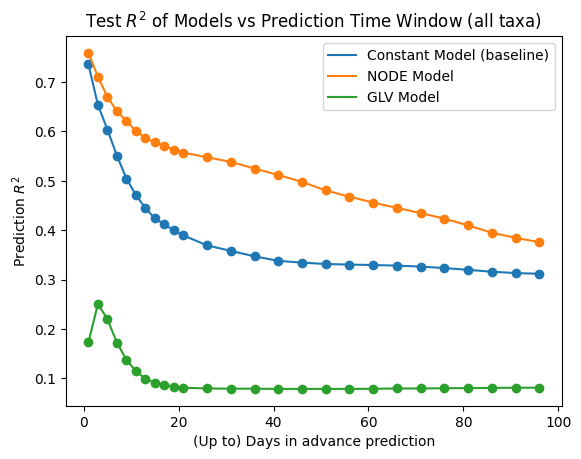

In [14]:

plt.plot(days, constant_rsquares, label = 'Constant Model (baseline)')
plt.plot(days, node_rsquares, label = 'NODE Model')
plt.plot(days, glv_rsquares, label = 'GLV Model')
plt.scatter(days, constant_rsquares)
plt.scatter(days, node_rsquares)
plt.scatter(days, glv_rsquares)
plt.title('Test $R^{2}$ of Models vs Prediction Time Window (all taxa)')
plt.xlabel('(Up to) Days in advance prediction')
plt.ylabel('Prediction $R^2$')
plt.legend()
plt.savefig(
    "test_R_squared_vs_days_in_advance_prediction.eps",
    format="eps",
    bbox_inches="tight",
    pad_inches=0.1   # adjust padding if you need more/less whitespace
)

In [23]:
days = list(range(1,10)) + list(range(11,20, 2)) + list(range(21,100, 5))
constant_rsquares_absolute_abundance_data = []
node_rsquares_absolute_abundance_data = []
glv_rsquares_absolute_abundance_data = []
for day in days:
    r_squared_constant_model = compute_baseline_scatter_and_r2(test_df[test_df['SampleID'].isin(glv_test_df_relative_abundances['SampleID'].unique())], prediction_size = day, plot = False)
    r_squared_node = compute_scatter_and_r2(node_model, test_df[test_df['SampleID'].isin(glv_test_df_relative_abundances['SampleID'].unique())], prediction_size = day, plot = False)
    r_squared_glv = compute_scatter_and_r2_absolute_abundance_model(glv_model, glv_test_df,prediction_size = day, plot = False)
    print(r_squared_constant_model, r_squared_node)
    constant_rsquares_absolute_abundance_data.append(r_squared_constant_model)
    node_rsquares_absolute_abundance_data.append(r_squared_node)
    glv_rsquares_absolute_abundance_data.append(r_squared_glv)
    print(day)

0.7358249608215978 0.7588473776264072
1
0.6887322999326037 0.7283170000830828
2
0.653643155231859 0.710387966284657
3
0.6221541351698898 0.6860477863067181
4
0.6035528236461027 0.6699085636238793
5
0.5796497624501248 0.6572837382932999
6
0.550932163172528 0.6407408611623088
7
0.524520696566051 0.6303927063787783
8
0.5045006161317463 0.6211957400016426
9
0.4710658159282359 0.6007460965198648
11
0.4446776531503904 0.5866315635349437
13
0.42359775210231837 0.5776991176443766
15
0.41183449969809194 0.5704873986658278
17
0.39960426672159666 0.5632371878050754
19
0.3893950753248611 0.5569915426270073
21


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.3691055117202069 0.5475842689710545
26


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.3580547570984112 0.5382153614139243
31


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.34697726453813466 0.5247916855335634
36


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.3378534416807178 0.5117096130035371
41


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.3342711322007512 0.49776564750577545
46


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.33139926622250115 0.4804274007056013
51


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.3302811665042842 0.46767653649573354
56


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.3293660167961949 0.4559148695040039
61


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.32816138691183266 0.4449365409047863
66


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.32615903536615015 0.43448570266694364
71


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.3232974897210202 0.42333694081435813
76


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.31965721252215773 0.40964401113263316
81


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.3157377628744051 0.39476346465513695
86


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


0.31317115884884117 0.384349016988029
91
0.31157241826062454 0.3757214199177293
96


/tmp/ipykernel_212115/2409479527.py:66: RuntimeWarning: invalid value encountered in divide
  predictions_np = predictions_np / pred_sums


Text(0, 0.5, 'Test Prediction $R^2$')

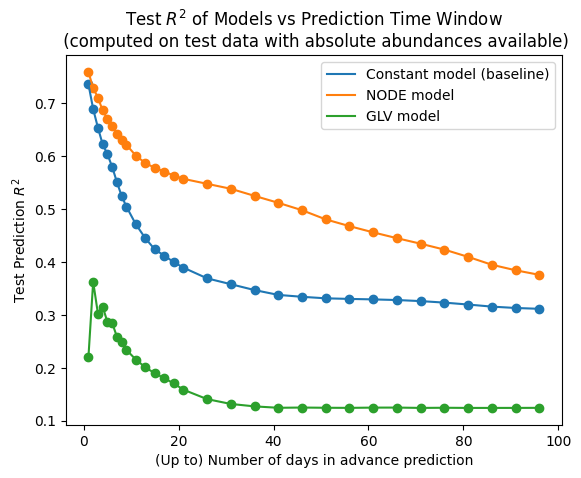

In [33]:
plt.plot(days, constant_rsquares_absolute_abundance_data, label = 'Constant model (baseline)')
plt.plot(days, node_rsquares_absolute_abundance_data, label = 'NODE model')
plt.plot(days, glv_rsquares_absolute_abundance_data, label = 'GLV model')
plt.scatter(days, constant_rsquares_absolute_abundance_data)
plt.scatter(days, node_rsquares_absolute_abundance_data)
plt.scatter(days, glv_rsquares_absolute_abundance_data)
plt.legend()
plt.title('Test $R^{2}$ of Models vs Prediction Time Window \n (computed on test data with absolute abundances available)')
plt.xlabel('(Up to) Number of days in advance prediction')
plt.ylabel('Test Prediction $R^2$')

## Something I'm thinking about:
When computing the AUC, infections are counted multiple times, because they can have multiple samples taken before them. 